In [16]:
%%HTML
<style> code {background-color : pink !important;} </style>

Camera Calibration with OpenCV
===

### Run the code in the cell below to extract object points and image points for camera calibration.  

In [17]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# %matplotlib qt

rows=6
cols=9

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((rows*cols,3), np.float32)
objp[:,:2] = np.mgrid[0:cols, 0:rows].T.reshape(-1,2)


In [18]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (cols,rows), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (cols,rows), corners, ret)
        write_name = 'camera_cal/corners_found'+str(idx)+'.jpg'
        cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
#         cv2.waitKey(500)

cv2.destroyAllWindows()


### Undistort a calibration image and store output

Text(0.5, 1.0, 'Undistorted Image')

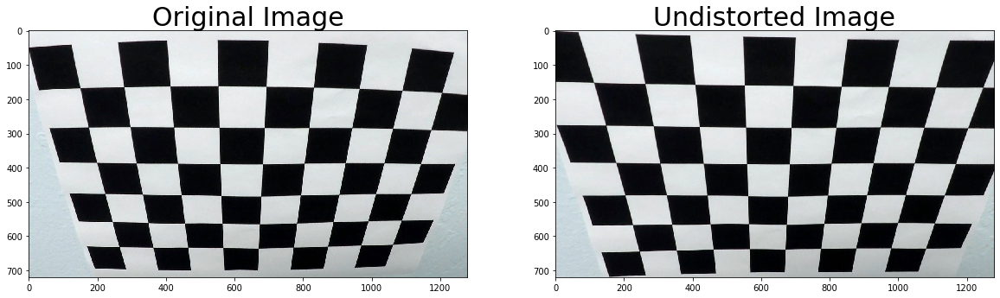

In [19]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist_calibration2.jpg',dst)

# Visualize undistorted Images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Calculate Perspective Transformation matrix

In [20]:
# Using the first image to calculate perspective transform
# src = np.float32([[240,702],[1044,702],[703,461],[582,461]])
# dst = np.float32([[240,702],[1044,702],[1044,461],[240,461]])


img = mpimg.imread('test_images/straight_lines1.jpg')

#Get image data
max_y = img.shape[0]
max_x = img.shape[1]

img_size = (max_x, max_y)

#Create source image points
src = np.float32([[max_x*0.46, max_y*0.625], #top left # 0.465
                 [max_x*0.1, max_y],      #bottom left # 0.156
                 [max_x*0.9, max_y],     #bottom right
                 [max_x*0.54, max_y*0.625]]) #top right # 0.539

#Create destination image points
dst = np.float32([[max_x*0.234,0],
                 [max_x*0.234, max_y],
                 [max_x*0.742, max_y],
                 [max_x*0.742, 0]])
src = np.float32(
    [[(img_size[0] / 2) - 68, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 60), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 68), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
M = cv2.getPerspectiveTransform(src,dst)
Minv = cv2.getPerspectiveTransform(dst, src)

## Class to keep track of lanes

In [21]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        self.prev_radius_of_curvature = None
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        # No of frames skipped without detections
        self.frame_skipped = 5
        # Max skipped frame allowed
        self._max_frame_skip = 5
        # Y Coordinates
        self.ploty = []
        
    def reinitialize_required(self):
        if self.frame_skipped<self._max_frame_skip:
            return False
        else:
            return True
        
    def skip_frame(self):
        self.current_fit = self.best_fit
        self.recent_xfitted = self.bestx
        self.frame_skipped = self.frame_skipped + 1
        self.detected = False
        
    def accept_fit(self):
        self.best_fit = self.current_fit
        self.bestx = self.recent_xfitted
        self.detected = True
        self.frame_skipped = 0
        
    def set_rad_of_cur(self,radius):
        self.prev_radius_of_curvature = self.radius_of_curvature
        self.radius_of_curvature = radius

## Lane Detection Helper Functions

In [22]:
def undistortStep(image, mtx, dist, debug=False):
    undist_image = cv2.undistort(image, mtx, dist, None, mtx)
    if debug:
        print("Undistort step output:")
        plt.figure()
        plt.imshow(undist_image)
        plt.show()
    return undist_image

In [23]:

def region_of_interest(img, vertices, invert = False):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    if invert:
        mask = cv2.bitwise_not(mask)
        
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def regionSelStep(image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, invert = False, debug = False):
    # Region Selecting From Each Image
    region_select = np.copy(image)
    ysize = image.shape[0]
    xsize = image.shape[1]

    # Vertices of a quadrilateral
    left_bottom = np.array([xsize*bottomLeftXOffset, ysize])
    right_bottom = np.array([xsize*bottomRightXOffset,ysize])
    left_top = np.array([xsize*topLeftXOffset, ysize*horizon])
    right_top = np.array([xsize*topRightXOffset, ysize*horizon])
    vertices = np.array( [[left_top,left_bottom,right_bottom,right_top]], dtype=np.int32 )
    if debug:
        ## plot final masked images
        print("Region select pipe output:")
        plt.figure()
        
    regionImage = region_of_interest(image, vertices, invert)
    
    if debug:
        plt.imshow(regionImage, cmap='gray')
        plt.show()
    return(regionImage)

In [24]:
def perspectiveStep(image, M, debug=False):
    warped_color = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)

    
    if debug:
        print("Perspective Transformation output:")
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(warped_color, cmap='gray')
        ax2.set_title('Pipeline Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
    return(warped_color)

In [25]:
def sobelThresh(img_channel, chan_val_thresh, sx_thresh):
    """
    Calculates gradient of image to be used to detect edges.
    """
    #Apply x gradient to emphasize verticle lines
    sobelx = np.absolute(cv2.Sobel(img_channel, cv2.CV_64F, 1, 0))
    #Resize to an 8-bit integer
    scaled_sobel = np.uint8(255*sobelx/np.max(sobelx))
    
    #Create binary image based on X-Gradient
    sobel = np.zeros_like(scaled_sobel)
    sobel[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    #Create binary image based on Sobel only
    chanThresh = np.zeros_like(img_channel)
    chanThresh[(img_channel >= chan_val_thresh[0]) & (img_channel <= chan_val_thresh[1])] = 1
    
    #Combine x-gradient and sobel binary image
    combined = np.zeros_like(chanThresh)
    combined[(chanThresh == 1) | (sobel == 1)] = 1
    
    return combined


def getThrImg(img, debug = False):
    """
    Uses various color transforms to detect the lane pixels
    """
    
    #RGB color space
    B_channel = img[:,:,2]
    B_channel = sobelThresh(B_channel, (200,255), (50,100))
    
    if debug:
        print("Blue Activation output:")
        plt.figure()
        plt.imshow(B_channel, cmap = 'gray')
        plt.show()
    
    #HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    H_channel = hls[:,:,0]
    H_channel = sobelThresh(H_channel, (15,30), (20,100))
    HS_channel = hls[:,:,2]
    HS_channel = sobelThresh(HS_channel, (90,255), (20,100))
    HL_channel = hls[:,:,1]
    HL_channel = sobelThresh(HL_channel, (10,255), (20,100))
    
    S_channel = hls[:,:,2]
    S_channel = sobelThresh(S_channel, (90,255), (20,100))
    
    L_channel = hls[:,:,1]
    L_channel = sobelThresh(L_channel, (110,255), (20,100))
    
    
    if debug:
        print("Saturation Activation output:")
        plt.figure()
        plt.imshow(((S_channel == 1)&(L_channel == 1)), cmap = 'gray')
        plt.show()
    if debug:
        print("Hue Activation output:")
        plt.figure()
        plt.imshow(H_channel & (HS_channel == 1) & (HL_channel == 1), cmap = 'gray')
        plt.show()
    
    #HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    v_channel = hls[:,:,2]
    v_channel = sobelThresh(v_channel, (255,254), (100,99))
    
    if debug:
        print("Value Activation output:")
        plt.figure()
        plt.imshow(v_channel, cmap = 'gray')
        plt.show()
       
    #Combine the best channels from each color space
    thresh = np.zeros_like(S_channel)
    thresh[((S_channel == 1)&(L_channel == 1)) | (B_channel == 1) | (v_channel == 1)] = 1
    
    return thresh

# Edit this function to create your own pipeline.
def binaryActivationStep(img, debug = False):
    img = np.copy(img)
    kernel_size =7
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
       
    colorSelectImage = getThrImg(img, debug = debug)  
    if debug:
        print("Binary Activation output:")
        plt.figure()
        plt.imshow(colorSelectImage, cmap = 'gray')
        plt.show()
    
    return colorSelectImage



In [26]:
for file in glob.glob('test_images/*Shadow.jpg'):
    image = mpimg.imread(file)
    print("Test Image Original:")
    plt.figure()
    # Display the test images
    plt.imshow(image)
    plt.show()
    
    #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = False)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, debug = True)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = True)

In [27]:
def warpStep(image, M,  debug=False):
    result = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    if debug:
        print("Warp Image output:")
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        ax1.imshow(image, cmap='gray')
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(result, cmap='gray')
        ax2.set_title('Warped Binary Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
    return result

In [28]:


def find_lane_pixels(binary_warped, left_lane_line, right_lane_line):
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 20
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 400

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    weighted_image = np.transpose(np.multiply(np.transpose(binary_warped),np.arange(binary_warped.shape[0])))

    # Take a histogram of the bottom half of the image
    histogram = np.sum(weighted_image[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    left_lane_line.allx = nonzerox[left_lane_inds]
    left_lane_line.ally = nonzeroy[left_lane_inds] 
    right_lane_line.allx= nonzerox[right_lane_inds]
    right_lane_line.ally = nonzeroy[right_lane_inds]

    return out_img


def reinitialize_fit(binary_warped, left_lane_line, right_lane_line, debug = False):
    # Find our lane pixels first
    out_img = find_lane_pixels(binary_warped, left_lane_line, right_lane_line)

    # Fit a second order polynomial to each using `np.polyfit`
    if (left_lane_line.allx.size >3) and (right_lane_line.allx.size>3) and\
        (left_lane_line.ally.size >3) and (right_lane_line.ally.size>3):
        left_lane_line.current_fit = np.polyfit(left_lane_line.ally, left_lane_line.allx, 2, w=left_lane_line.ally)
        right_lane_line.current_fit = np.polyfit(right_lane_line.ally, right_lane_line.allx, 2, w=right_lane_line.ally)
    else:
        left_lane_line.current_fit = [0, 0, 0]
        right_lane_line.current_fit = [0, 0, 0]
    
    # Erase previous best fits
    left_lane_line.best_fit = left_lane_line.current_fit
    right_lane_line.best_fit = right_lane_line.current_fit
    
    if debug:
        print("Fit Polynomial output:")
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        try:
            left_fitx = left_lane_line.current_fit[0]*ploty**2 +\
            left_lane_line.current_fit[1]*ploty + left_lane_line.current_fit[2]
            right_fitx = right_lane_line.current_fit[0]*ploty**2 +\
            right_lane_line.current_fit[1]*ploty + right_lane_line.current_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
    
        left_lane_line.recent_xfitted = left_fitx
        left_lane_line.recent_ploty = ploty
        right_lane_line.recent_xfitted = right_fitx
        right_lane_line.recent_ploty = ploty
        
        ## Visualization ##
        # Colors in the left and right lane regions
        out_img[left_lane_line.ally, left_lane_line.allx] = [255, 0, 0]
        out_img[right_lane_line.ally, right_lane_line.allx] = [0, 0, 255]
        plt.figure()
        plt.imshow(out_img)
        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.show()
    

In [29]:
def fit_poly(img_shape, left_lane_line, right_lane_line): #leftx,lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    if (left_lane_line.allx.size >3) and (right_lane_line.allx.size>3) and\
        (left_lane_line.ally.size >3) and (right_lane_line.ally.size>3):
        left_lane_line.current_fit = np.polyfit(left_lane_line.ally, left_lane_line.allx, 2, w=left_lane_line.ally)
        right_lane_line.current_fit = np.polyfit(right_lane_line.ally, right_lane_line.allx, 2, w=right_lane_line.ally)
    else:
        left_lane_line.current_fit = [0, 0, 0]
        right_lane_line.current_fit = [0, 0, 0]
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_lane_line.current_fit[0]*ploty**2 +\
    left_lane_line.current_fit[1]*ploty + left_lane_line.current_fit[2]
    right_fitx = right_lane_line.current_fit[0]*ploty**2 +\
    right_lane_line.current_fit[1]*ploty + right_lane_line.current_fit[2]
    
    left_lane_line.recent_xfitted = left_fitx
    left_lane_line.recent_ploty = ploty
    right_lane_line.recent_xfitted = right_fitx
    right_lane_line.recent_ploty = ploty
    
    return

def search_around_poly(binary_warped, left_lane_line, right_lane_line, debug = False):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #Grab the best fit over last n iterations and check for a new lane within the margin
    left_fit = left_lane_line.best_fit
    right_fit = right_lane_line.best_fit
    ### St the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    left_lane_line.allx = nonzerox[left_lane_inds]
    left_lane_line.ally = nonzeroy[left_lane_inds] 
    right_lane_line.allx = nonzerox[right_lane_inds]
    right_lane_line.ally = nonzeroy[right_lane_inds]

    # Fit new polynomials
    fit_poly(binary_warped.shape, left_lane_line, right_lane_line)
    
    ## Visualization ##
       
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    if debug:
        print("Search Lane With Prior Poly output:")
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted-margin, left_lane_line.recent_ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_lane_line.recent_xfitted+margin, 
                                  left_lane_line.recent_ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_lane_line.recent_xfitted-margin, left_lane_line.recent_ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted+margin, 
                                  right_lane_line.recent_ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
        
        plt.figure()
        plt.imshow(result)
        # Plot the polynomial lines onto the image
        plt.plot(left_lane_line.recent_xfitted, left_lane_line.recent_ploty, color='yellow')
        plt.plot(right_lane_line.recent_xfitted, right_lane_line.recent_ploty, color='yellow')
        plt.show()
        ## End visualization steps ##
    
    return out_img


In [30]:
def measure_curvature_pixels( ploty, left_lane_line, right_lane_line, image_shape, debug = False):
    '''
    Calculates the curvature of polynomial functions in pixels and meters.
    '''
    # Define conversions in x and y from pixels space to meters
    my = 30/720 # meters per pixel in y dimension
    mx = 3.7/650 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)*my
    
    # Calculation of R_curve (radius of curvature)
    lradius = ((1 + (2*left_lane_line.current_fit[0]*y_eval*(mx/(my**2)) + \
                        left_lane_line.current_fit[1]*(mx/my))**2)**1.5) / np.absolute(2*left_lane_line.current_fit[0]*(mx/(my**2)))
    rradius = ((1 + (2*right_lane_line.current_fit[0]*y_eval*(mx/(my**2)) + \
                         right_lane_line.current_fit[1]*(mx/my))**2)**1.5) / np.absolute(2*right_lane_line.current_fit[0]*(mx/(my**2)))
    if lradius<50000:
        left_lane_line.set_rad_of_cur(lradius)
    else:
        left_lane_line.set_rad_of_cur(50000)
    if rradius<50000: 
        right_lane_line.set_rad_of_cur(rradius)
    else:
        right_lane_line.set_rad_of_cur(50000)

    #if both lines fitted, calculate distance from lane center
#     if right_curve.radius_of_curvature is not None and left_lane_line.radius_of_curvature is not None:
    #True center of image - represents where the car is
    img_center = image_shape[0] * mx
    #Real world integer value of the lines location
    Lfit_int = left_lane_line.current_fit[0]*(y_eval**2)*(mx/(my**2)) + \
        left_lane_line.current_fit[1]*y_eval*(mx/my) + left_lane_line.current_fit[2]*mx
    Rfit_int = right_lane_line.current_fit[0]*(y_eval**2)*(mx/(my**2)) + \
        right_lane_line.current_fit[1]*y_eval*(mx/my) + right_lane_line.current_fit[2]*mx
    
    #Shows where the line center is in the image
    car_position = (Rfit_int + Lfit_int) / 2
    #Determine distance from the center of the frame to the center of the lane
    center_dist = (img_center - car_position)
    
    left_lane_line.line_base_pos = (Lfit_int-img_center)
    right_lane_line.line_base_pos = (Rfit_int-img_center)
    
    if debug:
        print('center: ',center_dist, 'm')
        print(left_lane_line.radius_of_curvature, 'm', right_lane_line.radius_of_curvature, 'm')
        
    return center_dist

In [31]:
def checkFit(left_lane_line, right_lane_line):
    """
    Checks if frames can be skipped by taking last few iterations into account
    """
    if (left_lane_line.radius_of_curvature is None) or (right_lane_line.radius_of_curvature is None) or \
        (left_lane_line.prev_radius_of_curvature is None) or (right_lane_line.prev_radius_of_curvature is None):
        return("Initial iteration: Radius of curvature is none")
    elif ((np.abs(left_lane_line.radius_of_curvature)<2000 or np.abs(right_lane_line.radius_of_curvature)<2000)\
          and(np.abs(left_lane_line.radius_of_curvature - right_lane_line.radius_of_curvature)>5000) or \
        (np.abs(left_lane_line.prev_radius_of_curvature - left_lane_line.radius_of_curvature)>500) or \
        (np.abs(right_lane_line.prev_radius_of_curvature - right_lane_line.radius_of_curvature)>500)):
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
        return("Skipping: Radius of curvature variation high")
    elif (left_lane_line.line_base_pos>-0.8) or (left_lane_line.line_base_pos<-3):
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
        return("Skipping: LL base position problem")
    elif (right_lane_line.line_base_pos<0.8) or (right_lane_line.line_base_pos>3): # Checking line base positon here
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
        return("Skipping: RL base position problem")
    else:
        left_lane_line.accept_fit()
        right_lane_line.accept_fit()
        return("Fit Accepted")

### Process Images

Test Image Original:


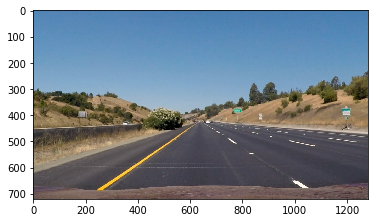

Undistort step output:


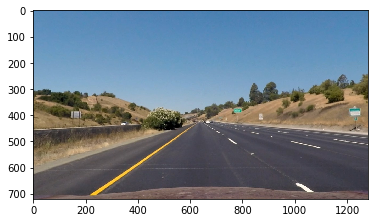

Blue Activation output:


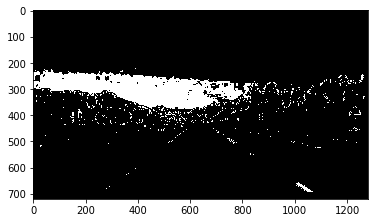

Saturation Activation output:


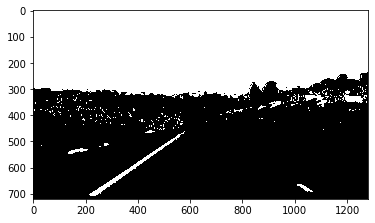

Hue Activation output:


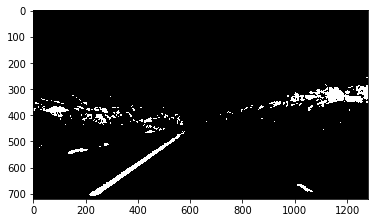

Value Activation output:


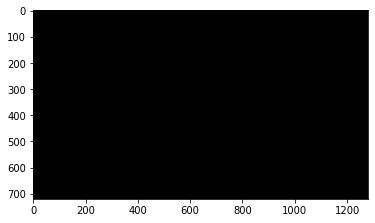

Binary Activation output:


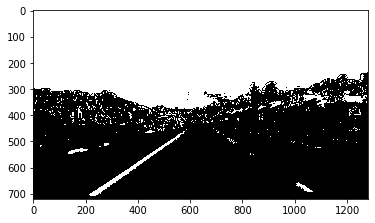

Region select pipe output:


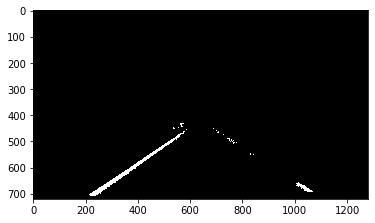

Region select pipe output:


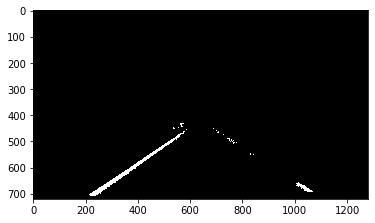

Warp Image output:


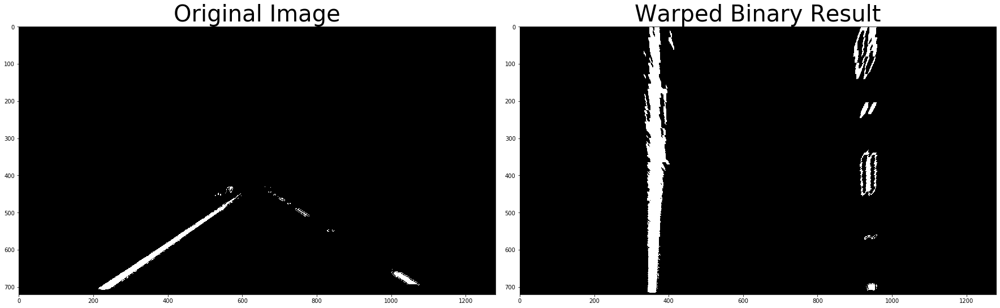

Fit Polynomial output:


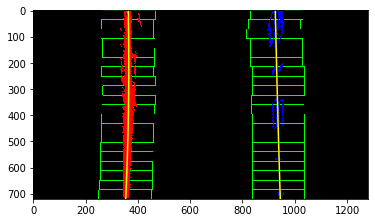

Search Lane With Prior Poly output:


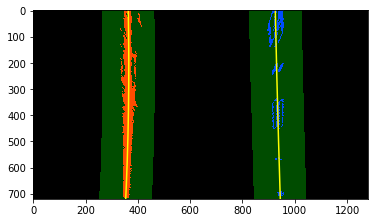

center:  0.40339822391640645 m
3302.887181084891 m 22037.72529057204 m


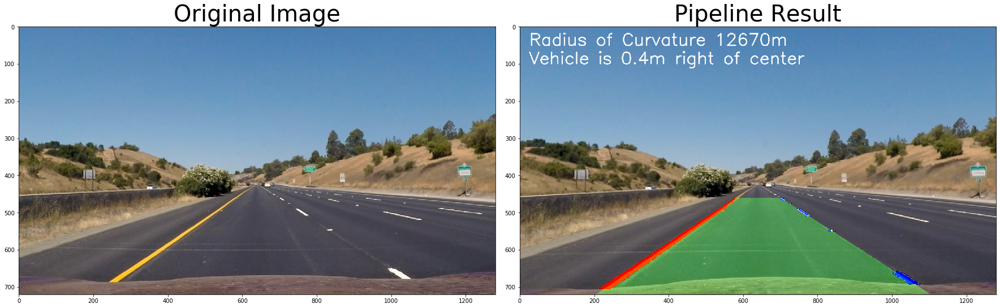

Test Image Original:


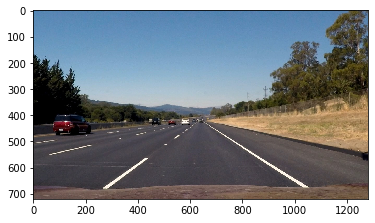

Undistort step output:


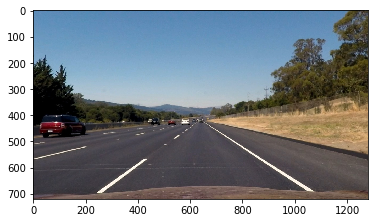

Blue Activation output:


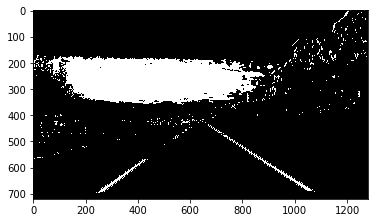

Saturation Activation output:


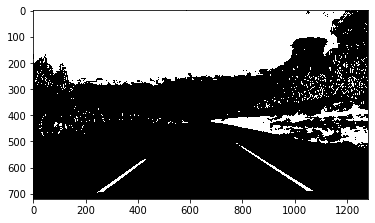

Hue Activation output:


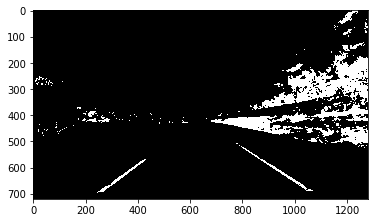

Value Activation output:


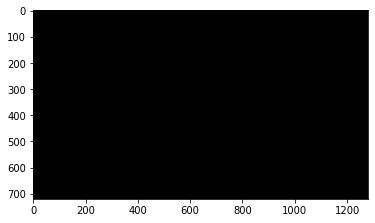

Binary Activation output:


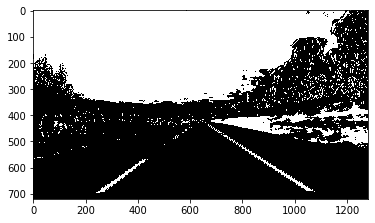

Region select pipe output:


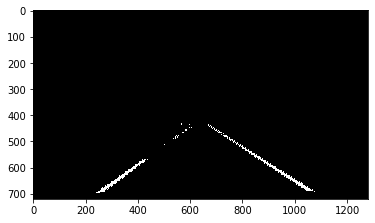

Region select pipe output:


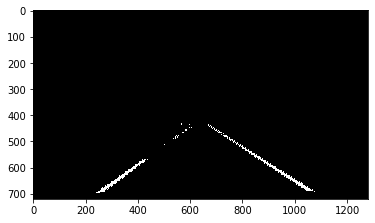

Warp Image output:


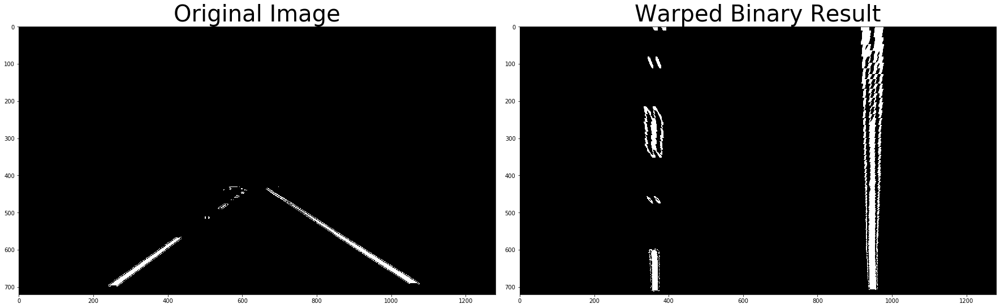

Fit Polynomial output:


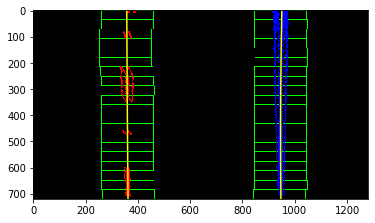

Search Lane With Prior Poly output:


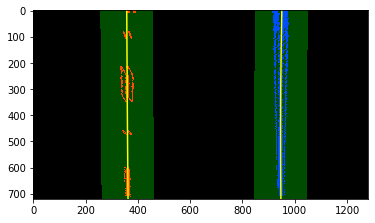

center:  0.37158600677394293 m
50000 m 7263.423279667782 m


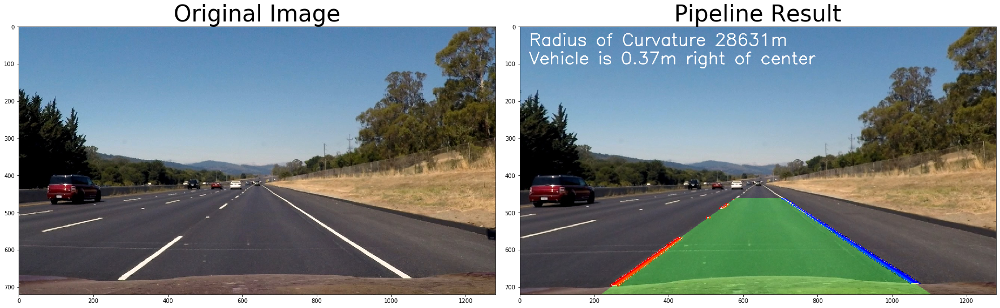

Test Image Original:


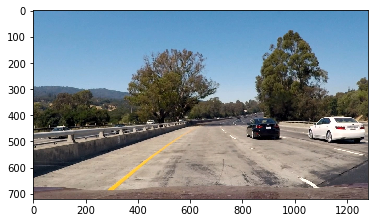

Undistort step output:


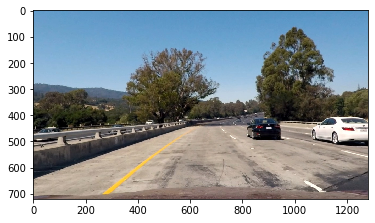

Blue Activation output:


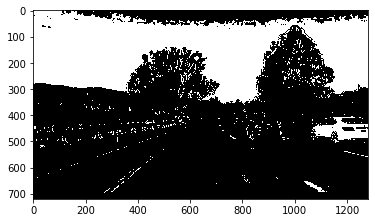

Saturation Activation output:


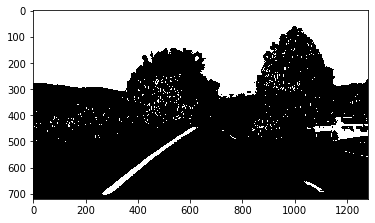

Hue Activation output:


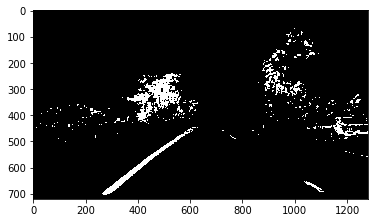

Value Activation output:


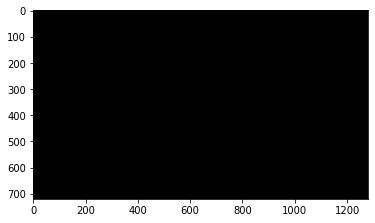

Binary Activation output:


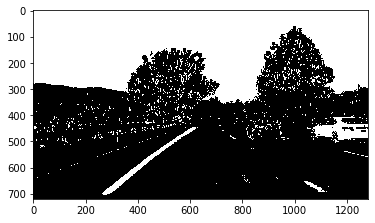

Region select pipe output:


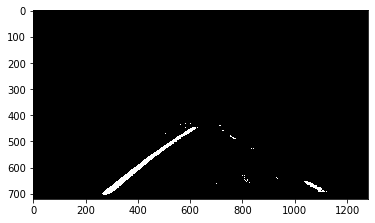

Region select pipe output:


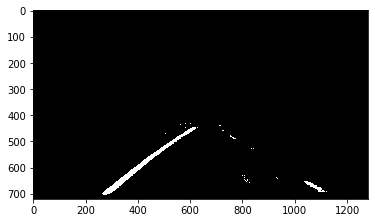

Warp Image output:


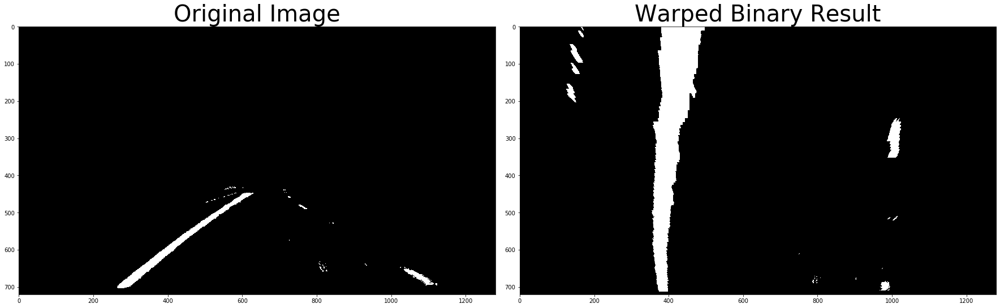

Fit Polynomial output:


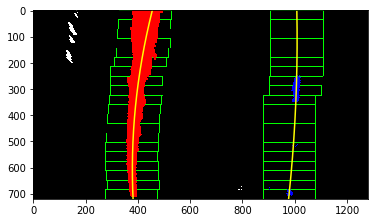

Search Lane With Prior Poly output:


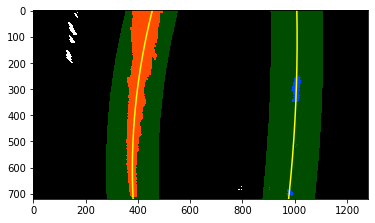

center:  0.23253408062979508 m
737.9392805294623 m 1736.091374261844 m


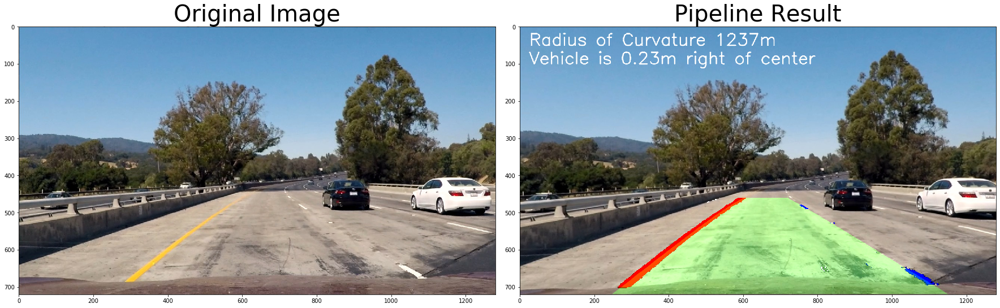

Test Image Original:


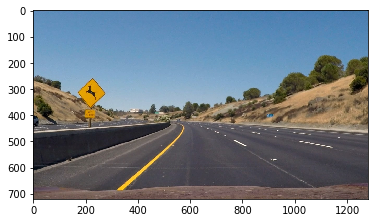

Undistort step output:


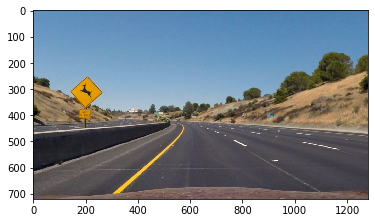

Blue Activation output:


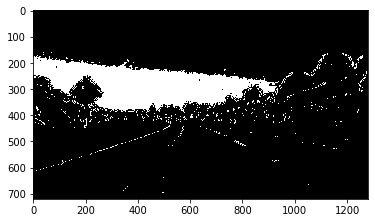

Saturation Activation output:


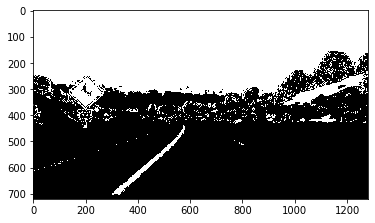

Hue Activation output:


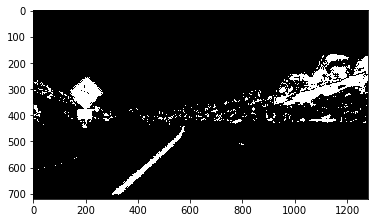

Value Activation output:


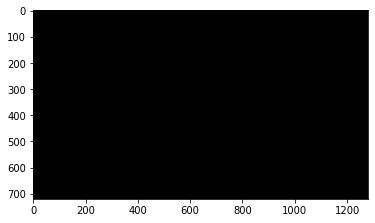

Binary Activation output:


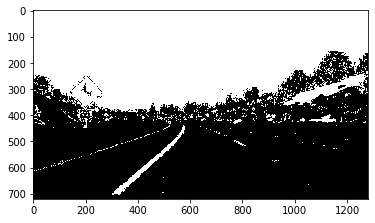

Region select pipe output:


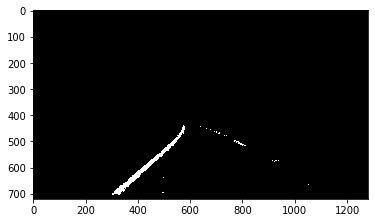

Region select pipe output:


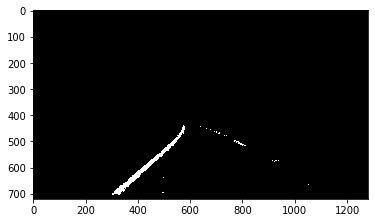

Warp Image output:


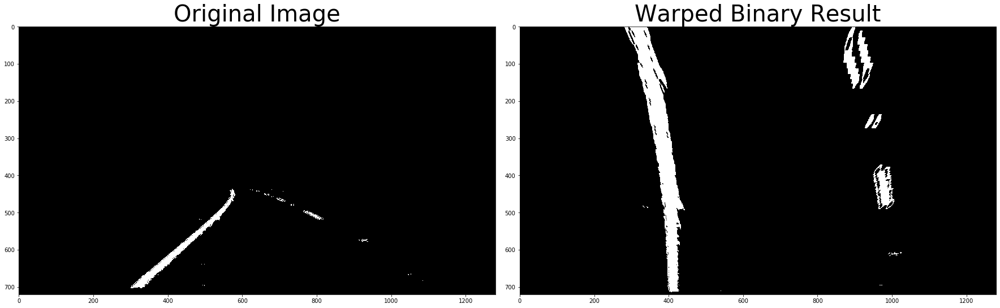

Fit Polynomial output:


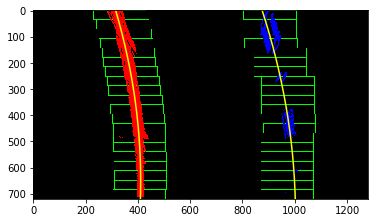

Search Lane With Prior Poly output:


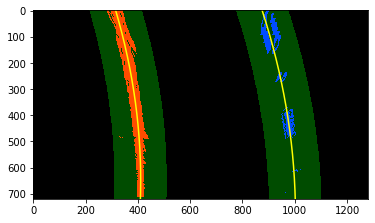

center:  0.08087112384363415 m
672.6475266265807 m 735.4113445204737 m


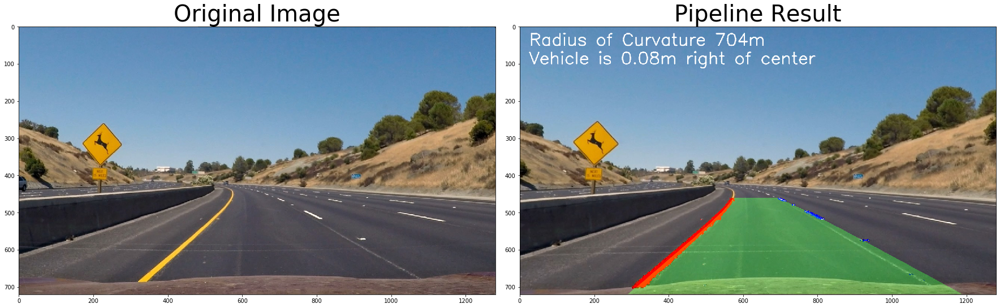

Test Image Original:


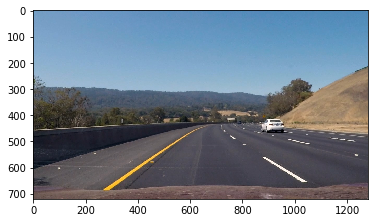

Undistort step output:


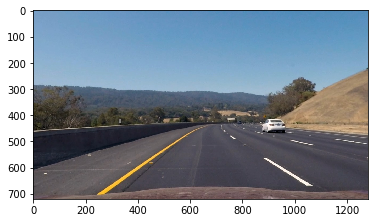

Blue Activation output:


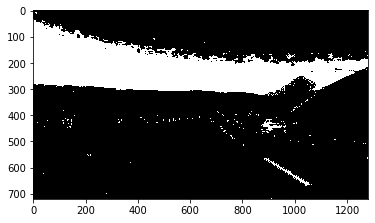

Saturation Activation output:


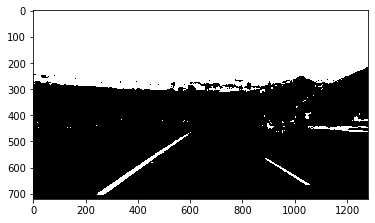

Hue Activation output:


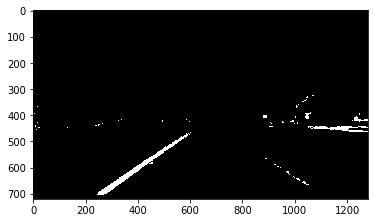

Value Activation output:


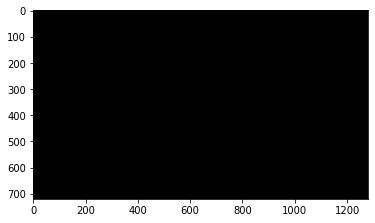

Binary Activation output:


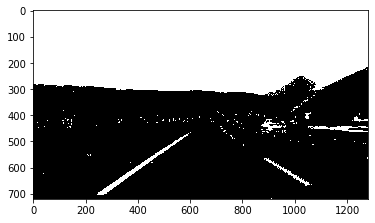

Region select pipe output:


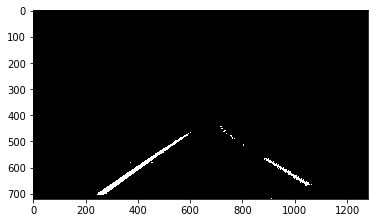

Region select pipe output:


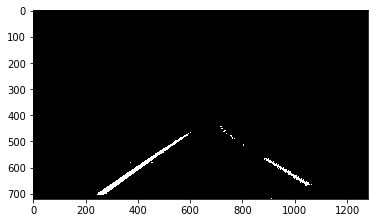

Warp Image output:


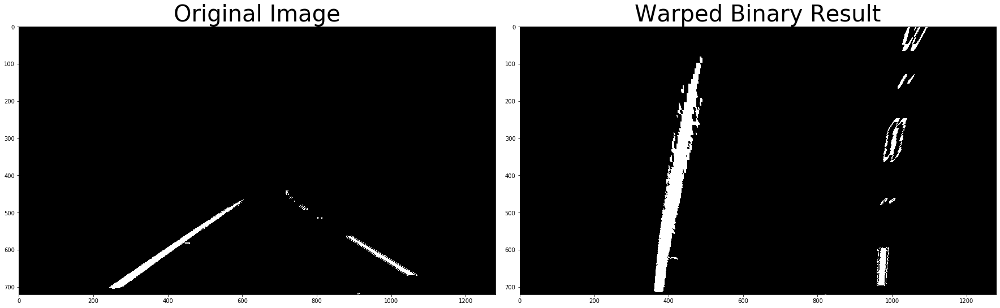

Fit Polynomial output:


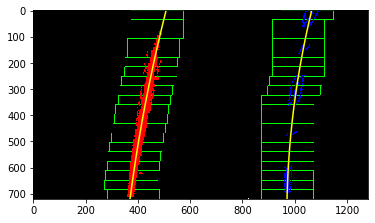

Search Lane With Prior Poly output:


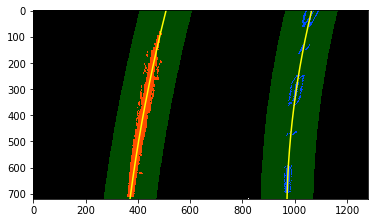

center:  0.282116007408276 m
1780.139550325717 m 1001.7596384946576 m


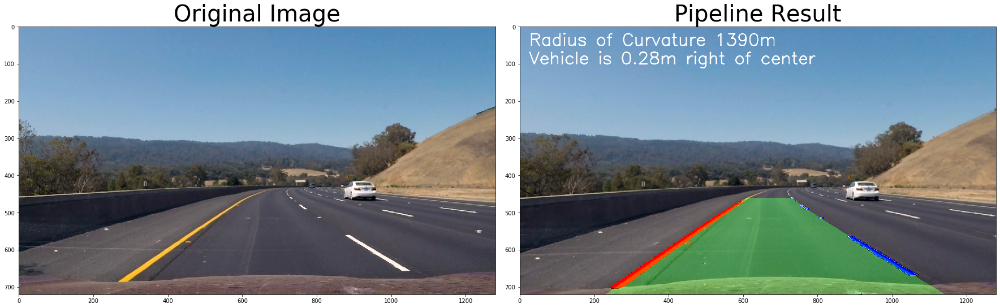

Test Image Original:


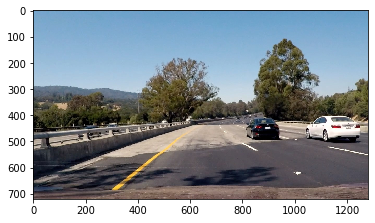

Undistort step output:


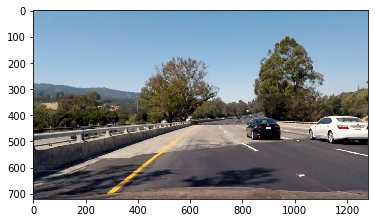

Blue Activation output:


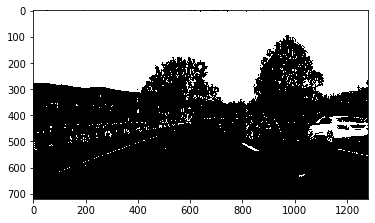

Saturation Activation output:


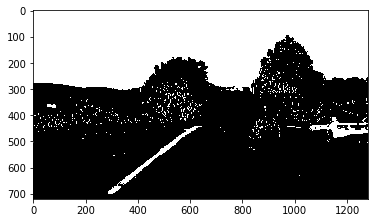

Hue Activation output:


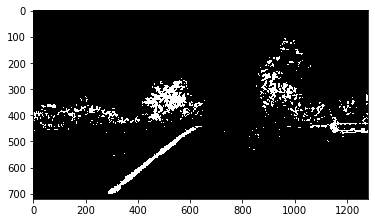

Value Activation output:


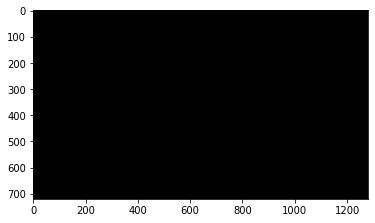

Binary Activation output:


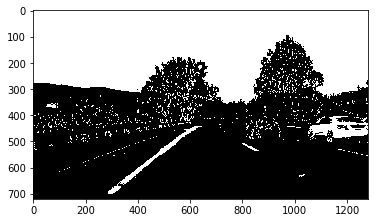

Region select pipe output:


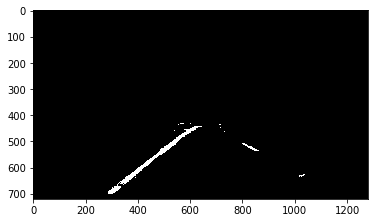

Region select pipe output:


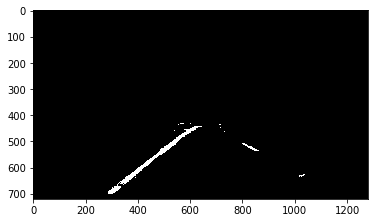

Warp Image output:


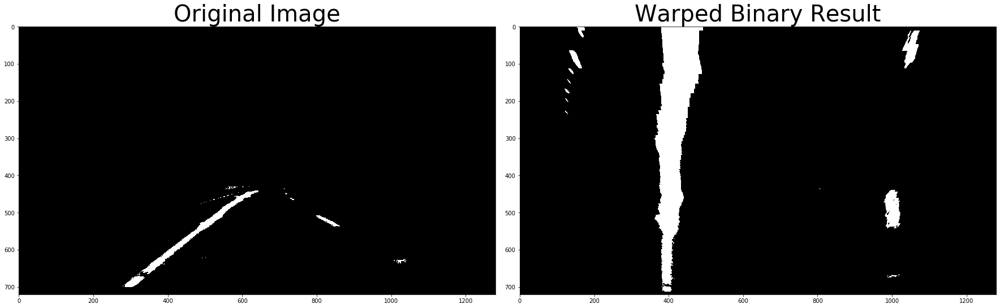

Fit Polynomial output:


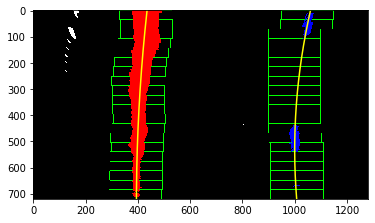

Search Lane With Prior Poly output:


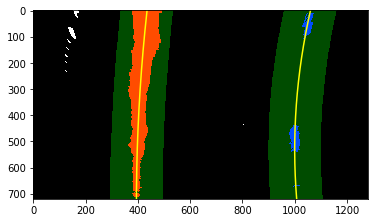

center:  0.10845410657800292 m
2039.1633255595837 m 715.1521193667411 m


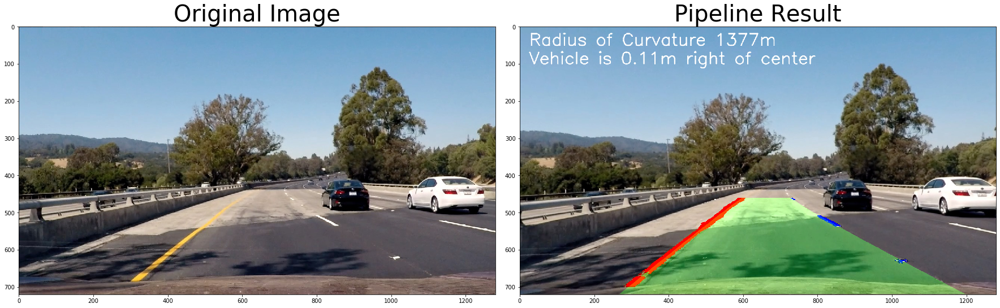

Test Image Original:


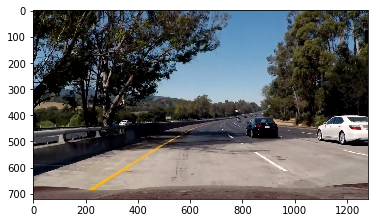

Undistort step output:


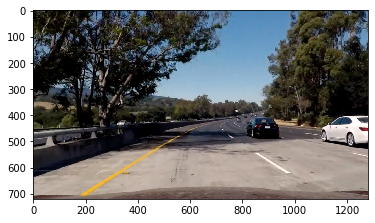

Blue Activation output:


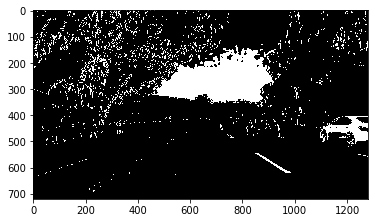

Saturation Activation output:


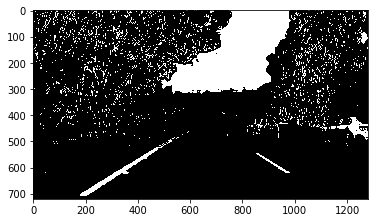

Hue Activation output:


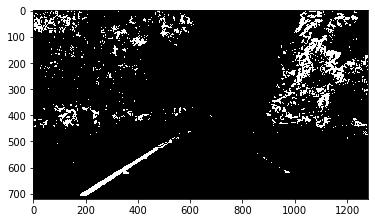

Value Activation output:


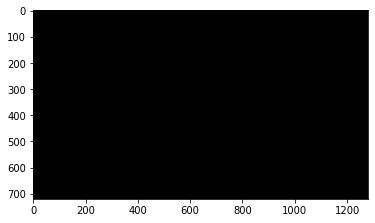

Binary Activation output:


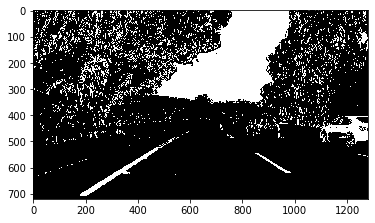

Region select pipe output:


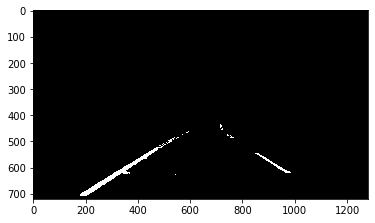

Region select pipe output:


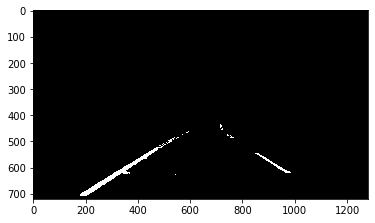

Warp Image output:


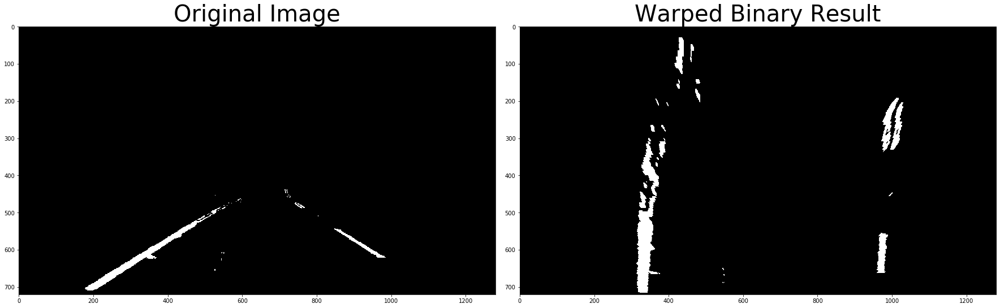

Fit Polynomial output:


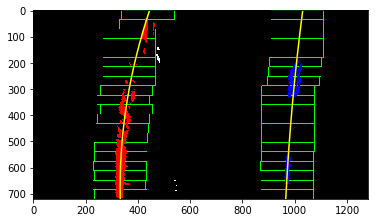

Search Lane With Prior Poly output:


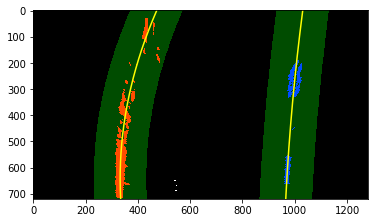

center:  0.3983902861834401 m
451.1315042339619 m 2730.3585569521974 m


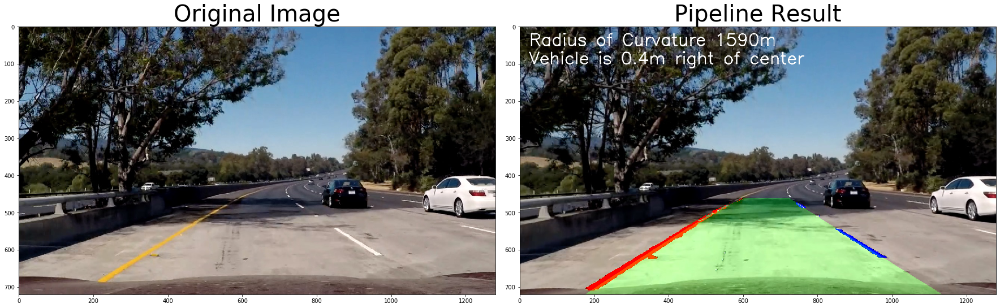

Test Image Original:


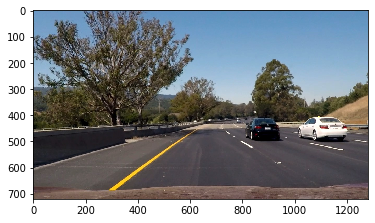

Undistort step output:


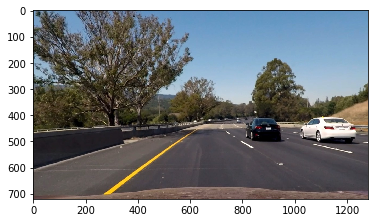

Blue Activation output:


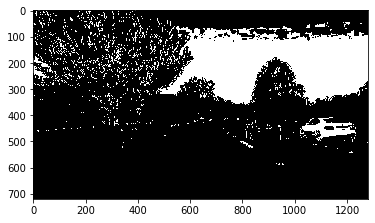

Saturation Activation output:


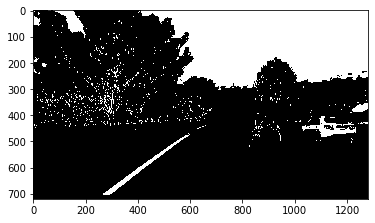

Hue Activation output:


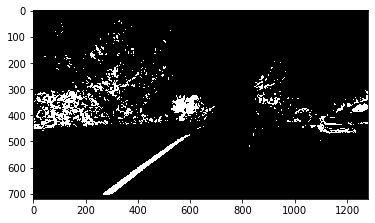

Value Activation output:


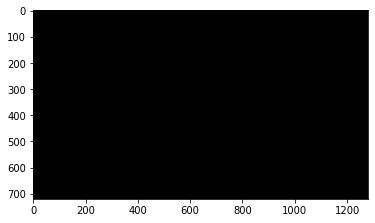

Binary Activation output:


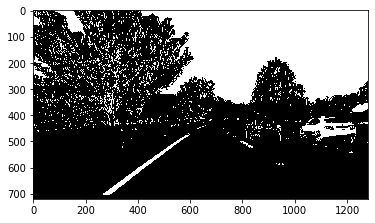

Region select pipe output:


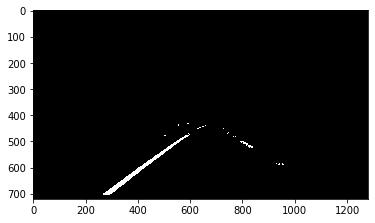

Region select pipe output:


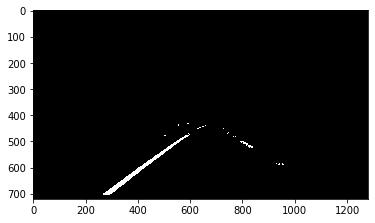

Warp Image output:


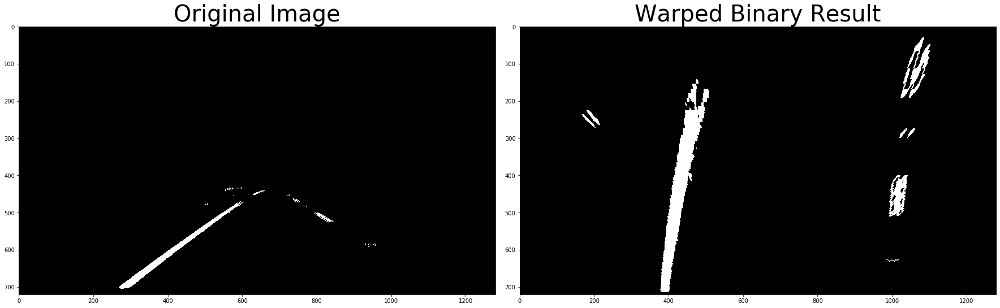

Fit Polynomial output:


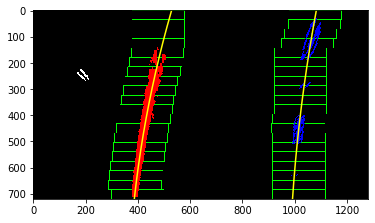

Search Lane With Prior Poly output:


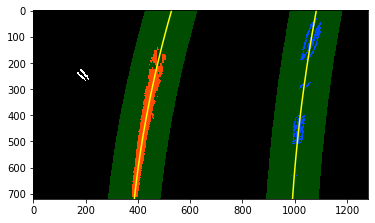

center:  0.17584674929615085 m
1226.2851345383651 m 1848.848140567767 m


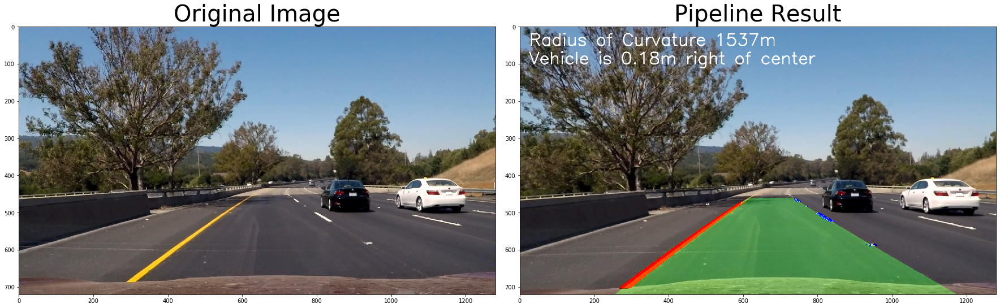

In [32]:
# Read Test Images

DEBUG = True
lane_detected = False
left_lane_line = Line()
right_lane_line = Line()
txt7=""
for file in glob.glob('test_images/*.jpg'):
    image = mpimg.imread(file)
    print("Test Image Original:")
    plt.figure()
    # Display the test images
    plt.imshow(image)
    plt.show()
    
    # Lane lines
    left_lane_line = Line()
    right_lane_line = Line()
    
    #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = DEBUG)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, debug = DEBUG)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = DEBUG)
    
    #Negative Region mask images
    masked_image = regionSelStep(masked_image, bottomLeftXOffset = 0.4,bottomRightXOffset = 0.6,
               topLeftXOffset = 0.49, topRightXOffset = 0.51,
               horizon = 0.8, invert = True, debug = DEBUG)
    
    #Warp Images
    bird_eye_image = warpStep(masked_image, M, debug = DEBUG)
    
    if right_lane_line.detected and right_lane_line.detected:
        # Search around previous polynomial
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        
        checkFit(left_lane_line, right_lane_line)
        
    if  right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required():
        reinitialize_fit(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
       
    ## Visualization ##
    # Create a blank warped image
    gray_warp = np.zeros_like(bird_eye_image).astype(np.uint8)
    color_warp = np.dstack((gray_warp, gray_warp, gray_warp))
        
    # Use the left and right lanes to run fillpoly
    pts_left = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted, left_lane_line.recent_ploty ]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted, right_lane_line.recent_ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Inverse warp the polygon back to image
    lanePoly = warpStep(color_warp, Minv, debug = False)
    lane_line_unwarped_img = warpStep(lane_line_img, Minv, debug = False)

    # Now create a mask of lane lines and create its inverse mask also
    img2gray = cv2.cvtColor(lane_line_unwarped_img,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    # Now black-out the area of lane of in the image
    undistort_image = cv2.bitwise_and(undistort_image,undistort_image,mask = mask_inv)
    # Put the lane lines on the masked image
    undistort_image = cv2.add(undistort_image,lane_line_unwarped_img)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistort_image, 1, lanePoly, 0.3, 0)
    
    ## End Visualizations ##
    
    center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, result.shape, debug = DEBUG)
    
    #Print curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    curve = round(int((left_lane_line.radius_of_curvature + right_lane_line.radius_of_curvature) / 2))
    txt = "Radius of Curvature " + str(curve) + "m "
    cv2.putText(result, txt, (25,50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
    #Print vehicle center distance on image
    center_dist = round(center_dist, 2)
    if center_dist < 0:
        txt2 = "Vehicle is " + str(center_dist) + "m left of center"
    elif center_dist > 0:
        txt2 = "Vehicle is " + str(center_dist) + "m right of center"
    else:
        txt2 = "Distance from Center: " + str(center_dist) + "m"
    cv2.putText(result, txt2, (25,100), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
        
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
       
    plt.show()
    
    #Save results in file
    mpimg.imsave(file.replace("test", "output"), result)

In [33]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Routine for image by image analysis of videos

In [34]:
DEBUG = False
# Lane lines
left_lane_line = Line()
right_lane_line = Line()
txt7=""
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    txt7=""
    
       #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = DEBUG)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, debug = DEBUG)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = DEBUG)
    #Negative Region mask images
    masked_image = regionSelStep(masked_image, bottomLeftXOffset = 0.4,bottomRightXOffset = 0.6,
               topLeftXOffset = 0.49, topRightXOffset = 0.51,
               horizon = 0.8, invert = True, debug = DEBUG)
    
    #Warp Images
    bird_eye_image = warpStep(masked_image, M, debug = DEBUG)
    lane_line_img = np.zeros_like(undistort_image)
    
    if not (right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required()):
        # Search around previous polynomial
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, undistort_image.shape, debug = DEBUG)
       
        
    txt5=checkFit(left_lane_line, right_lane_line)
    
    if left_lane_line.detected or right_lane_line.detected:
        # For debugging
        narrow_search_worked = True
    else:
        narrow_search_worked = False
#         lane_line_img = np.zeros_like(undistort_image)
            
    reinitializing = False
    print(str(left_lane_line.radius_of_curvature)+' '+str(right_lane_line.radius_of_curvature))
    if  right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required():
        reinitializing = True
        reinitialize_fit(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, undistort_image.shape, debug = DEBUG)
#         left_lane_line.accept_fit()
#         right_lane_line.accept_fit()
        tx7 = checkFit(left_lane_line, right_lane_line)
       
    ## Visualization ##
    # Create a blank warped image
    gray_warp = np.zeros_like(bird_eye_image).astype(np.uint8)
    color_warp = np.dstack((gray_warp, gray_warp, gray_warp))
        
    # Use the left and right lanes to run fillpoly
    pts_left = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted, left_lane_line.recent_ploty ]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted, right_lane_line.recent_ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Inverse warp the polygon back to image
    lanePoly = warpStep(color_warp, Minv, debug = False)
    lane_line_unwarped_img = warpStep(lane_line_img, Minv, debug = False)

    # Now create a mask of lane lines and create its inverse mask also
    img2gray = cv2.cvtColor(lane_line_unwarped_img,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    # Now black-out the area of lane of in the image
    undistort_image = cv2.bitwise_and(undistort_image,undistort_image,mask = mask_inv)
    # Put the lane lines on the masked image
    undistort_image = cv2.add(undistort_image,lane_line_unwarped_img)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistort_image, 1, lanePoly, 0.3, 0)
    
    ## End Visualizations ##
    
    center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, result.shape, debug = DEBUG)
    
    #Print curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    curve = round(int((left_lane_line.radius_of_curvature + right_lane_line.radius_of_curvature) / 2))
    txt = "Radius of Curvature " + str(curve) + "m "
    cv2.putText(result, txt, (25,50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
    #Print vehicle center distance on image
    center_dist = round(center_dist, 2)
    if center_dist < 0:
        txt2 = "Vehicle is " + str(center_dist) + "m left of center"
    elif center_dist > 0:
        txt2 = "Vehicle is " + str(center_dist) + "m right of center"
    else:
        txt2 = "Distance from Center: " + str(center_dist) + "m"
    cv2.putText(result, txt2, (25,100), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
   
    #Debug Messages
    
#     if narrow_search_worked:
#         txt3 = "LL: Narrow Search Worked"
#     elif reinitializing:
#         txt3 = "LL: Reinitializing fit"
#     else:
#         txt3 = "LL: Skipping frame"
#     txt3 = txt3 + str(left_lane_line.radius_of_curvature)
#     cv2.putText(result, txt3, (25,150), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)
    
#     if narrow_search_worked:
#         txt4 = "RL: Narrow Search Worked"
#     elif reinitializing:
#         txt4 = "RL: Reinitializing fit"
#     else:
#         txt4 = "RL: Skipping frame"
#     txt4 = txt4 + str(right_lane_line.radius_of_curvature)
#     cv2.putText(result, txt4, (25,175), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)   
#     cv2.putText(result, txt5, (25,200), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)

#     # Sixth line
#     txt6 = "RL line base:"+str(round(right_lane_line.line_base_pos,2))+\
#             "LL line base:"+str(round(left_lane_line.line_base_pos,2))
#     cv2.putText(result, txt6, (25,225), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)   
    
#     # Seventh Line
#     txt7 = "Reinit:" + txt7
#     cv2.putText(result, txt7, (25,250), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)   
    
    #END of Debug Messages
    
    return result

    

In [35]:
# clip1.reader.close()
# clip1.audio.reader.close_proc()
project_output_video = 'output_images/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("project_video.mp4")
#     clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(project_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

t:   0%|                                                                                           | 0/1260 [00:00<?, ?it/s, now=None]

None None
Moviepy - Building video output_images/project_video.mp4.
Moviepy - Writing video output_images/project_video.mp4



t:   0%|▏                                                                                  | 2/1260 [00:00<03:14,  6.46it/s, now=None]

976.5452064350535 1112.6922685637107


t:   0%|▏                                                                                  | 3/1260 [00:00<04:14,  4.93it/s, now=None]

796.6215087456537 1021.6287477584548


t:   0%|▎                                                                                  | 4/1260 [00:00<04:57,  4.22it/s, now=None]

672.8319204883198 1155.0748866959161


t:   0%|▎                                                                                  | 5/1260 [00:01<05:31,  3.78it/s, now=None]

593.5932593280613 1119.7431110496887


t:   0%|▍                                                                                  | 6/1260 [00:01<05:51,  3.56it/s, now=None]

640.842999181942 911.4103074731183


t:   1%|▍                                                                                  | 7/1260 [00:01<06:09,  3.39it/s, now=None]

610.1361145193148 809.7695365114888


t:   1%|▌                                                                                  | 8/1260 [00:02<06:18,  3.30it/s, now=None]

639.964447472402 766.5837606794187


t:   1%|▌                                                                                  | 9/1260 [00:02<06:28,  3.22it/s, now=None]

643.9032785837096 841.2635370109056


t:   1%|▋                                                                                 | 10/1260 [00:02<06:33,  3.18it/s, now=None]

662.7602836796308 885.7821843248258


t:   1%|▋                                                                                 | 11/1260 [00:03<06:32,  3.18it/s, now=None]

704.1645847900235 854.0292218606601


t:   1%|▊                                                                                 | 12/1260 [00:03<06:33,  3.17it/s, now=None]

718.8754056959876 1041.4478388814398


t:   1%|▊                                                                                 | 13/1260 [00:03<06:41,  3.10it/s, now=None]

764.3552283662424 966.7508344918558


t:   1%|▉                                                                                 | 14/1260 [00:04<06:47,  3.06it/s, now=None]

762.008945121731 1494.8037364729319


t:   1%|▉                                                                                 | 15/1260 [00:04<06:47,  3.05it/s, now=None]

784.9085170392997 3263.2651273650695


t:   1%|█                                                                                 | 16/1260 [00:04<06:47,  3.05it/s, now=None]

728.3064325982465 2563.6528301703333


t:   1%|█                                                                                 | 17/1260 [00:05<06:47,  3.05it/s, now=None]

688.6101887083668 1532.8640353350963


t:   1%|█▏                                                                                | 18/1260 [00:05<06:41,  3.09it/s, now=None]

710.378188447838 1340.0895783892304


t:   2%|█▏                                                                                | 19/1260 [00:05<06:42,  3.08it/s, now=None]

792.9538130246782 1211.09536721309


t:   2%|█▎                                                                                | 20/1260 [00:06<06:39,  3.10it/s, now=None]

837.937015365948 1173.225359081752


t:   2%|█▎                                                                                | 21/1260 [00:06<06:33,  3.15it/s, now=None]

1004.9546994616946 1137.8769887500418


t:   2%|█▍                                                                                | 22/1260 [00:06<06:37,  3.11it/s, now=None]

1308.599691178306 718.7882379906828


t:   2%|█▍                                                                                | 23/1260 [00:07<06:38,  3.10it/s, now=None]

1741.0125904567517 727.0905182612186


t:   2%|█▌                                                                                | 24/1260 [00:07<06:32,  3.15it/s, now=None]

2627.714594635547 820.2708948757501


t:   2%|█▋                                                                                | 25/1260 [00:07<06:32,  3.14it/s, now=None]

2387.767570775355 831.7705587334184


t:   2%|█▋                                                                                | 26/1260 [00:08<06:31,  3.15it/s, now=None]

1706.9892241701689 865.5300415129415


t:   2%|█▊                                                                                | 27/1260 [00:08<06:32,  3.14it/s, now=None]

1711.359270889082 894.6975126019626


t:   2%|█▊                                                                                | 28/1260 [00:08<06:34,  3.13it/s, now=None]

1579.7736650946472 948.1217589268906


t:   2%|█▉                                                                                | 29/1260 [00:09<06:33,  3.13it/s, now=None]

1499.3058031372502 1103.1580004137206


t:   2%|█▉                                                                                | 30/1260 [00:09<06:31,  3.14it/s, now=None]

1136.301350605523 1152.8703190123388


t:   2%|██                                                                                | 31/1260 [00:09<06:30,  3.15it/s, now=None]

914.929015038186 1167.8022914970834


t:   3%|██                                                                                | 32/1260 [00:09<06:35,  3.10it/s, now=None]

870.3721070541895 1037.4536976396696


t:   3%|██▏                                                                               | 33/1260 [00:10<06:35,  3.10it/s, now=None]

784.8870658049103 749.5350306896604


t:   3%|██▏                                                                               | 34/1260 [00:10<06:31,  3.13it/s, now=None]

823.9310737825625 716.6885420240233


t:   3%|██▎                                                                               | 35/1260 [00:10<06:33,  3.12it/s, now=None]

765.1089617153465 673.444770197098


t:   3%|██▎                                                                               | 36/1260 [00:11<06:32,  3.12it/s, now=None]

747.6719393521081 764.67273210116


t:   3%|██▍                                                                               | 37/1260 [00:11<06:33,  3.11it/s, now=None]

724.7374455448428 753.5717289980947


t:   3%|██▍                                                                               | 38/1260 [00:11<06:26,  3.16it/s, now=None]

714.8480548337625 733.3743194177626


t:   3%|██▌                                                                               | 39/1260 [00:12<06:35,  3.09it/s, now=None]

667.3623515901468 700.0291790869743


t:   3%|██▌                                                                               | 40/1260 [00:12<06:35,  3.09it/s, now=None]

641.2909038511114 815.5493069111511


t:   3%|██▋                                                                               | 41/1260 [00:12<06:36,  3.08it/s, now=None]

616.1803192435901 861.1561961524884


t:   3%|██▋                                                                               | 42/1260 [00:13<06:32,  3.11it/s, now=None]

573.3245829720914 994.6515582067228


t:   3%|██▊                                                                               | 43/1260 [00:13<06:21,  3.19it/s, now=None]

557.506927017783 954.6858369465901


t:   3%|██▊                                                                               | 44/1260 [00:13<06:23,  3.17it/s, now=None]

566.888478049247 912.2750679718357


t:   4%|██▉                                                                               | 45/1260 [00:14<06:28,  3.13it/s, now=None]

557.9206249514294 810.907127812465


t:   4%|██▉                                                                               | 46/1260 [00:14<06:26,  3.14it/s, now=None]

570.2575446780007 748.0015720581532


t:   4%|███                                                                               | 47/1260 [00:14<06:22,  3.17it/s, now=None]

560.6563604667319 624.434790507577


t:   4%|███                                                                               | 48/1260 [00:15<06:22,  3.17it/s, now=None]

568.856603069635 666.8252830960079


t:   4%|███▏                                                                              | 49/1260 [00:15<06:29,  3.11it/s, now=None]

575.4454036375581 652.5969596113205


t:   4%|███▎                                                                              | 50/1260 [00:15<06:24,  3.15it/s, now=None]

619.6509396756564 659.7229940316963


t:   4%|███▎                                                                              | 51/1260 [00:16<06:23,  3.16it/s, now=None]

655.2557488638352 682.1971263662193


t:   4%|███▍                                                                              | 52/1260 [00:16<06:21,  3.17it/s, now=None]

697.7698436806177 723.459863508279


t:   4%|███▍                                                                              | 53/1260 [00:16<06:28,  3.10it/s, now=None]

696.5992460767509 752.6033563411653


t:   4%|███▌                                                                              | 54/1260 [00:16<06:23,  3.14it/s, now=None]

689.2045134393572 854.733047064373


t:   4%|███▌                                                                              | 55/1260 [00:17<06:23,  3.14it/s, now=None]

705.7252095199049 928.1601578995113


t:   4%|███▋                                                                              | 56/1260 [00:17<06:26,  3.12it/s, now=None]

771.2893037977497 904.9504012314234


t:   5%|███▋                                                                              | 57/1260 [00:17<06:22,  3.15it/s, now=None]

831.5896293347101 808.6152226978979


t:   5%|███▊                                                                              | 58/1260 [00:18<06:17,  3.18it/s, now=None]

901.6723063523633 724.4629000943862


t:   5%|███▊                                                                              | 59/1260 [00:18<06:14,  3.21it/s, now=None]

1065.1704025761896 691.6080524642675


t:   5%|███▉                                                                              | 60/1260 [00:18<06:16,  3.19it/s, now=None]

1183.9074637958806 637.6060036682387


t:   5%|███▉                                                                              | 61/1260 [00:19<06:19,  3.16it/s, now=None]

1356.9054010264713 613.2389039048375


t:   5%|████                                                                              | 62/1260 [00:19<06:15,  3.19it/s, now=None]

1396.4897782415226 702.9350126455956


t:   5%|████                                                                              | 63/1260 [00:19<06:19,  3.16it/s, now=None]

1396.2968000353412 768.1887811291432


t:   5%|████▏                                                                             | 64/1260 [00:20<06:19,  3.15it/s, now=None]

1387.419192744422 947.8753782946364


t:   5%|████▏                                                                             | 65/1260 [00:20<06:23,  3.12it/s, now=None]

1260.7128704539393 892.7972877623662


t:   5%|████▎                                                                             | 66/1260 [00:20<06:24,  3.10it/s, now=None]

1061.5944041083048 1252.3084135178779


t:   5%|████▎                                                                             | 67/1260 [00:21<06:23,  3.11it/s, now=None]

898.5654761747109 1012.2695692451063


t:   5%|████▍                                                                             | 68/1260 [00:21<06:24,  3.10it/s, now=None]

804.2004428093196 953.457144060277


t:   5%|████▍                                                                             | 69/1260 [00:21<06:30,  3.05it/s, now=None]

808.1010232432341 970.4838347051333


t:   6%|████▌                                                                             | 70/1260 [00:22<06:32,  3.03it/s, now=None]

733.1790167854228 1038.6821250555472


t:   6%|████▌                                                                             | 71/1260 [00:22<06:28,  3.06it/s, now=None]

680.5529993970935 1092.9237095141673


t:   6%|████▋                                                                             | 72/1260 [00:22<06:23,  3.10it/s, now=None]

709.485808292019 958.8022561615415


t:   6%|████▊                                                                             | 73/1260 [00:23<06:21,  3.11it/s, now=None]

702.4216081678186 1053.2993588190277


t:   6%|████▊                                                                             | 74/1260 [00:23<06:16,  3.15it/s, now=None]

736.0181845631128 1048.1570670327699


t:   6%|████▉                                                                             | 75/1260 [00:23<06:16,  3.15it/s, now=None]

814.0074161215333 1082.6885040867805


t:   6%|████▉                                                                             | 76/1260 [00:24<06:18,  3.13it/s, now=None]

925.4618760696811 1117.1965208096483


t:   6%|█████                                                                             | 77/1260 [00:24<06:20,  3.11it/s, now=None]

1070.1823651785896 734.7309212391403


t:   6%|█████                                                                             | 78/1260 [00:24<06:18,  3.12it/s, now=None]

1326.0337845918755 878.5648014824355


t:   6%|█████▏                                                                            | 79/1260 [00:24<06:18,  3.12it/s, now=None]

1453.2473840397545 1073.5532577216945


t:   6%|█████▏                                                                            | 80/1260 [00:25<06:19,  3.11it/s, now=None]

1938.6757639240107 1233.9427243742161


t:   6%|█████▎                                                                            | 81/1260 [00:25<06:17,  3.12it/s, now=None]

2010.3679294222163 1242.957605504363


t:   7%|█████▎                                                                            | 82/1260 [00:25<06:15,  3.14it/s, now=None]

3187.987436349692 854.9712886780654


t:   7%|█████▍                                                                            | 83/1260 [00:26<06:21,  3.09it/s, now=None]

3265.660958958806 807.6640406695581


t:   7%|█████▍                                                                            | 84/1260 [00:26<06:18,  3.10it/s, now=None]

3597.931995039989 779.4016697123106


t:   7%|█████▌                                                                            | 85/1260 [00:26<06:17,  3.11it/s, now=None]

6057.3869281579055 668.9611101716129


t:   7%|█████▌                                                                            | 86/1260 [00:27<06:37,  2.95it/s, now=None]

5563.3717431507885 689.552396828769


t:   7%|█████▋                                                                            | 87/1260 [00:27<06:24,  3.05it/s, now=None]

3313.6185066352004 743.9486228182435


t:   7%|█████▋                                                                            | 88/1260 [00:27<06:20,  3.08it/s, now=None]

2274.848967458148 770.4871309793987


t:   7%|█████▊                                                                            | 89/1260 [00:28<06:24,  3.05it/s, now=None]

1577.5197538354014 864.5652984231833


t:   7%|█████▊                                                                            | 90/1260 [00:28<06:22,  3.06it/s, now=None]

1247.053305225205 1242.1352484106424


t:   7%|█████▉                                                                            | 91/1260 [00:28<06:35,  2.96it/s, now=None]

965.7602072439248 1072.9281213673983


t:   7%|█████▉                                                                            | 92/1260 [00:29<06:27,  3.02it/s, now=None]

949.7846574503701 1251.6869673121762


t:   7%|██████                                                                            | 93/1260 [00:29<06:23,  3.04it/s, now=None]

890.774817462605 1069.423369506675


t:   7%|██████                                                                            | 94/1260 [00:29<06:19,  3.07it/s, now=None]

898.5063012910628 1061.9305047023336


t:   8%|██████▏                                                                           | 95/1260 [00:30<06:16,  3.10it/s, now=None]

822.6947128403649 916.5440782379527


t:   8%|██████▏                                                                           | 96/1260 [00:30<06:10,  3.14it/s, now=None]

788.4164537324074 921.4245680985262


t:   8%|██████▎                                                                           | 97/1260 [00:30<06:13,  3.11it/s, now=None]

735.0430451800652 679.9413824323765


t:   8%|██████▍                                                                           | 98/1260 [00:31<06:09,  3.14it/s, now=None]

731.7526607824173 804.3287765761894


t:   8%|██████▍                                                                           | 99/1260 [00:31<06:14,  3.10it/s, now=None]

800.6602768269291 818.6438874437034


t:   8%|██████▍                                                                          | 100/1260 [00:31<06:15,  3.09it/s, now=None]

797.961815694506 894.1419113458315


t:   8%|██████▍                                                                          | 101/1260 [00:32<06:10,  3.13it/s, now=None]

834.8360717085183 895.84076342474


t:   8%|██████▌                                                                          | 102/1260 [00:32<06:07,  3.15it/s, now=None]

800.8751454134512 792.687554358546


t:   8%|██████▌                                                                          | 103/1260 [00:32<06:08,  3.14it/s, now=None]

818.2685494439751 703.10743625094


t:   8%|██████▋                                                                          | 104/1260 [00:33<06:10,  3.12it/s, now=None]

815.061978395939 875.2800036822091


t:   8%|██████▊                                                                          | 105/1260 [00:33<06:12,  3.10it/s, now=None]

837.7803139054339 944.2608239908859


t:   8%|██████▊                                                                          | 106/1260 [00:33<06:10,  3.12it/s, now=None]

837.13998065756 1003.5600318682546


t:   8%|██████▉                                                                          | 107/1260 [00:34<06:09,  3.12it/s, now=None]

924.0366087173535 1031.7516770389377


t:   9%|██████▉                                                                          | 108/1260 [00:34<06:09,  3.12it/s, now=None]

925.1022726537424 920.7966642255976


t:   9%|███████                                                                          | 109/1260 [00:34<06:06,  3.14it/s, now=None]

911.0074233510574 774.5954370499219


t:   9%|███████                                                                          | 110/1260 [00:35<06:07,  3.13it/s, now=None]

883.2747005219973 728.0709517886893


t:   9%|███████▏                                                                         | 111/1260 [00:35<06:09,  3.11it/s, now=None]

967.3063292528201 692.1930660093424


t:   9%|███████▏                                                                         | 112/1260 [00:35<06:05,  3.14it/s, now=None]

917.5828950054885 802.93258615924


t:   9%|███████▎                                                                         | 113/1260 [00:35<06:02,  3.16it/s, now=None]

879.007884459003 859.4677012858988


t:   9%|███████▎                                                                         | 114/1260 [00:36<06:03,  3.16it/s, now=None]

859.1939083694573 844.737232564082


t:   9%|███████▍                                                                         | 115/1260 [00:36<06:03,  3.15it/s, now=None]

836.9537736815423 915.2953850354373


t:   9%|███████▍                                                                         | 116/1260 [00:36<06:02,  3.16it/s, now=None]

765.1311078395456 1111.2216500498423


t:   9%|███████▌                                                                         | 117/1260 [00:37<06:02,  3.15it/s, now=None]

714.0605321889177 1110.4156109179992


t:   9%|███████▌                                                                         | 118/1260 [00:37<06:05,  3.13it/s, now=None]

677.4888547769673 980.5946097197069


t:   9%|███████▋                                                                         | 119/1260 [00:37<05:58,  3.18it/s, now=None]

721.6865048360007 794.4878985673182


t:  10%|███████▋                                                                         | 120/1260 [00:38<05:58,  3.18it/s, now=None]

718.6030145891968 638.3026677056654


t:  10%|███████▊                                                                         | 121/1260 [00:38<06:01,  3.15it/s, now=None]

671.4217978171431 592.283796863594


t:  10%|███████▊                                                                         | 122/1260 [00:38<06:03,  3.13it/s, now=None]

689.3745816780472 568.5080917765653


t:  10%|███████▉                                                                         | 123/1260 [00:39<06:01,  3.14it/s, now=None]

679.3858800182638 465.82413032646434


t:  10%|███████▉                                                                         | 124/1260 [00:39<06:02,  3.13it/s, now=None]

677.358345665061 540.000340443478


t:  10%|████████                                                                         | 125/1260 [00:39<06:02,  3.13it/s, now=None]

687.0688771985214 529.3435974489844


t:  10%|████████                                                                         | 126/1260 [00:40<06:02,  3.13it/s, now=None]

681.1218198407333 532.419435424967


t:  10%|████████▏                                                                        | 127/1260 [00:40<05:59,  3.15it/s, now=None]

706.891715874723 532.528087213994


t:  10%|████████▏                                                                        | 128/1260 [00:40<06:00,  3.14it/s, now=None]

673.3249810355417 587.5597761158448


t:  10%|████████▎                                                                        | 129/1260 [00:41<05:59,  3.15it/s, now=None]

671.6130099258801 645.5545397581164


t:  10%|████████▎                                                                        | 130/1260 [00:41<06:01,  3.12it/s, now=None]

621.2403097732869 739.8336813727163


t:  10%|████████▍                                                                        | 131/1260 [00:41<06:01,  3.12it/s, now=None]

623.3222723297025 670.0664303616633


t:  10%|████████▍                                                                        | 132/1260 [00:42<05:58,  3.15it/s, now=None]

638.6022360484486 675.6078636210685


t:  11%|████████▌                                                                        | 133/1260 [00:42<06:00,  3.13it/s, now=None]

635.2593347907663 640.381673370601


t:  11%|████████▌                                                                        | 134/1260 [00:42<06:00,  3.12it/s, now=None]

657.3946955508235 660.9116523540127


t:  11%|████████▋                                                                        | 135/1260 [00:42<05:57,  3.14it/s, now=None]

681.7469494894972 587.5455492441957


t:  11%|████████▋                                                                        | 136/1260 [00:43<06:02,  3.10it/s, now=None]

735.1396152847481 626.7768008223371


t:  11%|████████▊                                                                        | 137/1260 [00:43<05:55,  3.16it/s, now=None]

766.1539218902476 651.6532951107254


t:  11%|████████▊                                                                        | 138/1260 [00:43<05:55,  3.16it/s, now=None]

788.1684658043629 682.7910623661576


t:  11%|████████▉                                                                        | 139/1260 [00:44<05:57,  3.14it/s, now=None]

820.7496657013618 738.0278162853244


t:  11%|█████████                                                                        | 140/1260 [00:44<05:54,  3.16it/s, now=None]

845.3306285333999 850.1320076175408


t:  11%|█████████                                                                        | 141/1260 [00:44<05:55,  3.15it/s, now=None]

878.0170121410575 846.264919009218


t:  11%|█████████▏                                                                       | 142/1260 [00:45<05:55,  3.15it/s, now=None]

888.0920555963149 989.1173558651025


t:  11%|█████████▏                                                                       | 143/1260 [00:45<05:56,  3.13it/s, now=None]

876.7339828206802 918.4790304952949


t:  11%|█████████▎                                                                       | 144/1260 [00:45<05:59,  3.10it/s, now=None]

885.3629000398888 968.2812978368352


t:  12%|█████████▎                                                                       | 145/1260 [00:46<05:56,  3.13it/s, now=None]

880.201920400327 1012.1370435968769


t:  12%|█████████▍                                                                       | 146/1260 [00:46<05:56,  3.13it/s, now=None]

877.3992262279518 1044.4519968717022


t:  12%|█████████▍                                                                       | 147/1260 [00:46<05:47,  3.20it/s, now=None]

849.6599114624856 972.403074426615


t:  12%|█████████▌                                                                       | 148/1260 [00:47<05:47,  3.20it/s, now=None]

848.9706136568195 1173.4875000842176


t:  12%|█████████▌                                                                       | 149/1260 [00:47<05:48,  3.18it/s, now=None]

839.8482111799567 1345.212527429682


t:  12%|█████████▋                                                                       | 150/1260 [00:47<05:49,  3.17it/s, now=None]

866.5874906222326 1126.06083488466


t:  12%|█████████▋                                                                       | 151/1260 [00:48<05:45,  3.21it/s, now=None]

953.177284757156 1118.2460819983182


t:  12%|█████████▊                                                                       | 152/1260 [00:48<05:43,  3.22it/s, now=None]

1079.9812530772545 1068.257928391317


t:  12%|█████████▊                                                                       | 153/1260 [00:48<05:48,  3.17it/s, now=None]

1135.0454250679045 1373.8815792149908


t:  12%|█████████▉                                                                       | 154/1260 [00:48<05:49,  3.16it/s, now=None]

1116.8057596867834 1161.7378510444198


t:  12%|█████████▉                                                                       | 155/1260 [00:49<05:46,  3.19it/s, now=None]

1189.1111344796202 1293.5181802917436


t:  12%|██████████                                                                       | 156/1260 [00:49<05:46,  3.18it/s, now=None]

1229.3202334226937 1163.0827887115884


t:  12%|██████████                                                                       | 157/1260 [00:49<05:46,  3.18it/s, now=None]

1274.4358283858567 910.1102503882362


t:  13%|██████████▏                                                                      | 158/1260 [00:50<05:47,  3.17it/s, now=None]

1245.8297081121386 738.579330564538


t:  13%|██████████▏                                                                      | 159/1260 [00:50<05:48,  3.16it/s, now=None]

1098.5092141941473 644.6278994497557


t:  13%|██████████▎                                                                      | 160/1260 [00:50<05:45,  3.18it/s, now=None]

1038.8510748576934 659.8696519674958


t:  13%|██████████▎                                                                      | 161/1260 [00:51<05:47,  3.16it/s, now=None]

937.0419155066654 752.3170737633626


t:  13%|██████████▍                                                                      | 162/1260 [00:51<05:48,  3.15it/s, now=None]

890.7508700874793 812.0308781093509


t:  13%|██████████▍                                                                      | 163/1260 [00:51<05:47,  3.16it/s, now=None]

856.3637812482564 858.8245186802592


t:  13%|██████████▌                                                                      | 164/1260 [00:52<05:46,  3.17it/s, now=None]

855.1602347727916 853.5132632356467


t:  13%|██████████▌                                                                      | 165/1260 [00:52<05:45,  3.17it/s, now=None]

827.0495645192422 1541.786147133496


t:  13%|██████████▋                                                                      | 166/1260 [00:52<05:47,  3.15it/s, now=None]

806.9809129163715 1479.5689457365056


t:  13%|██████████▋                                                                      | 167/1260 [00:53<05:44,  3.17it/s, now=None]

800.9233721275203 1809.6496058386472


t:  13%|██████████▊                                                                      | 168/1260 [00:53<05:46,  3.15it/s, now=None]

705.1518892339054 1453.9351801547825


t:  13%|██████████▊                                                                      | 169/1260 [00:53<06:01,  3.02it/s, now=None]

802.6710441996483 1673.8962173566931


t:  13%|██████████▉                                                                      | 170/1260 [00:54<05:59,  3.03it/s, now=None]

807.4999532303107 2064.6554389136


t:  14%|██████████▉                                                                      | 171/1260 [00:54<05:56,  3.05it/s, now=None]

809.1816041038063 2089.995293707307


t:  14%|███████████                                                                      | 172/1260 [00:54<05:53,  3.08it/s, now=None]

818.1455070118137 998.3854101051696


t:  14%|███████████                                                                      | 173/1260 [00:55<05:50,  3.10it/s, now=None]

840.764805352509 680.2828987943404


t:  14%|███████████▏                                                                     | 174/1260 [00:55<05:50,  3.10it/s, now=None]

868.8076652372856 640.0581312027125


t:  14%|███████████▎                                                                     | 175/1260 [00:55<05:47,  3.12it/s, now=None]

936.4189713911652 675.806019144727


t:  14%|███████████▎                                                                     | 176/1260 [00:56<06:02,  2.99it/s, now=None]

1014.9137848106262 632.7450494798894


t:  14%|███████████▍                                                                     | 177/1260 [00:56<05:56,  3.04it/s, now=None]

1034.6280879370022 461.8334918689759


t:  14%|███████████▍                                                                     | 178/1260 [00:56<05:47,  3.11it/s, now=None]

1138.2831989601716 496.1059700489765


t:  14%|███████████▌                                                                     | 179/1260 [00:56<05:45,  3.13it/s, now=None]

1325.5825059930044 499.20751837290817


t:  14%|███████████▌                                                                     | 180/1260 [00:57<05:42,  3.15it/s, now=None]

1358.482734500262 548.2398383561923


t:  14%|███████████▋                                                                     | 181/1260 [00:57<05:45,  3.13it/s, now=None]

1572.3377620142041 574.9798837356661


t:  14%|███████████▋                                                                     | 182/1260 [00:57<05:48,  3.10it/s, now=None]

1294.6767972414445 476.04368096454897


t:  15%|███████████▊                                                                     | 183/1260 [00:58<05:51,  3.07it/s, now=None]

1315.870903648684 507.75465614866


t:  15%|███████████▊                                                                     | 184/1260 [00:58<05:53,  3.05it/s, now=None]

1100.2703483153086 468.1847925805809


t:  15%|███████████▉                                                                     | 185/1260 [00:58<05:55,  3.02it/s, now=None]

945.3739779359755 422.3422264500006


t:  15%|███████████▉                                                                     | 186/1260 [00:59<05:48,  3.08it/s, now=None]

801.5035265782823 400.79815147112737


t:  15%|████████████                                                                     | 187/1260 [00:59<05:48,  3.08it/s, now=None]

624.7545491828104 416.6775436544922


t:  15%|████████████                                                                     | 188/1260 [00:59<05:50,  3.06it/s, now=None]

571.8684530102454 443.5238882013879


t:  15%|████████████▏                                                                    | 189/1260 [01:00<05:45,  3.10it/s, now=None]

525.887671080446 474.2443680120522


t:  15%|████████████▏                                                                    | 190/1260 [01:00<05:45,  3.10it/s, now=None]

495.50384575199723 529.7132766653551


t:  15%|████████████▎                                                                    | 191/1260 [01:00<05:44,  3.10it/s, now=None]

485.8756506252588 600.484227994768


t:  15%|████████████▎                                                                    | 192/1260 [01:01<05:46,  3.09it/s, now=None]

490.32145013686664 574.9431431616032


t:  15%|████████████▍                                                                    | 193/1260 [01:01<05:42,  3.11it/s, now=None]

519.9212907657659 626.2806334570604


t:  15%|████████████▍                                                                    | 194/1260 [01:01<05:41,  3.12it/s, now=None]

536.2258618172251 634.4646933178997


t:  15%|████████████▌                                                                    | 195/1260 [01:02<05:39,  3.13it/s, now=None]

564.8996710167968 610.3762713462944


t:  16%|████████████▌                                                                    | 196/1260 [01:02<05:33,  3.19it/s, now=None]

603.902515681056 605.8806247813777


t:  16%|████████████▋                                                                    | 197/1260 [01:02<05:31,  3.20it/s, now=None]

685.8777325814256 524.4808134804565


t:  16%|████████████▋                                                                    | 198/1260 [01:03<05:35,  3.17it/s, now=None]

737.9109933453814 661.4216183206634


t:  16%|████████████▊                                                                    | 199/1260 [01:03<05:41,  3.11it/s, now=None]

776.8615478707093 770.8509052846516


t:  16%|████████████▊                                                                    | 200/1260 [01:03<05:39,  3.12it/s, now=None]

830.0362358367288 795.1323749200213


t:  16%|████████████▉                                                                    | 201/1260 [01:04<05:39,  3.12it/s, now=None]

837.1710847945408 789.7108608624736


t:  16%|████████████▉                                                                    | 202/1260 [01:04<05:40,  3.10it/s, now=None]

836.5110901847272 910.0191168935784


t:  16%|█████████████                                                                    | 203/1260 [01:04<05:42,  3.09it/s, now=None]

850.8160300642421 1069.5891809145953


t:  16%|█████████████                                                                    | 204/1260 [01:05<05:45,  3.05it/s, now=None]

849.4022629594755 1000.5331795683198


t:  16%|█████████████▏                                                                   | 205/1260 [01:05<05:40,  3.10it/s, now=None]

771.9914817539059 1000.8943125824507


t:  16%|█████████████▏                                                                   | 206/1260 [01:05<05:33,  3.16it/s, now=None]

869.9218711917837 820.3727695849973


t:  16%|█████████████▎                                                                   | 207/1260 [01:06<05:41,  3.09it/s, now=None]

872.9168887355091 729.3607837820919


t:  17%|█████████████▎                                                                   | 208/1260 [01:06<05:38,  3.11it/s, now=None]

836.6805488089884 705.5639410258426


t:  17%|█████████████▍                                                                   | 209/1260 [01:06<05:43,  3.06it/s, now=None]

796.9453688295523 560.0203253932551


t:  17%|█████████████▌                                                                   | 210/1260 [01:06<05:38,  3.10it/s, now=None]

845.3320646649256 604.9793087890579


t:  17%|█████████████▌                                                                   | 211/1260 [01:07<05:36,  3.12it/s, now=None]

890.8994174983062 607.2815405248913


t:  17%|█████████████▋                                                                   | 212/1260 [01:07<05:36,  3.12it/s, now=None]

928.5451203988852 616.3294530668853


t:  17%|█████████████▋                                                                   | 213/1260 [01:07<05:30,  3.17it/s, now=None]

867.9569530882702 635.4857869156532


t:  17%|█████████████▊                                                                   | 214/1260 [01:08<05:30,  3.17it/s, now=None]

854.4314515158745 643.6361422311381


t:  17%|█████████████▊                                                                   | 215/1260 [01:08<05:27,  3.19it/s, now=None]

775.0050132347017 733.7247816733509


t:  17%|█████████████▉                                                                   | 216/1260 [01:08<05:27,  3.19it/s, now=None]

717.6980152407901 696.744067856439


t:  17%|█████████████▉                                                                   | 217/1260 [01:09<05:30,  3.15it/s, now=None]

653.9472827070687 831.1495424951731


t:  17%|██████████████                                                                   | 218/1260 [01:09<05:24,  3.21it/s, now=None]

639.2432905444582 735.315370253026


t:  17%|██████████████                                                                   | 219/1260 [01:09<05:20,  3.25it/s, now=None]

641.260343357313 719.7521982660576


t:  17%|██████████████▏                                                                  | 220/1260 [01:10<05:24,  3.21it/s, now=None]

613.629145344938 729.5535082710221


t:  18%|██████████████▏                                                                  | 221/1260 [01:10<05:23,  3.21it/s, now=None]

664.7076163706711 829.737907256532


t:  18%|██████████████▎                                                                  | 222/1260 [01:10<05:32,  3.13it/s, now=None]

711.4020277111398 956.1477276583672


t:  18%|██████████████▎                                                                  | 223/1260 [01:11<05:30,  3.14it/s, now=None]

751.9776547089135 1181.5744012549324


t:  18%|██████████████▍                                                                  | 224/1260 [01:11<05:26,  3.17it/s, now=None]

796.2186651053075 1031.2914439418753


t:  18%|██████████████▍                                                                  | 225/1260 [01:11<05:27,  3.16it/s, now=None]

809.0117154393769 1110.5000978204705


t:  18%|██████████████▌                                                                  | 226/1260 [01:11<05:22,  3.21it/s, now=None]

852.5508136988451 2250.669907141415


t:  18%|██████████████▌                                                                  | 227/1260 [01:12<05:21,  3.22it/s, now=None]

828.6950896556737 1972.6720833859288


t:  18%|██████████████▋                                                                  | 228/1260 [01:12<05:22,  3.20it/s, now=None]

831.7905525225091 2009.746534268189


t:  18%|██████████████▋                                                                  | 229/1260 [01:12<05:18,  3.23it/s, now=None]

875.0038828025065 1982.4907354331121


t:  18%|██████████████▊                                                                  | 230/1260 [01:13<05:40,  3.02it/s, now=None]

838.3932720787332 1751.016535543301


t:  18%|██████████████▊                                                                  | 231/1260 [01:13<05:39,  3.03it/s, now=None]

892.2519668535379 1614.9990555303239


t:  18%|██████████████▉                                                                  | 232/1260 [01:13<05:32,  3.09it/s, now=None]

909.6867387480187 1197.9591354799568


t:  18%|██████████████▉                                                                  | 233/1260 [01:14<05:32,  3.09it/s, now=None]

965.5275440961761 1051.0989219703686


t:  19%|███████████████                                                                  | 234/1260 [01:14<05:31,  3.10it/s, now=None]

1051.173689748377 796.7125473135746


t:  19%|███████████████                                                                  | 235/1260 [01:14<05:29,  3.11it/s, now=None]

1101.5813472281495 812.0692732044712


t:  19%|███████████████▏                                                                 | 236/1260 [01:15<05:29,  3.11it/s, now=None]

1197.9724144290092 769.9001012724868


t:  19%|███████████████▏                                                                 | 237/1260 [01:15<05:24,  3.15it/s, now=None]

1131.8119975339719 725.6434017573102


t:  19%|███████████████▎                                                                 | 238/1260 [01:15<05:24,  3.15it/s, now=None]

1183.5723836990658 620.7815262716979


t:  19%|███████████████▎                                                                 | 239/1260 [01:16<05:33,  3.06it/s, now=None]

1171.581175537241 611.9448741987237


t:  19%|███████████████▍                                                                 | 240/1260 [01:16<05:34,  3.05it/s, now=None]

1240.995372420523 699.8383146898517


t:  19%|███████████████▍                                                                 | 241/1260 [01:16<05:38,  3.01it/s, now=None]

1223.2868462645292 666.6904571630065


t:  19%|███████████████▌                                                                 | 242/1260 [01:17<05:34,  3.05it/s, now=None]

1161.20415656659 716.9316233246813


t:  19%|███████████████▌                                                                 | 243/1260 [01:17<05:31,  3.06it/s, now=None]

1274.5685847317486 742.1044525688882


t:  19%|███████████████▋                                                                 | 244/1260 [01:17<05:30,  3.07it/s, now=None]

1102.5088302218653 613.2936013191817


t:  19%|███████████████▊                                                                 | 245/1260 [01:18<05:30,  3.07it/s, now=None]

1139.2703991868668 581.2198046377142


t:  20%|███████████████▊                                                                 | 246/1260 [01:18<05:27,  3.09it/s, now=None]

1070.6331624367751 550.2560186597249


t:  20%|███████████████▉                                                                 | 247/1260 [01:18<05:25,  3.11it/s, now=None]

941.1058641109431 575.3770228377739


t:  20%|███████████████▉                                                                 | 248/1260 [01:19<05:29,  3.08it/s, now=None]

928.7985497908502 594.6977473094987


t:  20%|████████████████                                                                 | 249/1260 [01:19<05:29,  3.07it/s, now=None]

923.5871369517951 580.0241841270865


t:  20%|████████████████                                                                 | 250/1260 [01:19<05:35,  3.01it/s, now=None]

911.793021734051 454.5932582760799


t:  20%|████████████████▏                                                                | 251/1260 [01:20<05:27,  3.08it/s, now=None]

862.2512213654327 511.4354158747499


t:  20%|████████████████▏                                                                | 252/1260 [01:20<05:23,  3.12it/s, now=None]

885.1628937942282 638.7431636162263


t:  20%|████████████████▎                                                                | 253/1260 [01:20<05:17,  3.17it/s, now=None]

918.0246852602017 743.6733606401551


t:  20%|████████████████▎                                                                | 254/1260 [01:21<05:16,  3.18it/s, now=None]

882.2605788773049 754.6212557203587


t:  20%|████████████████▍                                                                | 255/1260 [01:21<05:13,  3.20it/s, now=None]

979.647245200548 735.6076139503825


t:  20%|████████████████▍                                                                | 256/1260 [01:21<05:13,  3.20it/s, now=None]

914.3420936302596 701.214487306571


t:  20%|████████████████▌                                                                | 257/1260 [01:21<05:12,  3.21it/s, now=None]

945.2321606160732 686.0207741767377


t:  20%|████████████████▌                                                                | 258/1260 [01:22<05:10,  3.23it/s, now=None]

950.2675329148313 773.8043022351152


t:  21%|████████████████▋                                                                | 259/1260 [01:22<05:12,  3.21it/s, now=None]

886.1686062444455 718.8190981178072


t:  21%|████████████████▋                                                                | 260/1260 [01:22<05:11,  3.21it/s, now=None]

885.7291354952283 787.4999498598437


t:  21%|████████████████▊                                                                | 261/1260 [01:23<05:15,  3.17it/s, now=None]

908.6590212978864 783.2101817132166


t:  21%|████████████████▊                                                                | 262/1260 [01:23<05:17,  3.14it/s, now=None]

1034.1373631377476 725.0138517811384


t:  21%|████████████████▉                                                                | 263/1260 [01:23<05:18,  3.13it/s, now=None]

1151.8518132741501 824.8192826736841


t:  21%|████████████████▉                                                                | 264/1260 [01:24<05:17,  3.14it/s, now=None]

1289.4200231627563 728.7884627905571


t:  21%|█████████████████                                                                | 265/1260 [01:24<05:19,  3.12it/s, now=None]

1279.755624528401 821.7568431007697


t:  21%|█████████████████                                                                | 266/1260 [01:24<05:17,  3.13it/s, now=None]

1275.1574538269786 709.0715948998261


t:  21%|█████████████████▏                                                               | 267/1260 [01:25<05:21,  3.09it/s, now=None]

1301.448391594246 762.8063602294707


t:  21%|█████████████████▏                                                               | 268/1260 [01:25<05:19,  3.10it/s, now=None]

1148.9121759227457 677.0163237384744


t:  21%|█████████████████▎                                                               | 269/1260 [01:25<05:14,  3.15it/s, now=None]

1124.2862554536443 651.216052864427


t:  21%|█████████████████▎                                                               | 270/1260 [01:26<05:17,  3.12it/s, now=None]

1093.5552949871374 670.2306885726289


t:  22%|█████████████████▍                                                               | 271/1260 [01:26<05:14,  3.15it/s, now=None]

1046.954358544689 658.5824312261316


t:  22%|█████████████████▍                                                               | 272/1260 [01:26<05:11,  3.17it/s, now=None]

1035.9264824622176 662.4793102883397


t:  22%|█████████████████▌                                                               | 273/1260 [01:27<05:07,  3.21it/s, now=None]

978.347696106214 666.4421179820037


t:  22%|█████████████████▌                                                               | 274/1260 [01:27<05:10,  3.17it/s, now=None]

1078.3731638700826 702.4529273667545


t:  22%|█████████████████▋                                                               | 275/1260 [01:27<05:14,  3.13it/s, now=None]

978.245958495199 787.3820975885237


t:  22%|█████████████████▋                                                               | 276/1260 [01:28<05:13,  3.14it/s, now=None]

1146.3500518480757 1045.767714857236


t:  22%|█████████████████▊                                                               | 277/1260 [01:28<05:09,  3.18it/s, now=None]

1204.571695385883 1043.1722073005099


t:  22%|█████████████████▊                                                               | 278/1260 [01:28<05:15,  3.11it/s, now=None]

1155.308625617417 935.9947693168001


t:  22%|█████████████████▉                                                               | 279/1260 [01:28<05:16,  3.10it/s, now=None]

1046.7411416481607 989.5423379911525


t:  22%|██████████████████                                                               | 280/1260 [01:29<05:18,  3.08it/s, now=None]

980.7482446831139 857.9679978598815


t:  22%|██████████████████                                                               | 281/1260 [01:29<05:13,  3.12it/s, now=None]

887.1869833879375 838.4539127077829


t:  22%|██████████████████▏                                                              | 282/1260 [01:29<05:13,  3.12it/s, now=None]

901.0809538582979 830.596363109983


t:  22%|██████████████████▏                                                              | 283/1260 [01:30<05:16,  3.09it/s, now=None]

952.1878872907849 787.8158229334358


t:  23%|██████████████████▎                                                              | 284/1260 [01:30<05:13,  3.11it/s, now=None]

1008.9429945183824 879.841467987983


t:  23%|██████████████████▎                                                              | 285/1260 [01:30<05:10,  3.14it/s, now=None]

1032.00673663931 1034.015673561385


t:  23%|██████████████████▍                                                              | 286/1260 [01:31<05:11,  3.13it/s, now=None]

1153.8691513268877 930.4246060010746


t:  23%|██████████████████▍                                                              | 287/1260 [01:31<05:08,  3.15it/s, now=None]

1296.7360198666177 1226.9058161428634


t:  23%|██████████████████▌                                                              | 288/1260 [01:31<05:09,  3.14it/s, now=None]

1369.9389163493904 2160.004394331238


t:  23%|██████████████████▌                                                              | 289/1260 [01:32<05:10,  3.13it/s, now=None]

1310.6711175627868 2049.2220478209842


t:  23%|██████████████████▋                                                              | 290/1260 [01:32<05:09,  3.13it/s, now=None]

1388.6332110079213 1385.8803039874372


t:  23%|██████████████████▋                                                              | 291/1260 [01:32<05:09,  3.13it/s, now=None]

1423.8016734465227 1272.6728780077108


t:  23%|██████████████████▊                                                              | 292/1260 [01:33<05:07,  3.14it/s, now=None]

1374.3747833660386 1092.579374655585


t:  23%|██████████████████▊                                                              | 293/1260 [01:33<05:07,  3.14it/s, now=None]

1579.535152397284 1040.3986856242689


t:  23%|██████████████████▉                                                              | 294/1260 [01:33<05:08,  3.13it/s, now=None]

1679.0673197490246 834.7131496116361


t:  23%|██████████████████▉                                                              | 295/1260 [01:34<05:10,  3.11it/s, now=None]

1718.1334287612995 938.031044065419


t:  23%|███████████████████                                                              | 296/1260 [01:34<05:08,  3.12it/s, now=None]

2057.3516727484175 992.2936603156243


t:  24%|███████████████████                                                              | 297/1260 [01:34<05:06,  3.14it/s, now=None]

1926.789383299095 1125.3047954913252


t:  24%|███████████████████▏                                                             | 298/1260 [01:35<05:02,  3.19it/s, now=None]

2117.0243000424307 1116.9802602001869


t:  24%|███████████████████▏                                                             | 299/1260 [01:35<05:00,  3.19it/s, now=None]

2621.002443601252 1123.9886562417516


t:  24%|███████████████████▎                                                             | 300/1260 [01:35<05:03,  3.16it/s, now=None]

3091.907732670505 1332.8941106449247


t:  24%|███████████████████▎                                                             | 301/1260 [01:35<04:58,  3.21it/s, now=None]

2591.4278097859105 1230.2826713505794


t:  24%|███████████████████▍                                                             | 302/1260 [01:36<05:00,  3.19it/s, now=None]

1655.80431501317 1189.8984694766077


t:  24%|███████████████████▍                                                             | 303/1260 [01:36<04:59,  3.19it/s, now=None]

1914.5517730118288 1213.559486607073


t:  24%|███████████████████▌                                                             | 304/1260 [01:36<04:59,  3.19it/s, now=None]

1790.7569207272636 1175.0080572613672


t:  24%|███████████████████▌                                                             | 305/1260 [01:37<04:58,  3.19it/s, now=None]

1670.333469010042 1160.8314669546346


t:  24%|███████████████████▋                                                             | 306/1260 [01:37<04:54,  3.24it/s, now=None]

2161.481605930588 1254.5430406367802


t:  24%|███████████████████▋                                                             | 307/1260 [01:37<04:55,  3.22it/s, now=None]

2417.445200385793 1585.9423451063908


t:  24%|███████████████████▊                                                             | 308/1260 [01:38<04:56,  3.21it/s, now=None]

2309.5943938552136 1592.304294888179


t:  25%|███████████████████▊                                                             | 309/1260 [01:38<04:55,  3.21it/s, now=None]

2205.388404790722 1626.6501554867555


t:  25%|███████████████████▉                                                             | 310/1260 [01:38<04:59,  3.17it/s, now=None]

2794.053618196643 1719.0417472417885


t:  25%|███████████████████▉                                                             | 311/1260 [01:39<04:56,  3.20it/s, now=None]

3791.788017811902 5536.981965384522


t:  25%|████████████████████                                                             | 312/1260 [01:39<04:58,  3.18it/s, now=None]

3333.2252563380043 6041.884660331542


t:  25%|████████████████████                                                             | 313/1260 [01:39<04:55,  3.21it/s, now=None]

4730.778698396526 6996.597399154948


t:  25%|████████████████████▏                                                            | 314/1260 [01:40<05:11,  3.03it/s, now=None]

4086.82093094093 8926.506111179357


t:  25%|████████████████████▎                                                            | 315/1260 [01:40<05:08,  3.06it/s, now=None]

9587.678468883016 7391.4770881911145


t:  25%|████████████████████▎                                                            | 316/1260 [01:40<05:03,  3.11it/s, now=None]

5566.066119386025 6021.739678393522


t:  25%|████████████████████▍                                                            | 317/1260 [01:41<05:03,  3.11it/s, now=None]

7711.496294332022 6895.457356279641


t:  25%|████████████████████▍                                                            | 318/1260 [01:41<05:04,  3.10it/s, now=None]

13472.332547022423 8336.850207613057


t:  25%|████████████████████▌                                                            | 319/1260 [01:41<05:13,  3.00it/s, now=None]

50000 5160.605347180519


t:  25%|████████████████████▌                                                            | 320/1260 [01:42<05:22,  2.91it/s, now=None]

45671.021307794406 50000


t:  25%|████████████████████▋                                                            | 321/1260 [01:42<06:18,  2.48it/s, now=None]

23722.28331592223 6422.401614161032


t:  26%|████████████████████▋                                                            | 322/1260 [01:43<06:16,  2.49it/s, now=None]

12115.047702352229 4460.631136470049


t:  26%|████████████████████▊                                                            | 323/1260 [01:43<06:09,  2.54it/s, now=None]

6770.243642170078 3838.5749605397373


t:  26%|████████████████████▊                                                            | 324/1260 [01:43<06:21,  2.45it/s, now=None]

3898.1436981918055 2774.82100048549


t:  26%|████████████████████▉                                                            | 325/1260 [01:44<05:58,  2.61it/s, now=None]

3290.9369283189853 3027.05188127935


t:  26%|████████████████████▉                                                            | 326/1260 [01:44<05:40,  2.74it/s, now=None]

3444.67031298198 2973.783298358637


t:  26%|█████████████████████                                                            | 327/1260 [01:44<05:28,  2.84it/s, now=None]

3225.808888482338 2414.112536245582


t:  26%|█████████████████████                                                            | 328/1260 [01:45<05:18,  2.92it/s, now=None]

3227.3220864503046 1946.0713806639872


t:  26%|█████████████████████▏                                                           | 329/1260 [01:45<05:10,  3.00it/s, now=None]

3754.3317308647074 1857.3410516611411


t:  26%|█████████████████████▏                                                           | 330/1260 [01:45<05:06,  3.04it/s, now=None]

3442.7651627875484 1706.6879962147727


t:  26%|█████████████████████▎                                                           | 331/1260 [01:46<05:20,  2.90it/s, now=None]

6121.171256339667 1706.277415064654


t:  26%|█████████████████████▎                                                           | 332/1260 [01:46<05:09,  3.00it/s, now=None]

4506.6945938862345 1872.0583117814717


t:  26%|█████████████████████▍                                                           | 333/1260 [01:46<05:01,  3.07it/s, now=None]

4258.932461723255 2097.8412019478683


t:  27%|█████████████████████▍                                                           | 334/1260 [01:47<05:00,  3.08it/s, now=None]

5401.658526873137 1664.3588160629413


t:  27%|█████████████████████▌                                                           | 335/1260 [01:47<05:01,  3.07it/s, now=None]

11400.93632541728 2056.556592092147


t:  27%|█████████████████████▌                                                           | 336/1260 [01:47<05:12,  2.96it/s, now=None]

8223.17300051329 1948.3850504163452


t:  27%|█████████████████████▋                                                           | 337/1260 [01:48<05:17,  2.91it/s, now=None]

8223.173000512712 1948.3850504160278


t:  27%|█████████████████████▋                                                           | 338/1260 [01:48<05:02,  3.05it/s, now=None]

10210.972091167601 2169.9847128941406


t:  27%|█████████████████████▊                                                           | 339/1260 [01:48<04:58,  3.09it/s, now=None]

26987.04788744253 3933.7260166206206


t:  27%|█████████████████████▊                                                           | 340/1260 [01:49<04:55,  3.11it/s, now=None]

50000 4432.491898387632


t:  27%|█████████████████████▉                                                           | 341/1260 [01:49<04:56,  3.10it/s, now=None]

29280.498049614118 7536.140566314911


t:  27%|█████████████████████▉                                                           | 342/1260 [01:49<04:54,  3.12it/s, now=None]

25930.780353940467 18440.04984278451


t:  27%|██████████████████████                                                           | 343/1260 [01:50<05:08,  2.98it/s, now=None]

31313.209612167688 5335.606526164328


t:  27%|██████████████████████                                                           | 344/1260 [01:50<05:04,  3.01it/s, now=None]

50000 6389.24792814529


t:  27%|██████████████████████▏                                                          | 345/1260 [01:50<04:56,  3.08it/s, now=None]

13539.789983830073 8129.16892348589


t:  27%|██████████████████████▏                                                          | 346/1260 [01:51<04:55,  3.09it/s, now=None]

7695.486838424083 18508.477045571417


t:  28%|██████████████████████▎                                                          | 347/1260 [01:51<04:59,  3.05it/s, now=None]

3936.0387711166577 5547.788540536533


t:  28%|██████████████████████▎                                                          | 348/1260 [01:51<05:28,  2.78it/s, now=None]

3993.738252120044 8976.995579396385


t:  28%|██████████████████████▍                                                          | 349/1260 [01:52<05:21,  2.83it/s, now=None]

3269.7959715203833 6040.675356643727


t:  28%|██████████████████████▌                                                          | 350/1260 [01:52<05:14,  2.89it/s, now=None]

3600.9684925417614 49926.058821189756


t:  28%|██████████████████████▌                                                          | 351/1260 [01:52<05:12,  2.91it/s, now=None]

2193.9512902636643 6270.681443956177


t:  28%|██████████████████████▋                                                          | 352/1260 [01:53<05:24,  2.80it/s, now=None]

2139.6447503629647 3893.2318998864525


t:  28%|██████████████████████▋                                                          | 353/1260 [01:53<05:38,  2.68it/s, now=None]

2240.018989614956 4295.674382069497


t:  28%|██████████████████████▊                                                          | 354/1260 [01:53<05:39,  2.67it/s, now=None]

2811.349274701049 4352.700909053093


t:  28%|██████████████████████▊                                                          | 355/1260 [01:54<05:24,  2.79it/s, now=None]

5084.883373083016 4784.3910881359425


t:  28%|██████████████████████▉                                                          | 356/1260 [01:54<05:11,  2.90it/s, now=None]

50000 9057.730753180329


t:  28%|██████████████████████▉                                                          | 357/1260 [01:54<05:00,  3.00it/s, now=None]

13825.117179109158 5370.8892284694875


t:  28%|███████████████████████                                                          | 358/1260 [01:55<05:11,  2.90it/s, now=None]

3782.562119238363 28396.48235224309


t:  28%|███████████████████████                                                          | 359/1260 [01:55<05:02,  2.98it/s, now=None]

2569.8655536054625 11450.873641866818


t:  29%|███████████████████████▏                                                         | 360/1260 [01:55<04:51,  3.09it/s, now=None]

1838.3269761092627 5161.91062305575


t:  29%|███████████████████████▏                                                         | 361/1260 [01:56<04:51,  3.08it/s, now=None]

1872.1662064209245 4195.7943032785115


t:  29%|███████████████████████▎                                                         | 362/1260 [01:56<04:47,  3.12it/s, now=None]

1807.5824162202844 8000.904061684299


t:  29%|███████████████████████▎                                                         | 363/1260 [01:56<04:57,  3.01it/s, now=None]

2108.8564499361855 3506.2149566701146


t:  29%|███████████████████████▍                                                         | 364/1260 [01:57<04:54,  3.04it/s, now=None]

3002.683629851488 2520.8520397877555


t:  29%|███████████████████████▍                                                         | 365/1260 [01:57<04:50,  3.08it/s, now=None]

4841.500736709292 2990.8588775763565


t:  29%|███████████████████████▌                                                         | 366/1260 [01:57<04:47,  3.11it/s, now=None]

18387.806357738777 1821.1982850183335


t:  29%|███████████████████████▌                                                         | 367/1260 [01:58<04:45,  3.12it/s, now=None]

12024.302193651496 2146.410011123492


t:  29%|███████████████████████▋                                                         | 368/1260 [01:58<05:01,  2.96it/s, now=None]

2744.853215552375 2924.1353822851484


t:  29%|███████████████████████▋                                                         | 369/1260 [01:58<04:56,  3.00it/s, now=None]

2043.8309966033353 2743.500285026753


t:  29%|███████████████████████▊                                                         | 370/1260 [01:59<04:57,  3.00it/s, now=None]

1377.6203987642941 3155.3080904802255


t:  29%|███████████████████████▊                                                         | 371/1260 [01:59<04:50,  3.06it/s, now=None]

1347.8305594660906 19770.608331802472


t:  30%|███████████████████████▉                                                         | 372/1260 [01:59<04:57,  2.99it/s, now=None]

1022.5805592699672 3258.849934333691


t:  30%|███████████████████████▉                                                         | 373/1260 [02:00<05:06,  2.89it/s, now=None]

1008.7759006925913 6895.94824554514


t:  30%|████████████████████████                                                         | 374/1260 [02:00<05:06,  2.89it/s, now=None]

1008.7759006926101 6895.948245540281


t:  30%|████████████████████████                                                         | 375/1260 [02:00<05:07,  2.87it/s, now=None]

1023.6161179441979 16401.14277783221


t:  30%|████████████████████████▏                                                        | 376/1260 [02:01<05:08,  2.86it/s, now=None]

933.9907875822508 7458.1668157153745


t:  30%|████████████████████████▏                                                        | 377/1260 [02:01<04:55,  2.99it/s, now=None]

1122.1394782462723 4222.797325450432


t:  30%|████████████████████████▎                                                        | 378/1260 [02:01<04:48,  3.06it/s, now=None]

1527.0129756780887 8731.79425584449


t:  30%|████████████████████████▎                                                        | 379/1260 [02:02<04:43,  3.10it/s, now=None]

1967.0336445525263 8594.21023518496


t:  30%|████████████████████████▍                                                        | 380/1260 [02:02<04:48,  3.05it/s, now=None]

2732.1988842025626 15980.43799284389


t:  30%|████████████████████████▍                                                        | 381/1260 [02:02<04:41,  3.13it/s, now=None]

4463.783380084154 10500.805666993088


t:  30%|████████████████████████▌                                                        | 382/1260 [02:03<04:54,  2.98it/s, now=None]

7455.294577097695 14939.76197260723


t:  30%|████████████████████████▌                                                        | 383/1260 [02:03<04:48,  3.04it/s, now=None]

50000 4973.703069163943


t:  30%|████████████████████████▋                                                        | 384/1260 [02:03<04:43,  3.09it/s, now=None]

8090.412408603679 6708.719852698099


t:  31%|████████████████████████▊                                                        | 385/1260 [02:04<04:41,  3.11it/s, now=None]

4829.749558430687 9562.394032650005


t:  31%|████████████████████████▊                                                        | 386/1260 [02:04<04:35,  3.17it/s, now=None]

2961.433166979871 9499.472285237627


t:  31%|████████████████████████▉                                                        | 387/1260 [02:04<04:54,  2.96it/s, now=None]

2820.6941940422575 39146.09110482173


t:  31%|████████████████████████▉                                                        | 388/1260 [02:05<04:52,  2.98it/s, now=None]

2643.115878576956 23369.091547747856


t:  31%|█████████████████████████                                                        | 389/1260 [02:05<04:44,  3.07it/s, now=None]

2719.281926377703 8042.581736970513


t:  31%|█████████████████████████                                                        | 390/1260 [02:05<04:40,  3.10it/s, now=None]

3351.6925296168633 6870.5464270727925


t:  31%|█████████████████████████▏                                                       | 391/1260 [02:06<04:39,  3.11it/s, now=None]

4134.805371278283 3131.4764230398055


t:  31%|█████████████████████████▏                                                       | 392/1260 [02:06<04:52,  2.96it/s, now=None]

5500.234018206753 5061.447582412518


t:  31%|█████████████████████████▎                                                       | 393/1260 [02:06<04:46,  3.03it/s, now=None]

50000 9639.04964609543


t:  31%|█████████████████████████▎                                                       | 394/1260 [02:07<04:40,  3.09it/s, now=None]

10126.503736536837 14316.737192279836


t:  31%|█████████████████████████▍                                                       | 395/1260 [02:07<04:35,  3.14it/s, now=None]

9970.495264906831 3039.811174429321


t:  31%|█████████████████████████▍                                                       | 396/1260 [02:07<04:35,  3.14it/s, now=None]

4769.43526744753 6946.972189917269


t:  32%|█████████████████████████▌                                                       | 397/1260 [02:08<04:48,  2.99it/s, now=None]

7211.49634993383 50000


t:  32%|█████████████████████████▌                                                       | 398/1260 [02:08<04:41,  3.06it/s, now=None]

12854.742919046077 19864.72348028242


t:  32%|█████████████████████████▋                                                       | 399/1260 [02:08<04:49,  2.98it/s, now=None]

50000 11692.314297199093


t:  32%|█████████████████████████▋                                                       | 400/1260 [02:09<04:49,  2.97it/s, now=None]

5847.229206467522 7689.086615371622


t:  32%|█████████████████████████▊                                                       | 401/1260 [02:09<04:47,  2.99it/s, now=None]

5097.80589387732 28838.408068989047


t:  32%|█████████████████████████▊                                                       | 402/1260 [02:09<04:53,  2.93it/s, now=None]

3280.8473026368843 50000


t:  32%|█████████████████████████▉                                                       | 403/1260 [02:10<04:45,  3.01it/s, now=None]

3408.0678426114287 9862.052017040185


t:  32%|█████████████████████████▉                                                       | 404/1260 [02:10<04:40,  3.05it/s, now=None]

3042.0352052411477 8759.851705639348


t:  32%|██████████████████████████                                                       | 405/1260 [02:10<04:42,  3.02it/s, now=None]

2964.051028184147 4326.199185573111


t:  32%|██████████████████████████                                                       | 406/1260 [02:11<04:48,  2.96it/s, now=None]

3390.003622170784 4194.880632949089


t:  32%|██████████████████████████▏                                                      | 407/1260 [02:11<04:58,  2.86it/s, now=None]

3514.4238286174036 7426.182710068256


t:  32%|██████████████████████████▏                                                      | 408/1260 [02:11<04:46,  2.97it/s, now=None]

5842.886224838644 2277.442048178656


t:  32%|██████████████████████████▎                                                      | 409/1260 [02:12<05:00,  2.84it/s, now=None]

14251.557154878627 2731.7726695520564


t:  33%|██████████████████████████▎                                                      | 410/1260 [02:12<04:57,  2.86it/s, now=None]

18502.98285918709 2265.0187151261753


t:  33%|██████████████████████████▍                                                      | 411/1260 [02:12<05:04,  2.79it/s, now=None]

7283.3791373271 1909.9285002183983


t:  33%|██████████████████████████▍                                                      | 412/1260 [02:13<05:16,  2.68it/s, now=None]

4945.653500610093 3681.6818702764117


t:  33%|██████████████████████████▌                                                      | 413/1260 [02:13<05:01,  2.81it/s, now=None]

3857.944260986507 8880.216729267218


t:  33%|██████████████████████████▌                                                      | 414/1260 [02:13<04:51,  2.91it/s, now=None]

3490.953163308474 3114.6313421783875


t:  33%|██████████████████████████▋                                                      | 415/1260 [02:14<04:46,  2.95it/s, now=None]

3768.997051837509 1831.5069726408049


t:  33%|██████████████████████████▋                                                      | 416/1260 [02:14<04:36,  3.06it/s, now=None]

5514.271246123302 3609.6842285070225


t:  33%|██████████████████████████▊                                                      | 417/1260 [02:14<04:46,  2.94it/s, now=None]

10656.064970500707 4056.6855258309906


t:  33%|██████████████████████████▊                                                      | 418/1260 [02:15<04:41,  3.00it/s, now=None]

19892.147935127898 6624.8666954303335


t:  33%|██████████████████████████▉                                                      | 419/1260 [02:15<04:35,  3.05it/s, now=None]

50000 3529.048241847771


t:  33%|███████████████████████████                                                      | 420/1260 [02:15<04:31,  3.09it/s, now=None]

12406.567286463729 6681.7974392330825


t:  33%|███████████████████████████                                                      | 421/1260 [02:16<04:29,  3.11it/s, now=None]

8559.275989163472 3549.1977869466605


t:  33%|███████████████████████████▏                                                     | 422/1260 [02:16<04:27,  3.13it/s, now=None]

10288.40336381599 4038.0492620480004


t:  34%|███████████████████████████▏                                                     | 423/1260 [02:16<04:27,  3.12it/s, now=None]

10330.825613447098 9842.262384527558


t:  34%|███████████████████████████▎                                                     | 424/1260 [02:17<04:28,  3.11it/s, now=None]

9702.558905989954 4811.628239478917


t:  34%|███████████████████████████▎                                                     | 425/1260 [02:17<04:37,  3.01it/s, now=None]

4507.002526877916 50000


t:  34%|███████████████████████████▍                                                     | 426/1260 [02:17<04:38,  2.99it/s, now=None]

4331.929039386579 6885.945392996637


t:  34%|███████████████████████████▍                                                     | 427/1260 [02:18<04:48,  2.88it/s, now=None]

3448.671511243078 3036.9278651866966


t:  34%|███████████████████████████▌                                                     | 428/1260 [02:18<04:39,  2.98it/s, now=None]

4050.53666982024 4814.721955968461


t:  34%|███████████████████████████▌                                                     | 429/1260 [02:18<04:35,  3.01it/s, now=None]

10212.53682167691 10873.508453470424


t:  34%|███████████████████████████▋                                                     | 430/1260 [02:19<04:30,  3.07it/s, now=None]

9947.313102058364 14470.500012235416


t:  34%|███████████████████████████▋                                                     | 431/1260 [02:19<04:28,  3.09it/s, now=None]

39736.851008389254 4470.790566038894


t:  34%|███████████████████████████▊                                                     | 432/1260 [02:19<04:33,  3.03it/s, now=None]

24342.73940235424 2597.503192406385


t:  34%|███████████████████████████▊                                                     | 433/1260 [02:20<04:29,  3.07it/s, now=None]

41266.01643967066 2813.879793674865


t:  34%|███████████████████████████▉                                                     | 434/1260 [02:20<04:25,  3.12it/s, now=None]

13627.27729038297 6846.9356900946705


t:  35%|███████████████████████████▉                                                     | 435/1260 [02:20<04:22,  3.14it/s, now=None]

14558.88915683814 2419.4016433544834


t:  35%|████████████████████████████                                                     | 436/1260 [02:21<04:21,  3.15it/s, now=None]

50000 6147.994782738224


t:  35%|████████████████████████████                                                     | 437/1260 [02:21<04:29,  3.05it/s, now=None]

17773.71172600726 30822.39486420766


t:  35%|████████████████████████████▏                                                    | 438/1260 [02:21<04:27,  3.07it/s, now=None]

50000 2161.5313140851704


t:  35%|████████████████████████████▏                                                    | 439/1260 [02:22<04:22,  3.13it/s, now=None]

12919.827997654014 3478.3702983677276


t:  35%|████████████████████████████▎                                                    | 440/1260 [02:22<04:21,  3.13it/s, now=None]

50000 3038.9142813031876


t:  35%|████████████████████████████▎                                                    | 441/1260 [02:22<04:22,  3.11it/s, now=None]

4556.144051381497 5305.439469670417


t:  35%|████████████████████████████▍                                                    | 442/1260 [02:23<04:38,  2.93it/s, now=None]

4079.542231070338 5714.9775162054975


t:  35%|████████████████████████████▍                                                    | 443/1260 [02:23<04:33,  2.98it/s, now=None]

2901.0337828550882 28522.146343987904


t:  35%|████████████████████████████▌                                                    | 444/1260 [02:23<04:30,  3.02it/s, now=None]

2488.958345143117 42723.51662740883


t:  35%|████████████████████████████▌                                                    | 445/1260 [02:24<04:26,  3.06it/s, now=None]

2267.5961963460422 34551.13041146014


t:  35%|████████████████████████████▋                                                    | 446/1260 [02:24<04:19,  3.14it/s, now=None]

2051.512655522892 16680.144337874463


t:  35%|████████████████████████████▋                                                    | 447/1260 [02:24<04:36,  2.95it/s, now=None]

2200.0065643993944 43310.62924332128


t:  36%|████████████████████████████▊                                                    | 448/1260 [02:25<04:34,  2.96it/s, now=None]

1950.7975923070476 3626.6474371123504


t:  36%|████████████████████████████▊                                                    | 449/1260 [02:25<04:29,  3.01it/s, now=None]

1908.9346271595798 3276.9985571383004


t:  36%|████████████████████████████▉                                                    | 450/1260 [02:25<04:26,  3.04it/s, now=None]

1970.5454068699887 3184.2020396656267


t:  36%|████████████████████████████▉                                                    | 451/1260 [02:26<04:25,  3.05it/s, now=None]

1880.118063227804 10133.396586406108


t:  36%|█████████████████████████████                                                    | 452/1260 [02:26<04:34,  2.94it/s, now=None]

2169.4835770347518 4697.488980079444


t:  36%|█████████████████████████████                                                    | 453/1260 [02:26<04:26,  3.03it/s, now=None]

2179.378883589597 6079.967944494337


t:  36%|█████████████████████████████▏                                                   | 454/1260 [02:27<04:20,  3.09it/s, now=None]

2674.748268283703 8604.751866649944


t:  36%|█████████████████████████████▎                                                   | 455/1260 [02:27<04:17,  3.13it/s, now=None]

2922.2773771768366 5645.079685499323


t:  36%|█████████████████████████████▎                                                   | 456/1260 [02:27<04:18,  3.11it/s, now=None]

4028.230273372702 4293.653080839368


t:  36%|█████████████████████████████▍                                                   | 457/1260 [02:28<04:25,  3.02it/s, now=None]

5071.9215323882945 10520.650804482913


t:  36%|█████████████████████████████▍                                                   | 458/1260 [02:28<04:21,  3.06it/s, now=None]

6836.409800310635 9437.939803281055


t:  36%|█████████████████████████████▌                                                   | 459/1260 [02:28<04:17,  3.11it/s, now=None]

15247.537420624582 3435.8420311038867


t:  37%|█████████████████████████████▌                                                   | 460/1260 [02:28<04:13,  3.15it/s, now=None]

7006.038765838531 2956.066450792642


t:  37%|█████████████████████████████▋                                                   | 461/1260 [02:29<04:12,  3.16it/s, now=None]

5032.067314266193 4165.915448010994


t:  37%|█████████████████████████████▋                                                   | 462/1260 [02:29<04:20,  3.06it/s, now=None]

6822.565999077631 2217.8423514173924


t:  37%|█████████████████████████████▊                                                   | 463/1260 [02:29<04:15,  3.12it/s, now=None]

4580.235960128715 5068.555031143885


t:  37%|█████████████████████████████▊                                                   | 464/1260 [02:30<04:12,  3.15it/s, now=None]

5491.368204040995 6745.3956523303195


t:  37%|█████████████████████████████▉                                                   | 465/1260 [02:30<04:11,  3.16it/s, now=None]

6927.66759011402 5412.220045092343


t:  37%|█████████████████████████████▉                                                   | 466/1260 [02:30<04:11,  3.16it/s, now=None]

31565.189683569864 19957.972219810934


t:  37%|██████████████████████████████                                                   | 467/1260 [02:31<04:18,  3.07it/s, now=None]

6234.68519592708 3718.1653019389014


t:  37%|██████████████████████████████                                                   | 468/1260 [02:31<04:13,  3.12it/s, now=None]

4882.146862280663 4237.807227807555


t:  37%|██████████████████████████████▏                                                  | 469/1260 [02:31<04:11,  3.14it/s, now=None]

5323.330254834855 4318.774307769644


t:  37%|██████████████████████████████▏                                                  | 470/1260 [02:32<04:13,  3.12it/s, now=None]

7142.324745272374 5202.318863878217


t:  37%|██████████████████████████████▎                                                  | 471/1260 [02:32<04:13,  3.11it/s, now=None]

3675.605976351027 2286.644504188477


t:  37%|██████████████████████████████▎                                                  | 472/1260 [02:32<04:31,  2.90it/s, now=None]

3895.009385100725 5389.465195185127


t:  38%|██████████████████████████████▍                                                  | 473/1260 [02:33<04:25,  2.97it/s, now=None]

2798.933759464085 4063.6957150819476


t:  38%|██████████████████████████████▍                                                  | 474/1260 [02:33<04:22,  2.99it/s, now=None]

2987.9853042538725 50000


t:  38%|██████████████████████████████▌                                                  | 475/1260 [02:33<04:16,  3.06it/s, now=None]

3409.270967049416 6504.6550840403015


t:  38%|██████████████████████████████▌                                                  | 476/1260 [02:34<04:15,  3.07it/s, now=None]

3402.0746274312796 7142.393445327843


t:  38%|██████████████████████████████▋                                                  | 477/1260 [02:34<04:22,  2.98it/s, now=None]

4426.08697654058 4201.162792255799


t:  38%|██████████████████████████████▋                                                  | 478/1260 [02:34<04:17,  3.04it/s, now=None]

5764.545590650344 3890.0562539263883


t:  38%|██████████████████████████████▊                                                  | 479/1260 [02:35<04:12,  3.10it/s, now=None]

23495.988768026382 3625.170202583231


t:  38%|██████████████████████████████▊                                                  | 480/1260 [02:35<04:11,  3.11it/s, now=None]

7447.446627416374 2643.3115358635805


t:  38%|██████████████████████████████▉                                                  | 481/1260 [02:35<04:10,  3.11it/s, now=None]

4434.4017180482215 2805.2169781944112


t:  38%|██████████████████████████████▉                                                  | 482/1260 [02:36<04:20,  2.99it/s, now=None]

6262.234750669677 3584.5976049397386


t:  38%|███████████████████████████████                                                  | 483/1260 [02:36<04:14,  3.05it/s, now=None]

3126.71090077639 3212.277019305926


t:  38%|███████████████████████████████                                                  | 484/1260 [02:36<04:06,  3.15it/s, now=None]

2817.485143233416 3780.479465545318


t:  38%|███████████████████████████████▏                                                 | 485/1260 [02:37<04:07,  3.13it/s, now=None]

2333.3936168749087 21765.899433559734


t:  39%|███████████████████████████████▏                                                 | 486/1260 [02:37<04:03,  3.18it/s, now=None]

2438.516188744297 1493.6402989397354


t:  39%|███████████████████████████████▎                                                 | 487/1260 [02:37<04:11,  3.08it/s, now=None]

2290.6265860806698 5459.796576388452


t:  39%|███████████████████████████████▎                                                 | 488/1260 [02:38<04:06,  3.13it/s, now=None]

2558.9421298845346 4373.207704047341


t:  39%|███████████████████████████████▍                                                 | 489/1260 [02:38<04:06,  3.13it/s, now=None]

2619.141538664661 8694.52286982636


t:  39%|███████████████████████████████▌                                                 | 490/1260 [02:38<04:03,  3.17it/s, now=None]

4250.539021896417 29234.036825987787


t:  39%|███████████████████████████████▌                                                 | 491/1260 [02:39<04:00,  3.20it/s, now=None]

4510.2287911899875 3568.626754856384


t:  39%|███████████████████████████████▋                                                 | 492/1260 [02:39<04:15,  3.01it/s, now=None]

6587.105593253896 1867.2043904756708


t:  39%|███████████████████████████████▋                                                 | 493/1260 [02:39<04:09,  3.07it/s, now=None]

10223.550464810918 2065.215606266463


t:  39%|███████████████████████████████▊                                                 | 494/1260 [02:40<04:08,  3.08it/s, now=None]

12465.900388627206 3835.41054496977


t:  39%|███████████████████████████████▊                                                 | 495/1260 [02:40<04:05,  3.12it/s, now=None]

4770.217916509956 3218.5942882932604


t:  39%|███████████████████████████████▉                                                 | 496/1260 [02:40<04:06,  3.10it/s, now=None]

7749.460086018809 5451.037096189702


t:  39%|███████████████████████████████▉                                                 | 497/1260 [02:41<04:14,  2.99it/s, now=None]

3712.8264305212933 4055.2496316909564


t:  40%|████████████████████████████████                                                 | 498/1260 [02:41<04:09,  3.06it/s, now=None]

5557.420466100686 1089.2272387390537


t:  40%|████████████████████████████████                                                 | 499/1260 [02:41<04:03,  3.12it/s, now=None]

3335.1545094260314 1717.2015873797427


t:  40%|████████████████████████████████▏                                                | 500/1260 [02:41<04:04,  3.11it/s, now=None]

5301.923907801635 2177.134473965799


t:  40%|████████████████████████████████▏                                                | 501/1260 [02:42<04:01,  3.14it/s, now=None]

4625.762722767183 2211.1795585352224


t:  40%|████████████████████████████████▎                                                | 502/1260 [02:42<04:10,  3.02it/s, now=None]

7238.696043566805 4061.3552050969283


t:  40%|████████████████████████████████▎                                                | 503/1260 [02:42<04:04,  3.09it/s, now=None]

5369.374529546958 2703.4854149799507


t:  40%|████████████████████████████████▍                                                | 504/1260 [02:43<04:02,  3.12it/s, now=None]

5404.238361018063 3985.8346612951577


t:  40%|████████████████████████████████▍                                                | 505/1260 [02:43<03:58,  3.16it/s, now=None]

7056.722592089504 5870.15519806885


t:  40%|████████████████████████████████▌                                                | 506/1260 [02:43<04:00,  3.14it/s, now=None]

50000 14891.519873068808


t:  40%|████████████████████████████████▌                                                | 507/1260 [02:44<04:09,  3.02it/s, now=None]

13400.757597150692 27448.176381456113


t:  40%|████████████████████████████████▋                                                | 508/1260 [02:44<04:05,  3.06it/s, now=None]

19539.44517978077 50000


t:  40%|████████████████████████████████▋                                                | 509/1260 [02:44<04:04,  3.07it/s, now=None]

15236.301929281442 50000


t:  40%|████████████████████████████████▊                                                | 510/1260 [02:45<04:01,  3.11it/s, now=None]

7129.44415412626 3717.61122452239


t:  41%|████████████████████████████████▊                                                | 511/1260 [02:45<03:58,  3.14it/s, now=None]

36625.982683712136 38239.45248751668


t:  41%|████████████████████████████████▉                                                | 512/1260 [02:45<04:08,  3.00it/s, now=None]

6733.074064602365 50000


t:  41%|████████████████████████████████▉                                                | 513/1260 [02:46<04:05,  3.04it/s, now=None]

11291.014641013426 7961.354458478921


t:  41%|█████████████████████████████████                                                | 514/1260 [02:46<04:02,  3.08it/s, now=None]

26203.18421654314 9913.385468417193


t:  41%|█████████████████████████████████                                                | 515/1260 [02:46<03:59,  3.11it/s, now=None]

17897.657080421886 9750.684282556991


t:  41%|█████████████████████████████████▏                                               | 516/1260 [02:47<03:59,  3.10it/s, now=None]

20534.583632319405 29363.17572594731


t:  41%|█████████████████████████████████▏                                               | 517/1260 [02:47<04:07,  3.00it/s, now=None]

11275.234588249787 6961.9281058130055


t:  41%|█████████████████████████████████▎                                               | 518/1260 [02:47<04:10,  2.96it/s, now=None]

3547.5116805237258 38482.8504391304


t:  41%|█████████████████████████████████▎                                               | 519/1260 [02:48<04:06,  3.01it/s, now=None]

9143.767796607835 9282.745699925315


t:  41%|█████████████████████████████████▍                                               | 520/1260 [02:48<04:03,  3.04it/s, now=None]

11094.972691936155 10790.00509022719


t:  41%|█████████████████████████████████▍                                               | 521/1260 [02:48<04:00,  3.07it/s, now=None]

50000 5451.821472694925


t:  41%|█████████████████████████████████▌                                               | 522/1260 [02:49<04:10,  2.94it/s, now=None]

5480.5002742229635 4770.794006900643


t:  42%|█████████████████████████████████▌                                               | 523/1260 [02:49<04:09,  2.95it/s, now=None]

19164.449887850486 2234.187015925683


t:  42%|█████████████████████████████████▋                                               | 524/1260 [02:49<04:04,  3.00it/s, now=None]

50000 3007.1141594250685


t:  42%|█████████████████████████████████▊                                               | 525/1260 [02:50<04:03,  3.02it/s, now=None]

23315.09861579041 5637.3515305839865


t:  42%|█████████████████████████████████▊                                               | 526/1260 [02:50<03:58,  3.08it/s, now=None]

4239.956503080071 8712.043863907864


t:  42%|█████████████████████████████████▉                                               | 527/1260 [02:50<03:58,  3.08it/s, now=None]

5583.7151376607435 4930.889022698694


t:  42%|█████████████████████████████████▉                                               | 528/1260 [02:51<03:52,  3.15it/s, now=None]

3731.5670050778535 14559.568343937586


t:  42%|██████████████████████████████████                                               | 529/1260 [02:51<03:53,  3.14it/s, now=None]

3219.829781184004 25226.91802731491


t:  42%|██████████████████████████████████                                               | 530/1260 [02:51<03:54,  3.12it/s, now=None]

48269.08328848494 50000


t:  42%|██████████████████████████████████▏                                              | 531/1260 [02:52<03:52,  3.13it/s, now=None]

23721.68277029379 17231.34037209938


t:  42%|██████████████████████████████████▏                                              | 532/1260 [02:52<04:08,  2.93it/s, now=None]

6309.051670500533 3639.6136762265055


t:  42%|██████████████████████████████████▎                                              | 533/1260 [02:52<04:03,  2.99it/s, now=None]

4181.60585292834 10950.155152116533


t:  42%|██████████████████████████████████▎                                              | 534/1260 [02:53<04:00,  3.02it/s, now=None]

4384.4613218335635 2904.5980387784625


t:  42%|██████████████████████████████████▍                                              | 535/1260 [02:53<03:57,  3.05it/s, now=None]

5377.457636770368 1887.755991564302


t:  43%|██████████████████████████████████▍                                              | 536/1260 [02:53<03:53,  3.10it/s, now=None]

5914.9623845061415 1585.992451470235


t:  43%|██████████████████████████████████▌                                              | 537/1260 [02:54<04:04,  2.96it/s, now=None]

3871.553637208692 1734.5433215636833


t:  43%|██████████████████████████████████▌                                              | 538/1260 [02:54<04:03,  2.97it/s, now=None]

2954.512811290262 3901.687801284631


t:  43%|██████████████████████████████████▋                                              | 539/1260 [02:54<03:57,  3.04it/s, now=None]

3542.4144576057897 50000


t:  43%|██████████████████████████████████▋                                              | 540/1260 [02:55<03:54,  3.07it/s, now=None]

3262.4680039481477 5131.670654256957


t:  43%|██████████████████████████████████▊                                              | 541/1260 [02:55<03:54,  3.07it/s, now=None]

5928.88213984672 5273.243581390792


t:  43%|██████████████████████████████████▊                                              | 542/1260 [02:55<04:10,  2.86it/s, now=None]

13089.238742063431 1309.899427088486


t:  43%|██████████████████████████████████▉                                              | 543/1260 [02:56<04:06,  2.91it/s, now=None]

13089.238742062465 2225.7027140427126


t:  43%|██████████████████████████████████▉                                              | 544/1260 [02:56<04:07,  2.89it/s, now=None]

5742.363059764194 10382.080159126792


t:  43%|███████████████████████████████████                                              | 545/1260 [02:56<03:55,  3.03it/s, now=None]

3615.9515751523013 13787.850153638063


t:  43%|███████████████████████████████████                                              | 546/1260 [02:57<03:50,  3.09it/s, now=None]

2628.954367012572 2784.070216432147


t:  43%|███████████████████████████████████▏                                             | 547/1260 [02:57<03:47,  3.14it/s, now=None]

2380.2980218353846 921.8905245601211


t:  43%|███████████████████████████████████▏                                             | 548/1260 [02:57<03:43,  3.19it/s, now=None]

2711.652992109991 301.2456783630848


t:  44%|███████████████████████████████████▎                                             | 549/1260 [02:57<03:42,  3.20it/s, now=None]

2828.464868711924 295.88719728380346


t:  44%|███████████████████████████████████▎                                             | 550/1260 [02:58<04:02,  2.93it/s, now=None]

5726.409798691088 271.66029919989217


t:  44%|███████████████████████████████████▍                                             | 551/1260 [02:58<04:03,  2.91it/s, now=None]

5726.409798691949 271.6602991998875


t:  44%|███████████████████████████████████▍                                             | 552/1260 [02:59<04:01,  2.94it/s, now=None]

15949.289100976446 276.33636456982714


t:  44%|███████████████████████████████████▌                                             | 553/1260 [02:59<04:01,  2.92it/s, now=None]

32237.834603900832 218.87347468921595


t:  44%|███████████████████████████████████▌                                             | 554/1260 [02:59<04:03,  2.89it/s, now=None]

29111.04996888197 202.98125828867535


t:  44%|███████████████████████████████████▋                                             | 555/1260 [03:00<04:05,  2.87it/s, now=None]

50000 282.2299971797021


t:  44%|███████████████████████████████████▋                                             | 556/1260 [03:00<04:10,  2.81it/s, now=None]

10006.714526726953 949.6491159825106


t:  44%|███████████████████████████████████▊                                             | 557/1260 [03:00<04:11,  2.80it/s, now=None]

7688.872991280622 3073.32268846697


t:  44%|███████████████████████████████████▊                                             | 558/1260 [03:01<04:08,  2.82it/s, now=None]

8458.973432742065 613.2797953511795


t:  44%|███████████████████████████████████▉                                             | 559/1260 [03:01<04:09,  2.81it/s, now=None]

37093.51772646493 458.2279944031559


t:  44%|████████████████████████████████████                                             | 560/1260 [03:01<04:07,  2.83it/s, now=None]

11680.655497526257 409.6106436334888


t:  45%|████████████████████████████████████                                             | 561/1260 [03:02<04:04,  2.86it/s, now=None]

14812.710092668163 3927.1869352573262


t:  45%|████████████████████████████████████▏                                            | 562/1260 [03:02<04:05,  2.85it/s, now=None]

10998.89156467746 7160.9873632084955


t:  45%|████████████████████████████████████▏                                            | 563/1260 [03:02<04:09,  2.80it/s, now=None]

50000 10787.980911828385


t:  45%|████████████████████████████████████▎                                            | 564/1260 [03:03<03:56,  2.95it/s, now=None]

10602.235233473973 15340.960826937315


t:  45%|████████████████████████████████████▎                                            | 565/1260 [03:03<03:55,  2.96it/s, now=None]

3448.4218179227064 50000


t:  45%|████████████████████████████████████▍                                            | 566/1260 [03:03<03:55,  2.95it/s, now=None]

3368.7738608295763 11384.539250185566


t:  45%|████████████████████████████████████▍                                            | 567/1260 [03:04<03:56,  2.93it/s, now=None]

3320.460232393048 2046.839515605485


t:  45%|████████████████████████████████████▌                                            | 568/1260 [03:04<03:57,  2.91it/s, now=None]

3690.987286286492 1706.9692429501163


t:  45%|████████████████████████████████████▌                                            | 569/1260 [03:05<04:04,  2.83it/s, now=None]

5718.987244658428 3041.679627628442


t:  45%|████████████████████████████████████▋                                            | 570/1260 [03:05<04:04,  2.82it/s, now=None]

5718.987244656572 24481.814379613515


t:  45%|████████████████████████████████████▋                                            | 571/1260 [03:05<03:56,  2.92it/s, now=None]

9556.125454123769 8102.525883618188


t:  45%|████████████████████████████████████▊                                            | 572/1260 [03:06<03:52,  2.96it/s, now=None]

10409.20762489032 5448.244024787762


t:  45%|████████████████████████████████████▊                                            | 573/1260 [03:06<03:50,  2.98it/s, now=None]

20812.721588976223 8623.751442679539


t:  46%|████████████████████████████████████▉                                            | 574/1260 [03:06<03:48,  3.01it/s, now=None]

9685.088717366296 2334.166380608203


t:  46%|████████████████████████████████████▉                                            | 575/1260 [03:07<03:52,  2.94it/s, now=None]

5988.952113134611 2081.752607727893


t:  46%|█████████████████████████████████████                                            | 576/1260 [03:07<03:47,  3.01it/s, now=None]

10285.735725603194 1535.5696111577206


t:  46%|█████████████████████████████████████                                            | 577/1260 [03:07<03:41,  3.08it/s, now=None]

14627.44448081826 1551.3144100077693


t:  46%|█████████████████████████████████████▏                                           | 578/1260 [03:07<03:38,  3.12it/s, now=None]

2913.64431950723 1051.8533003545779


t:  46%|█████████████████████████████████████▏                                           | 579/1260 [03:08<03:34,  3.17it/s, now=None]

5463.387368746912 938.9455586072121


t:  46%|█████████████████████████████████████▎                                           | 580/1260 [03:08<03:43,  3.05it/s, now=None]

40241.495321528484 788.4576962144856


t:  46%|█████████████████████████████████████▎                                           | 581/1260 [03:09<03:51,  2.94it/s, now=None]

40241.49532152913 788.4576962145077


t:  46%|█████████████████████████████████████▍                                           | 582/1260 [03:09<03:53,  2.91it/s, now=None]

22812.49396058803 889.4108394443192


t:  46%|█████████████████████████████████████▍                                           | 583/1260 [03:09<03:50,  2.94it/s, now=None]

29231.629290765657 1535.81212827686


t:  46%|█████████████████████████████████████▌                                           | 584/1260 [03:10<03:51,  2.92it/s, now=None]

42670.03582051329 1012.1076542116891


t:  46%|█████████████████████████████████████▌                                           | 585/1260 [03:10<03:54,  2.88it/s, now=None]

50000 1204.964826270085


t:  47%|█████████████████████████████████████▋                                           | 586/1260 [03:10<03:55,  2.86it/s, now=None]

10256.317637299884 832.5674945842302


t:  47%|█████████████████████████████████████▋                                           | 587/1260 [03:11<03:51,  2.90it/s, now=None]

50000 1110.9305533970992


t:  47%|█████████████████████████████████████▊                                           | 588/1260 [03:11<03:52,  2.90it/s, now=None]

7848.5787984611425 1273.7579305206104


t:  47%|█████████████████████████████████████▊                                           | 589/1260 [03:11<03:41,  3.03it/s, now=None]

6216.702120479694 1915.6114284317082


t:  47%|█████████████████████████████████████▉                                           | 590/1260 [03:12<03:36,  3.09it/s, now=None]

4047.121152658033 1410.2814176253357


t:  47%|█████████████████████████████████████▉                                           | 591/1260 [03:12<03:33,  3.13it/s, now=None]

2728.3193324814974 1020.6456224543442


t:  47%|██████████████████████████████████████                                           | 592/1260 [03:12<03:33,  3.13it/s, now=None]

2154.39827828597 748.1574158547838


t:  47%|██████████████████████████████████████                                           | 593/1260 [03:12<03:30,  3.16it/s, now=None]

1639.027219402421 1515.5723780977924


t:  47%|██████████████████████████████████████▏                                          | 594/1260 [03:13<03:43,  2.97it/s, now=None]

2090.815673664388 10278.139620146103


t:  47%|██████████████████████████████████████▎                                          | 595/1260 [03:13<03:43,  2.98it/s, now=None]

2090.8156736645183 10278.139620139358


t:  47%|██████████████████████████████████████▎                                          | 596/1260 [03:14<03:38,  3.04it/s, now=None]

1518.0370119850015 1210.8239195460162


t:  47%|██████████████████████████████████████▍                                          | 597/1260 [03:14<03:33,  3.10it/s, now=None]

2804.788527204882 2744.703498341479


t:  47%|██████████████████████████████████████▍                                          | 598/1260 [03:14<03:32,  3.11it/s, now=None]

3571.467903179365 2103.3613680601907


t:  48%|██████████████████████████████████████▌                                          | 599/1260 [03:14<03:31,  3.12it/s, now=None]

2969.7243632838185 1568.0821204146632


t:  48%|██████████████████████████████████████▌                                          | 600/1260 [03:15<03:32,  3.10it/s, now=None]

6915.126193917009 10893.621569755911


t:  48%|██████████████████████████████████████▋                                          | 601/1260 [03:15<03:39,  3.01it/s, now=None]

49844.2116340552 4522.9046780578


t:  48%|██████████████████████████████████████▋                                          | 602/1260 [03:15<03:34,  3.07it/s, now=None]

2493.744354065078 1955.3962458370293


t:  48%|██████████████████████████████████████▊                                          | 603/1260 [03:16<03:34,  3.06it/s, now=None]

2134.1745769918357 50000


t:  48%|██████████████████████████████████████▊                                          | 604/1260 [03:16<03:32,  3.09it/s, now=None]

3536.6796248645755 7948.16921857664


t:  48%|██████████████████████████████████████▉                                          | 605/1260 [03:16<03:31,  3.10it/s, now=None]

2481.063907419893 2821.4431681814


t:  48%|██████████████████████████████████████▉                                          | 606/1260 [03:17<03:42,  2.94it/s, now=None]

2088.945243074573 2708.1546404843234


t:  48%|███████████████████████████████████████                                          | 607/1260 [03:17<03:36,  3.01it/s, now=None]

2597.646452856108 1967.633717394565


t:  48%|███████████████████████████████████████                                          | 608/1260 [03:17<03:31,  3.08it/s, now=None]

3823.5882818414257 1114.2867224511454


t:  48%|███████████████████████████████████████▏                                         | 609/1260 [03:18<03:30,  3.10it/s, now=None]

35710.76529647447 971.535393758379


t:  48%|███████████████████████████████████████▏                                         | 610/1260 [03:18<03:29,  3.11it/s, now=None]

50000 1266.9295078110672


t:  48%|███████████████████████████████████████▎                                         | 611/1260 [03:18<03:38,  2.97it/s, now=None]

7379.951978529894 1135.5703988692649


t:  49%|███████████████████████████████████████▎                                         | 612/1260 [03:19<03:40,  2.93it/s, now=None]

7379.951978529832 1135.570398869293


t:  49%|███████████████████████████████████████▍                                         | 613/1260 [03:19<03:32,  3.04it/s, now=None]

5362.056289575825 996.2186355077004


t:  49%|███████████████████████████████████████▍                                         | 614/1260 [03:19<03:28,  3.09it/s, now=None]

1369.4748989921713 364.7967511442472


t:  49%|███████████████████████████████████████▌                                         | 615/1260 [03:20<03:27,  3.11it/s, now=None]

493.9396036463302 573.6523478777916


t:  49%|███████████████████████████████████████▌                                         | 616/1260 [03:20<03:26,  3.11it/s, now=None]

554.0767414855948 682.4687522779869


t:  49%|███████████████████████████████████████▋                                         | 617/1260 [03:20<03:25,  3.13it/s, now=None]

306.39202529068416 666.8812663393945


t:  49%|███████████████████████████████████████▋                                         | 618/1260 [03:21<03:34,  2.99it/s, now=None]

299.5513830533821 1118.7771033613094


t:  49%|███████████████████████████████████████▊                                         | 619/1260 [03:21<03:27,  3.09it/s, now=None]

317.0913974004285 1114.5961117588483


t:  49%|███████████████████████████████████████▊                                         | 620/1260 [03:21<03:26,  3.09it/s, now=None]

341.73094087550265 859.2253584061837


t:  49%|███████████████████████████████████████▉                                         | 621/1260 [03:22<03:26,  3.10it/s, now=None]

348.2426981993723 876.8422015768328


t:  49%|███████████████████████████████████████▉                                         | 622/1260 [03:22<03:28,  3.06it/s, now=None]

558.4885919358525 884.874785849942


t:  49%|████████████████████████████████████████                                         | 623/1260 [03:22<03:29,  3.04it/s, now=None]

1500.4812674935324 1148.9017011225121


t:  50%|████████████████████████████████████████                                         | 624/1260 [03:23<03:26,  3.07it/s, now=None]

24567.059886453655 1386.3712534595245


t:  50%|████████████████████████████████████████▏                                        | 625/1260 [03:23<03:25,  3.09it/s, now=None]

29130.671390942407 1464.5798639674904


t:  50%|████████████████████████████████████████▏                                        | 626/1260 [03:23<03:22,  3.13it/s, now=None]

576.9318963935796 1496.1224705642562


t:  50%|████████████████████████████████████████▎                                        | 627/1260 [03:24<03:28,  3.04it/s, now=None]

415.82387957658324 1759.543555912992


t:  50%|████████████████████████████████████████▎                                        | 628/1260 [03:24<03:24,  3.08it/s, now=None]

316.3995736795293 2204.7715913889347


t:  50%|████████████████████████████████████████▍                                        | 629/1260 [03:24<03:22,  3.12it/s, now=None]

306.95331307036304 1538.2679386282837


t:  50%|████████████████████████████████████████▌                                        | 630/1260 [03:25<03:20,  3.15it/s, now=None]

331.08186153549735 903.8557856966961


t:  50%|████████████████████████████████████████▌                                        | 631/1260 [03:25<03:18,  3.17it/s, now=None]

409.9041311177994 1251.3319330979969


t:  50%|████████████████████████████████████████▋                                        | 632/1260 [03:25<03:17,  3.18it/s, now=None]

592.514101716756 2650.961137793775


t:  50%|████████████████████████████████████████▋                                        | 633/1260 [03:25<03:16,  3.19it/s, now=None]

742.5918656244188 2192.5291301359784


t:  50%|████████████████████████████████████████▊                                        | 634/1260 [03:26<03:21,  3.11it/s, now=None]

798.5236512840671 1620.3000824058279


t:  50%|████████████████████████████████████████▊                                        | 635/1260 [03:26<04:23,  2.38it/s, now=None]

750.9548751607974 1547.7109826018611


t:  50%|████████████████████████████████████████▉                                        | 636/1260 [03:27<04:58,  2.09it/s, now=None]

718.6392648040849 1420.4914790136643


t:  51%|████████████████████████████████████████▉                                        | 637/1260 [03:28<05:14,  1.98it/s, now=None]

742.7336457984504 1044.8094965833952


t:  51%|█████████████████████████████████████████                                        | 638/1260 [03:28<05:13,  1.98it/s, now=None]

683.7840248511496 908.2904296852142


t:  51%|█████████████████████████████████████████                                        | 639/1260 [03:29<05:01,  2.06it/s, now=None]

617.7040587021623 805.5840740670798


t:  51%|█████████████████████████████████████████▏                                       | 640/1260 [03:29<04:48,  2.15it/s, now=None]

646.258299030118 886.6293004141166


t:  51%|█████████████████████████████████████████▏                                       | 641/1260 [03:29<04:45,  2.17it/s, now=None]

706.1874864463432 873.0720699272547


t:  51%|█████████████████████████████████████████▎                                       | 642/1260 [03:30<04:27,  2.31it/s, now=None]

822.5602971052892 948.8420838300535


t:  51%|█████████████████████████████████████████▎                                       | 643/1260 [03:30<04:18,  2.39it/s, now=None]

871.2122731529474 2472.038064917928


t:  51%|█████████████████████████████████████████▍                                       | 644/1260 [03:31<04:15,  2.41it/s, now=None]

991.323882799503 1440.6427721877346


t:  51%|█████████████████████████████████████████▍                                       | 645/1260 [03:31<04:18,  2.38it/s, now=None]

915.8469974430419 1034.1921429957556


t:  51%|█████████████████████████████████████████▌                                       | 646/1260 [03:31<04:02,  2.53it/s, now=None]

1131.091526908501 956.8585238078452


t:  51%|█████████████████████████████████████████▌                                       | 647/1260 [03:32<03:56,  2.59it/s, now=None]

1162.5461770033112 951.4097095920514


t:  51%|█████████████████████████████████████████▋                                       | 648/1260 [03:32<04:01,  2.54it/s, now=None]

1451.5774867436971 804.3250528390207


t:  52%|█████████████████████████████████████████▋                                       | 649/1260 [03:33<03:51,  2.64it/s, now=None]

1440.5803576742637 896.9909338266875


t:  52%|█████████████████████████████████████████▊                                       | 650/1260 [03:33<03:39,  2.78it/s, now=None]

1581.4990749435262 953.4262166181227


t:  52%|█████████████████████████████████████████▊                                       | 651/1260 [03:33<03:29,  2.91it/s, now=None]

1670.2010754172527 928.9472721823562


t:  52%|█████████████████████████████████████████▉                                       | 652/1260 [03:33<03:31,  2.88it/s, now=None]

1507.0195825091512 914.837477386748


t:  52%|█████████████████████████████████████████▉                                       | 653/1260 [03:34<03:25,  2.95it/s, now=None]

1803.1721598049078 907.3985679756496


t:  52%|██████████████████████████████████████████                                       | 654/1260 [03:34<03:21,  3.01it/s, now=None]

2881.7113121350885 861.2855182558534


t:  52%|██████████████████████████████████████████                                       | 655/1260 [03:34<03:19,  3.04it/s, now=None]

2153.6031041286105 1053.274100835403


t:  52%|██████████████████████████████████████████▏                                      | 656/1260 [03:35<03:27,  2.91it/s, now=None]

1571.3312644249042 1078.1512780106536


t:  52%|██████████████████████████████████████████▏                                      | 657/1260 [03:35<03:26,  2.91it/s, now=None]

1253.841449168679 1060.7531125678754


t:  52%|██████████████████████████████████████████▎                                      | 658/1260 [03:36<03:23,  2.95it/s, now=None]

1123.26677309909 1069.1853669928983


t:  52%|██████████████████████████████████████████▎                                      | 659/1260 [03:36<03:24,  2.94it/s, now=None]

1078.2197453645472 976.0970531676473


t:  52%|██████████████████████████████████████████▍                                      | 660/1260 [03:36<03:38,  2.74it/s, now=None]

926.85798154603 1341.5010905839758


t:  52%|██████████████████████████████████████████▍                                      | 661/1260 [03:37<03:35,  2.77it/s, now=None]

814.9594873904501 1294.1634992060672


t:  53%|██████████████████████████████████████████▌                                      | 662/1260 [03:37<03:37,  2.75it/s, now=None]

759.3851104583663 1201.3786108167235


t:  53%|██████████████████████████████████████████▌                                      | 663/1260 [03:37<03:35,  2.77it/s, now=None]

721.1200911778336 1354.2774555054687


t:  53%|██████████████████████████████████████████▋                                      | 664/1260 [03:38<03:34,  2.77it/s, now=None]

684.0258998125279 1258.5518647122003


t:  53%|██████████████████████████████████████████▊                                      | 665/1260 [03:38<03:33,  2.79it/s, now=None]

624.5549725369949 1740.7404048073483


t:  53%|██████████████████████████████████████████▊                                      | 666/1260 [03:38<03:25,  2.89it/s, now=None]

617.064608401731 1639.1175255989856


t:  53%|██████████████████████████████████████████▉                                      | 667/1260 [03:39<03:17,  3.00it/s, now=None]

663.7729256693996 1394.7828827804008


t:  53%|██████████████████████████████████████████▉                                      | 668/1260 [03:39<03:13,  3.06it/s, now=None]

693.872437018222 1300.182247406445


t:  53%|███████████████████████████████████████████                                      | 669/1260 [03:39<03:07,  3.14it/s, now=None]

777.4241316085783 1024.8912852932679


t:  53%|███████████████████████████████████████████                                      | 670/1260 [03:40<03:05,  3.18it/s, now=None]

870.7700374467572 1113.9633553425892


t:  53%|███████████████████████████████████████████▏                                     | 671/1260 [03:40<03:03,  3.20it/s, now=None]

1005.9316593714327 1237.5176469528799


t:  53%|███████████████████████████████████████████▏                                     | 672/1260 [03:40<03:06,  3.15it/s, now=None]

949.2659221604995 2217.775717782062


t:  53%|███████████████████████████████████████████▎                                     | 673/1260 [03:41<03:09,  3.10it/s, now=None]

1042.338323847878 1167.2662737426795


t:  53%|███████████████████████████████████████████▎                                     | 674/1260 [03:41<03:07,  3.13it/s, now=None]

936.9772769440827 1216.3448561202072


t:  54%|███████████████████████████████████████████▍                                     | 675/1260 [03:41<03:07,  3.13it/s, now=None]

915.0171145695736 1626.5482707764777


t:  54%|███████████████████████████████████████████▍                                     | 676/1260 [03:42<03:06,  3.13it/s, now=None]

940.1849761308011 1306.8007654402197


t:  54%|███████████████████████████████████████████▌                                     | 677/1260 [03:42<03:26,  2.83it/s, now=None]

927.2235217510855 1493.9916602141577


t:  54%|███████████████████████████████████████████▌                                     | 678/1260 [03:42<03:27,  2.80it/s, now=None]

1074.2704762659519 1431.4548351558508


t:  54%|███████████████████████████████████████████▋                                     | 679/1260 [03:43<03:32,  2.73it/s, now=None]

1466.9605116351595 1479.382550334749


t:  54%|███████████████████████████████████████████▋                                     | 680/1260 [03:43<03:29,  2.77it/s, now=None]

1571.3867507349787 1628.8871102641442


t:  54%|███████████████████████████████████████████▊                                     | 681/1260 [03:43<03:22,  2.86it/s, now=None]

1345.7378027051525 1263.3980042422193


t:  54%|███████████████████████████████████████████▊                                     | 682/1260 [03:44<03:23,  2.85it/s, now=None]

1580.7913821461505 1211.4333994329802


t:  54%|███████████████████████████████████████████▉                                     | 683/1260 [03:44<03:25,  2.81it/s, now=None]

1555.1515524073086 1036.9436864069644


t:  54%|███████████████████████████████████████████▉                                     | 684/1260 [03:44<03:23,  2.84it/s, now=None]

1411.8387899704064 1067.5698696447735


t:  54%|████████████████████████████████████████████                                     | 685/1260 [03:45<03:29,  2.75it/s, now=None]

1228.1592879124619 862.0650856232027


t:  54%|████████████████████████████████████████████                                     | 686/1260 [03:45<03:29,  2.74it/s, now=None]

1137.9908839818322 830.3663960274343


t:  55%|████████████████████████████████████████████▏                                    | 687/1260 [03:46<03:30,  2.72it/s, now=None]

1110.2329494632017 871.615259577979


t:  55%|████████████████████████████████████████████▏                                    | 688/1260 [03:46<03:29,  2.73it/s, now=None]

1136.0611310637937 977.8729600316057


t:  55%|████████████████████████████████████████████▎                                    | 689/1260 [03:46<03:21,  2.83it/s, now=None]

1016.2493492296409 1046.8483945272035


t:  55%|████████████████████████████████████████████▎                                    | 690/1260 [03:47<03:18,  2.87it/s, now=None]

1047.5968698939405 1084.6937918562458


t:  55%|████████████████████████████████████████████▍                                    | 691/1260 [03:47<03:26,  2.75it/s, now=None]

1050.0269523628526 1125.8090289226782


t:  55%|████████████████████████████████████████████▍                                    | 692/1260 [03:47<03:18,  2.86it/s, now=None]

1390.155033397974 1224.5138648057632


t:  55%|████████████████████████████████████████████▌                                    | 693/1260 [03:48<03:12,  2.95it/s, now=None]

1340.0093738630217 1131.6995513973538


t:  55%|████████████████████████████████████████████▌                                    | 694/1260 [03:48<03:08,  3.00it/s, now=None]

1203.3147562884947 1380.158845208947


t:  55%|████████████████████████████████████████████▋                                    | 695/1260 [03:48<03:04,  3.06it/s, now=None]

1102.826360394848 1236.7167356091757


t:  55%|████████████████████████████████████████████▋                                    | 696/1260 [03:49<03:02,  3.08it/s, now=None]

1012.7564185583158 1921.077014517175


t:  55%|████████████████████████████████████████████▊                                    | 697/1260 [03:49<03:08,  2.99it/s, now=None]

1012.0154242308361 4140.461399851282


t:  55%|████████████████████████████████████████████▊                                    | 698/1260 [03:49<03:03,  3.06it/s, now=None]

802.7922255154563 18905.840913783617


t:  55%|████████████████████████████████████████████▉                                    | 699/1260 [03:50<03:00,  3.11it/s, now=None]

749.7408674832174 2570.0019924541048


t:  56%|█████████████████████████████████████████████                                    | 700/1260 [03:50<03:08,  2.97it/s, now=None]

664.662369323112 2193.1764773983305


t:  56%|█████████████████████████████████████████████                                    | 701/1260 [03:50<03:05,  3.01it/s, now=None]

604.3678896731205 1180.5263469148274


t:  56%|█████████████████████████████████████████████▏                                   | 702/1260 [03:51<03:01,  3.08it/s, now=None]

549.3545796873158 1153.7163855027225


t:  56%|█████████████████████████████████████████████▏                                   | 703/1260 [03:51<02:59,  3.10it/s, now=None]

581.274611131577 1189.9101884687157


t:  56%|█████████████████████████████████████████████▎                                   | 704/1260 [03:51<03:00,  3.08it/s, now=None]

631.5943036492823 1141.2521895560265


t:  56%|█████████████████████████████████████████████▎                                   | 705/1260 [03:52<03:04,  3.00it/s, now=None]

603.8878850212152 878.9160033594613


t:  56%|█████████████████████████████████████████████▍                                   | 706/1260 [03:52<03:02,  3.04it/s, now=None]

645.6054775080286 843.2073668922305


t:  56%|█████████████████████████████████████████████▍                                   | 707/1260 [03:52<02:58,  3.10it/s, now=None]

696.9701505721249 793.4726488275887


t:  56%|█████████████████████████████████████████████▌                                   | 708/1260 [03:52<02:56,  3.12it/s, now=None]

710.8900425349947 998.7260829886488


t:  56%|█████████████████████████████████████████████▌                                   | 709/1260 [03:53<02:56,  3.12it/s, now=None]

719.9803509081722 723.8615617070935


t:  56%|█████████████████████████████████████████████▋                                   | 710/1260 [03:53<02:56,  3.12it/s, now=None]

779.246562732412 685.1842964964968


t:  56%|█████████████████████████████████████████████▋                                   | 711/1260 [03:53<02:56,  3.10it/s, now=None]

847.9050960222577 719.4880654046216


t:  57%|█████████████████████████████████████████████▊                                   | 712/1260 [03:54<02:54,  3.14it/s, now=None]

812.2461480002066 828.9924008073389


t:  57%|█████████████████████████████████████████████▊                                   | 713/1260 [03:54<02:53,  3.15it/s, now=None]

844.2732208169115 878.94716054061


t:  57%|█████████████████████████████████████████████▉                                   | 714/1260 [03:54<02:52,  3.16it/s, now=None]

748.0905393326369 989.4248064258335


t:  57%|█████████████████████████████████████████████▉                                   | 715/1260 [03:55<02:53,  3.15it/s, now=None]

825.4488901491532 1002.2274899569829


t:  57%|██████████████████████████████████████████████                                   | 716/1260 [03:55<02:52,  3.16it/s, now=None]

824.7384755106724 984.3967361043017


t:  57%|██████████████████████████████████████████████                                   | 717/1260 [03:55<02:50,  3.18it/s, now=None]

748.1023974397915 1135.1505283842368


t:  57%|██████████████████████████████████████████████▏                                  | 718/1260 [03:56<02:51,  3.17it/s, now=None]

781.5387039054817 857.3342863832808


t:  57%|██████████████████████████████████████████████▏                                  | 719/1260 [03:56<02:50,  3.18it/s, now=None]

864.7072981594705 929.8946302468312


t:  57%|██████████████████████████████████████████████▎                                  | 720/1260 [03:56<02:49,  3.19it/s, now=None]

862.7984529253894 943.6479584040416


t:  57%|██████████████████████████████████████████████▎                                  | 721/1260 [03:57<02:48,  3.20it/s, now=None]

919.7116978288713 1039.1598103962685


t:  57%|██████████████████████████████████████████████▍                                  | 722/1260 [03:57<02:49,  3.17it/s, now=None]

1074.9437308752417 792.5070991376402


t:  57%|██████████████████████████████████████████████▍                                  | 723/1260 [03:57<02:50,  3.14it/s, now=None]

1045.8271028167387 830.643341883377


t:  57%|██████████████████████████████████████████████▌                                  | 724/1260 [03:58<02:50,  3.15it/s, now=None]

1111.2564809115713 824.4981491779427


t:  58%|██████████████████████████████████████████████▌                                  | 725/1260 [03:58<02:51,  3.13it/s, now=None]

1079.8912971741954 898.6320604954983


t:  58%|██████████████████████████████████████████████▋                                  | 726/1260 [03:58<02:52,  3.10it/s, now=None]

1010.4775103827118 918.2067503810197


t:  58%|██████████████████████████████████████████████▋                                  | 727/1260 [03:59<03:07,  2.85it/s, now=None]

970.5240307992103 1074.7942512158222


t:  58%|██████████████████████████████████████████████▊                                  | 728/1260 [03:59<03:06,  2.85it/s, now=None]

845.3461510256369 1121.8136021764292


t:  58%|██████████████████████████████████████████████▊                                  | 729/1260 [03:59<03:05,  2.86it/s, now=None]

888.3036455275837 1653.9406948118146


t:  58%|██████████████████████████████████████████████▉                                  | 730/1260 [04:00<03:02,  2.90it/s, now=None]

862.2667871711024 1273.66209064288


t:  58%|██████████████████████████████████████████████▉                                  | 731/1260 [04:00<03:03,  2.89it/s, now=None]

897.3160506141608 1153.7840656184976


t:  58%|███████████████████████████████████████████████                                  | 732/1260 [04:00<03:05,  2.85it/s, now=None]

790.1448073110231 1082.7319765320294


t:  58%|███████████████████████████████████████████████                                  | 733/1260 [04:01<03:01,  2.91it/s, now=None]

781.631302374522 1053.852563658337


t:  58%|███████████████████████████████████████████████▏                                 | 734/1260 [04:01<02:57,  2.96it/s, now=None]

814.9616052046143 861.939199678597


t:  58%|███████████████████████████████████████████████▎                                 | 735/1260 [04:01<02:57,  2.96it/s, now=None]

699.6412193385061 1069.9970559559292


t:  58%|███████████████████████████████████████████████▎                                 | 736/1260 [04:02<02:54,  3.01it/s, now=None]

708.4140427886061 861.6533006554166


t:  58%|███████████████████████████████████████████████▍                                 | 737/1260 [04:02<02:49,  3.08it/s, now=None]

676.6857508682241 863.8335917269048


t:  59%|███████████████████████████████████████████████▍                                 | 738/1260 [04:02<02:45,  3.15it/s, now=None]

665.4112113909633 1022.788976355121


t:  59%|███████████████████████████████████████████████▌                                 | 739/1260 [04:03<02:45,  3.15it/s, now=None]

630.8459245834597 1109.8734103511404


t:  59%|███████████████████████████████████████████████▌                                 | 740/1260 [04:03<02:52,  3.01it/s, now=None]

678.5170062864688 1034.6882951236537


t:  59%|███████████████████████████████████████████████▋                                 | 741/1260 [04:03<02:55,  2.96it/s, now=None]

780.7267449853231 1114.7879914058983


t:  59%|███████████████████████████████████████████████▋                                 | 742/1260 [04:04<02:53,  2.99it/s, now=None]

776.545586675988 912.4552472118373


t:  59%|███████████████████████████████████████████████▊                                 | 743/1260 [04:04<02:50,  3.04it/s, now=None]

753.9983834926951 894.1953042446489


t:  59%|███████████████████████████████████████████████▊                                 | 744/1260 [04:04<02:45,  3.12it/s, now=None]

727.183716185495 779.1946780019895


t:  59%|███████████████████████████████████████████████▉                                 | 745/1260 [04:05<02:46,  3.10it/s, now=None]

728.9756509333715 903.7555596810045


t:  59%|███████████████████████████████████████████████▉                                 | 746/1260 [04:05<02:46,  3.08it/s, now=None]

766.8394849925256 831.3805661034118


t:  59%|████████████████████████████████████████████████                                 | 747/1260 [04:05<02:50,  3.01it/s, now=None]

772.391896847126 886.7562159676652


t:  59%|████████████████████████████████████████████████                                 | 748/1260 [04:06<02:52,  2.96it/s, now=None]

891.7555804000723 734.4260195524486


t:  59%|████████████████████████████████████████████████▏                                | 749/1260 [04:06<02:50,  2.99it/s, now=None]

853.2921151710644 760.5168828020878


t:  60%|████████████████████████████████████████████████▏                                | 750/1260 [04:06<02:47,  3.05it/s, now=None]

879.5605696141604 773.9966223090242


t:  60%|████████████████████████████████████████████████▎                                | 751/1260 [04:07<02:45,  3.08it/s, now=None]

822.7027814049588 925.3386521236498


t:  60%|████████████████████████████████████████████████▎                                | 752/1260 [04:07<02:45,  3.07it/s, now=None]

750.7394735114698 887.0797411403876


t:  60%|████████████████████████████████████████████████▍                                | 753/1260 [04:07<02:42,  3.11it/s, now=None]

887.0493403037324 844.5534427552648


t:  60%|████████████████████████████████████████████████▍                                | 754/1260 [04:08<02:42,  3.11it/s, now=None]

883.4272201284099 796.0599540167946


t:  60%|████████████████████████████████████████████████▌                                | 755/1260 [04:08<02:39,  3.16it/s, now=None]

899.9337917546165 743.5841308011327


t:  60%|████████████████████████████████████████████████▌                                | 756/1260 [04:08<02:40,  3.15it/s, now=None]

940.52693874296 780.7111764046788


t:  60%|████████████████████████████████████████████████▋                                | 757/1260 [04:08<02:38,  3.17it/s, now=None]

924.5898503157828 939.6522806671918


t:  60%|████████████████████████████████████████████████▋                                | 758/1260 [04:09<02:38,  3.17it/s, now=None]

1072.202396093428 873.0933621893344


t:  60%|████████████████████████████████████████████████▊                                | 759/1260 [04:09<02:45,  3.03it/s, now=None]

1076.0043122351967 732.1833507395472


t:  60%|████████████████████████████████████████████████▊                                | 760/1260 [04:10<02:46,  3.00it/s, now=None]

1011.5170723680066 828.962301338835


t:  60%|████████████████████████████████████████████████▉                                | 761/1260 [04:10<02:49,  2.94it/s, now=None]

961.6231163470239 840.9301654255346


t:  60%|████████████████████████████████████████████████▉                                | 762/1260 [04:10<02:46,  2.99it/s, now=None]

944.436611008309 981.197692627433


t:  61%|█████████████████████████████████████████████████                                | 763/1260 [04:10<02:43,  3.03it/s, now=None]

942.3446709384691 1096.3714805774437


t:  61%|█████████████████████████████████████████████████                                | 764/1260 [04:11<02:40,  3.09it/s, now=None]

1015.9754973134137 1060.1562265221078


t:  61%|█████████████████████████████████████████████████▏                               | 765/1260 [04:11<02:38,  3.12it/s, now=None]

1000.1495102706203 1293.1318394707018


t:  61%|█████████████████████████████████████████████████▏                               | 766/1260 [04:11<02:38,  3.11it/s, now=None]

979.1656159511946 1147.8721437086956


t:  61%|█████████████████████████████████████████████████▎                               | 767/1260 [04:12<02:38,  3.12it/s, now=None]

898.106714354079 1578.3568528771766


t:  61%|█████████████████████████████████████████████████▎                               | 768/1260 [04:12<02:35,  3.17it/s, now=None]

842.6496201614717 1605.9014883385005


t:  61%|█████████████████████████████████████████████████▍                               | 769/1260 [04:12<02:35,  3.16it/s, now=None]

731.026187238246 2420.8841688580305


t:  61%|█████████████████████████████████████████████████▌                               | 770/1260 [04:13<02:34,  3.17it/s, now=None]

700.302711859612 3556.6655298895967


t:  61%|█████████████████████████████████████████████████▌                               | 771/1260 [04:13<02:33,  3.19it/s, now=None]

636.4633280780015 3410.8766825053817


t:  61%|█████████████████████████████████████████████████▋                               | 772/1260 [04:13<02:35,  3.14it/s, now=None]

633.2111399213595 2384.80380126961


t:  61%|█████████████████████████████████████████████████▋                               | 773/1260 [04:14<02:40,  3.04it/s, now=None]

624.6443274867291 5686.25405454797


t:  61%|█████████████████████████████████████████████████▊                               | 774/1260 [04:14<02:39,  3.04it/s, now=None]

624.6443274867144 5686.254054545799


t:  62%|█████████████████████████████████████████████████▊                               | 775/1260 [04:14<02:32,  3.18it/s, now=None]

614.239384076279 2802.651468437529


t:  62%|█████████████████████████████████████████████████▉                               | 776/1260 [04:15<02:29,  3.23it/s, now=None]

633.4875450466644 2042.2279573896965


t:  62%|█████████████████████████████████████████████████▉                               | 777/1260 [04:15<02:30,  3.21it/s, now=None]

663.263501429808 1401.3627511969898


t:  62%|██████████████████████████████████████████████████                               | 778/1260 [04:15<02:30,  3.21it/s, now=None]

696.1464947515798 1541.3909126554377


t:  62%|██████████████████████████████████████████████████                               | 779/1260 [04:16<02:33,  3.13it/s, now=None]

663.9642588798678 1763.5536868749975


t:  62%|██████████████████████████████████████████████████▏                              | 780/1260 [04:16<02:41,  2.98it/s, now=None]

697.657353730048 2094.18470751385


t:  62%|██████████████████████████████████████████████████▏                              | 781/1260 [04:16<02:38,  3.02it/s, now=None]

753.1166458490077 1352.1534237499156


t:  62%|██████████████████████████████████████████████████▎                              | 782/1260 [04:17<02:35,  3.07it/s, now=None]

853.4895015070516 1981.692352343853


t:  62%|██████████████████████████████████████████████████▎                              | 783/1260 [04:17<02:35,  3.07it/s, now=None]

914.9886357772242 2239.758322527172


t:  62%|██████████████████████████████████████████████████▍                              | 784/1260 [04:17<02:33,  3.09it/s, now=None]

937.2320724958164 3555.3612443483376


t:  62%|██████████████████████████████████████████████████▍                              | 785/1260 [04:18<02:33,  3.09it/s, now=None]

928.4660098921536 7172.207898306589


t:  62%|██████████████████████████████████████████████████▌                              | 786/1260 [04:18<02:31,  3.12it/s, now=None]

960.0555455147537 2024.03158491716


t:  62%|██████████████████████████████████████████████████▌                              | 787/1260 [04:18<02:30,  3.15it/s, now=None]

912.7491819383878 1773.3817943415918


t:  63%|██████████████████████████████████████████████████▋                              | 788/1260 [04:18<02:29,  3.16it/s, now=None]

1193.6021103111975 1702.7847567054837


t:  63%|██████████████████████████████████████████████████▋                              | 789/1260 [04:19<02:27,  3.20it/s, now=None]

1033.5863215073102 885.6822473947184


t:  63%|██████████████████████████████████████████████████▊                              | 790/1260 [04:19<02:26,  3.20it/s, now=None]

1018.9424472579431 883.4458550599247


t:  63%|██████████████████████████████████████████████████▊                              | 791/1260 [04:19<02:28,  3.17it/s, now=None]

974.5100511726441 1000.6972777294185


t:  63%|██████████████████████████████████████████████████▉                              | 792/1260 [04:20<02:29,  3.14it/s, now=None]

897.7518333984904 1183.2872835479857


t:  63%|██████████████████████████████████████████████████▉                              | 793/1260 [04:20<02:36,  2.99it/s, now=None]

877.9904774629447 995.2139846388304


t:  63%|███████████████████████████████████████████████████                              | 794/1260 [04:20<02:35,  3.00it/s, now=None]

885.5160372599086 853.3357386316994


t:  63%|███████████████████████████████████████████████████                              | 795/1260 [04:21<02:35,  3.00it/s, now=None]

952.699837749532 955.4898921588245


t:  63%|███████████████████████████████████████████████████▏                             | 796/1260 [04:21<02:34,  3.00it/s, now=None]

1077.4880532216878 996.6240571677628


t:  63%|███████████████████████████████████████████████████▏                             | 797/1260 [04:21<02:28,  3.11it/s, now=None]

1081.9367249238978 1436.9852215614646


t:  63%|███████████████████████████████████████████████████▎                             | 798/1260 [04:22<02:27,  3.12it/s, now=None]

1128.0758047734737 1316.2166691012


t:  63%|███████████████████████████████████████████████████▎                             | 799/1260 [04:22<02:26,  3.15it/s, now=None]

1056.426348774349 1417.6290564481005


t:  63%|███████████████████████████████████████████████████▍                             | 800/1260 [04:22<02:28,  3.10it/s, now=None]

1366.5998332002634 1578.3024912519338


t:  64%|███████████████████████████████████████████████████▍                             | 801/1260 [04:23<02:29,  3.06it/s, now=None]

1361.541710629926 1554.6139914084947


t:  64%|███████████████████████████████████████████████████▌                             | 802/1260 [04:23<02:29,  3.06it/s, now=None]

1613.7570677527428 1467.5226836608053


t:  64%|███████████████████████████████████████████████████▌                             | 803/1260 [04:23<02:27,  3.11it/s, now=None]

1879.7387798889645 1458.8128818938078


t:  64%|███████████████████████████████████████████████████▋                             | 804/1260 [04:24<02:26,  3.12it/s, now=None]

2309.9395676176073 2183.3875781280863


t:  64%|███████████████████████████████████████████████████▋                             | 805/1260 [04:24<02:27,  3.09it/s, now=None]

2636.2886080852313 2356.9582989305527


t:  64%|███████████████████████████████████████████████████▊                             | 806/1260 [04:24<02:26,  3.11it/s, now=None]

2219.5041171703224 1839.5125523128372


t:  64%|███████████████████████████████████████████████████▉                             | 807/1260 [04:25<02:28,  3.05it/s, now=None]

1874.3298016439594 1775.0845363133678


t:  64%|███████████████████████████████████████████████████▉                             | 808/1260 [04:25<02:33,  2.94it/s, now=None]

1711.6019121854038 2140.5618937343493


t:  64%|████████████████████████████████████████████████████                             | 809/1260 [04:25<02:37,  2.87it/s, now=None]

1375.3718074267626 6288.403874758506


t:  64%|████████████████████████████████████████████████████                             | 810/1260 [04:26<02:34,  2.91it/s, now=None]

1194.8403480059746 9680.67789292584


t:  64%|████████████████████████████████████████████████████▏                            | 811/1260 [04:26<02:37,  2.85it/s, now=None]

1158.6393026894218 9583.654097504601


t:  64%|████████████████████████████████████████████████████▏                            | 812/1260 [04:26<02:38,  2.83it/s, now=None]

1069.540815407955 8463.358625882398


t:  65%|████████████████████████████████████████████████████▎                            | 813/1260 [04:27<02:42,  2.75it/s, now=None]

1070.2543829935153 4750.076367383024


t:  65%|████████████████████████████████████████████████████▎                            | 814/1260 [04:27<02:35,  2.86it/s, now=None]

988.4335084549367 3408.451461929209


t:  65%|████████████████████████████████████████████████████▍                            | 815/1260 [04:27<02:32,  2.91it/s, now=None]

1013.7282388250917 3928.0619490388876


t:  65%|████████████████████████████████████████████████████▍                            | 816/1260 [04:28<02:30,  2.95it/s, now=None]

949.1564384625615 4986.383395879819


t:  65%|████████████████████████████████████████████████████▌                            | 817/1260 [04:28<02:24,  3.06it/s, now=None]

815.601746468183 1482.7733814690268


t:  65%|████████████████████████████████████████████████████▌                            | 818/1260 [04:28<02:23,  3.08it/s, now=None]

746.8010235578173 996.1877754977689


t:  65%|████████████████████████████████████████████████████▋                            | 819/1260 [04:29<02:21,  3.12it/s, now=None]

719.9139422296087 899.0463694413064


t:  65%|████████████████████████████████████████████████████▋                            | 820/1260 [04:29<02:19,  3.16it/s, now=None]

695.8988418847766 950.9356855934341


t:  65%|████████████████████████████████████████████████████▊                            | 821/1260 [04:29<02:24,  3.04it/s, now=None]

671.0520826711721 943.7516772102398


t:  65%|████████████████████████████████████████████████████▊                            | 822/1260 [04:30<02:22,  3.07it/s, now=None]

669.607312543446 778.5633489269212


t:  65%|████████████████████████████████████████████████████▉                            | 823/1260 [04:30<02:20,  3.10it/s, now=None]

716.6104052101339 715.9793184876961


t:  65%|████████████████████████████████████████████████████▉                            | 824/1260 [04:30<02:17,  3.17it/s, now=None]

849.4436901152418 973.1811822490089


t:  65%|█████████████████████████████████████████████████████                            | 825/1260 [04:31<02:17,  3.16it/s, now=None]

929.2294688283403 1030.4006678574292


t:  66%|█████████████████████████████████████████████████████                            | 826/1260 [04:31<02:15,  3.21it/s, now=None]

1020.3174559138707 875.6764317165506


t:  66%|█████████████████████████████████████████████████████▏                           | 827/1260 [04:31<02:14,  3.21it/s, now=None]

1141.8059541323883 819.948588786278


t:  66%|█████████████████████████████████████████████████████▏                           | 828/1260 [04:32<02:15,  3.20it/s, now=None]

1232.7346146941645 816.8499152825444


t:  66%|█████████████████████████████████████████████████████▎                           | 829/1260 [04:32<02:12,  3.26it/s, now=None]

1289.6832347810662 852.7521452317447


t:  66%|█████████████████████████████████████████████████████▎                           | 830/1260 [04:32<02:13,  3.23it/s, now=None]

1481.282001373542 751.4754634819507


t:  66%|█████████████████████████████████████████████████████▍                           | 831/1260 [04:32<02:11,  3.26it/s, now=None]

1491.4040428223695 704.4218091308859


t:  66%|█████████████████████████████████████████████████████▍                           | 832/1260 [04:33<02:10,  3.27it/s, now=None]

1278.401973786832 783.9278484710309


t:  66%|█████████████████████████████████████████████████████▌                           | 833/1260 [04:33<02:11,  3.25it/s, now=None]

1162.6736522296242 771.3767938712944


t:  66%|█████████████████████████████████████████████████████▌                           | 834/1260 [04:33<02:12,  3.22it/s, now=None]

1095.3092697247619 776.4984244131406


t:  66%|█████████████████████████████████████████████████████▋                           | 835/1260 [04:34<02:11,  3.24it/s, now=None]

1102.1659122185167 794.282282370472


t:  66%|█████████████████████████████████████████████████████▋                           | 836/1260 [04:34<02:09,  3.26it/s, now=None]

1145.2436834580612 1364.5121330042073


t:  66%|█████████████████████████████████████████████████████▊                           | 837/1260 [04:34<02:10,  3.25it/s, now=None]

1100.1810383332088 1113.3918414719835


t:  67%|█████████████████████████████████████████████████████▊                           | 838/1260 [04:35<02:10,  3.24it/s, now=None]

1032.7570580974198 1032.3581460559146


t:  67%|█████████████████████████████████████████████████████▉                           | 839/1260 [04:35<02:11,  3.20it/s, now=None]

858.9187282552319 1045.6737184542326


t:  67%|██████████████████████████████████████████████████████                           | 840/1260 [04:35<02:09,  3.23it/s, now=None]

780.7682524824977 987.3740889027548


t:  67%|██████████████████████████████████████████████████████                           | 841/1260 [04:36<02:10,  3.22it/s, now=None]

767.3989862990688 848.6992862489105


t:  67%|██████████████████████████████████████████████████████▏                          | 842/1260 [04:36<02:09,  3.23it/s, now=None]

863.7924234405505 901.132309321173


t:  67%|██████████████████████████████████████████████████████▏                          | 843/1260 [04:36<02:10,  3.20it/s, now=None]

795.3408231914947 868.181327323427


t:  67%|██████████████████████████████████████████████████████▎                          | 844/1260 [04:37<02:12,  3.14it/s, now=None]

699.4736235934323 920.0832807060048


t:  67%|██████████████████████████████████████████████████████▎                          | 845/1260 [04:37<02:11,  3.17it/s, now=None]

663.4464403209422 881.3219329215399


t:  67%|██████████████████████████████████████████████████████▍                          | 846/1260 [04:37<02:11,  3.15it/s, now=None]

654.7681095166982 957.1330637632401


t:  67%|██████████████████████████████████████████████████████▍                          | 847/1260 [04:37<02:10,  3.16it/s, now=None]

685.9725393195698 977.3651993642608


t:  67%|██████████████████████████████████████████████████████▌                          | 848/1260 [04:38<02:12,  3.11it/s, now=None]

658.1932929061649 1419.866614030204


t:  67%|██████████████████████████████████████████████████████▌                          | 849/1260 [04:38<02:12,  3.11it/s, now=None]

655.8183924159143 1257.9259807995118


t:  67%|██████████████████████████████████████████████████████▋                          | 850/1260 [04:38<02:12,  3.09it/s, now=None]

637.3596879367674 1191.081844639871


t:  68%|██████████████████████████████████████████████████████▋                          | 851/1260 [04:39<02:09,  3.16it/s, now=None]

662.3118128472981 1155.6374121866575


t:  68%|██████████████████████████████████████████████████████▊                          | 852/1260 [04:39<02:07,  3.19it/s, now=None]

703.5296208712451 1762.3088457872961


t:  68%|██████████████████████████████████████████████████████▊                          | 853/1260 [04:39<02:06,  3.22it/s, now=None]

770.2000621807813 1397.696304860574


t:  68%|██████████████████████████████████████████████████████▉                          | 854/1260 [04:40<02:06,  3.21it/s, now=None]

790.1019903049526 1636.756202030294


t:  68%|██████████████████████████████████████████████████████▉                          | 855/1260 [04:40<02:04,  3.25it/s, now=None]

851.3481517709359 1370.5819296227628


t:  68%|███████████████████████████████████████████████████████                          | 856/1260 [04:40<02:05,  3.21it/s, now=None]

794.9976500718802 1214.9361318540446


t:  68%|███████████████████████████████████████████████████████                          | 857/1260 [04:41<02:06,  3.19it/s, now=None]

946.9973433588957 1096.0232388201457


t:  68%|███████████████████████████████████████████████████████▏                         | 858/1260 [04:41<02:04,  3.23it/s, now=None]

910.6647542284213 1647.3472530002582


t:  68%|███████████████████████████████████████████████████████▏                         | 859/1260 [04:41<02:03,  3.25it/s, now=None]

1224.5870277312267 1387.5511316916775


t:  68%|███████████████████████████████████████████████████████▎                         | 860/1260 [04:42<02:05,  3.20it/s, now=None]

1557.8879938534903 1424.154004570297


t:  68%|███████████████████████████████████████████████████████▎                         | 861/1260 [04:42<02:04,  3.21it/s, now=None]

2083.861495349618 1271.199677156552


t:  68%|███████████████████████████████████████████████████████▍                         | 862/1260 [04:42<02:02,  3.26it/s, now=None]

1964.839756907817 1142.8665196897878


t:  68%|███████████████████████████████████████████████████████▍                         | 863/1260 [04:42<02:01,  3.26it/s, now=None]

1563.1413039754227 1141.0488795602073


t:  69%|███████████████████████████████████████████████████████▌                         | 864/1260 [04:43<02:00,  3.27it/s, now=None]

1396.0939812930192 1238.9073436800547


t:  69%|███████████████████████████████████████████████████████▌                         | 865/1260 [04:43<02:00,  3.28it/s, now=None]

1197.7259600364946 937.8964888717263


t:  69%|███████████████████████████████████████████████████████▋                         | 866/1260 [04:43<02:01,  3.25it/s, now=None]

1149.4279988635287 923.2390201155274


t:  69%|███████████████████████████████████████████████████████▋                         | 867/1260 [04:44<02:01,  3.24it/s, now=None]

1022.3788369409389 840.1523139531736


t:  69%|███████████████████████████████████████████████████████▊                         | 868/1260 [04:44<02:02,  3.21it/s, now=None]

890.0710403497897 834.4680534997563


t:  69%|███████████████████████████████████████████████████████▊                         | 869/1260 [04:44<02:01,  3.22it/s, now=None]

846.6820501861305 728.2764417355168


t:  69%|███████████████████████████████████████████████████████▉                         | 870/1260 [04:45<02:01,  3.20it/s, now=None]

900.3044171882699 719.744652411433


t:  69%|███████████████████████████████████████████████████████▉                         | 871/1260 [04:45<02:01,  3.20it/s, now=None]

1060.672607765811 837.9678758238157


t:  69%|████████████████████████████████████████████████████████                         | 872/1260 [04:45<02:02,  3.16it/s, now=None]

1061.9279917775661 943.1795243916846


t:  69%|████████████████████████████████████████████████████████                         | 873/1260 [04:46<02:02,  3.16it/s, now=None]

1090.9066052015485 1081.8292182424484


t:  69%|████████████████████████████████████████████████████████▏                        | 874/1260 [04:46<02:03,  3.13it/s, now=None]

1247.4526031958621 1033.3592445088223


t:  69%|████████████████████████████████████████████████████████▎                        | 875/1260 [04:46<02:02,  3.13it/s, now=None]

1373.8933489683761 1272.169330772315


t:  70%|████████████████████████████████████████████████████████▎                        | 876/1260 [04:47<02:02,  3.15it/s, now=None]

1326.6468616211532 1163.867424326335


t:  70%|████████████████████████████████████████████████████████▍                        | 877/1260 [04:47<02:03,  3.11it/s, now=None]

1294.8326181895998 1006.3500187659494


t:  70%|████████████████████████████████████████████████████████▍                        | 878/1260 [04:47<02:07,  2.99it/s, now=None]

1204.9520913409403 1084.629865296961


t:  70%|████████████████████████████████████████████████████████▌                        | 879/1260 [04:48<02:05,  3.04it/s, now=None]

1025.8455847573293 986.3440787580727


t:  70%|████████████████████████████████████████████████████████▌                        | 880/1260 [04:48<02:03,  3.08it/s, now=None]

929.4831339723115 975.0050705709743


t:  70%|████████████████████████████████████████████████████████▋                        | 881/1260 [04:48<02:02,  3.10it/s, now=None]

837.0692712534677 963.3495186250362


t:  70%|████████████████████████████████████████████████████████▋                        | 882/1260 [04:49<02:02,  3.09it/s, now=None]

766.6490367551213 879.2156641547172


t:  70%|████████████████████████████████████████████████████████▊                        | 883/1260 [04:49<02:02,  3.07it/s, now=None]

849.8732665606905 1032.4936019624904


t:  70%|████████████████████████████████████████████████████████▊                        | 884/1260 [04:49<02:01,  3.10it/s, now=None]

810.0712611027441 2633.5062997779687


t:  70%|████████████████████████████████████████████████████████▉                        | 885/1260 [04:49<01:59,  3.13it/s, now=None]

783.0292109115571 2806.6135882906524


t:  70%|████████████████████████████████████████████████████████▉                        | 886/1260 [04:50<01:59,  3.14it/s, now=None]

771.0943274529498 2055.99992124274


t:  70%|█████████████████████████████████████████████████████████                        | 887/1260 [04:50<01:59,  3.12it/s, now=None]

795.9774745474474 1676.9319617634544


t:  70%|█████████████████████████████████████████████████████████                        | 888/1260 [04:51<02:05,  2.95it/s, now=None]

912.6703176716749 2318.4473426822765


t:  71%|█████████████████████████████████████████████████████████▏                       | 889/1260 [04:51<01:59,  3.12it/s, now=None]

912.670317671711 1135.9053556317447


t:  71%|█████████████████████████████████████████████████████████▏                       | 890/1260 [04:51<01:56,  3.17it/s, now=None]

848.8419191073118 993.1704352364786


t:  71%|█████████████████████████████████████████████████████████▎                       | 891/1260 [04:51<01:54,  3.21it/s, now=None]

956.6276915985214 837.0723232414558


t:  71%|█████████████████████████████████████████████████████████▎                       | 892/1260 [04:52<01:53,  3.25it/s, now=None]

1117.866739017307 847.1460598095867


t:  71%|█████████████████████████████████████████████████████████▍                       | 893/1260 [04:52<01:54,  3.21it/s, now=None]

1236.4247177678192 901.5214947944061


t:  71%|█████████████████████████████████████████████████████████▍                       | 894/1260 [04:52<01:55,  3.17it/s, now=None]

1241.3687879528838 1025.6420277448287


t:  71%|█████████████████████████████████████████████████████████▌                       | 895/1260 [04:53<01:56,  3.14it/s, now=None]

1859.4141923707725 934.4648893238136


t:  71%|█████████████████████████████████████████████████████████▌                       | 896/1260 [04:53<01:55,  3.14it/s, now=None]

2355.047147597712 1552.4833638871958


t:  71%|█████████████████████████████████████████████████████████▋                       | 897/1260 [04:53<01:55,  3.14it/s, now=None]

2569.13273102038 1248.820203594212


t:  71%|█████████████████████████████████████████████████████████▋                       | 898/1260 [04:54<01:55,  3.15it/s, now=None]

2291.0618290558773 1648.2314176425373


t:  71%|█████████████████████████████████████████████████████████▊                       | 899/1260 [04:54<01:59,  3.03it/s, now=None]

1641.8174042008338 8412.33870181364


t:  71%|█████████████████████████████████████████████████████████▊                       | 900/1260 [04:54<01:58,  3.04it/s, now=None]

1641.8174042009932 8412.338701806551


t:  72%|█████████████████████████████████████████████████████████▉                       | 901/1260 [04:55<02:01,  2.96it/s, now=None]

1368.826557896608 29413.46901961473


t:  72%|█████████████████████████████████████████████████████████▉                       | 902/1260 [04:55<02:01,  2.95it/s, now=None]

1354.7945541740833 7361.265193181664


t:  72%|██████████████████████████████████████████████████████████                       | 903/1260 [04:55<01:57,  3.05it/s, now=None]

1547.1781220306132 3412.1357222926904


t:  72%|██████████████████████████████████████████████████████████                       | 904/1260 [04:56<01:57,  3.03it/s, now=None]

1627.6951754393097 1609.549792557728


t:  72%|██████████████████████████████████████████████████████████▏                      | 905/1260 [04:56<02:07,  2.79it/s, now=None]

1786.1472983450235 1266.4328781030686


t:  72%|██████████████████████████████████████████████████████████▏                      | 906/1260 [04:56<02:03,  2.87it/s, now=None]

1495.8176839593812 1142.0321383223425


t:  72%|██████████████████████████████████████████████████████████▎                      | 907/1260 [04:57<02:00,  2.93it/s, now=None]

1443.307065327172 832.7100706111803


t:  72%|██████████████████████████████████████████████████████████▎                      | 908/1260 [04:57<02:03,  2.85it/s, now=None]

1572.0271435922214 992.7640351025331


t:  72%|██████████████████████████████████████████████████████████▍                      | 909/1260 [04:57<02:00,  2.90it/s, now=None]

1409.230405733314 960.3201636537974


t:  72%|██████████████████████████████████████████████████████████▌                      | 910/1260 [04:58<01:58,  2.96it/s, now=None]

1251.3381337384465 936.7447396979954


t:  72%|██████████████████████████████████████████████████████████▌                      | 911/1260 [04:58<01:55,  3.02it/s, now=None]

1145.549083615719 842.4653968860765


t:  72%|██████████████████████████████████████████████████████████▋                      | 912/1260 [04:58<01:53,  3.06it/s, now=None]

1266.742432179217 855.9264560196561


t:  72%|██████████████████████████████████████████████████████████▋                      | 913/1260 [04:59<01:53,  3.04it/s, now=None]

1108.2027201133308 718.553768019474


t:  73%|██████████████████████████████████████████████████████████▊                      | 914/1260 [04:59<01:51,  3.11it/s, now=None]

1059.2286704500489 711.1074427156566


t:  73%|██████████████████████████████████████████████████████████▊                      | 915/1260 [04:59<01:50,  3.12it/s, now=None]

927.200958344245 694.67572954838


t:  73%|██████████████████████████████████████████████████████████▉                      | 916/1260 [05:00<01:51,  3.10it/s, now=None]

825.7845123615344 670.6278379877868


t:  73%|██████████████████████████████████████████████████████████▉                      | 917/1260 [05:00<01:50,  3.11it/s, now=None]

716.026169377204 654.0961310488678


t:  73%|███████████████████████████████████████████████████████████                      | 918/1260 [05:00<01:49,  3.13it/s, now=None]

742.5126831976083 721.1815129199687


t:  73%|███████████████████████████████████████████████████████████                      | 919/1260 [05:01<01:48,  3.14it/s, now=None]

718.8032240228949 1429.0579693863715


t:  73%|███████████████████████████████████████████████████████████▏                     | 920/1260 [05:01<01:47,  3.16it/s, now=None]

689.8087588684563 1481.7044361307853


t:  73%|███████████████████████████████████████████████████████████▏                     | 921/1260 [05:01<01:47,  3.16it/s, now=None]

691.0403938543503 1352.3407701498961


t:  73%|███████████████████████████████████████████████████████████▎                     | 922/1260 [05:02<01:52,  3.01it/s, now=None]

709.7639957191318 1215.6727192051123


t:  73%|███████████████████████████████████████████████████████████▎                     | 923/1260 [05:02<01:55,  2.93it/s, now=None]

639.7206463017835 1269.678880613926


t:  73%|███████████████████████████████████████████████████████████▍                     | 924/1260 [05:02<01:56,  2.90it/s, now=None]

644.155223837373 1221.7830565296445


t:  73%|███████████████████████████████████████████████████████████▍                     | 925/1260 [05:03<01:56,  2.87it/s, now=None]

708.3400538406415 1036.9972133408455


t:  73%|███████████████████████████████████████████████████████████▌                     | 926/1260 [05:03<01:52,  2.97it/s, now=None]

703.0525781870492 1033.291198878854


t:  74%|███████████████████████████████████████████████████████████▌                     | 927/1260 [05:03<01:48,  3.08it/s, now=None]

722.1271083625768 962.6709898877966


t:  74%|███████████████████████████████████████████████████████████▋                     | 928/1260 [05:04<01:47,  3.09it/s, now=None]

709.6341679160859 1005.2799025013319


t:  74%|███████████████████████████████████████████████████████████▋                     | 929/1260 [05:04<01:45,  3.13it/s, now=None]

720.343714608418 1156.0696210696035


t:  74%|███████████████████████████████████████████████████████████▊                     | 930/1260 [05:04<01:45,  3.13it/s, now=None]

802.7134983016923 1467.397112372882


t:  74%|███████████████████████████████████████████████████████████▊                     | 931/1260 [05:05<01:45,  3.13it/s, now=None]

811.6777248173497 2167.7007318761584


t:  74%|███████████████████████████████████████████████████████████▉                     | 932/1260 [05:05<01:43,  3.17it/s, now=None]

990.7782303734107 2038.155154057049


t:  74%|███████████████████████████████████████████████████████████▉                     | 933/1260 [05:05<01:42,  3.18it/s, now=None]

1168.33757700267 1488.5913317566772


t:  74%|████████████████████████████████████████████████████████████                     | 934/1260 [05:05<01:43,  3.14it/s, now=None]

1246.9759995881552 1375.8243772719425


t:  74%|████████████████████████████████████████████████████████████                     | 935/1260 [05:06<01:44,  3.10it/s, now=None]

1472.2516404328305 1266.4595049725983


t:  74%|████████████████████████████████████████████████████████████▏                    | 936/1260 [05:06<01:45,  3.08it/s, now=None]

1384.6327026757194 964.9465124819847


t:  74%|████████████████████████████████████████████████████████████▏                    | 937/1260 [05:06<01:44,  3.08it/s, now=None]

1418.6369021222768 948.9273483603305


t:  74%|████████████████████████████████████████████████████████████▎                    | 938/1260 [05:07<01:43,  3.10it/s, now=None]

1458.7600422185635 832.7822977344106


t:  75%|████████████████████████████████████████████████████████████▎                    | 939/1260 [05:07<01:42,  3.13it/s, now=None]

1249.0794497174804 827.8810915086024


t:  75%|████████████████████████████████████████████████████████████▍                    | 940/1260 [05:07<01:42,  3.14it/s, now=None]

1347.373734495981 792.083507711821


t:  75%|████████████████████████████████████████████████████████████▍                    | 941/1260 [05:08<01:42,  3.11it/s, now=None]

1082.692451825292 735.6960921014377


t:  75%|████████████████████████████████████████████████████████████▌                    | 942/1260 [05:08<01:41,  3.14it/s, now=None]

1113.7530999197597 765.4784920607887


t:  75%|████████████████████████████████████████████████████████████▌                    | 943/1260 [05:08<01:41,  3.12it/s, now=None]

1090.1054458499439 766.0498330038264


t:  75%|████████████████████████████████████████████████████████████▋                    | 944/1260 [05:09<01:41,  3.10it/s, now=None]

953.4051632673253 709.1533354647291


t:  75%|████████████████████████████████████████████████████████████▊                    | 945/1260 [05:09<01:41,  3.11it/s, now=None]

923.1010281110683 737.8981434866928


t:  75%|████████████████████████████████████████████████████████████▊                    | 946/1260 [05:09<01:38,  3.18it/s, now=None]

772.308731699907 750.9313801526097


t:  75%|████████████████████████████████████████████████████████████▉                    | 947/1260 [05:10<01:43,  3.01it/s, now=None]

705.0402722075548 712.1349011332617


t:  75%|████████████████████████████████████████████████████████████▉                    | 948/1260 [05:10<01:42,  3.05it/s, now=None]

688.2769477944382 711.7970883135442


t:  75%|█████████████████████████████████████████████████████████████                    | 949/1260 [05:10<01:43,  3.01it/s, now=None]

664.5957713262954 777.5874020650622


t:  75%|█████████████████████████████████████████████████████████████                    | 950/1260 [05:11<01:43,  2.98it/s, now=None]

685.4053419385223 730.7312733340456


t:  75%|█████████████████████████████████████████████████████████████▏                   | 951/1260 [05:11<01:45,  2.93it/s, now=None]

698.0202029822494 730.6815458895516


t:  76%|█████████████████████████████████████████████████████████████▏                   | 952/1260 [05:11<01:44,  2.96it/s, now=None]

712.3657359531043 834.7077776611604


t:  76%|█████████████████████████████████████████████████████████████▎                   | 953/1260 [05:12<01:43,  2.96it/s, now=None]

801.2592797205006 869.7432267582227


t:  76%|█████████████████████████████████████████████████████████████▎                   | 954/1260 [05:12<01:41,  3.02it/s, now=None]

926.6129107759598 1313.2250176786044


t:  76%|█████████████████████████████████████████████████████████████▍                   | 955/1260 [05:12<01:40,  3.04it/s, now=None]

1063.048532218434 1450.6368061584467


t:  76%|█████████████████████████████████████████████████████████████▍                   | 956/1260 [05:13<01:37,  3.12it/s, now=None]

1224.1528774165868 1363.3614143414304


t:  76%|█████████████████████████████████████████████████████████████▌                   | 957/1260 [05:13<01:40,  3.02it/s, now=None]

1199.8881558455414 1165.8766949774404


t:  76%|█████████████████████████████████████████████████████████████▌                   | 958/1260 [05:13<01:43,  2.92it/s, now=None]

1302.0797504618731 2205.744484973823


t:  76%|█████████████████████████████████████████████████████████████▋                   | 959/1260 [05:14<01:46,  2.82it/s, now=None]

1125.935952538887 1169.6377309856541


t:  76%|█████████████████████████████████████████████████████████████▋                   | 960/1260 [05:14<01:44,  2.87it/s, now=None]

1244.6530718082427 1290.28189576514


t:  76%|█████████████████████████████████████████████████████████████▊                   | 961/1260 [05:14<01:42,  2.92it/s, now=None]

1051.3329320113512 1245.831545515323


t:  76%|█████████████████████████████████████████████████████████████▊                   | 962/1260 [05:15<01:39,  3.00it/s, now=None]

1011.654367879337 1205.4691133218391


t:  76%|█████████████████████████████████████████████████████████████▉                   | 963/1260 [05:15<01:38,  3.03it/s, now=None]

911.8818897103893 1180.5199376796663


t:  77%|█████████████████████████████████████████████████████████████▉                   | 964/1260 [05:15<01:37,  3.05it/s, now=None]

839.8701118489756 1733.1404740912578


t:  77%|██████████████████████████████████████████████████████████████                   | 965/1260 [05:16<01:36,  3.07it/s, now=None]

786.238641570971 2303.620654109286


t:  77%|██████████████████████████████████████████████████████████████                   | 966/1260 [05:16<01:34,  3.11it/s, now=None]

925.2503648931443 2026.720872898026


t:  77%|██████████████████████████████████████████████████████████████▏                  | 967/1260 [05:16<01:33,  3.12it/s, now=None]

857.3122591192899 1948.43168874544


t:  77%|██████████████████████████████████████████████████████████████▏                  | 968/1260 [05:17<01:38,  2.95it/s, now=None]

966.4904890864278 1692.515314738869


t:  77%|██████████████████████████████████████████████████████████████▎                  | 969/1260 [05:17<01:37,  2.99it/s, now=None]

828.4294064366943 1958.2957153958532


t:  77%|██████████████████████████████████████████████████████████████▎                  | 970/1260 [05:17<01:35,  3.04it/s, now=None]

911.7248964130695 1396.4704511365621


t:  77%|██████████████████████████████████████████████████████████████▍                  | 971/1260 [05:18<01:35,  3.04it/s, now=None]

943.1771640426849 1305.3519661373116


t:  77%|██████████████████████████████████████████████████████████████▍                  | 972/1260 [05:18<01:33,  3.10it/s, now=None]

999.3790007278731 1160.4836718694103


t:  77%|██████████████████████████████████████████████████████████████▌                  | 973/1260 [05:18<01:32,  3.10it/s, now=None]

1289.7221238302288 999.3419110795072


t:  77%|██████████████████████████████████████████████████████████████▌                  | 974/1260 [05:19<01:37,  2.94it/s, now=None]

1328.5702614767079 1029.5206971052676


t:  77%|██████████████████████████████████████████████████████████████▋                  | 975/1260 [05:19<01:35,  2.99it/s, now=None]

1108.4953384928833 908.4779298965277


t:  77%|██████████████████████████████████████████████████████████████▋                  | 976/1260 [05:19<01:34,  3.02it/s, now=None]

1420.6025556532852 1146.9745859883787


t:  78%|██████████████████████████████████████████████████████████████▊                  | 977/1260 [05:20<01:34,  2.99it/s, now=None]

2325.971711858815 1729.3413088041748


t:  78%|██████████████████████████████████████████████████████████████▊                  | 978/1260 [05:20<01:34,  3.00it/s, now=None]

3407.251249060932 2724.7655635990773


t:  78%|██████████████████████████████████████████████████████████████▉                  | 979/1260 [05:20<01:32,  3.05it/s, now=None]

5815.181881579045 2196.2310503866784


t:  78%|███████████████████████████████████████████████████████████████                  | 980/1260 [05:21<01:31,  3.07it/s, now=None]

4870.964644779103 2746.6374196720963


t:  78%|███████████████████████████████████████████████████████████████                  | 981/1260 [05:21<01:34,  2.95it/s, now=None]

2220.729773902307 3419.9714249525455


t:  78%|███████████████████████████████████████████████████████████████▏                 | 982/1260 [05:21<01:35,  2.90it/s, now=None]

2265.7570940436394 4640.4536659545765


t:  78%|███████████████████████████████████████████████████████████████▏                 | 983/1260 [05:22<01:38,  2.83it/s, now=None]

2114.4493185407973 4492.072184860797


t:  78%|███████████████████████████████████████████████████████████████▎                 | 984/1260 [05:22<01:40,  2.73it/s, now=None]

2449.465409923579 13977.906348063447


t:  78%|███████████████████████████████████████████████████████████████▎                 | 985/1260 [05:23<01:39,  2.75it/s, now=None]

2048.373655485406 20870.995621602124


t:  78%|███████████████████████████████████████████████████████████████▍                 | 986/1260 [05:23<01:40,  2.72it/s, now=None]

2104.707262659287 20793.593560265315


t:  78%|███████████████████████████████████████████████████████████████▍                 | 987/1260 [05:23<01:38,  2.78it/s, now=None]

2296.921616431559 4792.8851785424895


t:  78%|███████████████████████████████████████████████████████████████▌                 | 988/1260 [05:24<01:35,  2.85it/s, now=None]

1674.2835787320735 23809.250314056986


t:  78%|███████████████████████████████████████████████████████████████▌                 | 989/1260 [05:24<01:35,  2.85it/s, now=None]

1237.7135528712934 50000


t:  79%|███████████████████████████████████████████████████████████████▋                 | 990/1260 [05:24<01:33,  2.89it/s, now=None]

1581.717774573536 50000


t:  79%|███████████████████████████████████████████████████████████████▋                 | 991/1260 [05:25<01:36,  2.78it/s, now=None]

5256.34260442229 1161.1474819892296


t:  79%|███████████████████████████████████████████████████████████████▊                 | 992/1260 [05:25<01:33,  2.88it/s, now=None]

2045.573660364147 795.1746261381004


t:  79%|███████████████████████████████████████████████████████████████▊                 | 993/1260 [05:25<01:30,  2.97it/s, now=None]

1529.233945214834 764.0536559382691


t:  79%|███████████████████████████████████████████████████████████████▉                 | 994/1260 [05:26<01:30,  2.95it/s, now=None]

1048.9934749849433 722.498530890037


t:  79%|███████████████████████████████████████████████████████████████▉                 | 995/1260 [05:26<01:29,  2.97it/s, now=None]

1255.9374621180298 443.68697893069475


t:  79%|████████████████████████████████████████████████████████████████                 | 996/1260 [05:26<01:36,  2.74it/s, now=None]

1298.9170287537556 358.38426718446965


t:  79%|████████████████████████████████████████████████████████████████                 | 997/1260 [05:27<01:33,  2.82it/s, now=None]

1380.8591427331382 393.40767630194244


t:  79%|████████████████████████████████████████████████████████████████▏                | 998/1260 [05:27<01:30,  2.90it/s, now=None]

814.2496391082575 404.86653369432435


t:  79%|████████████████████████████████████████████████████████████████▏                | 999/1260 [05:27<01:28,  2.95it/s, now=None]

746.0714579036729 411.1242870505149


t:  79%|███████████████████████████████████████████████████████████████▍                | 1000/1260 [05:28<01:27,  2.99it/s, now=None]

868.072128259398 1634.2659523934547


t:  79%|███████████████████████████████████████████████████████████████▌                | 1001/1260 [05:28<01:25,  3.03it/s, now=None]

784.8441811743427 4679.898448171295


t:  80%|███████████████████████████████████████████████████████████████▌                | 1002/1260 [05:28<01:24,  3.07it/s, now=None]

993.388299812018 401.72228414873763


t:  80%|███████████████████████████████████████████████████████████████▋                | 1003/1260 [05:29<01:24,  3.04it/s, now=None]

1063.1254360491175 455.4013713807506


t:  80%|███████████████████████████████████████████████████████████████▋                | 1004/1260 [05:29<01:23,  3.07it/s, now=None]

1478.7316913114944 3680.9651764940536


t:  80%|███████████████████████████████████████████████████████████████▊                | 1005/1260 [05:29<01:23,  3.07it/s, now=None]

1726.9566521772688 1331.732011190655


t:  80%|███████████████████████████████████████████████████████████████▊                | 1006/1260 [05:30<01:22,  3.09it/s, now=None]

1432.2984950225634 765.6263951168437


t:  80%|███████████████████████████████████████████████████████████████▉                | 1007/1260 [05:30<01:21,  3.09it/s, now=None]

2071.896879759874 677.2607903357273


t:  80%|████████████████████████████████████████████████████████████████                | 1008/1260 [05:30<01:22,  3.05it/s, now=None]

4197.790069183072 685.5905805961503


t:  80%|████████████████████████████████████████████████████████████████                | 1009/1260 [05:31<01:25,  2.94it/s, now=None]

2165.3919626743677 594.955632297065


t:  80%|████████████████████████████████████████████████████████████████▏               | 1010/1260 [05:31<01:27,  2.86it/s, now=None]

1663.6195559672728 614.431088843485


t:  80%|████████████████████████████████████████████████████████████████▏               | 1011/1260 [05:31<01:25,  2.91it/s, now=None]

1623.4752059314712 696.2805420595741


t:  80%|████████████████████████████████████████████████████████████████▎               | 1012/1260 [05:32<01:25,  2.90it/s, now=None]

2112.036407899193 715.6993261015873


t:  80%|████████████████████████████████████████████████████████████████▎               | 1013/1260 [05:32<01:23,  2.97it/s, now=None]

3436.0149562552283 738.1847803811488


t:  80%|████████████████████████████████████████████████████████████████▍               | 1014/1260 [05:32<01:21,  3.03it/s, now=None]

2613.8056898741634 572.5011746279757


t:  81%|████████████████████████████████████████████████████████████████▍               | 1015/1260 [05:33<01:21,  3.00it/s, now=None]

3835.8735387344605 557.3713520686949


t:  81%|████████████████████████████████████████████████████████████████▌               | 1016/1260 [05:33<01:20,  3.02it/s, now=None]

4263.1743349163335 546.4869323040278


t:  81%|████████████████████████████████████████████████████████████████▌               | 1017/1260 [05:33<01:27,  2.78it/s, now=None]

2808.1711974184022 1622.8321830839157


t:  81%|████████████████████████████████████████████████████████████████▋               | 1018/1260 [05:34<01:24,  2.87it/s, now=None]

2064.7187887237433 1561.1049016304921


t:  81%|████████████████████████████████████████████████████████████████▋               | 1019/1260 [05:34<01:21,  2.95it/s, now=None]

2392.8151053703873 1179.422464933914


t:  81%|████████████████████████████████████████████████████████████████▊               | 1020/1260 [05:34<01:19,  3.00it/s, now=None]

3468.6012379464173 1228.2833937102284


t:  81%|████████████████████████████████████████████████████████████████▊               | 1021/1260 [05:35<01:19,  2.99it/s, now=None]

2510.408598903829 1944.3629446850834


t:  81%|████████████████████████████████████████████████████████████████▉               | 1022/1260 [05:35<01:18,  3.05it/s, now=None]

1441.122370333352 1530.4335548189524


t:  81%|████████████████████████████████████████████████████████████████▉               | 1023/1260 [05:35<01:16,  3.09it/s, now=None]

1511.6131604485006 1756.2395988250428


t:  81%|█████████████████████████████████████████████████████████████████               | 1024/1260 [05:36<01:19,  2.97it/s, now=None]

1904.4175997952336 1824.2449713103817


t:  81%|█████████████████████████████████████████████████████████████████               | 1025/1260 [05:36<01:17,  3.03it/s, now=None]

2015.2812797762356 2092.268668299366


t:  81%|█████████████████████████████████████████████████████████████████▏              | 1026/1260 [05:36<01:18,  2.97it/s, now=None]

1845.8670425648515 1621.6161960879037


t:  82%|█████████████████████████████████████████████████████████████████▏              | 1027/1260 [05:37<01:20,  2.89it/s, now=None]

1973.0358244703525 1961.5583386625651


t:  82%|█████████████████████████████████████████████████████████████████▎              | 1028/1260 [05:37<01:18,  2.96it/s, now=None]

1702.464820567459 1318.8741958862897


t:  82%|█████████████████████████████████████████████████████████████████▎              | 1029/1260 [05:37<01:17,  3.00it/s, now=None]

1418.916210292883 987.1959818187811


t:  82%|█████████████████████████████████████████████████████████████████▍              | 1030/1260 [05:38<01:16,  3.02it/s, now=None]

1298.8210286815113 876.5383206330242


t:  82%|█████████████████████████████████████████████████████████████████▍              | 1031/1260 [05:38<01:14,  3.06it/s, now=None]

1065.0287712641411 1031.1529084760643


t:  82%|█████████████████████████████████████████████████████████████████▌              | 1032/1260 [05:38<01:16,  2.96it/s, now=None]

602.0915350495987 3027.906130957186


t:  82%|█████████████████████████████████████████████████████████████████▌              | 1033/1260 [05:39<01:15,  3.01it/s, now=None]

690.9745810552138 3828.8704705392156


t:  82%|█████████████████████████████████████████████████████████████████▋              | 1034/1260 [05:39<01:14,  3.05it/s, now=None]

555.3256469291882 2895.5431412314733


t:  82%|█████████████████████████████████████████████████████████████████▋              | 1035/1260 [05:39<01:13,  3.07it/s, now=None]

506.5134536701736 2691.30805579098


t:  82%|█████████████████████████████████████████████████████████████████▊              | 1036/1260 [05:40<01:13,  3.04it/s, now=None]

498.7003024634474 1291.421756302788


t:  82%|█████████████████████████████████████████████████████████████████▊              | 1037/1260 [05:40<01:12,  3.08it/s, now=None]

479.2863107180916 685.5734092429037


t:  82%|█████████████████████████████████████████████████████████████████▉              | 1038/1260 [05:40<01:12,  3.08it/s, now=None]

519.3012638026659 666.9478679799496


t:  82%|█████████████████████████████████████████████████████████████████▉              | 1039/1260 [05:41<01:11,  3.10it/s, now=None]

602.7254090002089 432.47263574767936


t:  83%|██████████████████████████████████████████████████████████████████              | 1040/1260 [05:41<01:13,  2.98it/s, now=None]

804.2708417323929 423.7823221813823


t:  83%|██████████████████████████████████████████████████████████████████              | 1041/1260 [05:41<01:13,  2.98it/s, now=None]

750.0871165985827 466.628610887269


t:  83%|██████████████████████████████████████████████████████████████████▏             | 1042/1260 [05:42<01:14,  2.94it/s, now=None]

780.9355351782605 327.1447435627516


t:  83%|██████████████████████████████████████████████████████████████████▏             | 1043/1260 [05:42<01:16,  2.82it/s, now=None]

584.6881906736724 302.64042186983875


t:  83%|██████████████████████████████████████████████████████████████████▎             | 1044/1260 [05:42<01:15,  2.86it/s, now=None]

1166.4617654000222 310.4478779146823


t:  83%|██████████████████████████████████████████████████████████████████▎             | 1045/1260 [05:43<01:14,  2.90it/s, now=None]

946.8548729468291 425.3962071532064


t:  83%|██████████████████████████████████████████████████████████████████▍             | 1046/1260 [05:43<01:11,  2.97it/s, now=None]

818.3642326411133 529.3599276469683


t:  83%|██████████████████████████████████████████████████████████████████▍             | 1047/1260 [05:43<01:10,  3.03it/s, now=None]

676.9349897657189 787.1434544844282


t:  83%|██████████████████████████████████████████████████████████████████▌             | 1048/1260 [05:44<01:09,  3.04it/s, now=None]

426.13651741397433 1114.0653648374118


t:  83%|██████████████████████████████████████████████████████████████████▌             | 1049/1260 [05:44<01:11,  2.96it/s, now=None]

399.2765158395904 1175.189950862694


t:  83%|██████████████████████████████████████████████████████████████████▋             | 1050/1260 [05:44<01:11,  2.96it/s, now=None]

426.8170194154156 1760.7955393857274


t:  83%|██████████████████████████████████████████████████████████████████▋             | 1051/1260 [05:45<01:11,  2.94it/s, now=None]

393.2546191963541 1608.420060122219


t:  83%|██████████████████████████████████████████████████████████████████▊             | 1052/1260 [05:45<01:10,  2.95it/s, now=None]

405.68195318646866 1882.4968088277426


t:  84%|██████████████████████████████████████████████████████████████████▊             | 1053/1260 [05:45<01:08,  3.00it/s, now=None]

415.39076229009135 1808.5391260710821


t:  84%|██████████████████████████████████████████████████████████████████▉             | 1054/1260 [05:46<01:08,  3.02it/s, now=None]

466.46952163395093 2115.1206046911334


t:  84%|██████████████████████████████████████████████████████████████████▉             | 1055/1260 [05:46<01:06,  3.08it/s, now=None]

569.7487879500269 1095.462857720868


t:  84%|███████████████████████████████████████████████████████████████████             | 1056/1260 [05:46<01:05,  3.11it/s, now=None]

657.0778226813004 1081.034276768358


t:  84%|███████████████████████████████████████████████████████████████████             | 1057/1260 [05:47<01:05,  3.09it/s, now=None]

875.7324498950353 1297.357217082558


t:  84%|███████████████████████████████████████████████████████████████████▏            | 1058/1260 [05:47<01:04,  3.12it/s, now=None]

1274.220595796124 1257.4883978167675


t:  84%|███████████████████████████████████████████████████████████████████▏            | 1059/1260 [05:47<01:07,  3.00it/s, now=None]

2322.718502479462 1599.3560433516175


t:  84%|███████████████████████████████████████████████████████████████████▎            | 1060/1260 [05:48<01:05,  3.04it/s, now=None]

31385.09305219937 1311.858939440857


t:  84%|███████████████████████████████████████████████████████████████████▎            | 1061/1260 [05:48<01:04,  3.09it/s, now=None]

7632.082125193243 1074.9532582086467


t:  84%|███████████████████████████████████████████████████████████████████▍            | 1062/1260 [05:48<01:02,  3.15it/s, now=None]

3941.0691231173055 1097.272036974232


t:  84%|███████████████████████████████████████████████████████████████████▍            | 1063/1260 [05:49<01:02,  3.14it/s, now=None]

1745.4219159277022 981.3688519280228


t:  84%|███████████████████████████████████████████████████████████████████▌            | 1064/1260 [05:49<01:04,  3.05it/s, now=None]

1715.3426311212072 1273.8854983973308


t:  85%|███████████████████████████████████████████████████████████████████▌            | 1065/1260 [05:49<01:02,  3.10it/s, now=None]

1350.1235626485302 1213.212127725475


t:  85%|███████████████████████████████████████████████████████████████████▋            | 1066/1260 [05:50<01:01,  3.13it/s, now=None]

1187.1142127940452 1209.6359339985745


t:  85%|███████████████████████████████████████████████████████████████████▋            | 1067/1260 [05:50<01:01,  3.12it/s, now=None]

1289.2451053402012 1217.1934275990282


t:  85%|███████████████████████████████████████████████████████████████████▊            | 1068/1260 [05:50<01:01,  3.14it/s, now=None]

1177.3379904342949 1069.450377790726


t:  85%|███████████████████████████████████████████████████████████████████▊            | 1069/1260 [05:51<01:00,  3.15it/s, now=None]

1247.1610402945616 950.8863959499862


t:  85%|███████████████████████████████████████████████████████████████████▉            | 1070/1260 [05:51<00:59,  3.18it/s, now=None]

1094.4468308373343 732.855032182537


t:  85%|████████████████████████████████████████████████████████████████████            | 1071/1260 [05:51<00:59,  3.16it/s, now=None]

1237.4801001676306 710.5860277251516


t:  85%|████████████████████████████████████████████████████████████████████            | 1072/1260 [05:52<00:59,  3.16it/s, now=None]

1500.2663195881012 748.0767409165873


t:  85%|████████████████████████████████████████████████████████████████████▏           | 1073/1260 [05:52<00:59,  3.15it/s, now=None]

1813.55964130622 870.3634485540877


t:  85%|████████████████████████████████████████████████████████████████████▏           | 1074/1260 [05:52<00:59,  3.11it/s, now=None]

2463.4728204173784 829.3778568201815


t:  85%|████████████████████████████████████████████████████████████████████▎           | 1075/1260 [05:52<00:59,  3.10it/s, now=None]

2764.367235505296 821.3940938612324


t:  85%|████████████████████████████████████████████████████████████████████▎           | 1076/1260 [05:53<00:58,  3.13it/s, now=None]

2388.1254533717893 851.0264025947089


t:  85%|████████████████████████████████████████████████████████████████████▍           | 1077/1260 [05:53<00:58,  3.13it/s, now=None]

3964.115091193945 1563.9013083035545


t:  86%|████████████████████████████████████████████████████████████████████▍           | 1078/1260 [05:53<00:57,  3.14it/s, now=None]

1942.8105995711685 1090.7379444500393


t:  86%|████████████████████████████████████████████████████████████████████▌           | 1079/1260 [05:54<00:58,  3.12it/s, now=None]

1726.0225548980393 1076.0266742469034


t:  86%|████████████████████████████████████████████████████████████████████▌           | 1080/1260 [05:54<00:57,  3.14it/s, now=None]

1209.809947713168 981.8858666041555


t:  86%|████████████████████████████████████████████████████████████████████▋           | 1081/1260 [05:54<00:57,  3.11it/s, now=None]

1237.7451286261362 1092.6013004290173


t:  86%|████████████████████████████████████████████████████████████████████▋           | 1082/1260 [05:55<00:56,  3.13it/s, now=None]

1209.4153839729913 1281.8392408292214


t:  86%|████████████████████████████████████████████████████████████████████▊           | 1083/1260 [05:55<00:55,  3.18it/s, now=None]

1066.7707811875398 2437.366793978712


t:  86%|████████████████████████████████████████████████████████████████████▊           | 1084/1260 [05:55<00:55,  3.15it/s, now=None]

974.9531639045537 1698.2293107005733


t:  86%|████████████████████████████████████████████████████████████████████▉           | 1085/1260 [05:56<00:55,  3.15it/s, now=None]

971.8934470447563 1477.1969344692961


t:  86%|████████████████████████████████████████████████████████████████████▉           | 1086/1260 [05:56<00:55,  3.15it/s, now=None]

875.7421797159436 1147.288264328533


t:  86%|█████████████████████████████████████████████████████████████████████           | 1087/1260 [05:56<00:54,  3.15it/s, now=None]

1034.9716366797136 1271.4769045783323


t:  86%|█████████████████████████████████████████████████████████████████████           | 1088/1260 [05:57<00:54,  3.18it/s, now=None]

952.3701623267087 1050.2460935201532


t:  86%|█████████████████████████████████████████████████████████████████████▏          | 1089/1260 [05:57<00:54,  3.16it/s, now=None]

1110.8682414411153 1484.209133070419


t:  87%|█████████████████████████████████████████████████████████████████████▏          | 1090/1260 [05:57<00:54,  3.14it/s, now=None]

1106.4840649924984 1100.977518985694


t:  87%|█████████████████████████████████████████████████████████████████████▎          | 1091/1260 [05:58<00:53,  3.16it/s, now=None]

1295.7543649855293 1115.6558043652794


t:  87%|█████████████████████████████████████████████████████████████████████▎          | 1092/1260 [05:58<00:52,  3.21it/s, now=None]

1037.2865657706793 897.6694374302867


t:  87%|█████████████████████████████████████████████████████████████████████▍          | 1093/1260 [05:58<00:51,  3.23it/s, now=None]

998.8761323770992 850.357316172165


t:  87%|█████████████████████████████████████████████████████████████████████▍          | 1094/1260 [05:59<00:53,  3.10it/s, now=None]

980.9129717307937 734.3860974766054


t:  87%|█████████████████████████████████████████████████████████████████████▌          | 1095/1260 [05:59<00:53,  3.10it/s, now=None]

1032.0576967357904 818.2182045326923


t:  87%|█████████████████████████████████████████████████████████████████████▌          | 1096/1260 [05:59<00:53,  3.07it/s, now=None]

943.9735097026131 783.7638238711104


t:  87%|█████████████████████████████████████████████████████████████████████▋          | 1097/1260 [05:59<00:53,  3.07it/s, now=None]

942.1815120187873 910.0342670935016


t:  87%|█████████████████████████████████████████████████████████████████████▋          | 1098/1260 [06:00<00:51,  3.13it/s, now=None]

1154.7742006647725 774.7667515170236


t:  87%|█████████████████████████████████████████████████████████████████████▊          | 1099/1260 [06:00<00:51,  3.14it/s, now=None]

1303.816460663358 837.593950658585


t:  87%|█████████████████████████████████████████████████████████████████████▊          | 1100/1260 [06:00<00:51,  3.13it/s, now=None]

1607.7448347578274 1408.870980732538


t:  87%|█████████████████████████████████████████████████████████████████████▉          | 1101/1260 [06:01<00:50,  3.15it/s, now=None]

1839.2742206383825 1148.9100818878794


t:  87%|█████████████████████████████████████████████████████████████████████▉          | 1102/1260 [06:01<00:49,  3.21it/s, now=None]

3115.3087032035282 1273.9619875964188


t:  88%|██████████████████████████████████████████████████████████████████████          | 1103/1260 [06:01<00:49,  3.17it/s, now=None]

3802.634499113913 1035.8163108986025


t:  88%|██████████████████████████████████████████████████████████████████████          | 1104/1260 [06:02<00:51,  3.02it/s, now=None]

3342.9451083868707 1130.6742147907964


t:  88%|██████████████████████████████████████████████████████████████████████▏         | 1105/1260 [06:02<00:50,  3.08it/s, now=None]

32413.497612724314 1503.6205215791535


t:  88%|██████████████████████████████████████████████████████████████████████▏         | 1106/1260 [06:02<00:49,  3.13it/s, now=None]

8416.366029676143 1664.9402832258493


t:  88%|██████████████████████████████████████████████████████████████████████▎         | 1107/1260 [06:03<00:49,  3.10it/s, now=None]

2834.2512920561394 2755.168177643732


t:  88%|██████████████████████████████████████████████████████████████████████▎         | 1108/1260 [06:03<00:48,  3.12it/s, now=None]

2744.642780000596 2856.4212415338347


t:  88%|██████████████████████████████████████████████████████████████████████▍         | 1109/1260 [06:03<00:50,  3.01it/s, now=None]

1433.74733107449 2339.8746326165588


t:  88%|██████████████████████████████████████████████████████████████████████▍         | 1110/1260 [06:04<00:49,  3.05it/s, now=None]

1295.4931161583581 2235.466753418854


t:  88%|██████████████████████████████████████████████████████████████████████▌         | 1111/1260 [06:04<00:47,  3.12it/s, now=None]

1084.5446512133647 2193.272740228134


t:  88%|██████████████████████████████████████████████████████████████████████▌         | 1112/1260 [06:04<00:47,  3.13it/s, now=None]

1066.308385791943 966.7461132375867


t:  88%|██████████████████████████████████████████████████████████████████████▋         | 1113/1260 [06:05<00:46,  3.17it/s, now=None]

944.9302641671678 1043.2949965990188


t:  88%|██████████████████████████████████████████████████████████████████████▋         | 1114/1260 [06:05<00:46,  3.15it/s, now=None]

860.359902476836 835.5233884946203


t:  88%|██████████████████████████████████████████████████████████████████████▊         | 1115/1260 [06:05<00:46,  3.15it/s, now=None]

857.9100521634965 759.5849326134351


t:  89%|██████████████████████████████████████████████████████████████████████▊         | 1116/1260 [06:06<00:47,  3.01it/s, now=None]

989.4767933289382 645.2571711985437


t:  89%|██████████████████████████████████████████████████████████████████████▉         | 1117/1260 [06:06<00:46,  3.05it/s, now=None]

966.6150105857324 638.1109556060438


t:  89%|██████████████████████████████████████████████████████████████████████▉         | 1118/1260 [06:06<00:46,  3.05it/s, now=None]

1053.1878050121697 675.0891068341112


t:  89%|███████████████████████████████████████████████████████████████████████         | 1119/1260 [06:07<00:46,  3.04it/s, now=None]

1237.872532984216 759.1844105426673


t:  89%|███████████████████████████████████████████████████████████████████████         | 1120/1260 [06:07<00:45,  3.07it/s, now=None]

1434.488869323896 720.3440401695358


t:  89%|███████████████████████████████████████████████████████████████████████▏        | 1121/1260 [06:07<00:45,  3.07it/s, now=None]

2338.458982729421 831.5075748992026


t:  89%|███████████████████████████████████████████████████████████████████████▏        | 1122/1260 [06:08<00:45,  3.05it/s, now=None]

3323.8622802248956 809.1159835085263


t:  89%|███████████████████████████████████████████████████████████████████████▎        | 1123/1260 [06:08<00:45,  2.99it/s, now=None]

4204.864324210245 801.4108242187795


t:  89%|███████████████████████████████████████████████████████████████████████▎        | 1124/1260 [06:08<00:45,  3.01it/s, now=None]

3995.762313895255 827.6346929122203


t:  89%|███████████████████████████████████████████████████████████████████████▍        | 1125/1260 [06:09<00:46,  2.89it/s, now=None]

4637.171005209763 719.3665686792023


t:  89%|███████████████████████████████████████████████████████████████████████▍        | 1126/1260 [06:09<00:45,  2.96it/s, now=None]

3531.502198257801 819.6581555671312


t:  89%|███████████████████████████████████████████████████████████████████████▌        | 1127/1260 [06:09<00:44,  3.01it/s, now=None]

2349.6714692525316 742.3296196681391


t:  90%|███████████████████████████████████████████████████████████████████████▌        | 1128/1260 [06:10<00:43,  3.01it/s, now=None]

1881.360988142523 857.1933793773953


t:  90%|███████████████████████████████████████████████████████████████████████▋        | 1129/1260 [06:10<00:43,  3.03it/s, now=None]

1372.4337322914462 891.820703820939


t:  90%|███████████████████████████████████████████████████████████████████████▋        | 1130/1260 [06:10<00:44,  2.92it/s, now=None]

1142.5637594915224 1142.1062740773114


t:  90%|███████████████████████████████████████████████████████████████████████▊        | 1131/1260 [06:11<00:42,  3.02it/s, now=None]

936.9840893442598 1306.3162680187897


t:  90%|███████████████████████████████████████████████████████████████████████▊        | 1132/1260 [06:11<00:41,  3.08it/s, now=None]

907.7548266518203 1183.5164907711255


t:  90%|███████████████████████████████████████████████████████████████████████▉        | 1133/1260 [06:11<00:40,  3.10it/s, now=None]

871.102877034228 1087.1664977007786


t:  90%|████████████████████████████████████████████████████████████████████████        | 1134/1260 [06:12<00:40,  3.14it/s, now=None]

838.4661346758919 1038.5246357464348


t:  90%|████████████████████████████████████████████████████████████████████████        | 1135/1260 [06:12<00:39,  3.16it/s, now=None]

772.9481896888622 1068.3427550375354


t:  90%|████████████████████████████████████████████████████████████████████████▏       | 1136/1260 [06:12<00:39,  3.13it/s, now=None]

807.2744553898381 902.697540949329


t:  90%|████████████████████████████████████████████████████████████████████████▏       | 1137/1260 [06:13<00:40,  3.06it/s, now=None]

824.7964658110761 900.8627271320885


t:  90%|████████████████████████████████████████████████████████████████████████▎       | 1138/1260 [06:13<00:40,  3.01it/s, now=None]

842.6030249023011 798.9751752170473


t:  90%|████████████████████████████████████████████████████████████████████████▎       | 1139/1260 [06:13<00:41,  2.91it/s, now=None]

1087.4264491142703 904.8796249278565


t:  90%|████████████████████████████████████████████████████████████████████████▍       | 1140/1260 [06:14<00:40,  2.97it/s, now=None]

1216.5595036955744 1065.6557981177066


t:  91%|████████████████████████████████████████████████████████████████████████▍       | 1141/1260 [06:14<00:39,  3.03it/s, now=None]

1419.3952414764906 1266.746803750694


t:  91%|████████████████████████████████████████████████████████████████████████▌       | 1142/1260 [06:14<00:37,  3.12it/s, now=None]

1687.6175784831632 1775.7471799726302


t:  91%|████████████████████████████████████████████████████████████████████████▌       | 1143/1260 [06:14<00:37,  3.12it/s, now=None]

1745.6675758815045 1628.270358737769


t:  91%|████████████████████████████████████████████████████████████████████████▋       | 1144/1260 [06:15<00:37,  3.13it/s, now=None]

1873.4077692424883 1534.5637349393305


t:  91%|████████████████████████████████████████████████████████████████████████▋       | 1145/1260 [06:15<00:36,  3.15it/s, now=None]

1876.3524382965566 1674.2260127772208


t:  91%|████████████████████████████████████████████████████████████████████████▊       | 1146/1260 [06:15<00:35,  3.17it/s, now=None]

1869.2705298867609 1175.451817400371


t:  91%|████████████████████████████████████████████████████████████████████████▊       | 1147/1260 [06:16<00:35,  3.17it/s, now=None]

1537.907455764976 1268.1600107595095


t:  91%|████████████████████████████████████████████████████████████████████████▉       | 1148/1260 [06:16<00:35,  3.18it/s, now=None]

1667.417962941736 879.5023950690509


t:  91%|████████████████████████████████████████████████████████████████████████▉       | 1149/1260 [06:16<00:34,  3.22it/s, now=None]

1537.4218089434594 838.0828109218176


t:  91%|█████████████████████████████████████████████████████████████████████████       | 1150/1260 [06:17<00:34,  3.19it/s, now=None]

1535.1454428342965 746.65827476161


t:  91%|█████████████████████████████████████████████████████████████████████████       | 1151/1260 [06:17<00:34,  3.16it/s, now=None]

1339.6330250104309 806.6984078143863


t:  91%|█████████████████████████████████████████████████████████████████████████▏      | 1152/1260 [06:17<00:33,  3.19it/s, now=None]

1151.4513110288558 933.8392895442934


t:  92%|█████████████████████████████████████████████████████████████████████████▏      | 1153/1260 [06:18<00:33,  3.20it/s, now=None]

1135.708511566671 911.3239348903851


t:  92%|█████████████████████████████████████████████████████████████████████████▎      | 1154/1260 [06:18<00:33,  3.18it/s, now=None]

988.1540175611889 990.1346634794809


t:  92%|█████████████████████████████████████████████████████████████████████████▎      | 1155/1260 [06:18<00:32,  3.20it/s, now=None]

1114.784515271333 1057.6392979331495


t:  92%|█████████████████████████████████████████████████████████████████████████▍      | 1156/1260 [06:19<00:32,  3.17it/s, now=None]

1221.6970075169668 1130.7401211998892


t:  92%|█████████████████████████████████████████████████████████████████████████▍      | 1157/1260 [06:19<00:32,  3.17it/s, now=None]

1370.7502934331028 1406.4547443577067


t:  92%|█████████████████████████████████████████████████████████████████████████▌      | 1158/1260 [06:19<00:32,  3.17it/s, now=None]

1373.4512216230407 1403.1891761640284


t:  92%|█████████████████████████████████████████████████████████████████████████▌      | 1159/1260 [06:20<00:31,  3.17it/s, now=None]

1319.1764124319013 1290.3341155283895


t:  92%|█████████████████████████████████████████████████████████████████████████▋      | 1160/1260 [06:20<00:31,  3.18it/s, now=None]

1287.4811624808556 1080.858856874061


t:  92%|█████████████████████████████████████████████████████████████████████████▋      | 1161/1260 [06:20<00:30,  3.21it/s, now=None]

1277.277991552137 907.4912834004267


t:  92%|█████████████████████████████████████████████████████████████████████████▊      | 1162/1260 [06:20<00:30,  3.19it/s, now=None]

1359.5815537825656 729.3508910106901


t:  92%|█████████████████████████████████████████████████████████████████████████▊      | 1163/1260 [06:21<00:30,  3.16it/s, now=None]

1203.7373296110945 737.5639877456892


t:  92%|█████████████████████████████████████████████████████████████████████████▉      | 1164/1260 [06:21<00:29,  3.22it/s, now=None]

958.1451496738599 909.1078901290924


t:  92%|█████████████████████████████████████████████████████████████████████████▉      | 1165/1260 [06:21<00:29,  3.23it/s, now=None]

754.6122271749424 855.5459677876321


t:  93%|██████████████████████████████████████████████████████████████████████████      | 1166/1260 [06:22<00:29,  3.18it/s, now=None]

709.9665029399905 1087.5962155064922


t:  93%|██████████████████████████████████████████████████████████████████████████      | 1167/1260 [06:22<00:28,  3.22it/s, now=None]

619.315347366298 951.3227590104921


t:  93%|██████████████████████████████████████████████████████████████████████████▏     | 1168/1260 [06:22<00:28,  3.18it/s, now=None]

624.8169800268419 936.0492298645714


t:  93%|██████████████████████████████████████████████████████████████████████████▏     | 1169/1260 [06:23<00:28,  3.20it/s, now=None]

646.0099578815486 1002.0649357922871


t:  93%|██████████████████████████████████████████████████████████████████████████▎     | 1170/1260 [06:23<00:28,  3.19it/s, now=None]

634.1635164284892 773.9032570896223


t:  93%|██████████████████████████████████████████████████████████████████████████▎     | 1171/1260 [06:23<00:27,  3.23it/s, now=None]

679.6359917828742 698.8092364233099


t:  93%|██████████████████████████████████████████████████████████████████████████▍     | 1172/1260 [06:24<00:27,  3.21it/s, now=None]

794.8193346624154 681.8708579314841


t:  93%|██████████████████████████████████████████████████████████████████████████▍     | 1173/1260 [06:24<00:27,  3.15it/s, now=None]

915.5482875999572 664.5470547066817


t:  93%|██████████████████████████████████████████████████████████████████████████▌     | 1174/1260 [06:24<00:28,  3.04it/s, now=None]

1196.6789610917888 706.7379655160923


t:  93%|██████████████████████████████████████████████████████████████████████████▌     | 1175/1260 [06:25<00:27,  3.09it/s, now=None]

1193.666121121538 893.7519633904552


t:  93%|██████████████████████████████████████████████████████████████████████████▋     | 1176/1260 [06:25<00:26,  3.15it/s, now=None]

1524.2658307961806 849.4162235337202


t:  93%|██████████████████████████████████████████████████████████████████████████▋     | 1177/1260 [06:25<00:26,  3.12it/s, now=None]

2066.085859297115 1130.5723462437861


t:  93%|██████████████████████████████████████████████████████████████████████████▊     | 1178/1260 [06:26<00:26,  3.11it/s, now=None]

1650.3122531548377 970.300644605366


t:  94%|██████████████████████████████████████████████████████████████████████████▊     | 1179/1260 [06:26<00:26,  3.11it/s, now=None]

1674.667735970839 1165.6981513783878


t:  94%|██████████████████████████████████████████████████████████████████████████▉     | 1180/1260 [06:26<00:25,  3.12it/s, now=None]

1830.02192747168 2870.5699650181855


t:  94%|██████████████████████████████████████████████████████████████████████████▉     | 1181/1260 [06:26<00:25,  3.11it/s, now=None]

1862.3168178729456 1520.8055891479307


t:  94%|███████████████████████████████████████████████████████████████████████████     | 1182/1260 [06:27<00:25,  3.07it/s, now=None]

1822.2847414309886 1440.140554697717


t:  94%|███████████████████████████████████████████████████████████████████████████     | 1183/1260 [06:27<00:26,  2.95it/s, now=None]

2018.47209641504 1081.5644441322936


t:  94%|███████████████████████████████████████████████████████████████████████████▏    | 1184/1260 [06:28<00:25,  3.00it/s, now=None]

1930.5125335939476 1388.382578317285


t:  94%|███████████████████████████████████████████████████████████████████████████▏    | 1185/1260 [06:28<00:24,  3.05it/s, now=None]

1910.3871892679 1247.9049528935802


t:  94%|███████████████████████████████████████████████████████████████████████████▎    | 1186/1260 [06:28<00:24,  3.05it/s, now=None]

1849.4462379924114 1145.0781229081815


t:  94%|███████████████████████████████████████████████████████████████████████████▎    | 1187/1260 [06:28<00:23,  3.06it/s, now=None]

1702.2451448519519 851.423389900749


t:  94%|███████████████████████████████████████████████████████████████████████████▍    | 1188/1260 [06:29<00:23,  3.08it/s, now=None]

1570.194987938064 854.9543857305789


t:  94%|███████████████████████████████████████████████████████████████████████████▍    | 1189/1260 [06:29<00:23,  3.08it/s, now=None]

1393.5814211670506 821.7177494052885


t:  94%|███████████████████████████████████████████████████████████████████████████▌    | 1190/1260 [06:29<00:22,  3.09it/s, now=None]

1553.2171020473656 905.294109741321


t:  95%|███████████████████████████████████████████████████████████████████████████▌    | 1191/1260 [06:30<00:22,  3.06it/s, now=None]

1345.778761828361 764.6499573469854


t:  95%|███████████████████████████████████████████████████████████████████████████▋    | 1192/1260 [06:30<00:21,  3.09it/s, now=None]

1226.3256858260736 749.9474024392049


t:  95%|███████████████████████████████████████████████████████████████████████████▋    | 1193/1260 [06:30<00:21,  3.13it/s, now=None]

1062.1609782406701 665.8408001108603


t:  95%|███████████████████████████████████████████████████████████████████████████▊    | 1194/1260 [06:31<00:20,  3.16it/s, now=None]

942.5446202648181 588.6256298343651


t:  95%|███████████████████████████████████████████████████████████████████████████▊    | 1195/1260 [06:31<00:20,  3.14it/s, now=None]

843.9198010479054 663.375314975023


t:  95%|███████████████████████████████████████████████████████████████████████████▉    | 1196/1260 [06:31<00:20,  3.17it/s, now=None]

899.6332817567207 870.3893010766043


t:  95%|████████████████████████████████████████████████████████████████████████████    | 1197/1260 [06:32<00:19,  3.16it/s, now=None]

837.0681019749188 1044.902618009426


t:  95%|████████████████████████████████████████████████████████████████████████████    | 1198/1260 [06:32<00:19,  3.15it/s, now=None]

844.4285401300408 1390.4783301639302


t:  95%|████████████████████████████████████████████████████████████████████████████▏   | 1199/1260 [06:32<00:19,  3.15it/s, now=None]

807.1999797638263 1686.627602402707


t:  95%|████████████████████████████████████████████████████████████████████████████▏   | 1200/1260 [06:33<00:19,  3.14it/s, now=None]

910.1973463929639 1778.2028616814168


t:  95%|████████████████████████████████████████████████████████████████████████████▎   | 1201/1260 [06:33<00:18,  3.14it/s, now=None]

987.5274153618748 2095.079868408263


t:  95%|████████████████████████████████████████████████████████████████████████████▎   | 1202/1260 [06:33<00:18,  3.14it/s, now=None]

1086.2608043102123 1539.1410454863392


t:  95%|████████████████████████████████████████████████████████████████████████████▍   | 1203/1260 [06:34<00:18,  3.13it/s, now=None]

1237.1629937536163 1459.7460752230002


t:  96%|████████████████████████████████████████████████████████████████████████████▍   | 1204/1260 [06:34<00:17,  3.18it/s, now=None]

1181.700881498501 962.5142445817689


t:  96%|████████████████████████████████████████████████████████████████████████████▌   | 1205/1260 [06:34<00:17,  3.19it/s, now=None]

1123.6348232647415 832.5278006715249


t:  96%|████████████████████████████████████████████████████████████████████████████▌   | 1206/1260 [06:35<00:17,  3.06it/s, now=None]

1198.7653018350045 929.9135789601332


t:  96%|████████████████████████████████████████████████████████████████████████████▋   | 1207/1260 [06:35<00:17,  3.07it/s, now=None]

1045.1254196569118 815.3948805838389


t:  96%|████████████████████████████████████████████████████████████████████████████▋   | 1208/1260 [06:35<00:16,  3.10it/s, now=None]

1013.4644239614049 691.7086348990416


t:  96%|████████████████████████████████████████████████████████████████████████████▊   | 1209/1260 [06:36<00:16,  3.12it/s, now=None]

983.0716726660797 775.8903725703938


t:  96%|████████████████████████████████████████████████████████████████████████████▊   | 1210/1260 [06:36<00:15,  3.18it/s, now=None]

886.2172443785972 665.5683950172192


t:  96%|████████████████████████████████████████████████████████████████████████████▉   | 1211/1260 [06:36<00:15,  3.18it/s, now=None]

900.0926999678143 727.329544213853


t:  96%|████████████████████████████████████████████████████████████████████████████▉   | 1212/1260 [06:36<00:15,  3.15it/s, now=None]

852.5058538404699 678.8409021581465


t:  96%|█████████████████████████████████████████████████████████████████████████████   | 1213/1260 [06:37<00:15,  3.13it/s, now=None]

764.1178266871616 909.6169316909168


t:  96%|█████████████████████████████████████████████████████████████████████████████   | 1214/1260 [06:37<00:14,  3.16it/s, now=None]

777.8273513722321 807.5886316323076


t:  96%|█████████████████████████████████████████████████████████████████████████████▏  | 1215/1260 [06:37<00:14,  3.18it/s, now=None]

758.308755454269 670.3013976986471


t:  97%|█████████████████████████████████████████████████████████████████████████████▏  | 1216/1260 [06:38<00:13,  3.15it/s, now=None]

751.5878619429163 655.3917332788452


t:  97%|█████████████████████████████████████████████████████████████████████████████▎  | 1217/1260 [06:38<00:13,  3.14it/s, now=None]

933.6138268471934 674.9385483191019


t:  97%|█████████████████████████████████████████████████████████████████████████████▎  | 1218/1260 [06:38<00:13,  3.14it/s, now=None]

977.3253585364439 600.8841270865283


t:  97%|█████████████████████████████████████████████████████████████████████████████▍  | 1219/1260 [06:39<00:12,  3.16it/s, now=None]

1178.2065843523555 681.054313187133


t:  97%|█████████████████████████████████████████████████████████████████████████████▍  | 1220/1260 [06:39<00:12,  3.09it/s, now=None]

1158.815934082819 874.3687923823583


t:  97%|█████████████████████████████████████████████████████████████████████████████▌  | 1221/1260 [06:39<00:12,  3.09it/s, now=None]

1223.025713489003 1040.4231696281936


t:  97%|█████████████████████████████████████████████████████████████████████████████▌  | 1222/1260 [06:40<00:12,  3.16it/s, now=None]

1112.937992452956 1305.7127588954404


t:  97%|█████████████████████████████████████████████████████████████████████████████▋  | 1223/1260 [06:40<00:11,  3.12it/s, now=None]

1124.466777978242 1203.0413166123135


t:  97%|█████████████████████████████████████████████████████████████████████████████▋  | 1224/1260 [06:40<00:11,  3.12it/s, now=None]

1111.1118344239073 1204.233018633632


t:  97%|█████████████████████████████████████████████████████████████████████████████▊  | 1225/1260 [06:41<00:10,  3.18it/s, now=None]

1154.63514583028 989.3477966467428


t:  97%|█████████████████████████████████████████████████████████████████████████████▊  | 1226/1260 [06:41<00:10,  3.22it/s, now=None]

1214.6461696740128 927.3362137509964


t:  97%|█████████████████████████████████████████████████████████████████████████████▉  | 1227/1260 [06:41<00:10,  3.25it/s, now=None]

1321.305527588475 816.647711897591


t:  97%|█████████████████████████████████████████████████████████████████████████████▉  | 1228/1260 [06:41<00:09,  3.28it/s, now=None]

1369.7142897584317 1237.5879991532881


t:  98%|██████████████████████████████████████████████████████████████████████████████  | 1229/1260 [06:42<00:09,  3.29it/s, now=None]

1509.868219111316 917.5510540508741


t:  98%|██████████████████████████████████████████████████████████████████████████████  | 1230/1260 [06:42<00:09,  3.27it/s, now=None]

1977.1535560773896 792.7922712444173


t:  98%|██████████████████████████████████████████████████████████████████████████████▏ | 1231/1260 [06:42<00:08,  3.27it/s, now=None]

1895.8376139048394 695.9685757671436


t:  98%|██████████████████████████████████████████████████████████████████████████████▏ | 1232/1260 [06:43<00:08,  3.22it/s, now=None]

2063.594144793845 732.8312404044766


t:  98%|██████████████████████████████████████████████████████████████████████████████▎ | 1233/1260 [06:43<00:08,  3.21it/s, now=None]

1999.1856516448652 1005.6213098805752


t:  98%|██████████████████████████████████████████████████████████████████████████████▎ | 1234/1260 [06:43<00:08,  3.22it/s, now=None]

1644.9337810268576 1113.2608581853983


t:  98%|██████████████████████████████████████████████████████████████████████████████▍ | 1235/1260 [06:44<00:07,  3.21it/s, now=None]

1515.1875066790744 1916.4916204188403


t:  98%|██████████████████████████████████████████████████████████████████████████████▍ | 1236/1260 [06:44<00:07,  3.26it/s, now=None]

1473.6540915281125 2702.2737130370933


t:  98%|██████████████████████████████████████████████████████████████████████████████▌ | 1237/1260 [06:44<00:07,  3.19it/s, now=None]

1476.8168580762228 1699.3679141297582


t:  98%|██████████████████████████████████████████████████████████████████████████████▌ | 1238/1260 [06:45<00:06,  3.17it/s, now=None]

1643.6986339127398 2723.4471450296446


t:  98%|██████████████████████████████████████████████████████████████████████████████▋ | 1239/1260 [06:45<00:06,  3.04it/s, now=None]

1932.9555729215297 15664.882620869883


t:  98%|██████████████████████████████████████████████████████████████████████████████▋ | 1240/1260 [06:45<00:06,  3.03it/s, now=None]

1932.9555729215672 15664.882620885788


t:  98%|██████████████████████████████████████████████████████████████████████████████▊ | 1241/1260 [06:46<00:06,  3.15it/s, now=None]

2692.9662225198554 5381.04331485518


t:  99%|██████████████████████████████████████████████████████████████████████████████▊ | 1242/1260 [06:46<00:05,  3.16it/s, now=None]

10008.543714796633 6963.940140808737


t:  99%|██████████████████████████████████████████████████████████████████████████████▉ | 1243/1260 [06:46<00:05,  3.17it/s, now=None]

50000 2772.758392679284


t:  99%|██████████████████████████████████████████████████████████████████████████████▉ | 1244/1260 [06:47<00:05,  3.19it/s, now=None]

13946.659019689603 14065.33660969679


t:  99%|███████████████████████████████████████████████████████████████████████████████ | 1245/1260 [06:47<00:04,  3.18it/s, now=None]

6475.015551061663 15581.74291110748


t:  99%|███████████████████████████████████████████████████████████████████████████████ | 1246/1260 [06:47<00:04,  3.05it/s, now=None]

7279.239883581445 32753.564611511014


t:  99%|███████████████████████████████████████████████████████████████████████████████▏| 1247/1260 [06:48<00:04,  3.08it/s, now=None]

5013.598301863002 36464.71783191146


t:  99%|███████████████████████████████████████████████████████████████████████████████▏| 1248/1260 [06:48<00:03,  3.09it/s, now=None]

3243.0188487146625 7989.736946226524


t:  99%|███████████████████████████████████████████████████████████████████████████████▎| 1249/1260 [06:48<00:03,  3.13it/s, now=None]

2746.6458403487263 3652.680234698987


t:  99%|███████████████████████████████████████████████████████████████████████████████▎| 1250/1260 [06:48<00:03,  3.13it/s, now=None]

2439.1639711108314 3796.6547247956023


t:  99%|███████████████████████████████████████████████████████████████████████████████▍| 1251/1260 [06:49<00:03,  2.99it/s, now=None]

2831.8165183866713 1018.0424218317851


t:  99%|███████████████████████████████████████████████████████████████████████████████▍| 1252/1260 [06:49<00:02,  3.10it/s, now=None]

2831.81651838639 3766.235220654738


t:  99%|███████████████████████████████████████████████████████████████████████████████▌| 1253/1260 [06:49<00:02,  3.07it/s, now=None]

4948.89530270314 7922.310700943827


t: 100%|███████████████████████████████████████████████████████████████████████████████▌| 1254/1260 [06:50<00:01,  3.08it/s, now=None]

4527.785531067369 5365.070250576791


t: 100%|███████████████████████████████████████████████████████████████████████████████▋| 1255/1260 [06:50<00:01,  3.08it/s, now=None]

4154.792591699882 2221.111175764659


t: 100%|███████████████████████████████████████████████████████████████████████████████▋| 1256/1260 [06:50<00:01,  3.05it/s, now=None]

3904.4242501622984 2474.3528404480026


t: 100%|███████████████████████████████████████████████████████████████████████████████▊| 1257/1260 [06:51<00:01,  2.92it/s, now=None]

2528.2229710928736 2835.4846906558455


t: 100%|███████████████████████████████████████████████████████████████████████████████▊| 1258/1260 [06:51<00:00,  3.01it/s, now=None]

2837.942506746643 43346.48466469971


t: 100%|███████████████████████████████████████████████████████████████████████████████▉| 1259/1260 [06:51<00:00,  3.08it/s, now=None]

3329.6550332689553 17534.178141352975


t: 100%|████████████████████████████████████████████████████████████████████████████████| 1260/1260 [06:52<00:00,  3.14it/s, now=None]

2934.6371522020495 15114.535130865455


2823.0068796403825 3552.5735159289015


Moviepy - Done !
Moviepy - video ready output_images/project_video.mp4
Wall time: 6min 53s


In [36]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output_video))

In [37]:
challenge_output_video = 'output_images/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("challenge_video.mp4")
#     clip1 = VideoFileClip("challenge_video.mp4").subclip(4,6)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(challenge_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

t:   0%|                                                                                            | 0/485 [00:00<?, ?it/s, now=None]

118.11108043435112 498.90869356202654
Moviepy - Building video output_images/challenge_video.mp4.
Moviepy - Writing video output_images/challenge_video.mp4



t:   0%|▎                                                                                   | 2/485 [00:00<01:11,  6.74it/s, now=None]

933.5737408243278 497.448697970036


t:   1%|▌                                                                                   | 3/485 [00:00<01:35,  5.06it/s, now=None]

836.7044340400568 439.69870022525197


t:   1%|▋                                                                                   | 4/485 [00:00<01:50,  4.37it/s, now=None]

785.5163975229862 377.6364533741333


t:   1%|▊                                                                                   | 5/485 [00:01<02:00,  3.97it/s, now=None]

733.3722571891349 382.60967350499806


t:   1%|█                                                                                   | 6/485 [00:01<02:07,  3.74it/s, now=None]

2767.613186120191 403.9363993745287


t:   1%|█▏                                                                                  | 7/485 [00:01<02:11,  3.63it/s, now=None]

717.2680565588195 472.24727640112286


t:   2%|█▍                                                                                  | 8/485 [00:02<02:16,  3.49it/s, now=None]

642.1813450772217 778.3034349290893


t:   2%|█▌                                                                                  | 9/485 [00:02<02:19,  3.41it/s, now=None]

904.9737527082955 733.988763177566


t:   2%|█▋                                                                                 | 10/485 [00:02<02:21,  3.35it/s, now=None]

586.4583757651711 620.025299424093


t:   2%|█▉                                                                                 | 11/485 [00:03<02:20,  3.36it/s, now=None]

1074.2889003028608 568.1860611129789


t:   2%|██                                                                                 | 12/485 [00:03<02:22,  3.31it/s, now=None]

1031.6687988041472 558.3879892948366


t:   3%|██▏                                                                                | 13/485 [00:03<02:21,  3.33it/s, now=None]

1538.9487107605146 524.0419600933587


t:   3%|██▍                                                                                | 14/485 [00:03<02:25,  3.25it/s, now=None]

731.9225708798807 588.7282274700952


t:   3%|██▌                                                                                | 15/485 [00:04<02:26,  3.20it/s, now=None]

4408.775668173153 639.8882223529374


t:   3%|██▋                                                                                | 16/485 [00:04<02:24,  3.24it/s, now=None]

3611.3859504428583 587.4349329059968


t:   4%|██▉                                                                                | 17/485 [00:04<02:24,  3.24it/s, now=None]

1851.750900647021 601.1167091677654


t:   4%|███                                                                                | 18/485 [00:05<02:23,  3.25it/s, now=None]

2920.981357048512 701.6626323067306


t:   4%|███▎                                                                               | 19/485 [00:05<02:29,  3.12it/s, now=None]

1683.2876515140645 799.6638657868364


t:   4%|███▍                                                                               | 20/485 [00:05<02:27,  3.15it/s, now=None]

1918.3402204191414 1030.6963298179146


t:   4%|███▌                                                                               | 21/485 [00:06<02:24,  3.21it/s, now=None]

1156.8265547398312 3650.824623918214


t:   5%|███▊                                                                               | 22/485 [00:06<02:23,  3.23it/s, now=None]

9419.457650114862 697.8917618352917


t:   5%|███▉                                                                               | 23/485 [00:06<02:23,  3.22it/s, now=None]

15681.980387033032 803.9077187728384


t:   5%|████                                                                               | 24/485 [00:07<02:23,  3.22it/s, now=None]

1667.2171701960917 8792.193519342314


t:   5%|████▎                                                                              | 25/485 [00:07<02:27,  3.11it/s, now=None]

1848.0476102429343 9136.365733369426


t:   5%|████▍                                                                              | 26/485 [00:07<02:27,  3.11it/s, now=None]

1848.0476102429293 9136.365733371056


t:   6%|████▌                                                                              | 27/485 [00:08<02:22,  3.22it/s, now=None]

868.5929970749542 1129.2375752007974


t:   6%|████▊                                                                              | 28/485 [00:08<02:19,  3.28it/s, now=None]

622.949370617722 140.4513275192467


t:   6%|████▉                                                                              | 29/485 [00:08<02:19,  3.27it/s, now=None]

643.3482170288596 77.09520848489922


t:   6%|█████▏                                                                             | 30/485 [00:08<02:21,  3.21it/s, now=None]

615.5218892230824 57.31840357806949


t:   6%|█████▎                                                                             | 31/485 [00:09<02:22,  3.18it/s, now=None]

840.3474253814219 55.60315949935654


t:   7%|█████▍                                                                             | 32/485 [00:09<02:28,  3.06it/s, now=None]

24577.7323309064 207.11695459363185


t:   7%|█████▋                                                                             | 33/485 [00:09<02:21,  3.19it/s, now=None]

2735.5216363455675 207.1169545936322


t:   7%|█████▊                                                                             | 34/485 [00:10<02:20,  3.22it/s, now=None]

1791.7704698986374 120.80143121131456


t:   7%|█████▉                                                                             | 35/485 [00:10<02:20,  3.21it/s, now=None]

1814.9216563066186 105.84653305735068


t:   7%|██████▏                                                                            | 36/485 [00:10<02:21,  3.17it/s, now=None]

2075.280975139118 142.07466567137848


t:   8%|██████▎                                                                            | 37/485 [00:11<02:21,  3.17it/s, now=None]

5793.775102531041 344.4387703531806


t:   8%|██████▌                                                                            | 38/485 [00:11<02:26,  3.05it/s, now=None]

1896.3447027460925 537.1572559338883


t:   8%|██████▋                                                                            | 39/485 [00:11<02:32,  2.93it/s, now=None]

50000 55.09989926529343


t:   8%|██████▊                                                                            | 40/485 [00:12<02:30,  2.96it/s, now=None]

1824.367760741996 75.9366497443875


t:   8%|███████                                                                            | 41/485 [00:12<02:28,  2.99it/s, now=None]

7334.708574030257 72.83162792542801


t:   9%|███████▏                                                                           | 42/485 [00:12<02:23,  3.08it/s, now=None]

962.5761505686388 234.37486050112904


t:   9%|███████▎                                                                           | 43/485 [00:13<02:19,  3.17it/s, now=None]

1509.6122904612669 76.56866472316607


t:   9%|███████▌                                                                           | 44/485 [00:13<02:20,  3.13it/s, now=None]

605.2705368657196 51.0881446416406


t:   9%|███████▋                                                                           | 45/485 [00:13<02:18,  3.17it/s, now=None]

482.2009363099295 63.59204883736933


t:   9%|███████▊                                                                           | 46/485 [00:14<02:18,  3.17it/s, now=None]

301.25183175103683 171.2473595455902


t:  10%|████████                                                                           | 47/485 [00:14<02:18,  3.15it/s, now=None]

2303.4880861165016 5634.966493267724


t:  10%|████████▏                                                                          | 48/485 [00:14<02:19,  3.13it/s, now=None]

1558.5501445786304 487.0714991885377


t:  10%|████████▍                                                                          | 49/485 [00:15<02:19,  3.13it/s, now=None]

1965.1669196352589 239.57001378706929


t:  10%|████████▌                                                                          | 50/485 [00:15<02:17,  3.16it/s, now=None]

1558.0557339451802 377.55983743706895


t:  11%|████████▋                                                                          | 51/485 [00:15<02:19,  3.10it/s, now=None]

970.9221138790155 105.93909869467495


t:  11%|████████▉                                                                          | 52/485 [00:16<02:16,  3.18it/s, now=None]

314.1309824748652 171.70556404383964


t:  11%|█████████                                                                          | 53/485 [00:16<02:13,  3.24it/s, now=None]

216.54789540273558 536.8669685552633


t:  11%|█████████▏                                                                         | 54/485 [00:16<02:12,  3.26it/s, now=None]

209.94762894805388 396.94834182399313


t:  11%|█████████▍                                                                         | 55/485 [00:16<02:12,  3.24it/s, now=None]

195.4775959220964 328.2737651386883


t:  12%|█████████▌                                                                         | 56/485 [00:17<02:13,  3.22it/s, now=None]

180.27351162373853 308.186808959071


t:  12%|█████████▊                                                                         | 57/485 [00:17<02:15,  3.16it/s, now=None]

240.70362289841285 258.05242333113705


t:  12%|█████████▉                                                                         | 58/485 [00:17<02:13,  3.21it/s, now=None]

326.1954817651038 95.75193258783132


t:  12%|██████████                                                                         | 59/485 [00:18<02:13,  3.19it/s, now=None]

980.7680132869384 66.23783817033


t:  12%|██████████▎                                                                        | 60/485 [00:18<02:12,  3.20it/s, now=None]

1299.1260692929043 117.81937705643183


t:  13%|██████████▍                                                                        | 61/485 [00:18<02:15,  3.13it/s, now=None]

778.9261100528526 157.1318039270045


t:  13%|██████████▌                                                                        | 62/485 [00:19<02:15,  3.12it/s, now=None]

2168.069841266119 101.29994287780204


t:  13%|██████████▊                                                                        | 63/485 [00:19<02:13,  3.16it/s, now=None]

2315.537554069169 127.00856603421494


t:  13%|██████████▉                                                                        | 64/485 [00:19<02:14,  3.13it/s, now=None]

4567.318565910961 277.9249108549971


t:  13%|███████████                                                                        | 65/485 [00:20<02:16,  3.09it/s, now=None]

9428.21171869409 155.74330616564743


t:  14%|███████████▎                                                                       | 66/485 [00:20<02:18,  3.03it/s, now=None]

3602.3804918015912 1659.167729279495


t:  14%|███████████▍                                                                       | 67/485 [00:20<02:17,  3.03it/s, now=None]

773.4950966175275 1341.2623130412098


t:  14%|███████████▋                                                                       | 68/485 [00:21<02:17,  3.03it/s, now=None]

1920.7504344191343 439.91400595578466


t:  14%|███████████▊                                                                       | 69/485 [00:21<02:12,  3.14it/s, now=None]

1689.5954045821882 414.12284514041517


t:  14%|███████████▉                                                                       | 70/485 [00:21<02:10,  3.19it/s, now=None]

495.907962162778 101.88756751069296


t:  15%|████████████▏                                                                      | 71/485 [00:22<02:09,  3.21it/s, now=None]

542.7260939678999 118.0373563810376


t:  15%|████████████▎                                                                      | 72/485 [00:22<02:10,  3.17it/s, now=None]

469.0243485857412 201.43433127460608


t:  15%|████████████▍                                                                      | 73/485 [00:22<02:08,  3.20it/s, now=None]

638.0031632851206 267.984792529669


t:  15%|████████████▋                                                                      | 74/485 [00:23<02:14,  3.05it/s, now=None]

552.8926757320861 302.14657452010954


t:  15%|████████████▊                                                                      | 75/485 [00:23<02:12,  3.10it/s, now=None]

423.058613051689 286.0504831825268


t:  16%|█████████████                                                                      | 76/485 [00:23<02:09,  3.17it/s, now=None]

387.20237358221436 277.41830661846353


t:  16%|█████████████▏                                                                     | 77/485 [00:23<02:08,  3.17it/s, now=None]

426.3083722367581 287.23488802648876


t:  16%|█████████████▎                                                                     | 78/485 [00:24<02:08,  3.17it/s, now=None]

472.82361772135357 297.809066918128


t:  16%|█████████████▌                                                                     | 79/485 [00:24<02:07,  3.18it/s, now=None]

709.0581025590733 504.17131257649453


t:  16%|█████████████▋                                                                     | 80/485 [00:24<02:05,  3.22it/s, now=None]

1110.6884353443327 264.22123300917275


t:  17%|█████████████▊                                                                     | 81/485 [00:25<02:05,  3.22it/s, now=None]

850.5163037694437 459.8755979794029


t:  17%|██████████████                                                                     | 82/485 [00:25<02:05,  3.22it/s, now=None]

702.1692263172223 424.7101152295879


t:  17%|██████████████▏                                                                    | 83/485 [00:25<02:03,  3.25it/s, now=None]

3966.6320620200618 448.3761104389246


t:  17%|██████████████▍                                                                    | 84/485 [00:26<02:03,  3.25it/s, now=None]

1020.1534588075168 482.5691742192944


t:  18%|██████████████▌                                                                    | 85/485 [00:26<02:03,  3.24it/s, now=None]

796.7707967952493 563.0549689214336


t:  18%|██████████████▋                                                                    | 86/485 [00:26<02:04,  3.21it/s, now=None]

1283.6433589340688 626.1749212034711


t:  18%|██████████████▉                                                                    | 87/485 [00:27<02:02,  3.25it/s, now=None]

1487.4577401268657 446.45194398588814


t:  18%|███████████████                                                                    | 88/485 [00:27<02:01,  3.27it/s, now=None]

4962.066223436542 445.6228379060392


t:  18%|███████████████▏                                                                   | 89/485 [00:27<02:01,  3.25it/s, now=None]

2350.234264141848 398.3364661770302


t:  19%|███████████████▍                                                                   | 90/485 [00:27<02:01,  3.26it/s, now=None]

485.2110510002904 324.98642692037777


t:  19%|███████████████▌                                                                   | 91/485 [00:28<02:00,  3.28it/s, now=None]

511.29007893405515 332.90334131475845


t:  19%|███████████████▋                                                                   | 92/485 [00:28<02:02,  3.20it/s, now=None]

1208.920625273528 350.2988040666156


t:  19%|███████████████▉                                                                   | 93/485 [00:28<02:03,  3.17it/s, now=None]

554.9214397566105 352.2921189855041


t:  19%|████████████████                                                                   | 94/485 [00:29<02:04,  3.15it/s, now=None]

1528.2876514930724 303.32938452379614


t:  20%|████████████████▎                                                                  | 95/485 [00:29<02:03,  3.16it/s, now=None]

1054.60096243595 387.75571517090464


t:  20%|████████████████▍                                                                  | 96/485 [00:29<02:03,  3.15it/s, now=None]

746.4964228920445 379.0889938410638


t:  20%|████████████████▌                                                                  | 97/485 [00:30<02:03,  3.15it/s, now=None]

606.2972932512001 386.8954732526905


t:  20%|████████████████▊                                                                  | 98/485 [00:30<02:00,  3.21it/s, now=None]

699.0050720511225 300.40524653754875


t:  20%|████████████████▉                                                                  | 99/485 [00:30<02:00,  3.21it/s, now=None]

598.3380135087631 308.00470828845647


t:  21%|████████████████▉                                                                 | 100/485 [00:31<01:57,  3.27it/s, now=None]

711.6110501577252 322.8395653000937


t:  21%|█████████████████                                                                 | 101/485 [00:31<01:57,  3.27it/s, now=None]

497.76284821486263 327.1833003856016


t:  21%|█████████████████▏                                                                | 102/485 [00:31<01:57,  3.25it/s, now=None]

1854.580275205836 365.01018693055755


t:  21%|█████████████████▍                                                                | 103/485 [00:32<01:56,  3.29it/s, now=None]

2140.900795871265 390.95382404969666


t:  21%|█████████████████▌                                                                | 104/485 [00:32<01:55,  3.31it/s, now=None]

413.0899806964978 403.9005394136864


t:  22%|█████████████████▊                                                                | 105/485 [00:32<01:56,  3.25it/s, now=None]

376.80410076028085 434.2011434953448


t:  22%|█████████████████▉                                                                | 106/485 [00:32<01:55,  3.28it/s, now=None]

519.5704317053068 452.0244904408187


t:  22%|██████████████████                                                                | 107/485 [00:33<01:56,  3.26it/s, now=None]

671.3890756214181 544.1756495551487


t:  22%|██████████████████▎                                                               | 108/485 [00:33<01:54,  3.29it/s, now=None]

3240.8942529002643 383.28547981855525


t:  22%|██████████████████▍                                                               | 109/485 [00:33<01:54,  3.28it/s, now=None]

719.8149078216292 569.9177862137484


t:  23%|██████████████████▌                                                               | 110/485 [00:34<01:55,  3.24it/s, now=None]

1547.0618728211232 465.6227709847012


t:  23%|██████████████████▊                                                               | 111/485 [00:34<01:54,  3.26it/s, now=None]

654.6186860946785 508.95187490541895


t:  23%|██████████████████▉                                                               | 112/485 [00:34<01:54,  3.26it/s, now=None]

1111.413200124361 1035.8820712225909


t:  23%|███████████████████                                                               | 113/485 [00:35<01:55,  3.22it/s, now=None]

1176.332884405762 633.5846521994741


t:  24%|███████████████████▎                                                              | 114/485 [00:35<01:55,  3.21it/s, now=None]

1534.1999539594285 612.4861310518025


t:  24%|███████████████████▍                                                              | 115/485 [00:35<01:55,  3.21it/s, now=None]

1429.4841934722533 716.1965010274316


t:  24%|███████████████████▌                                                              | 116/485 [00:36<02:03,  2.98it/s, now=None]

1498.8636786428997 640.7592614322003


t:  24%|███████████████████▊                                                              | 117/485 [00:36<02:00,  3.05it/s, now=None]

1047.4249768602322 723.2679001191372


t:  24%|███████████████████▉                                                              | 118/485 [00:36<02:03,  2.97it/s, now=None]

998.1526866028688 500.5685397050488


t:  25%|████████████████████                                                              | 119/485 [00:37<02:00,  3.03it/s, now=None]

733.6441063867356 360.87586128714344


t:  25%|████████████████████▎                                                             | 120/485 [00:37<02:00,  3.02it/s, now=None]

3521.3713080105267 333.59829478154103


t:  25%|████████████████████▍                                                             | 121/485 [00:37<02:00,  3.03it/s, now=None]

908.7501027607303 2109.182464673253


t:  25%|████████████████████▋                                                             | 122/485 [00:38<01:58,  3.06it/s, now=None]

955.7591222738553 416.397135719021


t:  25%|████████████████████▊                                                             | 123/485 [00:38<01:58,  3.07it/s, now=None]

955.4565208711288 394.0909125855714


t:  26%|████████████████████▉                                                             | 124/485 [00:38<01:56,  3.09it/s, now=None]

1010.3797592211482 1028.4904489839705


t:  26%|█████████████████████▏                                                            | 125/485 [00:39<01:55,  3.11it/s, now=None]

1582.697267432296 694.7568047750499


t:  26%|█████████████████████▎                                                            | 126/485 [00:39<01:55,  3.11it/s, now=None]

1297.213786040562 568.1501106020722


t:  26%|█████████████████████▍                                                            | 127/485 [00:39<01:52,  3.17it/s, now=None]

1559.7720100082024 141.61941591944478


t:  26%|█████████████████████▋                                                            | 128/485 [00:39<01:53,  3.14it/s, now=None]

1127.3514640577189 105.64041911373008


t:  27%|█████████████████████▊                                                            | 129/485 [00:40<01:54,  3.11it/s, now=None]

890.6473861363751 196.13855674817592


t:  27%|█████████████████████▉                                                            | 130/485 [00:40<01:52,  3.17it/s, now=None]

1749.0144648305989 276.2948260241281


t:  27%|██████████████████████▏                                                           | 131/485 [00:40<01:51,  3.19it/s, now=None]

10372.96317064835 257.19951836928146


t:  27%|██████████████████████▎                                                           | 132/485 [00:41<01:48,  3.25it/s, now=None]

1055.8745916685366 899.8986405802735


t:  27%|██████████████████████▍                                                           | 133/485 [00:41<01:48,  3.25it/s, now=None]

582.9576415227201 15.26295454151017


t:  28%|██████████████████████▋                                                           | 134/485 [00:41<01:51,  3.14it/s, now=None]

359.0555232304888 18.841085852923012


t:  28%|██████████████████████▊                                                           | 135/485 [00:42<01:56,  3.00it/s, now=None]

361.6936535031824 288.7877683585633


t:  28%|██████████████████████▉                                                           | 136/485 [00:42<01:58,  2.95it/s, now=None]

108.28131573238903 31.902994564475655


t:  28%|███████████████████████▏                                                          | 137/485 [00:42<01:56,  2.98it/s, now=None]

108.12078333657627 63.724938953384864


t:  28%|███████████████████████▎                                                          | 138/485 [00:43<01:56,  2.97it/s, now=None]

177.39920840251352 27.66962337886106


t:  29%|███████████████████████▌                                                          | 139/485 [00:43<02:00,  2.88it/s, now=None]

56.77332827216128 21.09020778087319


t:  29%|███████████████████████▋                                                          | 140/485 [00:43<01:57,  2.94it/s, now=None]

50000 50000


t:  29%|███████████████████████▊                                                          | 141/485 [00:44<01:54,  3.00it/s, now=None]

50000 50000


t:  29%|████████████████████████                                                          | 142/485 [00:44<01:53,  3.03it/s, now=None]

50000 50000


t:  29%|████████████████████████▏                                                         | 143/485 [00:44<01:52,  3.04it/s, now=None]

100.42697031092628 322.87203609616313


t:  30%|████████████████████████▎                                                         | 144/485 [00:45<01:52,  3.03it/s, now=None]

110.36720423625242 325.7482424860261


t:  30%|████████████████████████▌                                                         | 145/485 [00:45<01:52,  3.02it/s, now=None]

87.80934290984773 337.2916414273659


t:  30%|████████████████████████▋                                                         | 146/485 [00:45<01:55,  2.93it/s, now=None]

68.50077100420994 463.4674040381242


t:  30%|████████████████████████▊                                                         | 147/485 [00:46<01:58,  2.84it/s, now=None]

245.2786775358405 3481.6368286558013


t:  31%|█████████████████████████                                                         | 148/485 [00:46<02:02,  2.76it/s, now=None]

117.69385270030995 1010.9243966098933


t:  31%|█████████████████████████▏                                                        | 149/485 [00:47<02:01,  2.75it/s, now=None]

1013.2716000845342 3686.6615627410415


t:  31%|█████████████████████████▎                                                        | 150/485 [00:47<01:57,  2.85it/s, now=None]

568.780610963888 1178.7125900632211


t:  31%|█████████████████████████▌                                                        | 151/485 [00:47<01:53,  2.93it/s, now=None]

333.80623770283484 724.4842833371453


t:  31%|█████████████████████████▋                                                        | 152/485 [00:48<01:51,  2.98it/s, now=None]

20523.215747299255 298.0649092659005


t:  32%|█████████████████████████▊                                                        | 153/485 [00:48<01:51,  2.97it/s, now=None]

2649.6187764258234 329.46128975092574


t:  32%|██████████████████████████                                                        | 154/485 [00:48<01:53,  2.90it/s, now=None]

1349.0218019988197 327.9347099127122


t:  32%|██████████████████████████▏                                                       | 155/485 [00:49<01:53,  2.90it/s, now=None]

1563.8920534557192 401.9248208986092


t:  32%|██████████████████████████▍                                                       | 156/485 [00:49<01:56,  2.81it/s, now=None]

1529.0804569092427 433.5615559175611


t:  32%|██████████████████████████▌                                                       | 157/485 [00:49<01:59,  2.75it/s, now=None]

4760.327994627279 426.29532676209504


t:  33%|██████████████████████████▋                                                       | 158/485 [00:50<01:54,  2.87it/s, now=None]

2689.6559767929457 432.73624792569734


t:  33%|██████████████████████████▉                                                       | 159/485 [00:50<01:52,  2.91it/s, now=None]

1336.3647245769403 437.2595664982378


t:  33%|███████████████████████████                                                       | 160/485 [00:50<01:52,  2.88it/s, now=None]

24397.606123562404 448.50916671268163


t:  33%|███████████████████████████▏                                                      | 161/485 [00:51<01:51,  2.90it/s, now=None]

704.6477698986051 434.65634926544703


t:  33%|███████████████████████████▍                                                      | 162/485 [00:51<01:50,  2.92it/s, now=None]

1853.9866257323195 374.191149913969


t:  34%|███████████████████████████▌                                                      | 163/485 [00:51<01:54,  2.81it/s, now=None]

3665.2027644159202 353.40776123866567


t:  34%|███████████████████████████▋                                                      | 164/485 [00:52<01:53,  2.82it/s, now=None]

1275.0389074236657 353.4077612386864


t:  34%|███████████████████████████▉                                                      | 165/485 [00:52<01:49,  2.92it/s, now=None]

958.3490258047543 378.99138145037006


t:  34%|████████████████████████████                                                      | 166/485 [00:52<01:46,  2.99it/s, now=None]

707.5066693126773 422.8039709106686


t:  34%|████████████████████████████▏                                                     | 167/485 [00:53<01:44,  3.04it/s, now=None]

372.5492813679878 412.31598118167614


t:  35%|████████████████████████████▍                                                     | 168/485 [00:53<01:41,  3.12it/s, now=None]

571.4983661800078 402.30216864498647


t:  35%|████████████████████████████▌                                                     | 169/485 [00:53<01:41,  3.11it/s, now=None]

472.49498803927537 404.08987236528776


t:  35%|████████████████████████████▋                                                     | 170/485 [00:54<01:41,  3.09it/s, now=None]

487.8527571318116 413.27371418707696


t:  35%|████████████████████████████▉                                                     | 171/485 [00:54<01:42,  3.08it/s, now=None]

419.20696198111796 392.8747167447655


t:  35%|█████████████████████████████                                                     | 172/485 [00:54<01:41,  3.08it/s, now=None]

643.9466502685596 403.88880000774884


t:  36%|█████████████████████████████▏                                                    | 173/485 [00:55<01:42,  3.04it/s, now=None]

638.8160703021903 405.8941729409796


t:  36%|█████████████████████████████▍                                                    | 174/485 [00:55<01:41,  3.06it/s, now=None]

662.8644459483977 389.9943393755242


t:  36%|█████████████████████████████▌                                                    | 175/485 [00:55<01:41,  3.06it/s, now=None]

854.9998404963541 400.1508338412158


t:  36%|█████████████████████████████▊                                                    | 176/485 [00:56<01:41,  3.06it/s, now=None]

1544.2345231629092 512.0624973162764


t:  36%|█████████████████████████████▉                                                    | 177/485 [00:56<01:40,  3.07it/s, now=None]

831.4205441403326 501.2454056838379


t:  37%|██████████████████████████████                                                    | 178/485 [00:56<01:39,  3.08it/s, now=None]

1131.845086640553 477.79164269862997


t:  37%|██████████████████████████████▎                                                   | 179/485 [00:57<01:40,  3.05it/s, now=None]

1395.4183088148427 539.5965523664167


t:  37%|██████████████████████████████▍                                                   | 180/485 [00:57<01:41,  3.01it/s, now=None]

737.334727437767 562.2345771137065


t:  37%|██████████████████████████████▌                                                   | 181/485 [00:57<01:41,  2.99it/s, now=None]

852.6565819545856 550.1956496881775


t:  38%|██████████████████████████████▊                                                   | 182/485 [00:58<01:40,  3.01it/s, now=None]

3245.9144180008443 593.2169872530445


t:  38%|██████████████████████████████▉                                                   | 183/485 [00:58<01:39,  3.02it/s, now=None]

32064.17249637762 598.3280799940367


t:  38%|███████████████████████████████                                                   | 184/485 [00:58<01:44,  2.87it/s, now=None]

8913.93669041691 519.824865233102


t:  38%|███████████████████████████████▎                                                  | 185/485 [00:59<01:44,  2.88it/s, now=None]

1153.7530175379334 519.8248652331015


t:  38%|███████████████████████████████▍                                                  | 186/485 [00:59<01:41,  2.96it/s, now=None]

2377.893339400508 599.2842108235836


t:  39%|███████████████████████████████▌                                                  | 187/485 [00:59<01:39,  2.99it/s, now=None]

1938.9548541319432 617.0224317829893


t:  39%|███████████████████████████████▊                                                  | 188/485 [01:00<01:39,  2.99it/s, now=None]

3791.167446453947 664.928305678622


t:  39%|███████████████████████████████▉                                                  | 189/485 [01:00<01:43,  2.86it/s, now=None]

1614.9149300237686 707.0607406849823


t:  39%|████████████████████████████████                                                  | 190/485 [01:00<01:41,  2.90it/s, now=None]

2613.671201654648 1554.6104005642503


t:  39%|████████████████████████████████▎                                                 | 191/485 [01:01<01:39,  2.95it/s, now=None]

1563.818651978704 1475.3141450535202


t:  40%|████████████████████████████████▍                                                 | 192/485 [01:01<01:38,  2.98it/s, now=None]

4147.564995073279 1191.7638449789717


t:  40%|████████████████████████████████▋                                                 | 193/485 [01:01<01:37,  3.01it/s, now=None]

659.8946265328959 967.5055711734552


t:  40%|████████████████████████████████▊                                                 | 194/485 [01:02<01:35,  3.06it/s, now=None]

1128.7921407518625 965.8483953230532


t:  40%|████████████████████████████████▉                                                 | 195/485 [01:02<01:33,  3.11it/s, now=None]

860.7570110044096 761.5625152886303


t:  40%|█████████████████████████████████▏                                                | 196/485 [01:02<01:33,  3.08it/s, now=None]

887.1332842903241 871.6796632716209


t:  41%|█████████████████████████████████▎                                                | 197/485 [01:03<01:33,  3.09it/s, now=None]

1752.6196361063182 516.4231829566376


t:  41%|█████████████████████████████████▍                                                | 198/485 [01:03<01:32,  3.10it/s, now=None]

2035.950359775565 490.95769270988814


t:  41%|█████████████████████████████████▋                                                | 199/485 [01:03<01:31,  3.12it/s, now=None]

6493.282910540557 475.1604416971458


t:  41%|█████████████████████████████████▊                                                | 200/485 [01:04<01:33,  3.04it/s, now=None]

6372.307419122605 465.96709256342723


t:  41%|█████████████████████████████████▉                                                | 201/485 [01:04<01:36,  2.94it/s, now=None]

10231.153252819806 483.2651973922777


t:  42%|██████████████████████████████████▏                                               | 202/485 [01:04<01:36,  2.94it/s, now=None]

1816.8583318368471 483.26519739227393


t:  42%|██████████████████████████████████▎                                               | 203/485 [01:05<01:36,  2.94it/s, now=None]

1236.9688333066456 447.84906530737834


t:  42%|██████████████████████████████████▍                                               | 204/485 [01:05<01:35,  2.94it/s, now=None]

1476.1678390349934 469.0671501263597


t:  42%|██████████████████████████████████▋                                               | 205/485 [01:05<01:35,  2.92it/s, now=None]

1240.2827828323955 512.9568579186674


t:  42%|██████████████████████████████████▊                                               | 206/485 [01:06<01:35,  2.92it/s, now=None]

1172.3307268040226 694.0967302935378


t:  43%|██████████████████████████████████▉                                               | 207/485 [01:06<01:35,  2.92it/s, now=None]

1439.6802003772193 515.1727773870682


t:  43%|███████████████████████████████████▏                                              | 208/485 [01:06<01:34,  2.92it/s, now=None]

1550.755959084754 525.7734646169895


t:  43%|███████████████████████████████████▎                                              | 209/485 [01:07<01:35,  2.90it/s, now=None]

1354.7677667865626 801.9500636087414


t:  43%|███████████████████████████████████▌                                              | 210/485 [01:07<01:35,  2.89it/s, now=None]

1245.2778705787784 640.1934139452121


t:  44%|███████████████████████████████████▋                                              | 211/485 [01:07<01:34,  2.91it/s, now=None]

1244.2117702412854 454.64913666664785


t:  44%|███████████████████████████████████▊                                              | 212/485 [01:08<01:32,  2.94it/s, now=None]

1350.4282619016838 414.50284747952486


t:  44%|████████████████████████████████████                                              | 213/485 [01:08<01:30,  3.00it/s, now=None]

961.289096535165 567.0510290016482


t:  44%|████████████████████████████████████▏                                             | 214/485 [01:08<01:30,  3.00it/s, now=None]

2445.560119729876 505.726132885088


t:  44%|████████████████████████████████████▎                                             | 215/485 [01:09<01:29,  3.02it/s, now=None]

3203.7331057065826 472.65335820020243


t:  45%|████████████████████████████████████▌                                             | 216/485 [01:09<01:28,  3.05it/s, now=None]

864.6306693533846 400.34785095778346


t:  45%|████████████████████████████████████▋                                             | 217/485 [01:09<01:28,  3.02it/s, now=None]

565.4180448922469 766.9374005965611


t:  45%|████████████████████████████████████▊                                             | 218/485 [01:10<01:29,  2.98it/s, now=None]

482.30728132410803 836.9909070323304


t:  45%|█████████████████████████████████████                                             | 219/485 [01:10<01:27,  3.05it/s, now=None]

561.418690725356 769.6335008799432


t:  45%|█████████████████████████████████████▏                                            | 220/485 [01:10<01:25,  3.10it/s, now=None]

1339.9268581881965 821.235437335232


t:  46%|█████████████████████████████████████▎                                            | 221/485 [01:11<01:24,  3.13it/s, now=None]

4474.930572103178 610.1493610613593


t:  46%|█████████████████████████████████████▌                                            | 222/485 [01:11<01:25,  3.09it/s, now=None]

7895.426140138356 496.5162904992685


t:  46%|█████████████████████████████████████▋                                            | 223/485 [01:11<01:24,  3.11it/s, now=None]

3111.5147088698563 527.9821494770779


t:  46%|█████████████████████████████████████▊                                            | 224/485 [01:12<01:27,  2.97it/s, now=None]

2500.899090481645 617.1269540501593


t:  46%|██████████████████████████████████████                                            | 225/485 [01:12<01:27,  2.98it/s, now=None]

2101.590870145907 689.2024741651273


t:  47%|██████████████████████████████████████▏                                           | 226/485 [01:12<01:25,  3.01it/s, now=None]

1300.1098951091024 579.4625285371332


t:  47%|██████████████████████████████████████▍                                           | 227/485 [01:13<01:26,  3.00it/s, now=None]

2112.728758084028 686.2102154828756


t:  47%|██████████████████████████████████████▌                                           | 228/485 [01:13<01:24,  3.02it/s, now=None]

8561.712220424673 585.7358662904596


t:  47%|██████████████████████████████████████▋                                           | 229/485 [01:13<01:23,  3.06it/s, now=None]

11633.328128908477 460.8666461693468


t:  47%|██████████████████████████████████████▉                                           | 230/485 [01:14<01:24,  3.01it/s, now=None]

1543.2094065961776 320.3268214080854


t:  48%|███████████████████████████████████████                                           | 231/485 [01:14<01:25,  2.97it/s, now=None]

5489.30852858505 537.5694400265497


t:  48%|███████████████████████████████████████▏                                          | 232/485 [01:14<01:30,  2.81it/s, now=None]

21909.05432996685 470.4449811351889


t:  48%|███████████████████████████████████████▍                                          | 233/485 [01:15<01:30,  2.79it/s, now=None]

1539.6674656837797 470.44498113519336


t:  48%|███████████████████████████████████████▌                                          | 234/485 [01:15<01:28,  2.83it/s, now=None]

1384.6909153664017 80.03386790105998


t:  48%|███████████████████████████████████████▋                                          | 235/485 [01:15<01:27,  2.86it/s, now=None]

1596.46212550178 818.4080518806246


t:  49%|███████████████████████████████████████▉                                          | 236/485 [01:16<01:26,  2.89it/s, now=None]

1981.243079616834 1454.807559682663


t:  49%|████████████████████████████████████████                                          | 237/485 [01:16<01:25,  2.91it/s, now=None]

1087.8773510000042 286.34737533390955


t:  49%|████████████████████████████████████████▏                                         | 238/485 [01:16<01:23,  2.94it/s, now=None]

1535.4520990067094 100.07198541770808


t:  49%|████████████████████████████████████████▍                                         | 239/485 [01:17<01:22,  2.97it/s, now=None]

1082.0588918300302 74.58973857677037


t:  49%|████████████████████████████████████████▌                                         | 240/485 [01:17<01:22,  2.97it/s, now=None]

1640.186128947703 90.14384701532343


t:  50%|████████████████████████████████████████▋                                         | 241/485 [01:17<01:23,  2.92it/s, now=None]

1236.1903436448038 603.3205029505134


t:  50%|████████████████████████████████████████▉                                         | 242/485 [01:18<01:19,  3.05it/s, now=None]

2305.3933043548786 798.1879556561254


t:  50%|█████████████████████████████████████████                                         | 243/485 [01:18<01:17,  3.13it/s, now=None]

1948.0955757657134 681.5393912627592


t:  50%|█████████████████████████████████████████▎                                        | 244/485 [01:18<01:17,  3.10it/s, now=None]

3850.384814047075 624.6227150736778


t:  51%|█████████████████████████████████████████▍                                        | 245/485 [01:19<01:17,  3.09it/s, now=None]

15497.932815990527 700.0936950942672


t:  51%|█████████████████████████████████████████▌                                        | 246/485 [01:19<01:17,  3.08it/s, now=None]

2454.44231393314 491.75347908384225


t:  51%|█████████████████████████████████████████▊                                        | 247/485 [01:19<01:17,  3.08it/s, now=None]

6475.916448732354 50000


t:  51%|█████████████████████████████████████████▉                                        | 248/485 [01:20<01:20,  2.96it/s, now=None]

1626.0811410577837 2752.45569346049


t:  51%|██████████████████████████████████████████                                        | 249/485 [01:20<01:18,  2.99it/s, now=None]

2528.1073994396324 1211.1695506739804


t:  52%|██████████████████████████████████████████▎                                       | 250/485 [01:20<01:17,  3.03it/s, now=None]

1421.683994420123 488.74418676885796


t:  52%|██████████████████████████████████████████▍                                       | 251/485 [01:21<01:16,  3.06it/s, now=None]

2355.244741602773 524.6946591370864


t:  52%|██████████████████████████████████████████▌                                       | 252/485 [01:21<01:16,  3.05it/s, now=None]

2846.4305953478906 587.8224233563817


t:  52%|██████████████████████████████████████████▊                                       | 253/485 [01:21<01:18,  2.96it/s, now=None]

3210.3388011356215 515.5889285798445


t:  52%|██████████████████████████████████████████▉                                       | 254/485 [01:22<01:16,  3.00it/s, now=None]

3549.3410700768663 715.6496178806204


t:  53%|███████████████████████████████████████████                                       | 255/485 [01:22<01:15,  3.06it/s, now=None]

2905.634009035014 608.112925695848


t:  53%|███████████████████████████████████████████▎                                      | 256/485 [01:22<01:14,  3.07it/s, now=None]

11542.604942495409 829.3006733071799


t:  53%|███████████████████████████████████████████▍                                      | 257/485 [01:23<01:13,  3.10it/s, now=None]

27196.248554082154 495.6442904439486


t:  53%|███████████████████████████████████████████▌                                      | 258/485 [01:23<01:12,  3.11it/s, now=None]

3090.3178428119154 4835.744828722467


t:  53%|███████████████████████████████████████████▊                                      | 259/485 [01:23<01:16,  2.96it/s, now=None]

7039.695086885012 613.9520290238756


t:  54%|███████████████████████████████████████████▉                                      | 260/485 [01:24<01:16,  2.96it/s, now=None]

1895.438123605337 613.9520290238646


t:  54%|████████████████████████████████████████████▏                                     | 261/485 [01:24<01:15,  2.95it/s, now=None]

1662.7843396255425 870.8398478984001


t:  54%|████████████████████████████████████████████▎                                     | 262/485 [01:24<01:16,  2.92it/s, now=None]

1058.7551203197863 1534.7407345166562


t:  54%|████████████████████████████████████████████▍                                     | 263/485 [01:25<01:15,  2.93it/s, now=None]

879.5110441718857 954.9659864507046


t:  54%|████████████████████████████████████████████▋                                     | 264/485 [01:25<01:16,  2.89it/s, now=None]

807.9470608379365 584.3889283329642


t:  55%|████████████████████████████████████████████▊                                     | 265/485 [01:25<01:16,  2.89it/s, now=None]

693.7553264034647 535.1550068168198


t:  55%|████████████████████████████████████████████▉                                     | 266/485 [01:26<01:15,  2.90it/s, now=None]

797.3646849430405 140.10445776630073


t:  55%|█████████████████████████████████████████████▏                                    | 267/485 [01:26<01:14,  2.91it/s, now=None]

685.0174676306075 1131.8370172748737


t:  55%|█████████████████████████████████████████████▎                                    | 268/485 [01:26<01:14,  2.93it/s, now=None]

651.2396694554647 545.7673334723235


t:  55%|█████████████████████████████████████████████▍                                    | 269/485 [01:27<01:13,  2.93it/s, now=None]

703.5205767561823 365.32124759239247


t:  56%|█████████████████████████████████████████████▋                                    | 270/485 [01:27<01:11,  2.99it/s, now=None]

843.0162809826248 432.23090429897184


t:  56%|█████████████████████████████████████████████▊                                    | 271/485 [01:27<01:10,  3.02it/s, now=None]

1241.7343634594508 393.2415513873992


t:  56%|█████████████████████████████████████████████▉                                    | 272/485 [01:28<01:08,  3.09it/s, now=None]

1141.2753120394755 1446.8723914393904


t:  56%|██████████████████████████████████████████████▏                                   | 273/485 [01:28<01:08,  3.10it/s, now=None]

1137.726776341349 910.2563168138915


t:  56%|██████████████████████████████████████████████▎                                   | 274/485 [01:28<01:09,  3.06it/s, now=None]

1695.442338169539 863.139813585424


t:  57%|██████████████████████████████████████████████▍                                   | 275/485 [01:29<01:07,  3.10it/s, now=None]

3254.5794976175885 486.5394579171


t:  57%|██████████████████████████████████████████████▋                                   | 276/485 [01:29<01:07,  3.12it/s, now=None]

2605.8271891304867 330.4284951011277


t:  57%|██████████████████████████████████████████████▊                                   | 277/485 [01:29<01:06,  3.14it/s, now=None]

13098.362546713019 249.338664772707


t:  57%|███████████████████████████████████████████████                                   | 278/485 [01:30<01:05,  3.17it/s, now=None]

1357.2866859121386 833.4602532824625


t:  58%|███████████████████████████████████████████████▏                                  | 279/485 [01:30<01:04,  3.18it/s, now=None]

1032.9898674051292 1011.6825032905036


t:  58%|███████████████████████████████████████████████▎                                  | 280/485 [01:30<01:04,  3.17it/s, now=None]

1096.6576516602763 729.1850461815569


t:  58%|███████████████████████████████████████████████▌                                  | 281/485 [01:31<01:04,  3.17it/s, now=None]

1049.6627547955816 654.109925309392


t:  58%|███████████████████████████████████████████████▋                                  | 282/485 [01:31<01:04,  3.14it/s, now=None]

757.7407647049673 625.7037467149709


t:  58%|███████████████████████████████████████████████▊                                  | 283/485 [01:31<01:04,  3.13it/s, now=None]

828.2783733819631 606.6642929619056


t:  59%|████████████████████████████████████████████████                                  | 284/485 [01:32<01:05,  3.08it/s, now=None]

743.7282758908427 541.2378741736482


t:  59%|████████████████████████████████████████████████▏                                 | 285/485 [01:32<01:04,  3.12it/s, now=None]

1216.7055306537338 420.71202336440916


t:  59%|████████████████████████████████████████████████▎                                 | 286/485 [01:32<01:04,  3.10it/s, now=None]

1309.061453968389 422.8398940367359


t:  59%|████████████████████████████████████████████████▌                                 | 287/485 [01:33<01:02,  3.15it/s, now=None]

1880.769293943918 4502.666501500241


t:  59%|████████████████████████████████████████████████▋                                 | 288/485 [01:33<01:02,  3.14it/s, now=None]

1714.4002103262858 1080.9088653880665


t:  60%|████████████████████████████████████████████████▊                                 | 289/485 [01:33<01:02,  3.14it/s, now=None]

4553.935741221379 3214.5658891863495


t:  60%|█████████████████████████████████████████████████                                 | 290/485 [01:34<01:04,  3.03it/s, now=None]

5009.734167372136 1220.2886820405984


t:  60%|█████████████████████████████████████████████████▏                                | 291/485 [01:34<01:03,  3.08it/s, now=None]

28104.904225050406 523.4747641857648


t:  60%|█████████████████████████████████████████████████▎                                | 292/485 [01:34<01:01,  3.13it/s, now=None]

11542.336454649158 846.8353546681476


t:  60%|█████████████████████████████████████████████████▌                                | 293/485 [01:34<01:01,  3.11it/s, now=None]

15230.189826477643 719.8937984504773


t:  61%|█████████████████████████████████████████████████▋                                | 294/485 [01:35<01:01,  3.11it/s, now=None]

4806.851184685766 1189.543982648693


t:  61%|█████████████████████████████████████████████████▉                                | 295/485 [01:35<01:00,  3.13it/s, now=None]

14953.981268582947 1390.8311635905116


t:  61%|██████████████████████████████████████████████████                                | 296/485 [01:35<01:00,  3.10it/s, now=None]

2331.3807654115894 887.7117955041762


t:  61%|██████████████████████████████████████████████████▏                               | 297/485 [01:36<01:00,  3.12it/s, now=None]

3051.3620656816606 510.5180492133304


t:  61%|██████████████████████████████████████████████████▍                               | 298/485 [01:36<00:59,  3.16it/s, now=None]

2992.947395499026 789.0766433316253


t:  62%|██████████████████████████████████████████████████▌                               | 299/485 [01:36<01:02,  2.97it/s, now=None]

1741.8760251371784 884.2216888437636


t:  62%|██████████████████████████████████████████████████▋                               | 300/485 [01:37<01:02,  2.96it/s, now=None]

2807.3046511742477 173.52014386635324


t:  62%|██████████████████████████████████████████████████▉                               | 301/485 [01:37<01:02,  2.94it/s, now=None]

1439.321407835485 1552.1833123666986


t:  62%|███████████████████████████████████████████████████                               | 302/485 [01:37<01:02,  2.94it/s, now=None]

1434.6292244937092 228.44963723981238


t:  62%|███████████████████████████████████████████████████▏                              | 303/485 [01:38<01:01,  2.96it/s, now=None]

945.713444741923 447.22492162734335


t:  63%|███████████████████████████████████████████████████▍                              | 304/485 [01:38<01:01,  2.95it/s, now=None]

1163.1602395532877 578.0283565101786


t:  63%|███████████████████████████████████████████████████▌                              | 305/485 [01:39<01:01,  2.95it/s, now=None]

5297.332909610382 397.770021335557


t:  63%|███████████████████████████████████████████████████▋                              | 306/485 [01:39<01:00,  2.94it/s, now=None]

1429.0413950766936 159.2433439959075


t:  63%|███████████████████████████████████████████████████▉                              | 307/485 [01:39<01:00,  2.94it/s, now=None]

1267.9355203734888 251.94726852059023


t:  64%|████████████████████████████████████████████████████                              | 308/485 [01:40<00:59,  2.95it/s, now=None]

1742.3984579383819 162.2475817778319


t:  64%|████████████████████████████████████████████████████▏                             | 309/485 [01:40<00:59,  2.94it/s, now=None]

2266.1489894753367 468.8561356678638


t:  64%|████████████████████████████████████████████████████▍                             | 310/485 [01:40<00:59,  2.95it/s, now=None]

1956.5266795447621 528.8286903138287


t:  64%|████████████████████████████████████████████████████▌                             | 311/485 [01:41<00:58,  3.00it/s, now=None]

10579.054459997742 271.65968600326926


t:  64%|████████████████████████████████████████████████████▊                             | 312/485 [01:41<00:56,  3.05it/s, now=None]

1636.5793718546024 382.0839871821044


t:  65%|████████████████████████████████████████████████████▉                             | 313/485 [01:41<00:55,  3.08it/s, now=None]

737.6957082996233 619.8597148413426


t:  65%|█████████████████████████████████████████████████████                             | 314/485 [01:41<00:55,  3.09it/s, now=None]

1235.0359333084193 76.26360086297917


t:  65%|█████████████████████████████████████████████████████▎                            | 315/485 [01:42<00:53,  3.15it/s, now=None]

997.0526183978669 347.2509769664946


t:  65%|█████████████████████████████████████████████████████▍                            | 316/485 [01:42<00:53,  3.18it/s, now=None]

990.4606131795451 2015.0083002490635


t:  65%|█████████████████████████████████████████████████████▌                            | 317/485 [01:42<00:54,  3.07it/s, now=None]

995.6721437127901 487.0168312798887


t:  66%|█████████████████████████████████████████████████████▊                            | 318/485 [01:43<00:54,  3.09it/s, now=None]

807.3820581842482 396.24032809190504


t:  66%|█████████████████████████████████████████████████████▉                            | 319/485 [01:43<00:53,  3.09it/s, now=None]

541.5259491237096 467.5008233187606


t:  66%|██████████████████████████████████████████████████████                            | 320/485 [01:43<00:53,  3.08it/s, now=None]

500.09078433814545 572.1394185808879


t:  66%|██████████████████████████████████████████████████████▎                           | 321/485 [01:44<00:53,  3.09it/s, now=None]

529.0351876309091 419.5332798332617


t:  66%|██████████████████████████████████████████████████████▍                           | 322/485 [01:44<00:52,  3.10it/s, now=None]

642.0226146082769 77.91102265619077


t:  67%|██████████████████████████████████████████████████████▌                           | 323/485 [01:44<00:52,  3.10it/s, now=None]

508.9813554336807 94.73253280133503


t:  67%|██████████████████████████████████████████████████████▊                           | 324/485 [01:45<00:52,  3.09it/s, now=None]

716.6309878568035 1108.0291766992696


t:  67%|██████████████████████████████████████████████████████▉                           | 325/485 [01:45<00:51,  3.12it/s, now=None]

3264.7654602137095 453.61782630132944


t:  67%|███████████████████████████████████████████████████████                           | 326/485 [01:45<00:52,  3.05it/s, now=None]

1788.0257053383502 429.7091998720489


t:  67%|███████████████████████████████████████████████████████▎                          | 327/485 [01:46<00:51,  3.08it/s, now=None]

1474.8535939326334 70.9910826121134


t:  68%|███████████████████████████████████████████████████████▍                          | 328/485 [01:46<00:53,  2.92it/s, now=None]

1168.4989625765643 54.04441446406286


t:  68%|███████████████████████████████████████████████████████▌                          | 329/485 [01:46<00:53,  2.93it/s, now=None]

2938.2018275987853 131.109834801073


t:  68%|███████████████████████████████████████████████████████▊                          | 330/485 [01:47<00:50,  3.07it/s, now=None]

376.348350668431 671.0032918970362


t:  68%|███████████████████████████████████████████████████████▉                          | 331/485 [01:47<00:49,  3.13it/s, now=None]

369.55183944059553 3599.105858391682


t:  68%|████████████████████████████████████████████████████████▏                         | 332/485 [01:47<00:50,  3.05it/s, now=None]

884.7892019691416 89.60013694329803


t:  69%|████████████████████████████████████████████████████████▎                         | 333/485 [01:48<00:49,  3.07it/s, now=None]

966.7416730955601 108.79949633667529


t:  69%|████████████████████████████████████████████████████████▍                         | 334/485 [01:48<00:48,  3.10it/s, now=None]

410.9075284878883 180.85476049557897


t:  69%|████████████████████████████████████████████████████████▋                         | 335/485 [01:48<00:48,  3.11it/s, now=None]

956.3601498610769 577.2207730885646


t:  69%|████████████████████████████████████████████████████████▊                         | 336/485 [01:49<00:47,  3.11it/s, now=None]

2197.6815450753543 238.75722109449322


t:  69%|████████████████████████████████████████████████████████▉                         | 337/485 [01:49<00:47,  3.11it/s, now=None]

1692.3130015855475 10138.533965828634


t:  70%|█████████████████████████████████████████████████████████▏                        | 338/485 [01:49<00:46,  3.14it/s, now=None]

1198.341057076218 221.00796281444812


t:  70%|█████████████████████████████████████████████████████████▎                        | 339/485 [01:50<00:47,  3.05it/s, now=None]

1309.610462620355 1972.4749773785197


t:  70%|█████████████████████████████████████████████████████████▍                        | 340/485 [01:50<00:45,  3.15it/s, now=None]

1806.7260323096057 602.82768298871


t:  70%|█████████████████████████████████████████████████████████▋                        | 341/485 [01:50<00:46,  3.13it/s, now=None]

50000 50000


t:  71%|█████████████████████████████████████████████████████████▊                        | 342/485 [01:51<00:44,  3.21it/s, now=None]

699.2463701767734 100.53956963845121


t:  71%|█████████████████████████████████████████████████████████▉                        | 343/485 [01:51<00:44,  3.22it/s, now=None]

1429.0771408429232 303.43926315443906


t:  71%|██████████████████████████████████████████████████████████▏                       | 344/485 [01:51<00:46,  3.05it/s, now=None]

845.7649756719009 247.348480887547


t:  71%|██████████████████████████████████████████████████████████▎                       | 345/485 [01:52<00:45,  3.08it/s, now=None]

959.2176326925637 131.69346718771033


t:  71%|██████████████████████████████████████████████████████████▍                       | 346/485 [01:52<00:44,  3.10it/s, now=None]

1278.429667796974 113.62769827148375


t:  72%|██████████████████████████████████████████████████████████▋                       | 347/485 [01:52<00:44,  3.12it/s, now=None]

1184.8031887303375 111.31116832302303


t:  72%|██████████████████████████████████████████████████████████▊                       | 348/485 [01:52<00:43,  3.13it/s, now=None]

1362.7137932041055 160.4083935286958


t:  72%|███████████████████████████████████████████████████████████                       | 349/485 [01:53<00:43,  3.13it/s, now=None]

1597.6220445983245 311.8955409763375


t:  72%|███████████████████████████████████████████████████████████▏                      | 350/485 [01:53<00:42,  3.14it/s, now=None]

2408.983946385514 111.58617750918482


t:  72%|███████████████████████████████████████████████████████████▎                      | 351/485 [01:53<00:43,  3.09it/s, now=None]

1444.75214784537 119.56513693444947


t:  73%|███████████████████████████████████████████████████████████▌                      | 352/485 [01:54<00:42,  3.12it/s, now=None]

2201.7939460946645 78.35276435758105


t:  73%|███████████████████████████████████████████████████████████▋                      | 353/485 [01:54<00:42,  3.12it/s, now=None]

2516.5043953713766 78.30163339943599


t:  73%|███████████████████████████████████████████████████████████▊                      | 354/485 [01:54<00:42,  3.12it/s, now=None]

3160.6222765125403 82.09738728922089


t:  73%|████████████████████████████████████████████████████████████                      | 355/485 [01:55<00:41,  3.14it/s, now=None]

2038.2043766962697 74.16863063506766


t:  73%|████████████████████████████████████████████████████████████▏                     | 356/485 [01:55<00:43,  2.99it/s, now=None]

1989.4697394177035 74.10351714221598


t:  74%|████████████████████████████████████████████████████████████▎                     | 357/485 [01:55<00:45,  2.79it/s, now=None]

1989.4697394186 192.67266135746308


t:  74%|████████████████████████████████████████████████████████████▌                     | 358/485 [01:56<00:47,  2.66it/s, now=None]

1122.9116991706235 277.1076514536353


t:  74%|████████████████████████████████████████████████████████████▋                     | 359/485 [01:56<00:46,  2.71it/s, now=None]

1259.4639987429107 202.66642928736556


t:  74%|████████████████████████████████████████████████████████████▊                     | 360/485 [01:57<00:44,  2.83it/s, now=None]

1049.004483041528 169.41314864868917


t:  74%|█████████████████████████████████████████████████████████████                     | 361/485 [01:57<00:42,  2.93it/s, now=None]

868.5296785117989 135.41057778344606


t:  75%|█████████████████████████████████████████████████████████████▏                    | 362/485 [01:57<00:41,  2.95it/s, now=None]

1323.9350782596632 193.37670995992906


t:  75%|█████████████████████████████████████████████████████████████▎                    | 363/485 [01:58<00:40,  3.01it/s, now=None]

740.0110137056538 307.318538178092


t:  75%|█████████████████████████████████████████████████████████████▌                    | 364/485 [01:58<00:40,  3.01it/s, now=None]

1633.6334041016537 143.06103057510393


t:  75%|█████████████████████████████████████████████████████████████▋                    | 365/485 [01:58<00:40,  3.00it/s, now=None]

1582.198390760219 176.85813511401474


t:  75%|█████████████████████████████████████████████████████████████▉                    | 366/485 [01:59<00:39,  3.01it/s, now=None]

1176.5151794910419 778.2129981639117


t:  76%|██████████████████████████████████████████████████████████████                    | 367/485 [01:59<00:38,  3.07it/s, now=None]

500.46322352359766 361.428616546216


t:  76%|██████████████████████████████████████████████████████████████▏                   | 368/485 [01:59<00:37,  3.10it/s, now=None]

544.9191859296047 3981.791320509588


t:  76%|██████████████████████████████████████████████████████████████▍                   | 369/485 [01:59<00:38,  3.05it/s, now=None]

418.94001603554165 119.82812725638783


t:  76%|██████████████████████████████████████████████████████████████▌                   | 370/485 [02:00<00:38,  2.97it/s, now=None]

396.0089974521323 4270.9838030359915


t:  76%|██████████████████████████████████████████████████████████████▋                   | 371/485 [02:00<00:38,  2.97it/s, now=None]

432.24885947349577 62.87542742106421


t:  77%|██████████████████████████████████████████████████████████████▉                   | 372/485 [02:01<00:38,  2.95it/s, now=None]

424.7276945108709 1037.765803292323


t:  77%|███████████████████████████████████████████████████████████████                   | 373/485 [02:01<00:37,  3.00it/s, now=None]

572.2899019327441 3459.431761803699


t:  77%|███████████████████████████████████████████████████████████████▏                  | 374/485 [02:01<00:36,  3.02it/s, now=None]

432.39114382562866 150.60658767569277


t:  77%|███████████████████████████████████████████████████████████████▍                  | 375/485 [02:02<00:36,  3.04it/s, now=None]

681.4101698519195 1069.951882873162


t:  78%|███████████████████████████████████████████████████████████████▌                  | 376/485 [02:02<00:35,  3.07it/s, now=None]

688.9609150296078 1007.6128639126528


t:  78%|███████████████████████████████████████████████████████████████▋                  | 377/485 [02:02<00:35,  3.04it/s, now=None]

416.48737404581425 1927.7990482743824


t:  78%|███████████████████████████████████████████████████████████████▉                  | 378/485 [02:02<00:35,  3.04it/s, now=None]

564.0050523258445 8297.337738229226


t:  78%|████████████████████████████████████████████████████████████████                  | 379/485 [02:03<00:36,  2.94it/s, now=None]

385.7840711204566 40450.19505956672


t:  78%|████████████████████████████████████████████████████████████████▏                 | 380/485 [02:03<00:36,  2.86it/s, now=None]

385.78407112045625 40450.195059515


t:  79%|████████████████████████████████████████████████████████████████▍                 | 381/485 [02:04<00:36,  2.85it/s, now=None]

584.5037383605869 14645.8816105127


t:  79%|████████████████████████████████████████████████████████████████▌                 | 382/485 [02:04<00:35,  2.87it/s, now=None]

428.36414700291056 111.10292214544968


t:  79%|████████████████████████████████████████████████████████████████▊                 | 383/485 [02:04<00:35,  2.85it/s, now=None]

332.98931611695826 5097.525767451714


t:  79%|████████████████████████████████████████████████████████████████▉                 | 384/485 [02:05<00:34,  2.91it/s, now=None]

312.21686142185933 4657.47649554463


t:  79%|█████████████████████████████████████████████████████████████████                 | 385/485 [02:05<00:33,  3.01it/s, now=None]

256.5460937841382 497.0238836449748


t:  80%|█████████████████████████████████████████████████████████████████▎                | 386/485 [02:05<00:32,  3.06it/s, now=None]

257.11780561580866 740.9860879171496


t:  80%|█████████████████████████████████████████████████████████████████▍                | 387/485 [02:06<00:31,  3.09it/s, now=None]

228.73291755372537 631.0977585071221


t:  80%|█████████████████████████████████████████████████████████████████▌                | 388/485 [02:06<00:31,  3.12it/s, now=None]

424.5958495503945 409.38199213118077


t:  80%|█████████████████████████████████████████████████████████████████▊                | 389/485 [02:06<00:31,  3.06it/s, now=None]

982.9530169009889 312.56434297248524


t:  80%|█████████████████████████████████████████████████████████████████▉                | 390/485 [02:07<00:30,  3.09it/s, now=None]

1119.8383783508152 548.7431427884605


t:  81%|██████████████████████████████████████████████████████████████████                | 391/485 [02:07<00:30,  3.08it/s, now=None]

905.0422105395736 1427.442300989818


t:  81%|██████████████████████████████████████████████████████████████████▎               | 392/485 [02:07<00:30,  3.09it/s, now=None]

780.8885601101177 3214.247823635012


t:  81%|██████████████████████████████████████████████████████████████████▍               | 393/485 [02:07<00:30,  3.04it/s, now=None]

765.0497321472367 487.3834192017504


t:  81%|██████████████████████████████████████████████████████████████████▌               | 394/485 [02:08<00:30,  3.03it/s, now=None]

1444.8127479314767 869.1789944025435


t:  81%|██████████████████████████████████████████████████████████████████▊               | 395/485 [02:08<00:29,  3.05it/s, now=None]

1906.8690548777836 606.8492969428147


t:  82%|██████████████████████████████████████████████████████████████████▉               | 396/485 [02:08<00:28,  3.07it/s, now=None]

1279.5888304456287 7496.951712154224


t:  82%|███████████████████████████████████████████████████████████████████               | 397/485 [02:09<00:28,  3.07it/s, now=None]

802.279796107456 478.0150010695064


t:  82%|███████████████████████████████████████████████████████████████████▎              | 398/485 [02:09<00:28,  3.09it/s, now=None]

507.06540620235046 1026.9501063434611


t:  82%|███████████████████████████████████████████████████████████████████▍              | 399/485 [02:09<00:27,  3.09it/s, now=None]

335.41313582552004 1293.4412642490909


t:  82%|███████████████████████████████████████████████████████████████████▋              | 400/485 [02:10<00:27,  3.13it/s, now=None]

275.2931653154003 2361.2811810059015


t:  83%|███████████████████████████████████████████████████████████████████▊              | 401/485 [02:10<00:26,  3.15it/s, now=None]

320.1818890322255 583.4737586334309


t:  83%|███████████████████████████████████████████████████████████████████▉              | 402/485 [02:10<00:26,  3.19it/s, now=None]

232.30898388019975 495.49016537134486


t:  83%|████████████████████████████████████████████████████████████████████▏             | 403/485 [02:11<00:25,  3.21it/s, now=None]

163.52915868530897 1127.204074929525


t:  83%|████████████████████████████████████████████████████████████████████▎             | 404/485 [02:11<00:25,  3.23it/s, now=None]

189.87749496416097 1006.4018042571074


t:  84%|████████████████████████████████████████████████████████████████████▍             | 405/485 [02:11<00:24,  3.23it/s, now=None]

185.29352537120002 989.2938271357357


t:  84%|████████████████████████████████████████████████████████████████████▋             | 406/485 [02:12<00:25,  3.14it/s, now=None]

250.35500078434367 1738.582954609896


t:  84%|████████████████████████████████████████████████████████████████████▊             | 407/485 [02:12<00:25,  3.07it/s, now=None]

151.42864642894781 7331.0175542978


t:  84%|████████████████████████████████████████████████████████████████████▉             | 408/485 [02:12<00:25,  2.97it/s, now=None]

140.25910802860705 5781.886248661597


t:  84%|█████████████████████████████████████████████████████████████████████▏            | 409/485 [02:13<00:26,  2.89it/s, now=None]

108.84601468703029 544.116197783705


t:  85%|█████████████████████████████████████████████████████████████████████▎            | 410/485 [02:13<00:26,  2.88it/s, now=None]

104.62956775757664 335.7171532886454


t:  85%|█████████████████████████████████████████████████████████████████████▍            | 411/485 [02:13<00:25,  2.95it/s, now=None]

94.37016701733418 187.38766762077472


t:  85%|█████████████████████████████████████████████████████████████████████▋            | 412/485 [02:14<00:24,  3.01it/s, now=None]

85.95111167799647 723.415345561807


t:  85%|█████████████████████████████████████████████████████████████████████▊            | 413/485 [02:14<00:23,  3.01it/s, now=None]

88.68904899369804 509.2165549444738


t:  85%|█████████████████████████████████████████████████████████████████████▉            | 414/485 [02:14<00:23,  3.05it/s, now=None]

93.99702717306134 1731.4781654814558


t:  86%|██████████████████████████████████████████████████████████████████████▏           | 415/485 [02:15<00:23,  2.97it/s, now=None]

86.03460370889248 2132.973502686627


t:  86%|██████████████████████████████████████████████████████████████████████▎           | 416/485 [02:15<00:22,  3.02it/s, now=None]

83.29517562423172 757.1952224648267


t:  86%|██████████████████████████████████████████████████████████████████████▌           | 417/485 [02:15<00:21,  3.10it/s, now=None]

98.59458900582406 6949.033655799542


t:  86%|██████████████████████████████████████████████████████████████████████▋           | 418/485 [02:16<00:21,  3.11it/s, now=None]

92.53440440616014 13133.640706172728


t:  86%|██████████████████████████████████████████████████████████████████████▊           | 419/485 [02:16<00:20,  3.16it/s, now=None]

97.82600957643258 1454.5692310272625


t:  87%|███████████████████████████████████████████████████████████████████████           | 420/485 [02:16<00:20,  3.18it/s, now=None]

126.45450341295397 1717.7629354463454


t:  87%|███████████████████████████████████████████████████████████████████████▏          | 421/485 [02:17<00:20,  3.07it/s, now=None]

98.15445146929976 2454.636286102359


t:  87%|███████████████████████████████████████████████████████████████████████▎          | 422/485 [02:17<00:20,  3.05it/s, now=None]

147.80865731590634 1377.717197596505


t:  87%|███████████████████████████████████████████████████████████████████████▌          | 423/485 [02:17<00:19,  3.11it/s, now=None]

159.82323677310166 5537.60893015856


t:  87%|███████████████████████████████████████████████████████████████████████▋          | 424/485 [02:18<00:19,  3.13it/s, now=None]

136.56233434909066 50000


t:  88%|███████████████████████████████████████████████████████████████████████▊          | 425/485 [02:18<00:19,  3.14it/s, now=None]

133.83701434593706 3402.4387862778262


t:  88%|████████████████████████████████████████████████████████████████████████          | 426/485 [02:18<00:18,  3.19it/s, now=None]

155.91358518351035 2130.5281678901815


t:  88%|████████████████████████████████████████████████████████████████████████▏         | 427/485 [02:18<00:17,  3.22it/s, now=None]

148.04057311917163 221.42890822870496


t:  88%|████████████████████████████████████████████████████████████████████████▎         | 428/485 [02:19<00:17,  3.19it/s, now=None]

141.37205640596986 141.4425645333741


t:  88%|████████████████████████████████████████████████████████████████████████▌         | 429/485 [02:19<00:17,  3.21it/s, now=None]

173.83813682377826 75.58727716780486


t:  89%|████████████████████████████████████████████████████████████████████████▋         | 430/485 [02:19<00:16,  3.24it/s, now=None]

170.78779320797565 58.44012773384672


t:  89%|████████████████████████████████████████████████████████████████████████▊         | 431/485 [02:20<00:17,  3.12it/s, now=None]

211.21350859547994 66.29972678499898


t:  89%|█████████████████████████████████████████████████████████████████████████         | 432/485 [02:20<00:17,  3.11it/s, now=None]

194.57359173990653 67.24731589168589


t:  89%|█████████████████████████████████████████████████████████████████████████▏        | 433/485 [02:20<00:16,  3.08it/s, now=None]

195.05687552241014 73.90258290038419


t:  89%|█████████████████████████████████████████████████████████████████████████▍        | 434/485 [02:21<00:16,  3.15it/s, now=None]

199.31218738392144 159.85069380593907


t:  90%|█████████████████████████████████████████████████████████████████████████▌        | 435/485 [02:21<00:15,  3.15it/s, now=None]

195.33561187381198 253.97534535911387


t:  90%|█████████████████████████████████████████████████████████████████████████▋        | 436/485 [02:21<00:15,  3.13it/s, now=None]

324.61854025166156 2287.0557929800343


t:  90%|█████████████████████████████████████████████████████████████████████████▉        | 437/485 [02:22<00:15,  3.13it/s, now=None]

284.46196922778716 63.80419526546707


t:  90%|██████████████████████████████████████████████████████████████████████████        | 438/485 [02:22<00:14,  3.15it/s, now=None]

437.0157129370717 80.45247941691524


t:  91%|██████████████████████████████████████████████████████████████████████████▏       | 439/485 [02:22<00:14,  3.17it/s, now=None]

951.1338284423691 102.7539273461521


t:  91%|██████████████████████████████████████████████████████████████████████████▍       | 440/485 [02:23<00:14,  3.18it/s, now=None]

1082.8282734115705 111.35551087428456


t:  91%|██████████████████████████████████████████████████████████████████████████▌       | 441/485 [02:23<00:13,  3.17it/s, now=None]

1766.63392954245 88.06798031765086


t:  91%|██████████████████████████████████████████████████████████████████████████▋       | 442/485 [02:23<00:13,  3.18it/s, now=None]

1631.2049741071364 149.7585191366523


t:  91%|██████████████████████████████████████████████████████████████████████████▉       | 443/485 [02:24<00:13,  3.08it/s, now=None]

2562.847826974348 157.20609502773226


t:  92%|███████████████████████████████████████████████████████████████████████████       | 444/485 [02:24<00:13,  3.03it/s, now=None]

11237.008303071565 1279.8158395302119


t:  92%|███████████████████████████████████████████████████████████████████████████▏      | 445/485 [02:24<00:13,  3.03it/s, now=None]

3517.648005335035 33.16829704598651


t:  92%|███████████████████████████████████████████████████████████████████████████▍      | 446/485 [02:25<00:12,  3.05it/s, now=None]

1588.7759078481433 49.62576251008601


t:  92%|███████████████████████████████████████████████████████████████████████████▌      | 447/485 [02:25<00:12,  3.13it/s, now=None]

1195.1022365631134 43.52858782825207


t:  92%|███████████████████████████████████████████████████████████████████████████▋      | 448/485 [02:25<00:11,  3.14it/s, now=None]

700.5370347570807 80.37709699110482


t:  93%|███████████████████████████████████████████████████████████████████████████▉      | 449/485 [02:26<00:11,  3.14it/s, now=None]

733.486033027953 95.01115681890901


t:  93%|████████████████████████████████████████████████████████████████████████████      | 450/485 [02:26<00:10,  3.18it/s, now=None]

850.9200454818814 509.75752883414157


t:  93%|████████████████████████████████████████████████████████████████████████████▎     | 451/485 [02:26<00:10,  3.13it/s, now=None]

982.9691003412463 49.061546353072366


t:  93%|████████████████████████████████████████████████████████████████████████████▍     | 452/485 [02:26<00:10,  3.15it/s, now=None]

1143.1615718066341 88.35806037179326


t:  93%|████████████████████████████████████████████████████████████████████████████▌     | 453/485 [02:27<00:10,  3.12it/s, now=None]

984.8252845389129 149.20112993250203


t:  94%|████████████████████████████████████████████████████████████████████████████▊     | 454/485 [02:27<00:09,  3.15it/s, now=None]

1031.22322837786 202.19344130448556


t:  94%|████████████████████████████████████████████████████████████████████████████▉     | 455/485 [02:27<00:09,  3.21it/s, now=None]

1417.9593463825279 342.43724030322926


t:  94%|█████████████████████████████████████████████████████████████████████████████     | 456/485 [02:28<00:09,  3.20it/s, now=None]

1296.0834583134233 517.0762528288531


t:  94%|█████████████████████████████████████████████████████████████████████████████▎    | 457/485 [02:28<00:08,  3.15it/s, now=None]

1263.6315587512336 243.10683681684708


t:  94%|█████████████████████████████████████████████████████████████████████████████▍    | 458/485 [02:28<00:08,  3.12it/s, now=None]

1043.5943184944701 106.93559417978953


t:  95%|█████████████████████████████████████████████████████████████████████████████▌    | 459/485 [02:29<00:08,  3.12it/s, now=None]

1143.1049566171725 96.75317423524822


t:  95%|█████████████████████████████████████████████████████████████████████████████▊    | 460/485 [02:29<00:07,  3.18it/s, now=None]

1069.5790008134088 66.57521376875195


t:  95%|█████████████████████████████████████████████████████████████████████████████▉    | 461/485 [02:29<00:07,  3.20it/s, now=None]

912.9869337028407 53.93680853851859


t:  95%|██████████████████████████████████████████████████████████████████████████████    | 462/485 [02:30<00:07,  3.15it/s, now=None]

1286.291855049084 47.63537226297046


t:  95%|██████████████████████████████████████████████████████████████████████████████▎   | 463/485 [02:30<00:06,  3.16it/s, now=None]

1674.2994209268231 44.67582311206802


t:  96%|██████████████████████████████████████████████████████████████████████████████▍   | 464/485 [02:30<00:06,  3.17it/s, now=None]

1385.3977164875907 43.1733617877614


t:  96%|██████████████████████████████████████████████████████████████████████████████▌   | 465/485 [02:31<00:06,  3.17it/s, now=None]

1395.011108092064 42.034906590775414


t:  96%|██████████████████████████████████████████████████████████████████████████████▊   | 466/485 [02:31<00:05,  3.18it/s, now=None]

1080.370222993121 39.322118147208265


t:  96%|██████████████████████████████████████████████████████████████████████████████▉   | 467/485 [02:31<00:05,  3.19it/s, now=None]

1726.5375098447546 38.349997740356784


t:  96%|███████████████████████████████████████████████████████████████████████████████▏  | 468/485 [02:32<00:05,  3.17it/s, now=None]

1741.4151129577933 37.4365378542107


t:  97%|███████████████████████████████████████████████████████████████████████████████▎  | 469/485 [02:32<00:05,  3.12it/s, now=None]

2270.9147089610465 36.67766574739299


t:  97%|███████████████████████████████████████████████████████████████████████████████▍  | 470/485 [02:32<00:04,  3.12it/s, now=None]

1292.1261333931923 34.40889174805799


t:  97%|███████████████████████████████████████████████████████████████████████████████▋  | 471/485 [02:32<00:04,  3.16it/s, now=None]

1792.299267528617 33.286825818457494


t:  97%|███████████████████████████████████████████████████████████████████████████████▊  | 472/485 [02:33<00:04,  3.15it/s, now=None]

1961.6156677237138 33.550873599152


t:  98%|███████████████████████████████████████████████████████████████████████████████▉  | 473/485 [02:33<00:03,  3.11it/s, now=None]

1429.0677578575653 32.166074950663855


t:  98%|████████████████████████████████████████████████████████████████████████████████▏ | 474/485 [02:33<00:03,  3.13it/s, now=None]

1226.372237492326 31.379685665010832


t:  98%|████████████████████████████████████████████████████████████████████████████████▎ | 475/485 [02:34<00:03,  3.15it/s, now=None]

1442.9509735293864 30.806053153246943


t:  98%|████████████████████████████████████████████████████████████████████████████████▍ | 476/485 [02:34<00:02,  3.16it/s, now=None]

2635.2507778034815 30.262338358092858


t:  98%|████████████████████████████████████████████████████████████████████████████████▋ | 477/485 [02:34<00:02,  3.17it/s, now=None]

1571.57248771053 30.192115865407985


t:  99%|████████████████████████████████████████████████████████████████████████████████▊ | 478/485 [02:35<00:02,  3.22it/s, now=None]

1934.3636854992878 29.317190235359956


t:  99%|████████████████████████████████████████████████████████████████████████████████▉ | 479/485 [02:35<00:01,  3.28it/s, now=None]

3960.8454014039503 28.315369720819877


t:  99%|█████████████████████████████████████████████████████████████████████████████████▏| 480/485 [02:35<00:01,  3.24it/s, now=None]

2405.4548520466783 28.741259136046374


t:  99%|█████████████████████████████████████████████████████████████████████████████████▎| 481/485 [02:36<00:01,  3.22it/s, now=None]

3056.31889061448 27.946500913503808


t:  99%|█████████████████████████████████████████████████████████████████████████████████▍| 482/485 [02:36<00:00,  3.21it/s, now=None]

2474.286055622454 28.536541112385276


t: 100%|█████████████████████████████████████████████████████████████████████████████████▋| 483/485 [02:36<00:00,  3.22it/s, now=None]

1812.9196443579208 28.434871676146955


t: 100%|█████████████████████████████████████████████████████████████████████████████████▊| 484/485 [02:37<00:00,  3.23it/s, now=None]

1853.6354568232591 27.863922162036364


t: 100%|██████████████████████████████████████████████████████████████████████████████████| 485/485 [02:37<00:00,  3.21it/s, now=None]

2916.8766676100745 28.534440838647274


2916.8766676100745 32.85332348555846


Moviepy - Done !
Moviepy - video ready output_images/challenge_video.mp4
Wall time: 2min 38s


In [38]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output_video))

In [39]:
harder_challenge_output_video = 'output_images/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("harder_challenge_video.mp4")
#     clip1 = VideoFileClip("harder_challenge_video.mp4").subclip(0,6)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(harder_challenge_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

t:   0%|                                                                                           | 0/1199 [00:00<?, ?it/s, now=None]

527.6515707910374 28.277158348266568
Moviepy - Building video output_images/harder_challenge_video.mp4.
Moviepy - Writing video output_images/harder_challenge_video.mp4



t:   0%|▏                                                                                  | 2/1199 [00:00<03:15,  6.14it/s, now=None]

527.6515707910374 28.277158348266568


t:   0%|▏                                                                                  | 3/1199 [00:00<04:09,  4.80it/s, now=None]

367.95056541548047 28.379609467331477


t:   0%|▎                                                                                  | 4/1199 [00:01<05:30,  3.62it/s, now=None]

392.93669587787446 28.464451806595303


t:   0%|▎                                                                                  | 5/1199 [00:01<05:53,  3.38it/s, now=None]

392.03392776074116 234.66694034781685


t:   1%|▍                                                                                  | 6/1199 [00:01<06:08,  3.23it/s, now=None]

389.40436353629633 198.9471996822304


t:   1%|▍                                                                                  | 7/1199 [00:02<06:17,  3.16it/s, now=None]

404.85196001066834 177.02028656023657


t:   1%|▌                                                                                  | 8/1199 [00:02<06:19,  3.14it/s, now=None]

376.4617144354897 152.94970709657912


t:   1%|▌                                                                                  | 9/1199 [00:02<06:20,  3.13it/s, now=None]

334.7428963220513 128.664205934181


t:   1%|▋                                                                                 | 10/1199 [00:03<06:27,  3.07it/s, now=None]

303.6415657083268 120.0365641491135


t:   1%|▊                                                                                 | 11/1199 [00:03<06:26,  3.07it/s, now=None]

288.0099283187852 115.06323792291887


t:   1%|▊                                                                                 | 12/1199 [00:03<06:30,  3.04it/s, now=None]

291.7435338226105 108.45081287339345


t:   1%|▉                                                                                 | 13/1199 [00:04<06:32,  3.02it/s, now=None]

292.1752287455692 106.03257776390814


t:   1%|▉                                                                                 | 14/1199 [00:04<06:33,  3.01it/s, now=None]

300.3917289008508 114.7901009876741


t:   1%|█                                                                                 | 15/1199 [00:04<06:29,  3.04it/s, now=None]

285.5358119085649 118.43516639027983


t:   1%|█                                                                                 | 16/1199 [00:05<06:21,  3.10it/s, now=None]

270.9705448096708 115.85673560980862


t:   1%|█▏                                                                                | 17/1199 [00:05<06:21,  3.10it/s, now=None]

255.74696103312587 114.99249586724926


t:   2%|█▏                                                                                | 18/1199 [00:05<06:22,  3.09it/s, now=None]

238.18402908845204 124.32851312388632


t:   2%|█▎                                                                                | 19/1199 [00:06<06:30,  3.02it/s, now=None]

227.2158047760241 143.7780721167205


t:   2%|█▎                                                                                | 20/1199 [00:06<06:30,  3.02it/s, now=None]

206.99489062094014 178.08212005999886


t:   2%|█▍                                                                                | 21/1199 [00:06<06:40,  2.94it/s, now=None]

194.91016262047407 220.18354707659861


t:   2%|█▌                                                                                | 22/1199 [00:07<06:39,  2.95it/s, now=None]

191.78158889762403 265.60792919823524


t:   2%|█▌                                                                                | 23/1199 [00:07<06:57,  2.82it/s, now=None]

200.26427531275485 371.3019727803372


t:   2%|█▋                                                                                | 24/1199 [00:07<07:30,  2.61it/s, now=None]

216.87279125909802 669.0895650901296


t:   2%|█▋                                                                                | 25/1199 [00:08<07:27,  2.63it/s, now=None]

220.72369443420592 24900.4704286708


t:   2%|█▊                                                                                | 26/1199 [00:08<07:26,  2.63it/s, now=None]

223.59513824150045 4088.9243024918374


t:   2%|█▊                                                                                | 27/1199 [00:09<07:25,  2.63it/s, now=None]

223.98537875342916 2288.733810284502


t:   2%|█▉                                                                                | 28/1199 [00:09<07:22,  2.64it/s, now=None]

231.62611609048793 1608.6871920714966


t:   2%|█▉                                                                                | 29/1199 [00:09<07:50,  2.49it/s, now=None]

235.8976227740588 1638.2827881661333


t:   3%|██                                                                                | 30/1199 [00:10<07:19,  2.66it/s, now=None]

235.89762277405706 187.74636633983147


t:   3%|██                                                                                | 31/1199 [00:10<07:09,  2.72it/s, now=None]

242.7819000478665 185.1591561307743


t:   3%|██▏                                                                               | 32/1199 [00:10<07:05,  2.74it/s, now=None]

259.0506550679406 181.18881894798426


t:   3%|██▎                                                                               | 33/1199 [00:11<07:04,  2.75it/s, now=None]

270.08929545758195 176.0879016126891


t:   3%|██▎                                                                               | 34/1199 [00:11<06:56,  2.80it/s, now=None]

266.83487576241544 198.02662484710692


t:   3%|██▍                                                                               | 35/1199 [00:11<06:48,  2.85it/s, now=None]

252.96355743992984 233.37953705316954


t:   3%|██▍                                                                               | 36/1199 [00:12<06:45,  2.87it/s, now=None]

216.93467111315337 321.3597557844481


t:   3%|██▌                                                                               | 37/1199 [00:12<06:48,  2.85it/s, now=None]

177.41300026286595 798.2433268039532


t:   3%|██▌                                                                               | 38/1199 [00:12<06:44,  2.87it/s, now=None]

148.7501867834284 2181.6581561794674


t:   3%|██▋                                                                               | 39/1199 [00:13<06:52,  2.81it/s, now=None]

127.54495480328453 1114.6261759150484


t:   3%|██▋                                                                               | 40/1199 [00:13<06:47,  2.85it/s, now=None]

112.36692426993132 4323.811610696834


t:   3%|██▊                                                                               | 41/1199 [00:14<06:41,  2.88it/s, now=None]

99.6369475945277 1930.1280257848305


t:   4%|██▊                                                                               | 42/1199 [00:14<06:38,  2.90it/s, now=None]

90.88052159197345 1029.4441522683876


t:   4%|██▉                                                                               | 43/1199 [00:14<06:37,  2.91it/s, now=None]

84.92425299318919 408.5085453000775


t:   4%|███                                                                               | 44/1199 [00:15<06:38,  2.90it/s, now=None]

83.08764768604345 276.76167853419156


t:   4%|███                                                                               | 45/1199 [00:15<06:34,  2.93it/s, now=None]

80.60910014026904 241.366389469722


t:   4%|███▏                                                                              | 46/1199 [00:15<06:33,  2.93it/s, now=None]

78.26150898372113 185.29941062169132


t:   4%|███▏                                                                              | 47/1199 [00:16<07:14,  2.65it/s, now=None]

76.48987617888484 168.73748225079888


t:   4%|███▎                                                                              | 48/1199 [00:16<07:04,  2.71it/s, now=None]

74.81350687644094 375.366219305619


t:   4%|███▎                                                                              | 49/1199 [00:16<07:05,  2.70it/s, now=None]

72.61292159528199 463.9661104449206


t:   4%|███▍                                                                              | 50/1199 [00:17<06:55,  2.77it/s, now=None]

69.61611522464302 519.6107650843635


t:   4%|███▍                                                                              | 51/1199 [00:17<06:52,  2.78it/s, now=None]

71.88011892739252 525.6726840177275


t:   4%|███▌                                                                              | 52/1199 [00:17<06:43,  2.84it/s, now=None]

72.79717378596663 541.4882275060743


t:   4%|███▌                                                                              | 53/1199 [00:18<06:44,  2.84it/s, now=None]

75.0673104707404 591.199407574008


t:   5%|███▋                                                                              | 54/1199 [00:18<06:53,  2.77it/s, now=None]

74.82090875095864 522.4648247043089


t:   5%|███▊                                                                              | 55/1199 [00:19<06:48,  2.80it/s, now=None]

76.37809227328609 522.1912023626093


t:   5%|███▊                                                                              | 56/1199 [00:19<06:58,  2.73it/s, now=None]

78.14581198819002 395.60067346868124


t:   5%|███▉                                                                              | 57/1199 [00:19<06:51,  2.78it/s, now=None]

74.37817091418316 284.3955635272606


t:   5%|███▉                                                                              | 58/1199 [00:20<06:43,  2.82it/s, now=None]

72.76049376051547 200.5583872515437


t:   5%|████                                                                              | 59/1199 [00:20<07:00,  2.71it/s, now=None]

72.25607360231113 154.56294664146583


t:   5%|████                                                                              | 60/1199 [00:20<06:52,  2.76it/s, now=None]

72.17449489403201 130.94404626749446


t:   5%|████▏                                                                             | 61/1199 [00:21<06:50,  2.77it/s, now=None]

69.50583583732258 120.85174270916237


t:   5%|████▏                                                                             | 62/1199 [00:21<06:39,  2.85it/s, now=None]

70.51855279005964 119.78586283736021


t:   5%|████▎                                                                             | 63/1199 [00:21<06:29,  2.92it/s, now=None]

68.69578418052009 139.06467860737607


t:   5%|████▍                                                                             | 64/1199 [00:22<06:27,  2.93it/s, now=None]

68.777275924472 228.0805607114076


t:   5%|████▍                                                                             | 65/1199 [00:22<06:26,  2.94it/s, now=None]

66.07305337903257 309.40446288607825


t:   6%|████▌                                                                             | 66/1199 [00:22<06:25,  2.94it/s, now=None]

62.725362339154366 412.702508750252


t:   6%|████▌                                                                             | 67/1199 [00:23<06:16,  3.00it/s, now=None]

61.63767143885784 957.0032027658024


t:   6%|████▋                                                                             | 68/1199 [00:23<06:11,  3.05it/s, now=None]

62.11006432069206 671.478501221211


t:   6%|████▋                                                                             | 69/1199 [00:23<06:07,  3.08it/s, now=None]

61.53751775088016 2445.2244807561083


t:   6%|████▊                                                                             | 70/1199 [00:24<06:15,  3.01it/s, now=None]

60.074862263226805 866.8776902444241


t:   6%|████▊                                                                             | 71/1199 [00:24<06:07,  3.07it/s, now=None]

58.0398269499428 288.5061818361382


t:   6%|████▉                                                                             | 72/1199 [00:24<06:18,  2.98it/s, now=None]

56.21298986401482 267.5215560841697


t:   6%|████▉                                                                             | 73/1199 [00:25<06:10,  3.04it/s, now=None]

60.980219995510744 231.3684909578137


t:   6%|█████                                                                             | 74/1199 [00:25<06:16,  2.99it/s, now=None]

66.34548471838697 184.121545981953


t:   6%|█████▏                                                                            | 75/1199 [00:25<06:34,  2.85it/s, now=None]

75.90746600891504 131.01371219353274


t:   6%|█████▏                                                                            | 76/1199 [00:26<06:30,  2.88it/s, now=None]

75.90746600891592 646.2151466894603


t:   6%|█████▎                                                                            | 77/1199 [00:26<06:26,  2.90it/s, now=None]

81.67572964104855 297.80952831918506


t:   7%|█████▎                                                                            | 78/1199 [00:26<06:18,  2.96it/s, now=None]

84.62923237127706 283.0575323281447


t:   7%|█████▍                                                                            | 79/1199 [00:27<06:14,  2.99it/s, now=None]

108.50942221680616 293.788116061633


t:   7%|█████▍                                                                            | 80/1199 [00:27<06:13,  2.99it/s, now=None]

94.62558727014434 393.505336128023


t:   7%|█████▌                                                                            | 81/1199 [00:27<06:09,  3.03it/s, now=None]

90.13232667522854 1091.924443763511


t:   7%|█████▌                                                                            | 82/1199 [00:28<05:59,  3.11it/s, now=None]

97.65828946835171 1019.0965325227384


t:   7%|█████▋                                                                            | 83/1199 [00:28<06:43,  2.77it/s, now=None]

107.98733976294196 601.5443504557568


t:   7%|█████▋                                                                            | 84/1199 [00:28<06:34,  2.82it/s, now=None]

129.68336714085748 135.71480817290487


t:   7%|█████▊                                                                            | 85/1199 [00:29<06:33,  2.83it/s, now=None]

163.88371966782162 76.85677102435154


t:   7%|█████▉                                                                            | 86/1199 [00:29<06:24,  2.90it/s, now=None]

178.25958574596226 56.651323832563


t:   7%|█████▉                                                                            | 87/1199 [00:29<06:14,  2.97it/s, now=None]

180.51883468419612 53.17235216381422


t:   7%|██████                                                                            | 88/1199 [00:30<06:08,  3.01it/s, now=None]

323.99856614939847 53.17890628792835


t:   7%|██████                                                                            | 89/1199 [00:30<06:08,  3.01it/s, now=None]

227.9574348374774 56.39262589471668


t:   8%|██████▏                                                                           | 90/1199 [00:30<06:07,  3.02it/s, now=None]

182.21368277943535 56.27603331238363


t:   8%|██████▏                                                                           | 91/1199 [00:31<06:04,  3.04it/s, now=None]

171.891385069717 52.63422943867644


t:   8%|██████▎                                                                           | 92/1199 [00:31<05:56,  3.11it/s, now=None]

218.58612807222917 49.77516750138177


t:   8%|██████▎                                                                           | 93/1199 [00:31<05:48,  3.17it/s, now=None]

552.5079778724087 47.91385254845176


t:   8%|██████▍                                                                           | 94/1199 [00:32<05:51,  3.15it/s, now=None]

938.5125801786749 45.46227025021276


t:   8%|██████▍                                                                           | 95/1199 [00:32<05:48,  3.17it/s, now=None]

202.0614084512555 45.44254543868802


t:   8%|██████▌                                                                           | 96/1199 [00:32<05:43,  3.21it/s, now=None]

160.68812158980194 46.58703182109004


t:   8%|██████▋                                                                           | 97/1199 [00:33<05:43,  3.21it/s, now=None]

128.30759546464267 47.35075245912769


t:   8%|██████▋                                                                           | 98/1199 [00:33<05:43,  3.21it/s, now=None]

120.95028854925236 46.918139945328555


t:   8%|██████▊                                                                           | 99/1199 [00:33<06:14,  2.94it/s, now=None]

112.5411741651717 49.987985037020344


t:   8%|██████▊                                                                          | 100/1199 [00:34<06:17,  2.91it/s, now=None]

113.64484420839827 878.5678553295277


t:   8%|██████▊                                                                          | 101/1199 [00:34<06:11,  2.96it/s, now=None]

115.9151311207495 797.3288899214958


t:   9%|██████▉                                                                          | 102/1199 [00:34<06:05,  3.00it/s, now=None]

142.86141095895974 581.4273380765611


t:   9%|██████▉                                                                          | 103/1199 [00:35<06:03,  3.01it/s, now=None]

170.38223252472264 449.14879583318304


t:   9%|███████                                                                          | 104/1199 [00:35<06:03,  3.01it/s, now=None]

186.81191962435747 313.6764448760498


t:   9%|███████                                                                          | 105/1199 [00:35<06:00,  3.03it/s, now=None]

165.83891053638362 269.91385862085144


t:   9%|███████▏                                                                         | 106/1199 [00:36<05:55,  3.08it/s, now=None]

147.20932202007086 219.42536218668926


t:   9%|███████▏                                                                         | 107/1199 [00:36<05:51,  3.11it/s, now=None]

129.4335655841303 183.78851977848933


t:   9%|███████▎                                                                         | 108/1199 [00:36<05:49,  3.12it/s, now=None]

123.3269131908286 139.0929776108777


t:   9%|███████▎                                                                         | 109/1199 [00:37<05:46,  3.15it/s, now=None]

117.47737895346954 121.62546472601387


t:   9%|███████▍                                                                         | 110/1199 [00:37<05:57,  3.05it/s, now=None]

110.21549195374959 110.57875970175303


t:   9%|███████▍                                                                         | 111/1199 [00:37<05:51,  3.10it/s, now=None]

108.99423284013878 95.72548830666715


t:   9%|███████▌                                                                         | 112/1199 [00:38<05:50,  3.10it/s, now=None]

102.2632719230261 93.90837865301968


t:   9%|███████▋                                                                         | 113/1199 [00:38<05:52,  3.08it/s, now=None]

95.9578057167524 89.84898151949825


t:  10%|███████▋                                                                         | 114/1199 [00:38<05:42,  3.17it/s, now=None]

87.05283379162742 77.78084265010078


t:  10%|███████▊                                                                         | 115/1199 [00:38<05:37,  3.21it/s, now=None]

81.8740587172883 69.16308160042185


t:  10%|███████▊                                                                         | 116/1199 [00:39<05:38,  3.20it/s, now=None]

93.13767823703692 62.80947310335506


t:  10%|███████▉                                                                         | 117/1199 [00:39<05:40,  3.17it/s, now=None]

147.5257900130728 56.86095976814236


t:  10%|███████▉                                                                         | 118/1199 [00:39<05:41,  3.16it/s, now=None]

183.04122076785976 53.243559111004345


t:  10%|████████                                                                         | 119/1199 [00:40<05:41,  3.17it/s, now=None]

173.08475543128017 51.151561583511295


t:  10%|████████                                                                         | 120/1199 [00:40<05:42,  3.15it/s, now=None]

162.4798992565731 49.172394807946276


t:  10%|████████▏                                                                        | 121/1199 [00:40<05:40,  3.17it/s, now=None]

151.77576261264272 46.98320361025046


t:  10%|████████▏                                                                        | 122/1199 [00:41<05:43,  3.14it/s, now=None]

139.14714076929192 46.115520138345396


t:  10%|████████▎                                                                        | 123/1199 [00:41<05:45,  3.12it/s, now=None]

128.0407211379308 44.68822245277312


t:  10%|████████▍                                                                        | 124/1199 [00:41<05:40,  3.16it/s, now=None]

118.02495433179412 43.79879291469888


t:  10%|████████▍                                                                        | 125/1199 [00:42<05:41,  3.14it/s, now=None]

108.69162611619387 43.305041781556206


t:  11%|████████▌                                                                        | 126/1199 [00:42<05:41,  3.14it/s, now=None]

98.08949819811677 42.71589883436233


t:  11%|████████▌                                                                        | 127/1199 [00:42<05:42,  3.13it/s, now=None]

88.22549316052906 43.20127447789004


t:  11%|████████▋                                                                        | 128/1199 [00:43<05:40,  3.15it/s, now=None]

85.44433706257662 43.73804444925768


t:  11%|████████▋                                                                        | 129/1199 [00:43<05:39,  3.15it/s, now=None]

82.74713780624981 44.043460044369404


t:  11%|████████▊                                                                        | 130/1199 [00:43<05:39,  3.15it/s, now=None]

80.21250617183539 44.25538296976316


t:  11%|████████▊                                                                        | 131/1199 [00:44<05:38,  3.15it/s, now=None]

79.76932142731353 44.248749128742155


t:  11%|████████▉                                                                        | 132/1199 [00:44<05:33,  3.20it/s, now=None]

75.88152318700159 43.65257295436128


t:  11%|████████▉                                                                        | 133/1199 [00:44<05:35,  3.18it/s, now=None]

74.59024506756052 43.97987360152511


t:  11%|█████████                                                                        | 134/1199 [00:45<05:34,  3.18it/s, now=None]

73.08564989172099 43.22103050277975


t:  11%|█████████                                                                        | 135/1199 [00:45<05:33,  3.19it/s, now=None]

71.01444573199666 42.5936948186249


t:  11%|█████████▏                                                                       | 136/1199 [00:45<05:29,  3.23it/s, now=None]

68.81619993114109 42.30000835431326


t:  11%|█████████▎                                                                       | 137/1199 [00:45<05:30,  3.22it/s, now=None]

67.24734337094775 42.48646452438749


t:  12%|█████████▎                                                                       | 138/1199 [00:46<05:24,  3.27it/s, now=None]

67.14123062749144 43.126613515756816


t:  12%|█████████▍                                                                       | 139/1199 [00:46<05:27,  3.23it/s, now=None]

67.7698967494612 42.887660210156284


t:  12%|█████████▍                                                                       | 140/1199 [00:46<05:31,  3.19it/s, now=None]

68.69683671394577 42.65261060848444


t:  12%|█████████▌                                                                       | 141/1199 [00:47<05:31,  3.19it/s, now=None]

69.22877639272926 43.0891764069176


t:  12%|█████████▌                                                                       | 142/1199 [00:47<05:33,  3.17it/s, now=None]

69.36449181476317 43.4352078162557


t:  12%|█████████▋                                                                       | 143/1199 [00:47<05:30,  3.19it/s, now=None]

70.91905313084979 43.654798413397025


t:  12%|█████████▋                                                                       | 144/1199 [00:48<05:35,  3.14it/s, now=None]

71.45005641825708 44.89708243099833


t:  12%|█████████▊                                                                       | 145/1199 [00:48<05:37,  3.12it/s, now=None]

72.1153136702284 44.62979781551863


t:  12%|█████████▊                                                                       | 146/1199 [00:48<05:33,  3.16it/s, now=None]

74.09682913610288 47.431931540598725


t:  12%|█████████▉                                                                       | 147/1199 [00:49<05:32,  3.17it/s, now=None]

76.95078144914763 50.022357331596126


t:  12%|█████████▉                                                                       | 148/1199 [00:49<05:30,  3.18it/s, now=None]

78.81455544470649 54.38525449193609


t:  12%|██████████                                                                       | 149/1199 [00:49<05:30,  3.18it/s, now=None]

80.82573831857904 55.58313487475375


t:  13%|██████████▏                                                                      | 150/1199 [00:50<05:29,  3.19it/s, now=None]

85.38429680504737 59.564094925620786


t:  13%|██████████▏                                                                      | 151/1199 [00:50<05:30,  3.17it/s, now=None]

87.79489843952156 62.35003066242226


t:  13%|██████████▎                                                                      | 152/1199 [00:50<05:24,  3.23it/s, now=None]

91.39423027725563 67.70359491629715


t:  13%|██████████▎                                                                      | 153/1199 [00:50<05:24,  3.22it/s, now=None]

94.28781011701396 79.93196501028103


t:  13%|██████████▍                                                                      | 154/1199 [00:51<05:25,  3.21it/s, now=None]

95.48845822571961 88.16689846452182


t:  13%|██████████▍                                                                      | 155/1199 [00:51<05:24,  3.22it/s, now=None]

98.24248033863473 98.98718662358148


t:  13%|██████████▌                                                                      | 156/1199 [00:51<05:22,  3.23it/s, now=None]

99.98841622538802 116.823155966577


t:  13%|██████████▌                                                                      | 157/1199 [00:52<05:24,  3.21it/s, now=None]

101.1859357333321 148.47430203639132


t:  13%|██████████▋                                                                      | 158/1199 [00:52<05:22,  3.23it/s, now=None]

100.23702057405231 191.78478261539715


t:  13%|██████████▋                                                                      | 159/1199 [00:52<05:26,  3.19it/s, now=None]

98.83981728968263 460.08088470959217


t:  13%|██████████▊                                                                      | 160/1199 [00:53<05:23,  3.21it/s, now=None]

97.04194246705748 5098.831525135999


t:  13%|██████████▉                                                                      | 161/1199 [00:53<05:27,  3.17it/s, now=None]

94.0640375812566 120.15958333796678


t:  14%|██████████▉                                                                      | 162/1199 [00:53<05:27,  3.17it/s, now=None]

91.37882816969285 101.39044772204457


t:  14%|███████████                                                                      | 163/1199 [00:54<05:25,  3.18it/s, now=None]

91.41958417678181 54.24051345099204


t:  14%|███████████                                                                      | 164/1199 [00:54<05:25,  3.18it/s, now=None]

93.69236355441403 42.34570153291389


t:  14%|███████████▏                                                                     | 165/1199 [00:54<05:28,  3.15it/s, now=None]

95.2399642855972 49.478592170295435


t:  14%|███████████▏                                                                     | 166/1199 [00:55<05:29,  3.14it/s, now=None]

96.62846911145974 54.02763647912738


t:  14%|███████████▎                                                                     | 167/1199 [00:55<05:29,  3.13it/s, now=None]

104.82562036199721 71.31418789765142


t:  14%|███████████▎                                                                     | 168/1199 [00:55<05:29,  3.13it/s, now=None]

107.5574119464386 24.93202373396728


t:  14%|███████████▍                                                                     | 169/1199 [00:56<05:28,  3.14it/s, now=None]

115.68865025159415 25.333935854071562


t:  14%|███████████▍                                                                     | 170/1199 [00:56<05:28,  3.13it/s, now=None]

117.34743271049251 22.228227244287172


t:  14%|███████████▌                                                                     | 171/1199 [00:56<05:22,  3.18it/s, now=None]

121.41664039246591 19.112619390389114


t:  14%|███████████▌                                                                     | 172/1199 [00:56<05:20,  3.21it/s, now=None]

120.04362443526291 16.28351068933175


t:  14%|███████████▋                                                                     | 173/1199 [00:57<05:20,  3.20it/s, now=None]

115.97832259981152 13.932292587089295


t:  15%|███████████▊                                                                     | 174/1199 [00:57<05:20,  3.20it/s, now=None]

123.8955720395846 12.007403752150463


t:  15%|███████████▊                                                                     | 175/1199 [00:57<05:19,  3.20it/s, now=None]

135.97539705587658 10.282379026405494


t:  15%|███████████▉                                                                     | 176/1199 [00:58<05:15,  3.24it/s, now=None]

124.6893141739354 20.519027425234782


t:  15%|███████████▉                                                                     | 177/1199 [00:58<05:19,  3.20it/s, now=None]

115.05620937106126 13.546100999011188


t:  15%|████████████                                                                     | 178/1199 [00:58<05:19,  3.20it/s, now=None]

94.0628142591983 13.377624862935617


t:  15%|████████████                                                                     | 179/1199 [00:59<05:18,  3.20it/s, now=None]

76.77337356753466 11.169664041342351


t:  15%|████████████▏                                                                    | 180/1199 [00:59<05:20,  3.18it/s, now=None]

77.82444429554613 10.603638255209756


t:  15%|████████████▏                                                                    | 181/1199 [00:59<05:22,  3.16it/s, now=None]

114.85670505527536 9.521759627293157


t:  15%|████████████▎                                                                    | 182/1199 [01:00<05:15,  3.23it/s, now=None]

141.21150836133347 7.338849834898508


t:  15%|████████████▎                                                                    | 183/1199 [01:00<05:12,  3.25it/s, now=None]

129.3706842069692 7.34334147698997


t:  15%|████████████▍                                                                    | 184/1199 [01:00<05:08,  3.29it/s, now=None]

128.55445851762786 7.274847629399494


t:  15%|████████████▍                                                                    | 185/1199 [01:00<05:06,  3.31it/s, now=None]

129.6540985719748 7.353792681269182


t:  16%|████████████▌                                                                    | 186/1199 [01:01<05:06,  3.30it/s, now=None]

175.57597602418554 7.175251381447609


t:  16%|████████████▋                                                                    | 187/1199 [01:01<05:06,  3.30it/s, now=None]

219.29214033417566 7.519278755466242


t:  16%|████████████▋                                                                    | 188/1199 [01:01<05:06,  3.30it/s, now=None]

575.1081237964502 9.416334990586336


t:  16%|████████████▊                                                                    | 189/1199 [01:02<05:11,  3.24it/s, now=None]

774.4944012627936 36.2730690889938


t:  16%|████████████▊                                                                    | 190/1199 [01:02<05:12,  3.23it/s, now=None]

1700.7288589783495 39.733849936138796


t:  16%|████████████▉                                                                    | 191/1199 [01:02<05:09,  3.26it/s, now=None]

365.93707066608016 39.753137343595725


t:  16%|████████████▉                                                                    | 192/1199 [01:03<05:09,  3.25it/s, now=None]

333.5560039890044 39.74465787500989


t:  16%|█████████████                                                                    | 193/1199 [01:03<05:13,  3.21it/s, now=None]

2127.872728110606 40.24165323028497


t:  16%|█████████████                                                                    | 194/1199 [01:03<05:15,  3.19it/s, now=None]

564.461582983223 38.9056614476132


t:  16%|█████████████▏                                                                   | 195/1199 [01:04<05:17,  3.16it/s, now=None]

757.7857012233943 37.819452972808776


t:  16%|█████████████▏                                                                   | 196/1199 [01:04<05:13,  3.20it/s, now=None]

691.014051351211 37.470101133601915


t:  16%|█████████████▎                                                                   | 197/1199 [01:04<05:15,  3.18it/s, now=None]

719.5891237252636 36.79972432049653


t:  17%|█████████████▍                                                                   | 198/1199 [01:04<05:12,  3.20it/s, now=None]

677.0332193380343 37.82726816363493


t:  17%|█████████████▍                                                                   | 199/1199 [01:05<05:10,  3.22it/s, now=None]

444.39411298145313 36.40949643746512


t:  17%|█████████████▌                                                                   | 200/1199 [01:05<05:06,  3.26it/s, now=None]

267.43542000967403 37.132542419553964


t:  17%|█████████████▌                                                                   | 201/1199 [01:05<05:04,  3.28it/s, now=None]

191.56624853734323 37.140326703661174


t:  17%|█████████████▋                                                                   | 202/1199 [01:06<05:14,  3.17it/s, now=None]

149.99724318691835 36.28677466339982


t:  17%|█████████████▋                                                                   | 203/1199 [01:06<05:13,  3.18it/s, now=None]

122.71190838602288 35.4354955173734


t:  17%|█████████████▊                                                                   | 204/1199 [01:06<05:16,  3.14it/s, now=None]

97.51106697394303 34.74755142249


t:  17%|█████████████▊                                                                   | 205/1199 [01:07<05:20,  3.10it/s, now=None]

77.39826923142834 33.99007439353853


t:  17%|█████████████▉                                                                   | 206/1199 [01:07<05:21,  3.09it/s, now=None]

72.51851775122071 33.593514612500975


t:  17%|█████████████▉                                                                   | 207/1199 [01:07<05:23,  3.06it/s, now=None]

104.04426957887767 33.489073305585656


t:  17%|██████████████                                                                   | 208/1199 [01:08<05:27,  3.03it/s, now=None]

107.7757716253838 34.22241549625273


t:  17%|██████████████                                                                   | 209/1199 [01:08<05:30,  2.99it/s, now=None]

112.47195063253298 34.32552849440584


t:  18%|██████████████▏                                                                  | 210/1199 [01:08<05:31,  2.98it/s, now=None]

109.70365595449894 34.37234771915033


t:  18%|██████████████▎                                                                  | 211/1199 [01:09<05:34,  2.95it/s, now=None]

142.54949484749875 34.6528353508188


t:  18%|██████████████▎                                                                  | 212/1199 [01:09<05:34,  2.95it/s, now=None]

230.96436301519194 34.78367354483232


t:  18%|██████████████▍                                                                  | 213/1199 [01:09<05:42,  2.88it/s, now=None]

404.38202337378925 34.969267143268574


t:  18%|██████████████▍                                                                  | 214/1199 [01:10<05:43,  2.87it/s, now=None]

438.4420429872287 36.141437662904906


t:  18%|██████████████▌                                                                  | 215/1199 [01:10<05:42,  2.87it/s, now=None]

203.27636954069462 35.93844239432069


t:  18%|██████████████▌                                                                  | 216/1199 [01:11<05:45,  2.85it/s, now=None]

140.05984503882493 35.09080405992701


t:  18%|██████████████▋                                                                  | 217/1199 [01:11<05:45,  2.84it/s, now=None]

125.77772058108692 34.50201464513038


t:  18%|██████████████▋                                                                  | 218/1199 [01:11<05:49,  2.81it/s, now=None]

121.80862711082293 34.01234413635568


t:  18%|██████████████▊                                                                  | 219/1199 [01:12<05:51,  2.79it/s, now=None]

124.36728737000116 33.609081703437


t:  18%|██████████████▊                                                                  | 220/1199 [01:12<05:48,  2.81it/s, now=None]

118.04901647110127 33.2492642849166


t:  18%|██████████████▉                                                                  | 221/1199 [01:12<05:48,  2.81it/s, now=None]

116.39337197052106 32.92360933300367


t:  19%|██████████████▉                                                                  | 222/1199 [01:13<05:46,  2.82it/s, now=None]

116.03389332745783 32.67215289743926


t:  19%|███████████████                                                                  | 223/1199 [01:13<05:44,  2.83it/s, now=None]

111.55195818897262 32.42951387654896


t:  19%|███████████████▏                                                                 | 224/1199 [01:13<05:42,  2.85it/s, now=None]

104.35478718169976 32.17954419826829


t:  19%|███████████████▏                                                                 | 225/1199 [01:14<05:44,  2.83it/s, now=None]

97.00667195354956 31.944840582967725


t:  19%|███████████████▎                                                                 | 226/1199 [01:14<05:40,  2.86it/s, now=None]

81.70787301980532 31.746244310480694


t:  19%|███████████████▎                                                                 | 227/1199 [01:14<05:39,  2.86it/s, now=None]

70.64247624570734 31.502760811855797


t:  19%|███████████████▍                                                                 | 228/1199 [01:15<05:41,  2.84it/s, now=None]

63.537413000854194 31.266411563872463


t:  19%|███████████████▍                                                                 | 229/1199 [01:15<05:41,  2.84it/s, now=None]

66.05275875924629 31.06885797868304


t:  19%|███████████████▌                                                                 | 230/1199 [01:15<05:39,  2.86it/s, now=None]

60.52444633547172 30.83719598412047


t:  19%|███████████████▌                                                                 | 231/1199 [01:16<05:43,  2.82it/s, now=None]

59.26570399804203 30.487268470633662


t:  19%|███████████████▋                                                                 | 232/1199 [01:16<05:45,  2.80it/s, now=None]

57.73433370905778 30.139928630039794


t:  19%|███████████████▋                                                                 | 233/1199 [01:17<05:42,  2.82it/s, now=None]

57.018673378230865 30.172452883549052


t:  20%|███████████████▊                                                                 | 234/1199 [01:17<05:42,  2.82it/s, now=None]

58.88325039444173 30.09719768928933


t:  20%|███████████████▉                                                                 | 235/1199 [01:17<05:49,  2.76it/s, now=None]

59.0016577777946 29.807081090138073


t:  20%|███████████████▉                                                                 | 236/1199 [01:18<05:44,  2.79it/s, now=None]

58.94760898782929 29.679659418484874


t:  20%|████████████████                                                                 | 237/1199 [01:18<06:21,  2.52it/s, now=None]

57.2519565252977 29.686209074033293


t:  20%|████████████████                                                                 | 238/1199 [01:19<06:33,  2.44it/s, now=None]

102.9155472520465 1796.3480723785542


t:  20%|████████████████▏                                                                | 239/1199 [01:19<06:38,  2.41it/s, now=None]

99.88294560231274 1617.5273957664144


t:  20%|████████████████▏                                                                | 240/1199 [01:19<06:06,  2.62it/s, now=None]

118.78227979669994 191.40899301002509


t:  20%|████████████████▎                                                                | 241/1199 [01:20<06:01,  2.65it/s, now=None]

93.05545961079021 194.8631698277866


t:  20%|████████████████▎                                                                | 242/1199 [01:20<06:00,  2.65it/s, now=None]

83.05189650387018 232.07869202178983


t:  20%|████████████████▍                                                                | 243/1199 [01:20<05:54,  2.70it/s, now=None]

78.40550543076928 258.0067366126397


t:  20%|████████████████▍                                                                | 244/1199 [01:21<05:51,  2.72it/s, now=None]

72.37693515237791 260.92560726456344


t:  20%|████████████████▌                                                                | 245/1199 [01:21<05:52,  2.71it/s, now=None]

68.40454130173626 259.46336534333426


t:  21%|████████████████▌                                                                | 246/1199 [01:21<06:00,  2.65it/s, now=None]

67.7162196006721 239.18323799448603


t:  21%|████████████████▋                                                                | 247/1199 [01:22<06:01,  2.63it/s, now=None]

64.18454055534598 217.41798505466366


t:  21%|████████████████▊                                                                | 248/1199 [01:22<06:02,  2.63it/s, now=None]

60.47197426470692 207.11295309874058


t:  21%|████████████████▊                                                                | 249/1199 [01:23<06:02,  2.62it/s, now=None]

57.5051492872867 199.47626210101922


t:  21%|████████████████▉                                                                | 250/1199 [01:23<05:58,  2.65it/s, now=None]

54.285873930574546 192.4235549153581


t:  21%|████████████████▉                                                                | 251/1199 [01:23<05:51,  2.69it/s, now=None]

50.95339672129657 184.08147684963035


t:  21%|█████████████████                                                                | 252/1199 [01:24<05:46,  2.73it/s, now=None]

48.013050311421914 177.71085636380792


t:  21%|█████████████████                                                                | 253/1199 [01:24<05:45,  2.74it/s, now=None]

45.03998167080987 168.14969918294656


t:  21%|█████████████████▏                                                               | 254/1199 [01:24<05:42,  2.76it/s, now=None]

42.68684734015397 163.2490505164274


t:  21%|█████████████████▏                                                               | 255/1199 [01:25<05:45,  2.74it/s, now=None]

40.6364396920634 154.17486945414313


t:  21%|█████████████████▎                                                               | 256/1199 [01:25<05:43,  2.74it/s, now=None]

38.35291085442053 141.9461606350468


t:  21%|█████████████████▎                                                               | 257/1199 [01:26<05:40,  2.77it/s, now=None]

37.01703903177127 134.22961123710513


t:  22%|█████████████████▍                                                               | 258/1199 [01:26<05:43,  2.74it/s, now=None]

37.609738936289304 125.6551562636728


t:  22%|█████████████████▍                                                               | 259/1199 [01:26<05:45,  2.72it/s, now=None]

37.82059890755312 118.25390335490721


t:  22%|█████████████████▌                                                               | 260/1199 [01:27<05:45,  2.72it/s, now=None]

41.902265811605574 116.386898403512


t:  22%|█████████████████▋                                                               | 261/1199 [01:27<05:41,  2.74it/s, now=None]

45.91821228274073 113.13148926333031


t:  22%|█████████████████▋                                                               | 262/1199 [01:27<05:39,  2.76it/s, now=None]

47.93051324056682 109.21261008182911


t:  22%|█████████████████▊                                                               | 263/1199 [01:28<05:34,  2.80it/s, now=None]

48.47945145049919 106.68928826393177


t:  22%|█████████████████▊                                                               | 264/1199 [01:28<05:35,  2.78it/s, now=None]

49.063269867659955 105.09985284961716


t:  22%|█████████████████▉                                                               | 265/1199 [01:28<05:33,  2.80it/s, now=None]

50.34713202846125 105.23229045677792


t:  22%|█████████████████▉                                                               | 266/1199 [01:29<05:33,  2.80it/s, now=None]

51.28009646968192 109.10697576252798


t:  22%|██████████████████                                                               | 267/1199 [01:29<05:26,  2.86it/s, now=None]

50.961015341192365 113.59387753533044


t:  22%|██████████████████                                                               | 268/1199 [01:29<05:19,  2.91it/s, now=None]

47.6031186248092 122.05912125036457


t:  22%|██████████████████▏                                                              | 269/1199 [01:30<05:19,  2.91it/s, now=None]

42.3841955339789 128.74887331557375


t:  23%|██████████████████▏                                                              | 270/1199 [01:30<05:16,  2.94it/s, now=None]

38.44703176893596 134.6430408477986


t:  23%|██████████████████▎                                                              | 271/1199 [01:30<05:13,  2.96it/s, now=None]

35.254530882074654 129.86108724855345


t:  23%|██████████████████▍                                                              | 272/1199 [01:31<05:09,  3.00it/s, now=None]

34.589476352463635 161.73674550656972


t:  23%|██████████████████▍                                                              | 273/1199 [01:31<05:10,  2.98it/s, now=None]

35.02907508983585 215.5256401805447


t:  23%|██████████████████▌                                                              | 274/1199 [01:31<05:05,  3.02it/s, now=None]

36.881929385609624 332.96191302727016


t:  23%|██████████████████▌                                                              | 275/1199 [01:32<05:04,  3.03it/s, now=None]

37.78318509215594 623.3940336553782


t:  23%|██████████████████▋                                                              | 276/1199 [01:32<05:02,  3.05it/s, now=None]

42.92098044554131 2235.681174903065


t:  23%|██████████████████▋                                                              | 277/1199 [01:32<04:58,  3.08it/s, now=None]

46.43840974358659 1029.1097576692955


t:  23%|██████████████████▊                                                              | 278/1199 [01:33<04:55,  3.12it/s, now=None]

51.0671633436036 2634.4728574493924


t:  23%|██████████████████▊                                                              | 279/1199 [01:33<04:55,  3.12it/s, now=None]

43.72410736541431 874.9415810472831


t:  23%|██████████████████▉                                                              | 280/1199 [01:33<04:53,  3.13it/s, now=None]

43.0492103149671 609.2897951260751


t:  23%|██████████████████▉                                                              | 281/1199 [01:34<05:01,  3.05it/s, now=None]

45.331761486071166 115.78761176312742


t:  24%|███████████████████                                                              | 282/1199 [01:34<04:59,  3.06it/s, now=None]

48.07874875722456 124.38957524338446


t:  24%|███████████████████                                                              | 283/1199 [01:34<04:59,  3.06it/s, now=None]

51.859694078229055 93.23026352348938


t:  24%|███████████████████▏                                                             | 284/1199 [01:35<04:56,  3.09it/s, now=None]

54.91244430628761 90.40971036090802


t:  24%|███████████████████▎                                                             | 285/1199 [01:35<04:54,  3.10it/s, now=None]

56.39082482241247 84.98189367808472


t:  24%|███████████████████▎                                                             | 286/1199 [01:35<04:50,  3.15it/s, now=None]

59.516191446738056 84.61565376114488


t:  24%|███████████████████▍                                                             | 287/1199 [01:36<04:45,  3.20it/s, now=None]

69.06603305002095 82.94666166414373


t:  24%|███████████████████▍                                                             | 288/1199 [01:36<04:44,  3.20it/s, now=None]

370.4958272451968 76.73013538719759


t:  24%|███████████████████▌                                                             | 289/1199 [01:36<04:44,  3.20it/s, now=None]

240.90091410451274 72.65089704875672


t:  24%|███████████████████▌                                                             | 290/1199 [01:37<04:45,  3.19it/s, now=None]

167.72867697800703 74.16968232532948


t:  24%|███████████████████▋                                                             | 291/1199 [01:37<04:47,  3.16it/s, now=None]

174.42736821409315 74.41113790308856


t:  24%|███████████████████▋                                                             | 292/1199 [01:37<04:53,  3.09it/s, now=None]

205.32157070890509 82.07595552726497


t:  24%|███████████████████▊                                                             | 293/1199 [01:38<04:56,  3.05it/s, now=None]

235.67026917130215 111.48205148344162


t:  25%|███████████████████▊                                                             | 294/1199 [01:38<04:58,  3.03it/s, now=None]

792.8912892877335 125.55348610966814


t:  25%|███████████████████▉                                                             | 295/1199 [01:38<04:56,  3.05it/s, now=None]

983.064584027337 124.62820404512725


t:  25%|███████████████████▉                                                             | 296/1199 [01:39<04:56,  3.04it/s, now=None]

618.100813630056 132.64181896965985


t:  25%|████████████████████                                                             | 297/1199 [01:39<04:58,  3.02it/s, now=None]

1017.5553954627245 169.4720638782086


t:  25%|████████████████████▏                                                            | 298/1199 [01:39<05:07,  2.93it/s, now=None]

19436.44618109398 176.8093636290202


t:  25%|████████████████████▏                                                            | 299/1199 [01:40<05:00,  3.00it/s, now=None]

8889.550926832422 145.80724389657513


t:  25%|████████████████████▎                                                            | 300/1199 [01:40<04:56,  3.03it/s, now=None]

1119.7895277236173 159.83680722747383


t:  25%|████████████████████▎                                                            | 301/1199 [01:40<04:53,  3.06it/s, now=None]

23130.49558007045 1895.4073650454748


t:  25%|████████████████████▍                                                            | 302/1199 [01:41<04:55,  3.04it/s, now=None]

3003.7835300715897 168.31426487867694


t:  25%|████████████████████▍                                                            | 303/1199 [01:41<04:48,  3.11it/s, now=None]

7091.269454029726 141.4716154477031


t:  25%|████████████████████▌                                                            | 304/1199 [01:41<04:42,  3.17it/s, now=None]

771.0149471818181 125.54641384967438


t:  25%|████████████████████▌                                                            | 305/1199 [01:41<04:40,  3.19it/s, now=None]

1512.892353070488 107.03213573801798


t:  26%|████████████████████▋                                                            | 306/1199 [01:42<04:39,  3.20it/s, now=None]

1956.388217143624 100.41780392125187


t:  26%|████████████████████▋                                                            | 307/1199 [01:42<04:36,  3.22it/s, now=None]

896.2239225116098 101.90452885770782


t:  26%|████████████████████▊                                                            | 308/1199 [01:42<04:41,  3.17it/s, now=None]

6182.124522585723 106.06905691750674


t:  26%|████████████████████▊                                                            | 309/1199 [01:43<04:42,  3.15it/s, now=None]

1262.135425997684 102.4951844190218


t:  26%|████████████████████▉                                                            | 310/1199 [01:43<04:43,  3.14it/s, now=None]

554.5535643761817 97.82129880767505


t:  26%|█████████████████████                                                            | 311/1199 [01:43<04:36,  3.21it/s, now=None]

715.0068661139024 91.09197687451318


t:  26%|█████████████████████                                                            | 312/1199 [01:44<04:38,  3.18it/s, now=None]

373.2787761970207 100.87735840613814


t:  26%|█████████████████████▏                                                           | 313/1199 [01:44<04:39,  3.17it/s, now=None]

560.1661207388975 120.71762695502609


t:  26%|█████████████████████▏                                                           | 314/1199 [01:44<04:52,  3.03it/s, now=None]

4453.824984691589 123.01896721565893


t:  26%|█████████████████████▎                                                           | 315/1199 [01:45<04:54,  3.00it/s, now=None]

1523.5551333387787 168.90368259279734


t:  26%|█████████████████████▎                                                           | 316/1199 [01:45<04:41,  3.13it/s, now=None]

497.73611881903884 346.60586336150163


t:  26%|█████████████████████▍                                                           | 317/1199 [01:45<04:35,  3.20it/s, now=None]

3209.641931108886 443.1506835514302


t:  27%|█████████████████████▍                                                           | 318/1199 [01:46<04:35,  3.20it/s, now=None]

145.14572046231953 469.01232285551765


t:  27%|█████████████████████▌                                                           | 319/1199 [01:46<04:39,  3.15it/s, now=None]

140.4897011367681 876.2531460004778


t:  27%|█████████████████████▌                                                           | 320/1199 [01:46<04:40,  3.14it/s, now=None]

141.26254710733141 27485.665679375034


t:  27%|█████████████████████▋                                                           | 321/1199 [01:47<04:41,  3.12it/s, now=None]

154.38528378163224 1275.840967916931


t:  27%|█████████████████████▊                                                           | 322/1199 [01:47<04:48,  3.04it/s, now=None]

157.43405949380937 544.6573172448817


t:  27%|█████████████████████▊                                                           | 323/1199 [01:47<04:41,  3.11it/s, now=None]

174.40242734381883 387.9911910994775


t:  27%|█████████████████████▉                                                           | 324/1199 [01:47<04:39,  3.13it/s, now=None]

203.79388436851244 330.4301926324279


t:  27%|█████████████████████▉                                                           | 325/1199 [01:48<04:40,  3.12it/s, now=None]

208.15636743890886 276.1291607842437


t:  27%|██████████████████████                                                           | 326/1199 [01:48<05:02,  2.89it/s, now=None]

233.09653730290196 241.40805051586406


t:  27%|██████████████████████                                                           | 327/1199 [01:49<05:07,  2.84it/s, now=None]

169.93938149470338 176.71409237875264


t:  27%|██████████████████████▏                                                          | 328/1199 [01:49<05:04,  2.86it/s, now=None]

207.08511877441512 168.09047494799864


t:  27%|██████████████████████▏                                                          | 329/1199 [01:49<05:01,  2.89it/s, now=None]

133.6657086168403 148.85861416767605


t:  28%|██████████████████████▎                                                          | 330/1199 [01:50<05:03,  2.86it/s, now=None]

140.316979068578 152.64538868973193


t:  28%|██████████████████████▎                                                          | 331/1199 [01:50<05:00,  2.89it/s, now=None]

8095.912568096951 135.46632719044783


t:  28%|██████████████████████▍                                                          | 332/1199 [01:50<04:43,  3.06it/s, now=None]

774.3306240668699 132.78289712772585


t:  28%|██████████████████████▍                                                          | 333/1199 [01:51<04:36,  3.13it/s, now=None]

518.1986502763358 109.7143611570142


t:  28%|██████████████████████▌                                                          | 334/1199 [01:51<04:39,  3.10it/s, now=None]

4344.042989983633 104.21273841899188


t:  28%|██████████████████████▋                                                          | 335/1199 [01:51<04:36,  3.13it/s, now=None]

2617.8760809053515 103.56065837412152


t:  28%|██████████████████████▋                                                          | 336/1199 [01:52<04:40,  3.08it/s, now=None]

335.8420325358142 107.30316735182693


t:  28%|██████████████████████▊                                                          | 337/1199 [01:52<04:39,  3.08it/s, now=None]

115.96648936205969 105.70892158035291


t:  28%|██████████████████████▊                                                          | 338/1199 [01:52<04:35,  3.13it/s, now=None]

75.91096462421704 103.38476731410526


t:  28%|██████████████████████▉                                                          | 339/1199 [01:52<04:33,  3.14it/s, now=None]

56.32458041898634 99.22397120409858


t:  28%|██████████████████████▉                                                          | 340/1199 [01:53<04:33,  3.14it/s, now=None]

36.9532756569676 90.17883258010515


t:  28%|███████████████████████                                                          | 341/1199 [01:53<04:31,  3.17it/s, now=None]

31.25490560217311 84.90976315920177


t:  29%|███████████████████████                                                          | 342/1199 [01:53<04:31,  3.16it/s, now=None]

28.88813155504092 79.65635344764007


t:  29%|███████████████████████▏                                                         | 343/1199 [01:54<04:32,  3.14it/s, now=None]

27.433513938028884 74.55305708866685


t:  29%|███████████████████████▏                                                         | 344/1199 [01:54<04:31,  3.15it/s, now=None]

26.897525052085992 69.22566836250164


t:  29%|███████████████████████▎                                                         | 345/1199 [01:54<04:33,  3.12it/s, now=None]

26.606400030431768 64.25947755004466


t:  29%|███████████████████████▎                                                         | 346/1199 [01:55<04:32,  3.13it/s, now=None]

29.605369592502306 59.74790438509916


t:  29%|███████████████████████▍                                                         | 347/1199 [01:55<04:30,  3.15it/s, now=None]

70.42018269673947 56.3142315379497


t:  29%|███████████████████████▌                                                         | 348/1199 [01:55<04:30,  3.14it/s, now=None]

111.21695555697013 78.98928086465442


t:  29%|███████████████████████▌                                                         | 349/1199 [01:56<04:31,  3.13it/s, now=None]

390.1453807287981 707.1946863885012


t:  29%|███████████████████████▋                                                         | 350/1199 [01:56<04:31,  3.12it/s, now=None]

46.77977097667047 419.19296524691754


t:  29%|███████████████████████▋                                                         | 351/1199 [01:56<04:48,  2.93it/s, now=None]

28.716663408590204 676.8966228866279


t:  29%|███████████████████████▊                                                         | 352/1199 [01:57<04:54,  2.88it/s, now=None]

20.48673673065389 324.99909926949584


t:  29%|███████████████████████▊                                                         | 353/1199 [01:57<04:54,  2.87it/s, now=None]

16.63008762862693 156.2336215564829


t:  30%|███████████████████████▉                                                         | 354/1199 [01:57<04:37,  3.05it/s, now=None]

56.570789749258374 152.97425749293618


t:  30%|███████████████████████▉                                                         | 355/1199 [01:58<04:31,  3.11it/s, now=None]

50.312454432631874 175.81435640422006


t:  30%|████████████████████████                                                         | 356/1199 [01:58<04:30,  3.11it/s, now=None]

51.73052430853533 188.8709084759507


t:  30%|████████████████████████                                                         | 357/1199 [01:58<04:30,  3.11it/s, now=None]

51.23931144050255 273.96994553048387


t:  30%|████████████████████████▏                                                        | 358/1199 [01:59<04:36,  3.05it/s, now=None]

61.60575189358483 1763.124070372302


t:  30%|████████████████████████▎                                                        | 359/1199 [01:59<04:42,  2.97it/s, now=None]

58.17489991109331 6358.2367167145085


t:  30%|████████████████████████▎                                                        | 360/1199 [01:59<04:45,  2.93it/s, now=None]

56.73048809144642 3973.4344994971116


t:  30%|████████████████████████▍                                                        | 361/1199 [02:00<04:46,  2.93it/s, now=None]

55.09313566650452 696.8535250345323


t:  30%|████████████████████████▍                                                        | 362/1199 [02:00<04:44,  2.94it/s, now=None]

54.98164838917767 1219.6080389278486


t:  30%|████████████████████████▌                                                        | 363/1199 [02:00<04:48,  2.90it/s, now=None]

63.944143069083005 394.9379268724728


t:  30%|████████████████████████▌                                                        | 364/1199 [02:01<04:53,  2.84it/s, now=None]

80.99567774612396 302.0946287986196


t:  30%|████████████████████████▋                                                        | 365/1199 [02:01<04:56,  2.81it/s, now=None]

88.51317368370499 271.16884920560375


t:  31%|████████████████████████▋                                                        | 366/1199 [02:02<05:02,  2.75it/s, now=None]

81.06251926196366 258.2047181716149


t:  31%|████████████████████████▊                                                        | 367/1199 [02:02<05:04,  2.73it/s, now=None]

76.34544825464384 297.31607554830333


t:  31%|████████████████████████▊                                                        | 368/1199 [02:02<05:11,  2.67it/s, now=None]

78.86678077526304 297.6161093763267


t:  31%|████████████████████████▉                                                        | 369/1199 [02:03<05:20,  2.59it/s, now=None]

82.81814755184142 285.41655603452165


t:  31%|████████████████████████▉                                                        | 370/1199 [02:03<05:20,  2.59it/s, now=None]

89.43907408084563 281.7462909002321


t:  31%|█████████████████████████                                                        | 371/1199 [02:03<05:23,  2.56it/s, now=None]

98.90874497287088 291.26024207431243


t:  31%|█████████████████████████▏                                                       | 372/1199 [02:04<05:25,  2.54it/s, now=None]

90.70725758307847 242.36629827548015


t:  31%|█████████████████████████▏                                                       | 373/1199 [02:04<05:24,  2.54it/s, now=None]

112.76059890134167 210.5013793184856


t:  31%|█████████████████████████▎                                                       | 374/1199 [02:05<05:32,  2.48it/s, now=None]

194.3556476540222 169.3412648581924


t:  31%|█████████████████████████▎                                                       | 375/1199 [02:05<05:29,  2.50it/s, now=None]

369.78603860374585 150.5165863770044


t:  31%|█████████████████████████▍                                                       | 376/1199 [02:06<05:34,  2.46it/s, now=None]

862.2062944574353 143.21942622576967


t:  31%|█████████████████████████▍                                                       | 377/1199 [02:06<05:30,  2.49it/s, now=None]

4705.093992086906 121.87418951488412


t:  32%|█████████████████████████▌                                                       | 378/1199 [02:06<05:29,  2.50it/s, now=None]

2215.678626904081 122.85997810517765


t:  32%|█████████████████████████▌                                                       | 379/1199 [02:07<05:41,  2.40it/s, now=None]

2374.303864957177 127.82922092030836


t:  32%|█████████████████████████▋                                                       | 380/1199 [02:07<05:59,  2.28it/s, now=None]

2325.3591647696358 136.09564748310785
2744.298564028431 152.33010302648873


t:  32%|█████████████████████████▋                                                       | 381/1199 [02:08<07:05,  1.92it/s, now=None]

9288.261513772168 547.0027456798546


t:  32%|█████████████████████████▊                                                       | 383/1199 [02:09<06:24,  2.12it/s, now=None]

1299.5047571645614 540.7441193848059


t:  32%|█████████████████████████▉                                                       | 384/1199 [02:09<06:11,  2.20it/s, now=None]

911.1912034317273 467.78444787080787


t:  32%|██████████████████████████                                                       | 385/1199 [02:10<06:10,  2.20it/s, now=None]

490.7490005001141 338.27865201317763


t:  32%|██████████████████████████                                                       | 386/1199 [02:10<06:04,  2.23it/s, now=None]

396.2384051849209 303.71076957998906


t:  32%|██████████████████████████▏                                                      | 387/1199 [02:11<06:03,  2.24it/s, now=None]

334.9635550284348 320.123336753323


t:  32%|██████████████████████████▏                                                      | 388/1199 [02:11<06:07,  2.21it/s, now=None]

280.86423124336363 323.47853005331854


t:  32%|██████████████████████████▎                                                      | 389/1199 [02:12<06:06,  2.21it/s, now=None]

236.99932694549102 314.2930825037769


t:  33%|██████████████████████████▎                                                      | 390/1199 [02:12<06:03,  2.23it/s, now=None]

224.95296622861596 416.09241535409444


t:  33%|██████████████████████████▍                                                      | 391/1199 [02:12<05:59,  2.25it/s, now=None]

195.00732632272138 662.7688448703929


t:  33%|██████████████████████████▍                                                      | 392/1199 [02:13<05:53,  2.28it/s, now=None]

176.23625643468515 478.64784180008553


t:  33%|██████████████████████████▌                                                      | 393/1199 [02:13<05:49,  2.31it/s, now=None]

171.22021505824466 358.42793500584776


t:  33%|██████████████████████████▌                                                      | 394/1199 [02:14<05:52,  2.29it/s, now=None]

151.10033442338934 395.5361722754474


t:  33%|██████████████████████████▋                                                      | 395/1199 [02:14<05:48,  2.31it/s, now=None]

146.5185651321952 364.1701405979151


t:  33%|██████████████████████████▊                                                      | 396/1199 [02:15<05:46,  2.32it/s, now=None]

126.33664924396012 230.15174876428335


t:  33%|██████████████████████████▊                                                      | 397/1199 [02:15<05:44,  2.33it/s, now=None]

112.5441859839257 241.33484781527508


t:  33%|██████████████████████████▉                                                      | 398/1199 [02:15<05:41,  2.34it/s, now=None]

103.25925710020243 265.5504404614702


t:  33%|██████████████████████████▉                                                      | 399/1199 [02:16<05:44,  2.32it/s, now=None]

90.27542795735269 281.5074785205189


t:  33%|███████████████████████████                                                      | 400/1199 [02:16<05:43,  2.33it/s, now=None]

81.46459506694127 446.88361213011194


t:  33%|███████████████████████████                                                      | 401/1199 [02:17<05:42,  2.33it/s, now=None]

80.82755271391152 422.23096535358553


t:  34%|███████████████████████████▏                                                     | 402/1199 [02:17<05:55,  2.24it/s, now=None]

74.60083163362908 444.4521864858156


t:  34%|███████████████████████████▏                                                     | 403/1199 [02:18<05:53,  2.25it/s, now=None]

65.69067089936638 358.02393898741326


t:  34%|███████████████████████████▎                                                     | 404/1199 [02:18<05:51,  2.26it/s, now=None]

61.422737258159096 418.738087739064


t:  34%|███████████████████████████▎                                                     | 405/1199 [02:18<05:49,  2.27it/s, now=None]

58.62125956860544 341.5039392708654


t:  34%|███████████████████████████▍                                                     | 406/1199 [02:19<05:48,  2.28it/s, now=None]

57.98688626550598 254.3161182686484


t:  34%|███████████████████████████▍                                                     | 407/1199 [02:19<05:53,  2.24it/s, now=None]

57.8207854439778 216.29211321206634


t:  34%|███████████████████████████▌                                                     | 408/1199 [02:20<05:57,  2.21it/s, now=None]

57.22154802454281 191.33247536313934


t:  34%|███████████████████████████▋                                                     | 409/1199 [02:20<05:58,  2.20it/s, now=None]

56.05187652855059 173.1579490309594


t:  34%|███████████████████████████▋                                                     | 410/1199 [02:21<05:54,  2.22it/s, now=None]

54.59694450427207 159.16006079483114


t:  34%|███████████████████████████▊                                                     | 411/1199 [02:21<05:55,  2.22it/s, now=None]

52.91585269534008 146.46036234818106


t:  34%|███████████████████████████▊                                                     | 412/1199 [02:22<05:52,  2.23it/s, now=None]

50.865602823843446 137.4673171838624


t:  34%|███████████████████████████▉                                                     | 413/1199 [02:22<05:46,  2.27it/s, now=None]

48.82587434481175 129.91732030913582


t:  35%|███████████████████████████▉                                                     | 414/1199 [02:22<05:41,  2.30it/s, now=None]

45.04877755854017 137.5067522109116


t:  35%|████████████████████████████                                                     | 415/1199 [02:23<05:37,  2.33it/s, now=None]

41.98156452157056 139.202680892288


t:  35%|████████████████████████████                                                     | 416/1199 [02:23<05:36,  2.33it/s, now=None]

40.91928717288869 131.61174199956753


t:  35%|████████████████████████████▏                                                    | 417/1199 [02:24<05:31,  2.36it/s, now=None]

40.19535752886195 127.62133897889507


t:  35%|████████████████████████████▏                                                    | 418/1199 [02:24<05:34,  2.33it/s, now=None]

39.325821255723454 127.98067044207016


t:  35%|████████████████████████████▎                                                    | 419/1199 [02:25<05:33,  2.34it/s, now=None]

38.43633338761561 129.8958980326171


t:  35%|████████████████████████████▎                                                    | 420/1199 [02:25<05:31,  2.35it/s, now=None]

37.67468306311403 132.06034232503083


t:  35%|████████████████████████████▍                                                    | 421/1199 [02:25<05:28,  2.37it/s, now=None]

37.10082945461091 133.5888697695177


t:  35%|████████████████████████████▌                                                    | 422/1199 [02:26<05:28,  2.37it/s, now=None]

36.52661381760337 132.9242070145434


t:  35%|████████████████████████████▌                                                    | 423/1199 [02:26<05:24,  2.39it/s, now=None]

35.87798200141153 131.2647790286528


t:  35%|████████████████████████████▋                                                    | 424/1199 [02:27<05:21,  2.41it/s, now=None]

35.06815452179438 128.36842389129575


t:  35%|████████████████████████████▋                                                    | 425/1199 [02:27<05:19,  2.42it/s, now=None]

34.34807913785863 124.44749610384936


t:  36%|████████████████████████████▊                                                    | 426/1199 [02:28<05:19,  2.42it/s, now=None]

33.73045999103345 119.6905880476503


t:  36%|████████████████████████████▊                                                    | 427/1199 [02:28<05:14,  2.46it/s, now=None]

33.10828088307354 115.42545212728383


t:  36%|████████████████████████████▉                                                    | 428/1199 [02:28<05:10,  2.48it/s, now=None]

32.583669180431464 112.38200710849573


t:  36%|████████████████████████████▉                                                    | 429/1199 [02:29<05:10,  2.48it/s, now=None]

32.19044381148825 111.47961107247838


t:  36%|█████████████████████████████                                                    | 430/1199 [02:29<05:13,  2.45it/s, now=None]

31.86918684498427 111.7273016590709


t:  36%|█████████████████████████████                                                    | 431/1199 [02:30<05:13,  2.45it/s, now=None]

31.758839932467655 112.43997815278293


t:  36%|█████████████████████████████▏                                                   | 432/1199 [02:30<05:11,  2.46it/s, now=None]

31.84970825307892 112.18917853031185


t:  36%|█████████████████████████████▎                                                   | 433/1199 [02:30<05:03,  2.52it/s, now=None]

32.10027472621917 113.37957693709146


t:  36%|█████████████████████████████▎                                                   | 434/1199 [02:31<05:01,  2.54it/s, now=None]

32.42903910788623 112.68868307679215


t:  36%|█████████████████████████████▍                                                   | 435/1199 [02:31<05:00,  2.54it/s, now=None]

35.295674200992465 113.61807522623874


t:  36%|█████████████████████████████▍                                                   | 436/1199 [02:31<04:57,  2.57it/s, now=None]

35.299044645528845 108.51070489314475


t:  36%|█████████████████████████████▌                                                   | 437/1199 [02:32<04:51,  2.61it/s, now=None]

34.53644669878119 105.74978735874969


t:  37%|█████████████████████████████▌                                                   | 438/1199 [02:32<04:49,  2.63it/s, now=None]

33.81122929843752 105.56865289882096


t:  37%|█████████████████████████████▋                                                   | 439/1199 [02:33<04:50,  2.62it/s, now=None]

35.63141234767483 99.27494570693366


t:  37%|█████████████████████████████▋                                                   | 440/1199 [02:33<04:46,  2.65it/s, now=None]

35.257022139773206 93.75398778800788


t:  37%|█████████████████████████████▊                                                   | 441/1199 [02:33<04:41,  2.69it/s, now=None]

35.01197468753318 89.21712005988196


t:  37%|█████████████████████████████▊                                                   | 442/1199 [02:34<04:37,  2.73it/s, now=None]

34.53143386598714 83.06848601348935


t:  37%|█████████████████████████████▉                                                   | 443/1199 [02:34<05:09,  2.44it/s, now=None]

33.98755198930784 82.18030760214533


t:  37%|█████████████████████████████▉                                                   | 444/1199 [02:35<05:09,  2.44it/s, now=None]

1657.389692109736 202.08563815074277


t:  37%|██████████████████████████████                                                   | 445/1199 [02:35<05:06,  2.46it/s, now=None]

829.4310024907824 192.9461638426798


t:  37%|██████████████████████████████▏                                                  | 446/1199 [02:35<05:03,  2.48it/s, now=None]

583.264165351204 161.67566686308163


t:  37%|██████████████████████████████▏                                                  | 447/1199 [02:36<04:38,  2.70it/s, now=None]

4963.842195634355 190.37067426410246


t:  37%|██████████████████████████████▎                                                  | 448/1199 [02:36<04:26,  2.82it/s, now=None]

5271.535578705246 114.89915598147934


t:  37%|██████████████████████████████▎                                                  | 449/1199 [02:36<04:22,  2.85it/s, now=None]

3378.838323145997 97.54555565619289


t:  38%|██████████████████████████████▍                                                  | 450/1199 [02:37<04:21,  2.86it/s, now=None]

5855.733745996344 105.25666987931498


t:  38%|██████████████████████████████▍                                                  | 451/1199 [02:37<04:14,  2.94it/s, now=None]

4392.789923037526 104.70141101394101


t:  38%|██████████████████████████████▌                                                  | 452/1199 [02:37<04:26,  2.80it/s, now=None]

1585.171699687991 87.91833059391807


t:  38%|██████████████████████████████▌                                                  | 453/1199 [02:38<04:19,  2.88it/s, now=None]

1265.445409070833 180.718988115681


t:  38%|██████████████████████████████▋                                                  | 454/1199 [02:38<04:11,  2.96it/s, now=None]

1362.7632619864758 167.65796084875774


t:  38%|██████████████████████████████▋                                                  | 455/1199 [02:38<04:06,  3.01it/s, now=None]

2056.064007032245 197.0927772839355


t:  38%|██████████████████████████████▊                                                  | 456/1199 [02:39<04:05,  3.03it/s, now=None]

4982.761288527083 242.6112811441328


t:  38%|██████████████████████████████▊                                                  | 457/1199 [02:39<04:03,  3.04it/s, now=None]

26785.64773008158 245.23295442355766


t:  38%|██████████████████████████████▉                                                  | 458/1199 [02:39<04:01,  3.07it/s, now=None]

2731.688538313996 130.26158944864918


t:  38%|███████████████████████████████                                                  | 459/1199 [02:40<04:15,  2.90it/s, now=None]

1075.3011663243294 166.08889482414648


t:  38%|███████████████████████████████                                                  | 460/1199 [02:40<04:09,  2.96it/s, now=None]

579.4779730230396 107.16387793177151


t:  38%|███████████████████████████████▏                                                 | 461/1199 [02:40<04:06,  2.99it/s, now=None]

489.32176665844855 114.33604446123101


t:  39%|███████████████████████████████▏                                                 | 462/1199 [02:41<04:04,  3.01it/s, now=None]

431.7564507201758 124.54472504777192


t:  39%|███████████████████████████████▎                                                 | 463/1199 [02:41<04:02,  3.04it/s, now=None]

408.04180510786574 135.62266039697062


t:  39%|███████████████████████████████▎                                                 | 464/1199 [02:41<04:01,  3.04it/s, now=None]

409.0537480036954 147.98121463967883


t:  39%|███████████████████████████████▍                                                 | 465/1199 [02:42<04:02,  3.03it/s, now=None]

374.8828616019469 160.43460336975565


t:  39%|███████████████████████████████▍                                                 | 466/1199 [02:42<03:59,  3.06it/s, now=None]

388.8608559958866 168.33334962971315


t:  39%|███████████████████████████████▌                                                 | 467/1199 [02:42<04:00,  3.05it/s, now=None]

406.065016849838 174.73864381945555


t:  39%|███████████████████████████████▌                                                 | 468/1199 [02:43<04:00,  3.04it/s, now=None]

424.53761693061915 180.46748197722377


t:  39%|███████████████████████████████▋                                                 | 469/1199 [02:43<04:00,  3.03it/s, now=None]

386.8420899901341 184.9737114842281


t:  39%|███████████████████████████████▊                                                 | 470/1199 [02:43<04:00,  3.04it/s, now=None]

400.29248271860547 190.99643760597596


t:  39%|███████████████████████████████▊                                                 | 471/1199 [02:44<03:59,  3.05it/s, now=None]

395.15559471599795 196.53545044301694


t:  39%|███████████████████████████████▉                                                 | 472/1199 [02:44<03:58,  3.05it/s, now=None]

432.1221445666706 203.70927654532704


t:  39%|███████████████████████████████▉                                                 | 473/1199 [02:44<04:00,  3.02it/s, now=None]

424.42890196178337 211.7182205314416


t:  40%|████████████████████████████████                                                 | 474/1199 [02:45<03:58,  3.04it/s, now=None]

368.7436575112086 221.1894300653021


t:  40%|████████████████████████████████                                                 | 475/1199 [02:45<03:56,  3.06it/s, now=None]

398.74660038179053 224.06127478746808


t:  40%|████████████████████████████████▏                                                | 476/1199 [02:45<03:58,  3.04it/s, now=None]

414.9627563903915 226.6431035557109


t:  40%|████████████████████████████████▏                                                | 477/1199 [02:46<04:01,  2.99it/s, now=None]

439.7614633453943 226.0106462217378


t:  40%|████████████████████████████████▎                                                | 478/1199 [02:46<03:57,  3.03it/s, now=None]

601.7176698925775 226.6299047693131


t:  40%|████████████████████████████████▎                                                | 479/1199 [02:46<03:55,  3.06it/s, now=None]

457.943386466326 225.1136257104103


t:  40%|████████████████████████████████▍                                                | 480/1199 [02:47<03:59,  3.00it/s, now=None]

382.5548987613587 223.5313645180571


t:  40%|████████████████████████████████▍                                                | 481/1199 [02:47<03:55,  3.05it/s, now=None]

353.4052860018917 226.3670792806413


t:  40%|████████████████████████████████▌                                                | 482/1199 [02:47<03:51,  3.10it/s, now=None]

213.54191135416397 229.967131011405


t:  40%|████████████████████████████████▋                                                | 483/1199 [02:48<03:51,  3.09it/s, now=None]

171.28494296829965 235.40498939229963


t:  40%|████████████████████████████████▋                                                | 484/1199 [02:48<03:50,  3.10it/s, now=None]

146.53356826967232 240.27052125636536


t:  40%|████████████████████████████████▊                                                | 485/1199 [02:48<03:49,  3.11it/s, now=None]

132.08591576242185 246.59682307516607


t:  41%|████████████████████████████████▊                                                | 486/1199 [02:49<03:45,  3.16it/s, now=None]

128.76091808131508 253.85702692851024


t:  41%|████████████████████████████████▉                                                | 487/1199 [02:49<03:43,  3.18it/s, now=None]

145.2372870201799 262.2864869997477


t:  41%|████████████████████████████████▉                                                | 488/1199 [02:49<03:44,  3.17it/s, now=None]

177.99879699019715 281.5917035420293


t:  41%|█████████████████████████████████                                                | 489/1199 [02:49<03:46,  3.13it/s, now=None]

421.87940637119334 296.6804079370127


t:  41%|█████████████████████████████████                                                | 490/1199 [02:50<03:46,  3.13it/s, now=None]

18749.126894534376 320.5863388816768


t:  41%|█████████████████████████████████▏                                               | 491/1199 [02:50<03:44,  3.15it/s, now=None]

253.54485439237678 347.2080871597802


t:  41%|█████████████████████████████████▏                                               | 492/1199 [02:50<03:44,  3.15it/s, now=None]

84.62652580413699 384.7124730029719


t:  41%|█████████████████████████████████▎                                               | 493/1199 [02:51<03:44,  3.14it/s, now=None]

59.5835380698908 423.47451392866344


t:  41%|█████████████████████████████████▎                                               | 494/1199 [02:51<03:44,  3.14it/s, now=None]

50.44555111956438 452.85745837257997


t:  41%|█████████████████████████████████▍                                               | 495/1199 [02:51<03:43,  3.16it/s, now=None]

46.0964911473334 474.38392835838516


t:  41%|█████████████████████████████████▌                                               | 496/1199 [02:52<03:43,  3.15it/s, now=None]

43.24217403074854 509.2859151073514


t:  41%|█████████████████████████████████▌                                               | 497/1199 [02:52<03:44,  3.13it/s, now=None]

41.426036588431224 531.1714545498832


t:  42%|█████████████████████████████████▋                                               | 498/1199 [02:52<03:43,  3.14it/s, now=None]

40.0494292493229 514.0537143822852


t:  42%|█████████████████████████████████▋                                               | 499/1199 [02:53<03:43,  3.13it/s, now=None]

39.074678817271646 500.5463058909989


t:  42%|█████████████████████████████████▊                                               | 500/1199 [02:53<03:43,  3.12it/s, now=None]

38.31297895829049 468.8536853811605


t:  42%|█████████████████████████████████▊                                               | 501/1199 [02:53<03:41,  3.15it/s, now=None]

38.03247739124029 420.43354545828055


t:  42%|█████████████████████████████████▉                                               | 502/1199 [02:54<03:43,  3.12it/s, now=None]

37.79817833909514 393.607306858958


t:  42%|█████████████████████████████████▉                                               | 503/1199 [02:54<03:44,  3.09it/s, now=None]

37.42967298138844 370.546698834395


t:  42%|██████████████████████████████████                                               | 504/1199 [02:54<03:44,  3.10it/s, now=None]

37.17314047816884 340.7383088316692


t:  42%|██████████████████████████████████                                               | 505/1199 [02:55<03:42,  3.12it/s, now=None]

36.81957377567782 327.8546017052931


t:  42%|██████████████████████████████████▏                                              | 506/1199 [02:55<03:41,  3.12it/s, now=None]

36.53046739333168 314.7823623607279


t:  42%|██████████████████████████████████▎                                              | 507/1199 [02:55<03:41,  3.12it/s, now=None]

36.303254873412115 303.4683518669642


t:  42%|██████████████████████████████████▎                                              | 508/1199 [02:56<03:46,  3.05it/s, now=None]

36.088303537005174 291.6286555818836


t:  42%|██████████████████████████████████▍                                              | 509/1199 [02:56<03:44,  3.08it/s, now=None]

35.71021515279414 266.9563935604942


t:  43%|██████████████████████████████████▍                                              | 510/1199 [02:56<03:42,  3.09it/s, now=None]

35.42087057972133 244.42922663798822


t:  43%|██████████████████████████████████▌                                              | 511/1199 [02:57<03:42,  3.09it/s, now=None]

35.22579268634647 225.59319745530436


t:  43%|██████████████████████████████████▌                                              | 512/1199 [02:57<03:42,  3.09it/s, now=None]

35.32358559120315 212.7461542057327


t:  43%|██████████████████████████████████▋                                              | 513/1199 [02:57<03:40,  3.12it/s, now=None]

35.373522244519314 212.09070280796217


t:  43%|██████████████████████████████████▋                                              | 514/1199 [02:57<03:38,  3.13it/s, now=None]

35.14954759039177 215.84556683041984


t:  43%|██████████████████████████████████▊                                              | 515/1199 [02:58<03:39,  3.11it/s, now=None]

35.05505247491083 215.31323413800416


t:  43%|██████████████████████████████████▊                                              | 516/1199 [02:58<03:40,  3.09it/s, now=None]

34.824718348225105 214.71920154847479


t:  43%|██████████████████████████████████▉                                              | 517/1199 [02:58<03:39,  3.11it/s, now=None]

34.59052203921589 214.64239712926909


t:  43%|██████████████████████████████████▉                                              | 518/1199 [02:59<03:37,  3.12it/s, now=None]

34.403343047407695 213.2752924895401


t:  43%|███████████████████████████████████                                              | 519/1199 [02:59<03:38,  3.11it/s, now=None]

34.22685974899112 210.8029838153449


t:  43%|███████████████████████████████████▏                                             | 520/1199 [02:59<03:39,  3.09it/s, now=None]

34.03293230388288 206.84035661851115


t:  43%|███████████████████████████████████▏                                             | 521/1199 [03:00<03:39,  3.08it/s, now=None]

33.77059519836233 205.99189607738228


t:  44%|███████████████████████████████████▎                                             | 522/1199 [03:00<03:40,  3.07it/s, now=None]

33.53045487673054 203.64567277407244


t:  44%|███████████████████████████████████▎                                             | 523/1199 [03:00<03:38,  3.09it/s, now=None]

33.3275803813591 195.8164076474493


t:  44%|███████████████████████████████████▍                                             | 524/1199 [03:01<03:38,  3.08it/s, now=None]

32.96311153957614 192.82112692468266


t:  44%|███████████████████████████████████▍                                             | 525/1199 [03:01<03:38,  3.08it/s, now=None]

32.50587522443233 187.98855451282145


t:  44%|███████████████████████████████████▌                                             | 526/1199 [03:01<03:35,  3.13it/s, now=None]

32.29043031402142 190.13860053288573


t:  44%|███████████████████████████████████▌                                             | 527/1199 [03:02<03:30,  3.19it/s, now=None]

32.09808054720884 189.87788109430159


t:  44%|███████████████████████████████████▋                                             | 528/1199 [03:02<03:29,  3.20it/s, now=None]

31.81657163186885 192.33446230998302


t:  44%|███████████████████████████████████▋                                             | 529/1199 [03:02<03:29,  3.19it/s, now=None]

31.71845655832478 191.14415738798166


t:  44%|███████████████████████████████████▊                                             | 530/1199 [03:03<03:29,  3.19it/s, now=None]

31.859170014189996 193.97927389776515


t:  44%|███████████████████████████████████▊                                             | 531/1199 [03:03<03:30,  3.17it/s, now=None]

32.07946243623136 198.61488117848032


t:  44%|███████████████████████████████████▉                                             | 532/1199 [03:03<03:32,  3.14it/s, now=None]

32.26056529420121 204.57652546943868


t:  44%|████████████████████████████████████                                             | 533/1199 [03:04<03:29,  3.17it/s, now=None]

32.55667921996265 213.66296325456503


t:  45%|████████████████████████████████████                                             | 534/1199 [03:04<03:27,  3.20it/s, now=None]

32.957533167783815 227.1836933040831


t:  45%|████████████████████████████████████▏                                            | 535/1199 [03:04<03:28,  3.18it/s, now=None]

33.3455283179647 244.82135251687615


t:  45%|████████████████████████████████████▏                                            | 536/1199 [03:04<03:27,  3.20it/s, now=None]

33.79462944052264 261.40400176819554


t:  45%|████████████████████████████████████▎                                            | 537/1199 [03:05<03:28,  3.17it/s, now=None]

34.25176978259439 285.13535843547527


t:  45%|████████████████████████████████████▎                                            | 538/1199 [03:05<03:28,  3.18it/s, now=None]

34.71484765966633 302.2193635223744


t:  45%|████████████████████████████████████▍                                            | 539/1199 [03:05<03:29,  3.16it/s, now=None]

35.33930608233981 307.3156163425335


t:  45%|████████████████████████████████████▍                                            | 540/1199 [03:06<03:29,  3.15it/s, now=None]

36.001769891211886 334.3069152213778


t:  45%|████████████████████████████████████▌                                            | 541/1199 [03:06<03:28,  3.16it/s, now=None]

36.69850593155362 356.6371947818957


t:  45%|████████████████████████████████████▌                                            | 542/1199 [03:06<03:26,  3.19it/s, now=None]

37.45660561969743 382.7590264944601


t:  45%|████████████████████████████████████▋                                            | 543/1199 [03:07<03:24,  3.21it/s, now=None]

38.28129885577589 415.1961424897847


t:  45%|████████████████████████████████████▊                                            | 544/1199 [03:07<03:24,  3.20it/s, now=None]

38.97071309093976 443.1060552347508


t:  45%|████████████████████████████████████▊                                            | 545/1199 [03:07<03:26,  3.17it/s, now=None]

39.58202554948685 463.07294325726815


t:  46%|████████████████████████████████████▉                                            | 546/1199 [03:08<03:38,  2.98it/s, now=None]

40.27601688524115 497.43726986564957


t:  46%|████████████████████████████████████▉                                            | 547/1199 [03:08<03:36,  3.01it/s, now=None]

40.99934161267869 505.70401131786474


t:  46%|█████████████████████████████████████                                            | 548/1199 [03:08<03:30,  3.09it/s, now=None]

41.60463848248976 539.4734483640208


t:  46%|█████████████████████████████████████                                            | 549/1199 [03:09<03:28,  3.11it/s, now=None]

42.02520658536451 551.1587663310934


t:  46%|█████████████████████████████████████▏                                           | 550/1199 [03:09<03:27,  3.13it/s, now=None]

42.503725950638625 588.4609689892434


t:  46%|█████████████████████████████████████▏                                           | 551/1199 [03:09<03:25,  3.16it/s, now=None]

43.099284477648304 640.547213385378


t:  46%|█████████████████████████████████████▎                                           | 552/1199 [03:10<03:25,  3.15it/s, now=None]

43.70873465106868 711.0413520674649


t:  46%|█████████████████████████████████████▎                                           | 553/1199 [03:10<03:26,  3.14it/s, now=None]

44.05382786718618 757.6924741257557


t:  46%|█████████████████████████████████████▍                                           | 554/1199 [03:10<03:26,  3.13it/s, now=None]

44.238022860451714 869.7975857078277


t:  46%|█████████████████████████████████████▍                                           | 555/1199 [03:11<03:27,  3.10it/s, now=None]

44.44268688515985 921.97108328536


t:  46%|█████████████████████████████████████▌                                           | 556/1199 [03:11<03:28,  3.09it/s, now=None]

43.945162002567706 902.6541893060042


t:  46%|█████████████████████████████████████▋                                           | 557/1199 [03:11<03:25,  3.12it/s, now=None]

43.3914858139695 930.0091181886908


t:  47%|█████████████████████████████████████▋                                           | 558/1199 [03:12<03:25,  3.12it/s, now=None]

42.681893608019465 955.99369586589


t:  47%|█████████████████████████████████████▊                                           | 559/1199 [03:12<03:28,  3.07it/s, now=None]

41.90622372380865 1085.6966132600378


t:  47%|█████████████████████████████████████▊                                           | 560/1199 [03:12<03:26,  3.09it/s, now=None]

41.09722203466794 1201.8488119402082


t:  47%|█████████████████████████████████████▉                                           | 561/1199 [03:13<03:26,  3.09it/s, now=None]

40.41436341338484 1332.9283789434662


t:  47%|█████████████████████████████████████▉                                           | 562/1199 [03:13<03:26,  3.09it/s, now=None]

39.46650200567722 1269.102421009505


t:  47%|██████████████████████████████████████                                           | 563/1199 [03:13<03:27,  3.06it/s, now=None]

38.50298558931813 1556.9813639218721


t:  47%|██████████████████████████████████████                                           | 564/1199 [03:13<03:26,  3.07it/s, now=None]

36.38784025012243 1450.9466811912182


t:  47%|██████████████████████████████████████▏                                          | 565/1199 [03:14<03:27,  3.05it/s, now=None]

35.60572276372095 1767.7161082854955


t:  47%|██████████████████████████████████████▏                                          | 566/1199 [03:14<03:27,  3.05it/s, now=None]

34.465009632430295 1575.0574344710278


t:  47%|██████████████████████████████████████▎                                          | 567/1199 [03:14<03:27,  3.05it/s, now=None]

34.07575894824992 2017.6811803927803


t:  47%|██████████████████████████████████████▎                                          | 568/1199 [03:15<03:27,  3.04it/s, now=None]

33.58147276938838 1861.726369843676


t:  47%|██████████████████████████████████████▍                                          | 569/1199 [03:15<03:25,  3.06it/s, now=None]

33.11022666655449 1440.6268008587228


t:  48%|██████████████████████████████████████▌                                          | 570/1199 [03:15<03:24,  3.07it/s, now=None]

32.72198939967781 1346.360732315703


t:  48%|██████████████████████████████████████▌                                          | 571/1199 [03:16<03:28,  3.01it/s, now=None]

32.320297400004655 1577.0269173175207


t:  48%|██████████████████████████████████████▋                                          | 572/1199 [03:16<03:28,  3.01it/s, now=None]

31.763315174500843 1796.4737934278955


t:  48%|██████████████████████████████████████▋                                          | 573/1199 [03:16<03:26,  3.03it/s, now=None]

31.399454494928356 1563.1575810239735


t:  48%|██████████████████████████████████████▊                                          | 574/1199 [03:17<03:24,  3.06it/s, now=None]

32.30217237518231 1411.035047165198


t:  48%|██████████████████████████████████████▊                                          | 575/1199 [03:17<03:24,  3.05it/s, now=None]

39.520006467153095 1240.6399233669317


t:  48%|██████████████████████████████████████▉                                          | 576/1199 [03:17<03:23,  3.06it/s, now=None]

37.71977449802665 1206.2334661489872


t:  48%|██████████████████████████████████████▉                                          | 577/1199 [03:18<03:24,  3.04it/s, now=None]

32.229924916540284 846.9898140641201


t:  48%|███████████████████████████████████████                                          | 578/1199 [03:18<03:22,  3.06it/s, now=None]

29.607243174989318 936.683019809703


t:  48%|███████████████████████████████████████                                          | 579/1199 [03:18<03:17,  3.14it/s, now=None]

32.465091987347556 1097.8076831898002


t:  48%|███████████████████████████████████████▏                                         | 580/1199 [03:19<03:15,  3.16it/s, now=None]

28.12927668323014 847.8218169120958


t:  48%|███████████████████████████████████████▎                                         | 581/1199 [03:19<03:12,  3.22it/s, now=None]

25.350905207009095 1211.3918801390507


t:  49%|███████████████████████████████████████▎                                         | 582/1199 [03:19<03:14,  3.17it/s, now=None]

26.22841238012729 1848.1587764951719


t:  49%|███████████████████████████████████████▍                                         | 583/1199 [03:20<03:19,  3.08it/s, now=None]

26.574281518554304 2392.9483605401833


t:  49%|███████████████████████████████████████▍                                         | 584/1199 [03:20<03:20,  3.07it/s, now=None]

263.0133034500432 5256.324985123313


t:  49%|███████████████████████████████████████▌                                         | 585/1199 [03:20<03:17,  3.10it/s, now=None]

161.34602247500376 840.7948604848107


t:  49%|███████████████████████████████████████▌                                         | 586/1199 [03:21<03:15,  3.14it/s, now=None]

72.63119457369793 657.49128644071


t:  49%|███████████████████████████████████████▋                                         | 587/1199 [03:21<03:14,  3.14it/s, now=None]

75.23380577775067 2355.891888515335


t:  49%|███████████████████████████████████████▋                                         | 588/1199 [03:21<03:12,  3.17it/s, now=None]

81.01642431200351 3086.1113959352406


t:  49%|███████████████████████████████████████▊                                         | 589/1199 [03:22<03:13,  3.14it/s, now=None]

75.18269327886652 1959.9360459562224


t:  49%|███████████████████████████████████████▊                                         | 590/1199 [03:22<03:16,  3.10it/s, now=None]

70.63536935826235 3449.5497714316925


t:  49%|███████████████████████████████████████▉                                         | 591/1199 [03:22<03:11,  3.18it/s, now=None]

59.58825659643772 1302.3976389755921


t:  49%|███████████████████████████████████████▉                                         | 592/1199 [03:23<03:10,  3.19it/s, now=None]

65.57876799923164 5291.126021074891


t:  49%|████████████████████████████████████████                                         | 593/1199 [03:23<03:08,  3.22it/s, now=None]

70.67612355811808 1171.8197862573504


t:  50%|████████████████████████████████████████▏                                        | 594/1199 [03:23<03:15,  3.09it/s, now=None]

54.86255780055431 430.1144740785221


t:  50%|████████████████████████████████████████▏                                        | 595/1199 [03:23<03:14,  3.11it/s, now=None]

53.56866011772706 278.15013277627213


t:  50%|████████████████████████████████████████▎                                        | 596/1199 [03:24<03:13,  3.12it/s, now=None]

50.83634961424091 330.5841198627075


t:  50%|████████████████████████████████████████▎                                        | 597/1199 [03:24<03:10,  3.16it/s, now=None]

47.3176609540132 340.3149192571779


t:  50%|████████████████████████████████████████▍                                        | 598/1199 [03:24<03:11,  3.14it/s, now=None]

46.35541749883626 352.8459104372546


t:  50%|████████████████████████████████████████▍                                        | 599/1199 [03:25<03:09,  3.17it/s, now=None]

40.599218485594456 322.3545244735334


t:  50%|████████████████████████████████████████▌                                        | 600/1199 [03:25<03:10,  3.14it/s, now=None]

39.0706832107486 320.2643804542981


t:  50%|████████████████████████████████████████▌                                        | 601/1199 [03:25<03:07,  3.19it/s, now=None]

40.043065967592696 276.3242608167536


t:  50%|████████████████████████████████████████▋                                        | 602/1199 [03:26<03:06,  3.21it/s, now=None]

46.61271284283175 250.87315551576904


t:  50%|████████████████████████████████████████▋                                        | 603/1199 [03:26<03:06,  3.20it/s, now=None]

39.5277362949717 235.92041841751887


t:  50%|████████████████████████████████████████▊                                        | 604/1199 [03:26<03:07,  3.18it/s, now=None]

109.33428875270981 227.0942161730005


t:  50%|████████████████████████████████████████▊                                        | 605/1199 [03:27<03:08,  3.15it/s, now=None]

105.6498510092378 258.6935276767305


t:  51%|████████████████████████████████████████▉                                        | 606/1199 [03:27<03:09,  3.13it/s, now=None]

580.1223661729077 277.9845802490653


t:  51%|█████████████████████████████████████████                                        | 607/1199 [03:27<03:09,  3.12it/s, now=None]

145.49751499077522 255.03390729237947


t:  51%|█████████████████████████████████████████                                        | 608/1199 [03:28<03:10,  3.10it/s, now=None]

109.63325573299242 224.9660079710444


t:  51%|█████████████████████████████████████████▏                                       | 609/1199 [03:28<03:09,  3.11it/s, now=None]

92.23399020769348 224.00584362974925


t:  51%|█████████████████████████████████████████▏                                       | 610/1199 [03:28<03:10,  3.08it/s, now=None]

82.65863910975051 229.7857412846798


t:  51%|█████████████████████████████████████████▎                                       | 611/1199 [03:29<03:11,  3.07it/s, now=None]

76.21801390325892 227.6978931362828


t:  51%|█████████████████████████████████████████▎                                       | 612/1199 [03:29<03:10,  3.08it/s, now=None]

71.3885997248703 232.89011630460016


t:  51%|█████████████████████████████████████████▍                                       | 613/1199 [03:29<03:13,  3.03it/s, now=None]

66.99460356963198 251.791655644034


t:  51%|█████████████████████████████████████████▍                                       | 614/1199 [03:30<03:15,  2.99it/s, now=None]

65.09692780784482 285.30674708197176


t:  51%|█████████████████████████████████████████▌                                       | 615/1199 [03:30<03:17,  2.96it/s, now=None]

62.60236086656872 344.93891276829925


t:  51%|█████████████████████████████████████████▌                                       | 616/1199 [03:30<03:17,  2.95it/s, now=None]

60.86075246092363 382.63343337893855


t:  51%|█████████████████████████████████████████▋                                       | 617/1199 [03:31<03:22,  2.87it/s, now=None]

59.56628878447922 451.4292916918195


t:  52%|█████████████████████████████████████████▋                                       | 618/1199 [03:31<03:26,  2.81it/s, now=None]

58.95070139878859 610.5912474634171


t:  52%|█████████████████████████████████████████▊                                       | 619/1199 [03:31<03:24,  2.83it/s, now=None]

58.098449933710846 1407.789973468614


t:  52%|█████████████████████████████████████████▉                                       | 620/1199 [03:32<03:20,  2.89it/s, now=None]

57.86779311116048 2221.5403087034797


t:  52%|█████████████████████████████████████████▉                                       | 621/1199 [03:32<03:17,  2.92it/s, now=None]

57.833676952717894 2702.8882928061994


t:  52%|██████████████████████████████████████████                                       | 622/1199 [03:32<03:20,  2.88it/s, now=None]

58.192158010666546 9973.86182586018


t:  52%|██████████████████████████████████████████                                       | 623/1199 [03:33<03:38,  2.64it/s, now=None]

57.59246899419108 3925.9276124838616


t:  52%|██████████████████████████████████████████▏                                      | 624/1199 [03:33<03:42,  2.58it/s, now=None]

10032.833281169846 476.94432343497897


t:  52%|██████████████████████████████████████████▏                                      | 625/1199 [03:34<03:46,  2.54it/s, now=None]

1715.9821624061565 427.08729165717


t:  52%|██████████████████████████████████████████▎                                      | 626/1199 [03:34<03:49,  2.50it/s, now=None]

1318.490003052975 374.0901603727928


t:  52%|██████████████████████████████████████████▎                                      | 627/1199 [03:35<03:54,  2.44it/s, now=None]

11277.382882219945 370.73216478734554


t:  52%|██████████████████████████████████████████▍                                      | 628/1199 [03:35<04:00,  2.38it/s, now=None]

5318.68984844288 381.8681247164485


t:  52%|██████████████████████████████████████████▍                                      | 629/1199 [03:35<03:38,  2.61it/s, now=None]

1896.759455235125 413.86027042856614


t:  53%|██████████████████████████████████████████▌                                      | 630/1199 [03:36<03:33,  2.67it/s, now=None]

945.8267487547015 477.30839348069964


t:  53%|██████████████████████████████████████████▋                                      | 631/1199 [03:36<03:30,  2.70it/s, now=None]

1123.899577465488 515.7248219909451


t:  53%|██████████████████████████████████████████▋                                      | 632/1199 [03:36<03:31,  2.68it/s, now=None]

2571.838070552359 540.5780741194113


t:  53%|██████████████████████████████████████████▊                                      | 633/1199 [03:37<03:30,  2.69it/s, now=None]

1593.0062743106314 420.30295132197847


t:  53%|██████████████████████████████████████████▊                                      | 634/1199 [03:37<03:24,  2.76it/s, now=None]

875.7353706981883 402.3189065952829


t:  53%|██████████████████████████████████████████▉                                      | 635/1199 [03:37<03:21,  2.79it/s, now=None]

698.8605059741128 402.2586686530857


t:  53%|██████████████████████████████████████████▉                                      | 636/1199 [03:38<03:20,  2.81it/s, now=None]

780.9061215132124 368.9032756653394


t:  53%|███████████████████████████████████████████                                      | 637/1199 [03:38<03:19,  2.82it/s, now=None]

755.5007515892536 422.750085823425


t:  53%|███████████████████████████████████████████                                      | 638/1199 [03:39<03:42,  2.52it/s, now=None]

800.2849396747627 498.3330626915329


t:  53%|███████████████████████████████████████████▏                                     | 639/1199 [03:39<03:48,  2.45it/s, now=None]

2325.8072549790677 354.54679797407516
3070.2497790398743 379.84251270677464


t:  53%|███████████████████████████████████████████▎                                     | 641/1199 [03:40<03:38,  2.55it/s, now=None]

545.9816283291472 421.9404001072237


t:  54%|███████████████████████████████████████████▎                                     | 642/1199 [03:40<03:37,  2.56it/s, now=None]

777.9987093061377 427.2496215921911


t:  54%|███████████████████████████████████████████▍                                     | 643/1199 [03:41<03:35,  2.58it/s, now=None]

1143.2878284411706 522.4438983126221


t:  54%|███████████████████████████████████████████▌                                     | 644/1199 [03:41<03:34,  2.59it/s, now=None]

1450.874492578862 527.8146265592131


t:  54%|███████████████████████████████████████████▌                                     | 645/1199 [03:41<03:33,  2.60it/s, now=None]

2063.2902723860134 353.42556936183627


t:  54%|███████████████████████████████████████████▋                                     | 646/1199 [03:42<03:31,  2.61it/s, now=None]

4894.151280793212 379.3491749655024


t:  54%|███████████████████████████████████████████▋                                     | 647/1199 [03:42<03:32,  2.59it/s, now=None]

6187.255341965223 406.7807025297658


t:  54%|███████████████████████████████████████████▊                                     | 648/1199 [03:43<03:34,  2.57it/s, now=None]

10839.731104316983 441.6394056278018


t:  54%|███████████████████████████████████████████▊                                     | 649/1199 [03:43<03:34,  2.57it/s, now=None]

1266.861343673096 506.8781686449558


t:  54%|███████████████████████████████████████████▉                                     | 650/1199 [03:43<03:37,  2.52it/s, now=None]

469.29706303978253 615.9068387363185


t:  54%|███████████████████████████████████████████▉                                     | 651/1199 [03:44<03:38,  2.51it/s, now=None]

392.07068485514475 801.0709975134267


t:  54%|████████████████████████████████████████████                                     | 652/1199 [03:44<03:37,  2.51it/s, now=None]

330.80225950586595 1259.396155911702


t:  54%|████████████████████████████████████████████                                     | 653/1199 [03:45<03:36,  2.52it/s, now=None]

297.35899158022573 1813.256659087206
308.76718209545476 3702.9874345221665


t:  55%|████████████████████████████████████████████▏                                    | 654/1199 [03:45<04:12,  2.16it/s, now=None]

155.25686550793424 50000


t:  55%|████████████████████████████████████████████▏                                    | 655/1199 [03:46<04:17,  2.12it/s, now=None]

180.71152642409922 4749.865961014405


t:  55%|████████████████████████████████████████████▎                                    | 656/1199 [03:46<04:20,  2.08it/s, now=None]

162.88776094509043 50000


t:  55%|████████████████████████████████████████████▍                                    | 658/1199 [03:47<03:57,  2.28it/s, now=None]

146.63970225207842 2791.402388111621


t:  55%|████████████████████████████████████████████▌                                    | 659/1199 [03:47<03:49,  2.36it/s, now=None]

139.11864037107995 13306.13569682489


t:  55%|████████████████████████████████████████████▌                                    | 660/1199 [03:48<03:46,  2.38it/s, now=None]

156.35948741881086 5184.25381028282


t:  55%|████████████████████████████████████████████▋                                    | 661/1199 [03:48<03:41,  2.42it/s, now=None]

176.37661169910493 1805.2056101845642


t:  55%|████████████████████████████████████████████▋                                    | 662/1199 [03:49<03:43,  2.41it/s, now=None]

204.87234634360473 1259.8754361893696
195.4852349631336 1168.9812684130618


t:  55%|████████████████████████████████████████████▊                                    | 663/1199 [03:49<04:20,  2.06it/s, now=None]

225.4951495163171 5134.027358132926


t:  55%|████████████████████████████████████████████▊                                    | 664/1199 [03:50<04:31,  1.97it/s, now=None]

217.74199628731887 6131.394966744595


t:  55%|████████████████████████████████████████████▉                                    | 665/1199 [03:50<04:32,  1.96it/s, now=None]

159.50128853202182 3897.117816758401


t:  56%|████████████████████████████████████████████▉                                    | 666/1199 [03:51<04:36,  1.93it/s, now=None]

143.0640211985555 1677.377117276322


t:  56%|█████████████████████████████████████████████                                    | 667/1199 [03:51<04:38,  1.91it/s, now=None]

137.93397572554238 2199.8418129903557


t:  56%|█████████████████████████████████████████████▏                                   | 668/1199 [03:52<04:40,  1.89it/s, now=None]

124.92746323065978 2317.263320783526


t:  56%|█████████████████████████████████████████████▏                                   | 669/1199 [03:52<04:38,  1.90it/s, now=None]

116.11062833537106 4707.731562242508


t:  56%|█████████████████████████████████████████████▎                                   | 670/1199 [03:53<04:33,  1.93it/s, now=None]

122.05438155282957 26665.156739686732


t:  56%|█████████████████████████████████████████████▎                                   | 671/1199 [03:53<04:35,  1.92it/s, now=None]

121.36806043556479 50000


t:  56%|█████████████████████████████████████████████▍                                   | 672/1199 [03:54<04:30,  1.95it/s, now=None]

122.88351143425739 7848.165995790895


t:  56%|█████████████████████████████████████████████▍                                   | 673/1199 [03:54<04:24,  1.99it/s, now=None]

142.6368539434255 1579.6483842414632


t:  56%|█████████████████████████████████████████████▌                                   | 674/1199 [03:55<04:19,  2.02it/s, now=None]

134.29088484570042 776.8433123940171


t:  56%|█████████████████████████████████████████████▌                                   | 675/1199 [03:55<04:12,  2.07it/s, now=None]

155.1019069665293 1368.0363715135277


t:  56%|█████████████████████████████████████████████▋                                   | 676/1199 [03:56<04:11,  2.08it/s, now=None]

123.75994584599418 949.7481048914052


t:  57%|█████████████████████████████████████████████▊                                   | 678/1199 [03:57<03:59,  2.17it/s, now=None]

100.67250009063811 1087.479824982507


t:  57%|█████████████████████████████████████████████▊                                   | 679/1199 [03:57<03:55,  2.20it/s, now=None]

90.99032843034247 372.41131767682924


t:  57%|█████████████████████████████████████████████▉                                   | 680/1199 [03:58<03:43,  2.32it/s, now=None]

68.14265576575322 152.6775337925057


t:  57%|██████████████████████████████████████████████                                   | 681/1199 [03:58<03:38,  2.37it/s, now=None]

64.17612887754777 191.67168393304667


t:  57%|██████████████████████████████████████████████                                   | 682/1199 [03:58<03:29,  2.47it/s, now=None]

44.528692948627786 211.18790311344188


t:  57%|██████████████████████████████████████████████▏                                  | 683/1199 [03:59<03:26,  2.50it/s, now=None]

33.91003528753035 273.12012543339586


t:  57%|██████████████████████████████████████████████▏                                  | 684/1199 [03:59<03:21,  2.56it/s, now=None]

28.557761277904508 406.7624057993476


t:  57%|██████████████████████████████████████████████▎                                  | 685/1199 [03:59<03:23,  2.53it/s, now=None]

26.39362751671481 568.7440294998063


t:  57%|██████████████████████████████████████████████▎                                  | 686/1199 [04:00<03:13,  2.64it/s, now=None]

21.88131647023632 1799.4613696491692


t:  57%|██████████████████████████████████████████████▍                                  | 687/1199 [04:00<03:06,  2.74it/s, now=None]

21.277562809172533 2204.837890779565


t:  57%|██████████████████████████████████████████████▍                                  | 688/1199 [04:00<03:02,  2.81it/s, now=None]

24.554733512487623 3733.46175157574


t:  57%|██████████████████████████████████████████████▌                                  | 689/1199 [04:01<02:59,  2.85it/s, now=None]

31.157108577048266 1101.6625402280476


t:  58%|██████████████████████████████████████████████▌                                  | 690/1199 [04:01<02:54,  2.92it/s, now=None]

24.864085684749412 312.7586830982776


t:  58%|██████████████████████████████████████████████▋                                  | 691/1199 [04:01<02:49,  3.00it/s, now=None]

21.189233964632095 124.83126517574247


t:  58%|██████████████████████████████████████████████▋                                  | 692/1199 [04:02<02:47,  3.02it/s, now=None]

16.596135212506308 43.57131857459443


t:  58%|██████████████████████████████████████████████▊                                  | 693/1199 [04:02<02:44,  3.07it/s, now=None]

13.829787506803234 25.519331252129703


t:  58%|██████████████████████████████████████████████▉                                  | 694/1199 [04:02<02:42,  3.11it/s, now=None]

12.62664371904634 21.078677467796865


t:  58%|██████████████████████████████████████████████▉                                  | 695/1199 [04:03<02:41,  3.11it/s, now=None]

11.669877422254691 22.57314374415266


t:  58%|███████████████████████████████████████████████                                  | 696/1199 [04:03<02:39,  3.15it/s, now=None]

11.180255817666895 30.944302758617617


t:  58%|███████████████████████████████████████████████                                  | 697/1199 [04:03<02:38,  3.18it/s, now=None]

10.716491600981694 46.101693509501445


t:  58%|███████████████████████████████████████████████▏                                 | 698/1199 [04:04<02:36,  3.19it/s, now=None]

10.56937333872464 42.62007480851313


t:  58%|███████████████████████████████████████████████▏                                 | 699/1199 [04:04<02:36,  3.20it/s, now=None]

10.493844771554985 34.48646001795309


t:  58%|███████████████████████████████████████████████▎                                 | 700/1199 [04:04<02:37,  3.16it/s, now=None]

10.451511176027903 28.462335084495706


t:  58%|███████████████████████████████████████████████▎                                 | 701/1199 [04:05<02:45,  3.01it/s, now=None]

10.389567338550805 24.773759199700567


t:  59%|███████████████████████████████████████████████▍                                 | 702/1199 [04:05<02:59,  2.76it/s, now=None]

10.415670523985616 23.047735118137997


t:  59%|███████████████████████████████████████████████▍                                 | 703/1199 [04:05<03:02,  2.72it/s, now=None]

10.32244164690846 22.973104683702527


t:  59%|███████████████████████████████████████████████▌                                 | 704/1199 [04:06<03:03,  2.70it/s, now=None]

10.686684322470457 26.847422488154514


t:  59%|███████████████████████████████████████████████▋                                 | 705/1199 [04:06<02:59,  2.76it/s, now=None]

10.849235378995337 24.892034445505573


t:  59%|███████████████████████████████████████████████▋                                 | 706/1199 [04:07<02:57,  2.78it/s, now=None]

12.034826768786944 21.444512082168647


t:  59%|███████████████████████████████████████████████▊                                 | 707/1199 [04:07<03:01,  2.71it/s, now=None]

11.28169571565203 19.11095003241106


t:  59%|███████████████████████████████████████████████▊                                 | 708/1199 [04:07<03:20,  2.45it/s, now=None]

10.750030304988298 22.477175546197127


t:  59%|███████████████████████████████████████████████▉                                 | 709/1199 [04:08<03:34,  2.29it/s, now=None]

11.59201274682529 192.11349840232074


t:  59%|███████████████████████████████████████████████▉                                 | 710/1199 [04:08<03:27,  2.36it/s, now=None]

13.376060813038798 1090.7357163405463


t:  59%|████████████████████████████████████████████████                                 | 711/1199 [04:09<03:16,  2.48it/s, now=None]

12.390236641916907 363.9948676790624


t:  59%|████████████████████████████████████████████████                                 | 712/1199 [04:09<03:09,  2.57it/s, now=None]

21.12688528294538 249.33472296953877


t:  59%|████████████████████████████████████████████████▏                                | 713/1199 [04:09<03:08,  2.58it/s, now=None]

12.487404862794321 366.1108066830661


t:  60%|████████████████████████████████████████████████▏                                | 714/1199 [04:10<03:14,  2.49it/s, now=None]

13.967613161388465 301.9277847789072


t:  60%|████████████████████████████████████████████████▎                                | 715/1199 [04:10<03:04,  2.62it/s, now=None]

675.3199193713928 64.64002600307492


t:  60%|████████████████████████████████████████████████▎                                | 716/1199 [04:11<03:05,  2.61it/s, now=None]

368.5219404018471 60.769144264385716


t:  60%|████████████████████████████████████████████████▍                                | 717/1199 [04:11<03:02,  2.64it/s, now=None]

299.8735954478209 57.414804940476905


t:  60%|████████████████████████████████████████████████▌                                | 718/1199 [04:11<02:59,  2.68it/s, now=None]

507.4864152467176 61.81118201950823


t:  60%|████████████████████████████████████████████████▌                                | 719/1199 [04:12<02:54,  2.76it/s, now=None]

1826.6859757847321 68.26799915501822


t:  60%|████████████████████████████████████████████████▋                                | 720/1199 [04:12<02:53,  2.76it/s, now=None]

306.4297483023182 69.93733863882474


t:  60%|████████████████████████████████████████████████▋                                | 721/1199 [04:12<02:52,  2.77it/s, now=None]

823.4923936872777 68.11497885794998


t:  60%|████████████████████████████████████████████████▊                                | 722/1199 [04:13<02:56,  2.70it/s, now=None]

509.3029118712823 74.15565388932976


t:  60%|████████████████████████████████████████████████▊                                | 723/1199 [04:13<02:56,  2.70it/s, now=None]

393.38334959469955 74.31858161382218


t:  60%|████████████████████████████████████████████████▉                                | 724/1199 [04:13<02:48,  2.82it/s, now=None]

413.19872476539354 114.57288525577609


t:  60%|████████████████████████████████████████████████▉                                | 725/1199 [04:14<02:43,  2.90it/s, now=None]

432.85198181151725 112.0104109094898


t:  61%|█████████████████████████████████████████████████                                | 726/1199 [04:14<02:41,  2.93it/s, now=None]

501.6883367583768 115.01598428920495


t:  61%|█████████████████████████████████████████████████                                | 727/1199 [04:14<02:37,  2.99it/s, now=None]

523.3048138196402 116.93073192345462


t:  61%|█████████████████████████████████████████████████▏                               | 728/1199 [04:15<02:38,  2.98it/s, now=None]

542.0635120074248 126.06971123713772


t:  61%|█████████████████████████████████████████████████▏                               | 729/1199 [04:15<02:36,  3.00it/s, now=None]

538.6668673100106 147.78502671000342


t:  61%|█████████████████████████████████████████████████▎                               | 730/1199 [04:15<02:37,  2.98it/s, now=None]

434.7962933652789 210.79097828956188


t:  61%|█████████████████████████████████████████████████▍                               | 731/1199 [04:16<02:37,  2.97it/s, now=None]

422.57104273134183 369.71304145479263


t:  61%|█████████████████████████████████████████████████▍                               | 732/1199 [04:16<02:37,  2.96it/s, now=None]

472.20666316946546 480.67552696236373


t:  61%|█████████████████████████████████████████████████▌                               | 733/1199 [04:16<02:38,  2.94it/s, now=None]

475.3889772064712 451.8670253041092


t:  61%|█████████████████████████████████████████████████▌                               | 734/1199 [04:17<02:35,  3.00it/s, now=None]

423.73176039522986 385.9206266501953


t:  61%|█████████████████████████████████████████████████▋                               | 735/1199 [04:17<02:37,  2.95it/s, now=None]

539.5879090612251 325.72701844182484


t:  61%|█████████████████████████████████████████████████▋                               | 736/1199 [04:17<02:33,  3.01it/s, now=None]

655.3499430784709 308.71561851039274


t:  61%|█████████████████████████████████████████████████▊                               | 737/1199 [04:18<02:33,  3.00it/s, now=None]

927.6024009090762 304.29890669419456


t:  62%|█████████████████████████████████████████████████▊                               | 738/1199 [04:18<02:31,  3.04it/s, now=None]

1542.6428761727975 265.1545400988784


t:  62%|█████████████████████████████████████████████████▉                               | 739/1199 [04:18<02:30,  3.05it/s, now=None]

1642.1553786059649 203.3082405888751


t:  62%|█████████████████████████████████████████████████▉                               | 740/1199 [04:19<02:29,  3.06it/s, now=None]

874.6512293945091 172.32578955138555


t:  62%|██████████████████████████████████████████████████                               | 741/1199 [04:19<02:28,  3.09it/s, now=None]

1937.4888210945278 186.96335081473887


t:  62%|██████████████████████████████████████████████████▏                              | 742/1199 [04:19<02:27,  3.10it/s, now=None]

839.9617470690825 166.5989301698955


t:  62%|██████████████████████████████████████████████████▏                              | 743/1199 [04:20<02:27,  3.10it/s, now=None]

945.4172299061845 163.1642210655444


t:  62%|██████████████████████████████████████████████████▎                              | 744/1199 [04:20<02:26,  3.10it/s, now=None]

808.2114454229462 137.47626238688326


t:  62%|██████████████████████████████████████████████████▎                              | 745/1199 [04:20<02:25,  3.12it/s, now=None]

1010.5358692057704 114.09538128800531


t:  62%|██████████████████████████████████████████████████▍                              | 746/1199 [04:21<02:24,  3.12it/s, now=None]

1255.2100648202495 93.981681944024


t:  62%|██████████████████████████████████████████████████▍                              | 747/1199 [04:21<02:24,  3.13it/s, now=None]

746.3109740073829 105.36080445533494


t:  62%|██████████████████████████████████████████████████▌                              | 748/1199 [04:21<02:23,  3.14it/s, now=None]

583.7310737064716 92.07273095587614


t:  62%|██████████████████████████████████████████████████▌                              | 749/1199 [04:22<02:22,  3.16it/s, now=None]

382.9585797718755 122.55642616904998


t:  63%|██████████████████████████████████████████████████▋                              | 750/1199 [04:22<02:21,  3.16it/s, now=None]

376.081040621088 256.10615535182296


t:  63%|██████████████████████████████████████████████████▋                              | 751/1199 [04:22<02:26,  3.05it/s, now=None]

342.5108302057791 239.31720488636142


t:  63%|██████████████████████████████████████████████████▊                              | 752/1199 [04:23<02:27,  3.03it/s, now=None]

498.04817909579793 143.1015620260926


t:  63%|██████████████████████████████████████████████████▊                              | 753/1199 [04:23<02:25,  3.07it/s, now=None]

381.8477893357925 5035.45304577568


t:  63%|██████████████████████████████████████████████████▉                              | 754/1199 [04:23<02:24,  3.07it/s, now=None]

309.0376564061195 202.344625875393


t:  63%|███████████████████████████████████████████████████                              | 755/1199 [04:24<02:23,  3.10it/s, now=None]

221.2945709954071 228.8491652356857


t:  63%|███████████████████████████████████████████████████                              | 756/1199 [04:24<02:21,  3.12it/s, now=None]

237.74393594027032 242.12659726689682


t:  63%|███████████████████████████████████████████████████▏                             | 757/1199 [04:24<02:21,  3.13it/s, now=None]

368.426747436019 248.52457261052112


t:  63%|███████████████████████████████████████████████████▏                             | 758/1199 [04:25<02:21,  3.11it/s, now=None]

477.8878516139258 251.95126700677204


t:  63%|███████████████████████████████████████████████████▎                             | 759/1199 [04:25<02:26,  3.01it/s, now=None]

539.1442293532108 260.626594144241


t:  63%|███████████████████████████████████████████████████▎                             | 760/1199 [04:25<02:25,  3.02it/s, now=None]

757.7494753690409 275.8463048626416


t:  63%|███████████████████████████████████████████████████▍                             | 761/1199 [04:26<02:23,  3.05it/s, now=None]

2140.0733595006777 461.6108281928079


t:  64%|███████████████████████████████████████████████████▍                             | 762/1199 [04:26<02:22,  3.06it/s, now=None]

1392.278234410836 912.1162508848306


t:  64%|███████████████████████████████████████████████████▌                             | 763/1199 [04:26<02:25,  3.00it/s, now=None]

466.2725532030646 259.6017440299089


t:  64%|███████████████████████████████████████████████████▌                             | 764/1199 [04:27<02:25,  2.99it/s, now=None]

796.127317946591 322.9979936461282


t:  64%|███████████████████████████████████████████████████▋                             | 765/1199 [04:27<02:25,  2.99it/s, now=None]

1675.7049797051536 335.46432669188357


t:  64%|███████████████████████████████████████████████████▋                             | 766/1199 [04:27<02:25,  2.98it/s, now=None]

1364.8266154140517 329.0539193262726


t:  64%|███████████████████████████████████████████████████▊                             | 767/1199 [04:28<02:29,  2.88it/s, now=None]

1058.1749128640938 332.8860385286635


t:  64%|███████████████████████████████████████████████████▉                             | 768/1199 [04:28<02:31,  2.85it/s, now=None]

659.7357166259658 383.1049470618222


t:  64%|███████████████████████████████████████████████████▉                             | 769/1199 [04:28<02:29,  2.88it/s, now=None]

527.6355388242038 380.35832233314517


t:  64%|████████████████████████████████████████████████████                             | 770/1199 [04:29<02:28,  2.89it/s, now=None]

452.4650770234436 435.55286404515664


t:  64%|████████████████████████████████████████████████████                             | 771/1199 [04:29<02:29,  2.87it/s, now=None]

446.12168908418016 429.3500032750775


t:  64%|████████████████████████████████████████████████████▏                            | 772/1199 [04:29<02:27,  2.89it/s, now=None]

452.2855608688886 411.8720409773834


t:  64%|████████████████████████████████████████████████████▏                            | 773/1199 [04:30<02:27,  2.88it/s, now=None]

455.09732601099563 378.4620146015021


t:  65%|████████████████████████████████████████████████████▎                            | 774/1199 [04:30<02:25,  2.92it/s, now=None]

523.725694994874 365.5891532218165


t:  65%|████████████████████████████████████████████████████▎                            | 775/1199 [04:30<02:26,  2.89it/s, now=None]

567.6063307270106 354.84315253904


t:  65%|████████████████████████████████████████████████████▍                            | 776/1199 [04:31<02:27,  2.86it/s, now=None]

547.2353958782735 299.9950283709866


t:  65%|████████████████████████████████████████████████████▍                            | 777/1199 [04:31<02:27,  2.87it/s, now=None]

960.4299609457082 263.76942427032355


t:  65%|████████████████████████████████████████████████████▌                            | 778/1199 [04:31<02:25,  2.89it/s, now=None]

801.6166911070246 237.65032201946553


t:  65%|████████████████████████████████████████████████████▋                            | 779/1199 [04:32<02:25,  2.90it/s, now=None]

531.5835450445699 226.93257426642577


t:  65%|████████████████████████████████████████████████████▋                            | 780/1199 [04:32<02:24,  2.89it/s, now=None]

803.0854227854755 218.35264514890804


t:  65%|████████████████████████████████████████████████████▊                            | 781/1199 [04:32<02:22,  2.93it/s, now=None]

820.3064489589756 208.9214778259206


t:  65%|████████████████████████████████████████████████████▊                            | 782/1199 [04:33<02:22,  2.92it/s, now=None]

612.5488267459931 208.27967306905182


t:  65%|████████████████████████████████████████████████████▉                            | 783/1199 [04:33<02:22,  2.91it/s, now=None]

521.6743395146962 194.49561205683767


t:  65%|████████████████████████████████████████████████████▉                            | 784/1199 [04:33<02:22,  2.91it/s, now=None]

5682.98661337772 183.39066459527385


t:  65%|█████████████████████████████████████████████████████                            | 785/1199 [04:34<02:22,  2.91it/s, now=None]

2405.736201570953 170.29037852688373


t:  66%|█████████████████████████████████████████████████████                            | 786/1199 [04:34<02:20,  2.93it/s, now=None]

1788.537312207524 162.99949960342724


t:  66%|█████████████████████████████████████████████████████▏                           | 787/1199 [04:34<02:20,  2.94it/s, now=None]

3413.1222532261772 153.70835213307615


t:  66%|█████████████████████████████████████████████████████▏                           | 788/1199 [04:35<02:38,  2.59it/s, now=None]

5054.631745588082 159.21138889000824


t:  66%|█████████████████████████████████████████████████████▎                           | 789/1199 [04:35<02:31,  2.70it/s, now=None]

404.4342156009556 481.88806020191396


t:  66%|█████████████████████████████████████████████████████▎                           | 790/1199 [04:36<02:28,  2.76it/s, now=None]

329.3108792247246 1705.3541009360367


t:  66%|█████████████████████████████████████████████████████▍                           | 791/1199 [04:36<02:28,  2.75it/s, now=None]

310.98530888646644 4098.197218317401


t:  66%|█████████████████████████████████████████████████████▌                           | 792/1199 [04:36<02:27,  2.77it/s, now=None]

250.32481389130652 4423.054064007572


t:  66%|█████████████████████████████████████████████████████▌                           | 793/1199 [04:37<02:28,  2.73it/s, now=None]

236.6888160466702 1771.9560267966538


t:  66%|█████████████████████████████████████████████████████▋                           | 794/1199 [04:37<02:41,  2.51it/s, now=None]

201.29134533961772 3785.25506027415


t:  66%|█████████████████████████████████████████████████████▋                           | 795/1199 [04:38<02:43,  2.47it/s, now=None]

194.3067259218559 140.14434868128075


t:  66%|█████████████████████████████████████████████████████▊                           | 796/1199 [04:38<02:44,  2.45it/s, now=None]

185.41617540653166 133.84081176045697


t:  66%|█████████████████████████████████████████████████████▊                           | 797/1199 [04:38<02:38,  2.53it/s, now=None]

137.65084533747444 119.39926967168789


t:  67%|█████████████████████████████████████████████████████▉                           | 798/1199 [04:39<02:33,  2.61it/s, now=None]

107.60941151781333 132.57044749949046


t:  67%|█████████████████████████████████████████████████████▉                           | 799/1199 [04:39<02:30,  2.66it/s, now=None]

84.91456359876588 172.46311073629718


t:  67%|██████████████████████████████████████████████████████                           | 800/1199 [04:40<02:32,  2.62it/s, now=None]

73.24140141241672 292.67856547994603


t:  67%|██████████████████████████████████████████████████████                           | 801/1199 [04:40<02:31,  2.63it/s, now=None]

62.99453803647856 1485.4752539037881


t:  67%|██████████████████████████████████████████████████████▏                          | 802/1199 [04:40<02:30,  2.63it/s, now=None]

67.5173415037499 2339.739450750892


t:  67%|██████████████████████████████████████████████████████▏                          | 803/1199 [04:41<02:27,  2.68it/s, now=None]

70.47585914993397 453.96822934251907


t:  67%|██████████████████████████████████████████████████████▎                          | 804/1199 [04:41<02:24,  2.74it/s, now=None]

68.7889681341263 165.1258456233632


t:  67%|██████████████████████████████████████████████████████▍                          | 805/1199 [04:41<02:22,  2.77it/s, now=None]

80.09167868555897 115.99022382837128


t:  67%|██████████████████████████████████████████████████████▍                          | 806/1199 [04:42<02:19,  2.81it/s, now=None]

85.89476299311963 104.52536578330012


t:  67%|██████████████████████████████████████████████████████▌                          | 807/1199 [04:42<02:16,  2.87it/s, now=None]

180.03837799277468 100.3482604200742


t:  67%|██████████████████████████████████████████████████████▌                          | 808/1199 [04:42<02:17,  2.83it/s, now=None]

2026.2605151119603 96.64819327497264


t:  67%|██████████████████████████████████████████████████████▋                          | 809/1199 [04:43<02:18,  2.82it/s, now=None]

136.119834950838 90.95679260382185


t:  68%|██████████████████████████████████████████████████████▋                          | 810/1199 [04:43<02:17,  2.83it/s, now=None]

55.38534014847537 87.28803411985241


t:  68%|██████████████████████████████████████████████████████▊                          | 811/1199 [04:43<02:15,  2.87it/s, now=None]

42.39238715230993 82.79395037594597


t:  68%|██████████████████████████████████████████████████████▊                          | 812/1199 [04:44<02:11,  2.94it/s, now=None]

48.07189808350436 82.56089752041554


t:  68%|██████████████████████████████████████████████████████▉                          | 813/1199 [04:44<02:11,  2.93it/s, now=None]

38.591386809622136 87.81341787214251


t:  68%|██████████████████████████████████████████████████████▉                          | 814/1199 [04:44<02:11,  2.93it/s, now=None]

100.88039983737445 133.06853349405847


t:  68%|███████████████████████████████████████████████████████                          | 815/1199 [04:45<02:06,  3.04it/s, now=None]

62.90987202761626 109.19404930736054


t:  68%|███████████████████████████████████████████████████████▏                         | 816/1199 [04:45<02:05,  3.05it/s, now=None]

10.561852883140189 78.1455194435409


t:  68%|███████████████████████████████████████████████████████▏                         | 817/1199 [04:45<02:07,  3.00it/s, now=None]

10.49019974253583 68.59258752378204


t:  68%|███████████████████████████████████████████████████████▎                         | 818/1199 [04:46<02:14,  2.83it/s, now=None]

10.482970971526441 80.94108885211917


t:  68%|███████████████████████████████████████████████████████▎                         | 819/1199 [04:46<02:19,  2.73it/s, now=None]

10.634477945442455 97.247497496498


t:  68%|███████████████████████████████████████████████████████▍                         | 820/1199 [04:47<02:22,  2.66it/s, now=None]

10.709897822859526 127.73082240302557


t:  68%|███████████████████████████████████████████████████████▍                         | 821/1199 [04:47<02:14,  2.80it/s, now=None]

10.23301219913187 73.87107707791644


t:  69%|███████████████████████████████████████████████████████▌                         | 822/1199 [04:47<02:11,  2.87it/s, now=None]

10.193851819447742 73.77540691792748


t:  69%|███████████████████████████████████████████████████████▌                         | 823/1199 [04:48<02:09,  2.91it/s, now=None]

10.344521630521632 65.41993257048024


t:  69%|███████████████████████████████████████████████████████▋                         | 824/1199 [04:48<02:05,  2.98it/s, now=None]

9.78521461955493 106.63974989070492


t:  69%|███████████████████████████████████████████████████████▋                         | 825/1199 [04:48<02:02,  3.04it/s, now=None]

9.904840094144076 198.91123173574053


t:  69%|███████████████████████████████████████████████████████▊                         | 826/1199 [04:49<02:04,  3.00it/s, now=None]

9.578925832427725 42.733757249729145


t:  69%|███████████████████████████████████████████████████████▊                         | 827/1199 [04:49<02:09,  2.87it/s, now=None]

9.603622728930128 707.9160866772097


t:  69%|███████████████████████████████████████████████████████▉                         | 828/1199 [04:49<02:07,  2.91it/s, now=None]

177.05072867368483 251.95781527713618


t:  69%|████████████████████████████████████████████████████████                         | 829/1199 [04:50<02:05,  2.95it/s, now=None]

291.6786127699945 94.57474246854335


t:  69%|████████████████████████████████████████████████████████                         | 830/1199 [04:50<02:02,  3.02it/s, now=None]

89.30034746071921 97.77749119752707


t:  69%|████████████████████████████████████████████████████████▏                        | 831/1199 [04:50<02:02,  2.99it/s, now=None]

49.67743826606563 99.2436123921962


t:  69%|████████████████████████████████████████████████████████▏                        | 832/1199 [04:51<02:03,  2.97it/s, now=None]

43.50401403180194 106.31373485638001


t:  69%|████████████████████████████████████████████████████████▎                        | 833/1199 [04:51<02:01,  3.01it/s, now=None]

39.44180825743564 107.02265606409844


t:  70%|████████████████████████████████████████████████████████▎                        | 834/1199 [04:51<02:00,  3.04it/s, now=None]

36.91738648135019 105.97945815729571


t:  70%|████████████████████████████████████████████████████████▍                        | 835/1199 [04:52<01:59,  3.06it/s, now=None]

35.73145713712991 104.33058983124657


t:  70%|████████████████████████████████████████████████████████▍                        | 836/1199 [04:52<01:58,  3.06it/s, now=None]

35.24430229799121 106.57935961202621


t:  70%|████████████████████████████████████████████████████████▌                        | 837/1199 [04:52<01:59,  3.03it/s, now=None]

35.04315602205378 113.2477396343578


t:  70%|████████████████████████████████████████████████████████▌                        | 838/1199 [04:53<01:58,  3.04it/s, now=None]

35.24476273444475 115.72998078472271


t:  70%|████████████████████████████████████████████████████████▋                        | 839/1199 [04:53<01:59,  3.02it/s, now=None]

36.462941158206974 131.02214802207152


t:  70%|████████████████████████████████████████████████████████▋                        | 840/1199 [04:53<02:00,  2.98it/s, now=None]

42.80671309522439 155.0461939188394


t:  70%|████████████████████████████████████████████████████████▊                        | 841/1199 [04:54<02:01,  2.94it/s, now=None]

45.02026378840169 173.01390849823213


t:  70%|████████████████████████████████████████████████████████▉                        | 842/1199 [04:54<02:02,  2.92it/s, now=None]

47.364392872504546 201.05696960667834


t:  70%|████████████████████████████████████████████████████████▉                        | 843/1199 [04:54<02:02,  2.91it/s, now=None]

47.94751283537911 227.3396441378133


t:  70%|█████████████████████████████████████████████████████████                        | 844/1199 [04:55<02:14,  2.63it/s, now=None]

48.19684892139192 249.73431897318767


t:  70%|█████████████████████████████████████████████████████████                        | 845/1199 [04:55<02:17,  2.57it/s, now=None]

361.7151647719145 2221.5616453279554


t:  71%|█████████████████████████████████████████████████████████▏                       | 846/1199 [04:56<02:21,  2.50it/s, now=None]

392.2591357145989 1218.8633969580342


t:  71%|█████████████████████████████████████████████████████████▏                       | 847/1199 [04:56<02:23,  2.45it/s, now=None]

292.4166195450571 851.3446950911883
658.3591310635775 1406.7622166553804


t:  71%|█████████████████████████████████████████████████████████▎                       | 849/1199 [04:57<02:22,  2.46it/s, now=None]

408.31328672223583 1303.1451153221215


t:  71%|█████████████████████████████████████████████████████████▍                       | 850/1199 [04:57<02:17,  2.53it/s, now=None]

460.7546590832597 1188.6890196073587


t:  71%|█████████████████████████████████████████████████████████▍                       | 851/1199 [04:58<02:15,  2.57it/s, now=None]

3005.472319838112 1223.5184592190553


t:  71%|█████████████████████████████████████████████████████████▌                       | 852/1199 [04:58<02:13,  2.59it/s, now=None]

2294.94575414112 1760.0094446142634


t:  71%|█████████████████████████████████████████████████████████▋                       | 853/1199 [04:58<02:13,  2.59it/s, now=None]

975.772751355359 5365.193456854632


t:  71%|█████████████████████████████████████████████████████████▋                       | 854/1199 [04:59<02:13,  2.58it/s, now=None]

675.4427369348214 7947.647454892525
505.0450275942526 3381.9870760362887


t:  71%|█████████████████████████████████████████████████████████▊                       | 855/1199 [04:59<02:38,  2.18it/s, now=None]

752.8068491356642 3268.091124044137


t:  71%|█████████████████████████████████████████████████████████▊                       | 856/1199 [05:00<02:43,  2.10it/s, now=None]

993.8391131643987 2466.411182797747


t:  71%|█████████████████████████████████████████████████████████▉                       | 857/1199 [05:00<02:50,  2.01it/s, now=None]

1692.0599512589502 7875.399232603919


t:  72%|█████████████████████████████████████████████████████████▉                       | 858/1199 [05:01<02:55,  1.95it/s, now=None]

3114.571178735052 7629.863711661693


t:  72%|██████████████████████████████████████████████████████████                       | 859/1199 [05:02<02:59,  1.89it/s, now=None]

857.2811648167335 5026.718251905854


t:  72%|██████████████████████████████████████████████████████████                       | 860/1199 [05:02<03:02,  1.86it/s, now=None]

511.38175859844927 9474.560473626969


t:  72%|██████████████████████████████████████████████████████████▏                      | 861/1199 [05:03<03:04,  1.84it/s, now=None]

1487.0766981782767 2896.0115395987946


t:  72%|██████████████████████████████████████████████████████████▏                      | 862/1199 [05:03<03:07,  1.79it/s, now=None]

508.73997842076255 3498.9117738389036


t:  72%|██████████████████████████████████████████████████████████▎                      | 863/1199 [05:04<03:12,  1.75it/s, now=None]

478.3346134885389 5517.537209956826


t:  72%|██████████████████████████████████████████████████████████▎                      | 864/1199 [05:04<03:13,  1.73it/s, now=None]

807.2283873443278 6147.916400640938


t:  72%|██████████████████████████████████████████████████████████▍                      | 865/1199 [05:05<03:14,  1.72it/s, now=None]

174.77231913280193 6096.217848894569


t:  72%|██████████████████████████████████████████████████████████▌                      | 866/1199 [05:06<03:14,  1.71it/s, now=None]

400.01561982188645 4945.245081145843


t:  72%|██████████████████████████████████████████████████████████▌                      | 867/1199 [05:06<03:16,  1.69it/s, now=None]

314.7587597651199 4607.216584991876


t:  72%|██████████████████████████████████████████████████████████▋                      | 868/1199 [05:07<03:16,  1.68it/s, now=None]

130.97248357564052 4658.90096412608


t:  72%|██████████████████████████████████████████████████████████▋                      | 869/1199 [05:07<03:24,  1.62it/s, now=None]

226.8599370838783 2281.9461177330386


t:  73%|██████████████████████████████████████████████████████████▊                      | 870/1199 [05:08<03:28,  1.58it/s, now=None]

87.71785205953672 3959.4712941116877


t:  73%|██████████████████████████████████████████████████████████▊                      | 871/1199 [05:09<03:27,  1.58it/s, now=None]

235.50844924851899 4411.833017507635


t:  73%|██████████████████████████████████████████████████████████▉                      | 872/1199 [05:09<03:20,  1.63it/s, now=None]

88.99607224279677 1529.4870994045455


t:  73%|██████████████████████████████████████████████████████████▉                      | 873/1199 [05:10<03:22,  1.61it/s, now=None]

972.0683725619887 1281.2056982205945


t:  73%|███████████████████████████████████████████████████████████                      | 874/1199 [05:11<03:21,  1.61it/s, now=None]

2185.170702269545 1636.0832181942164


t:  73%|███████████████████████████████████████████████████████████                      | 875/1199 [05:11<03:21,  1.61it/s, now=None]

7505.682033013625 1603.8223810501056


t:  73%|███████████████████████████████████████████████████████████▏                     | 876/1199 [05:12<03:20,  1.61it/s, now=None]

1310.2547907960677 1836.9745578973038


t:  73%|███████████████████████████████████████████████████████████▏                     | 877/1199 [05:12<03:18,  1.62it/s, now=None]

1949.6169643072255 2057.16050392097


t:  73%|███████████████████████████████████████████████████████████▎                     | 878/1199 [05:13<03:15,  1.64it/s, now=None]

13157.546022000774 2293.214423792994


t:  73%|███████████████████████████████████████████████████████████▍                     | 879/1199 [05:14<03:12,  1.66it/s, now=None]

2864.126258748711 1614.837216427554


t:  73%|███████████████████████████████████████████████████████████▍                     | 880/1199 [05:14<03:09,  1.69it/s, now=None]

3653.6026006574352 1414.4543211686275


t:  73%|███████████████████████████████████████████████████████████▌                     | 881/1199 [05:15<03:08,  1.69it/s, now=None]

737.7249446092824 1323.1087566952615


t:  74%|███████████████████████████████████████████████████████████▌                     | 882/1199 [05:15<03:05,  1.71it/s, now=None]

2181.943052606615 1179.5758428632055


t:  74%|███████████████████████████████████████████████████████████▋                     | 883/1199 [05:16<03:02,  1.73it/s, now=None]

948.5790249121006 883.8822331081142


t:  74%|███████████████████████████████████████████████████████████▋                     | 884/1199 [05:16<02:59,  1.75it/s, now=None]

10985.38890741337 907.2389463739505


t:  74%|███████████████████████████████████████████████████████████▊                     | 885/1199 [05:17<02:55,  1.79it/s, now=None]

19701.08081060941 653.1146717727637


t:  74%|███████████████████████████████████████████████████████████▊                     | 886/1199 [05:18<02:52,  1.82it/s, now=None]

11862.75431492786 584.3930875580545


t:  74%|███████████████████████████████████████████████████████████▉                     | 887/1199 [05:18<02:47,  1.86it/s, now=None]

14015.301490773567 493.36739347770896


t:  74%|███████████████████████████████████████████████████████████▉                     | 888/1199 [05:19<02:42,  1.91it/s, now=None]

605.5930912496561 4238.47282937972


t:  74%|████████████████████████████████████████████████████████████                     | 889/1199 [05:19<02:37,  1.96it/s, now=None]

361.6032182828698 359.3220079869085


t:  74%|████████████████████████████████████████████████████████████▏                    | 890/1199 [05:19<02:34,  2.01it/s, now=None]

540.762293459654 336.35674202865


t:  74%|████████████████████████████████████████████████████████████▎                    | 892/1199 [05:20<02:21,  2.18it/s, now=None]

144.3501018238599 100.13406567080322


t:  74%|████████████████████████████████████████████████████████████▎                    | 893/1199 [05:21<02:13,  2.29it/s, now=None]

100.23199757565366 101.54851448652374


t:  75%|████████████████████████████████████████████████████████████▍                    | 894/1199 [05:21<02:06,  2.41it/s, now=None]

79.23336175461587 109.37533657903714


t:  75%|████████████████████████████████████████████████████████████▍                    | 895/1199 [05:21<02:02,  2.48it/s, now=None]

66.81117735993334 124.50481304326452


t:  75%|████████████████████████████████████████████████████████████▌                    | 896/1199 [05:22<01:56,  2.59it/s, now=None]

55.79171839666918 151.20761519416627


t:  75%|████████████████████████████████████████████████████████████▌                    | 897/1199 [05:22<01:53,  2.66it/s, now=None]

50.96526773587826 197.20523637986236


t:  75%|████████████████████████████████████████████████████████████▋                    | 898/1199 [05:23<01:49,  2.76it/s, now=None]

48.520748741712914 298.37206449738255


t:  75%|████████████████████████████████████████████████████████████▋                    | 899/1199 [05:23<01:48,  2.77it/s, now=None]

47.3538221192375 685.097073401969


t:  75%|████████████████████████████████████████████████████████████▊                    | 900/1199 [05:23<01:46,  2.82it/s, now=None]

46.54738574554803 3555.7065831330087


t:  75%|████████████████████████████████████████████████████████████▊                    | 901/1199 [05:24<01:43,  2.87it/s, now=None]

47.35800183066901 1997.6999719482797


t:  75%|████████████████████████████████████████████████████████████▉                    | 902/1199 [05:24<01:42,  2.89it/s, now=None]

47.70458460013877 1141.6141143958637


t:  75%|█████████████████████████████████████████████████████████████                    | 903/1199 [05:24<01:40,  2.94it/s, now=None]

48.091561660906784 817.9242540709758


t:  75%|█████████████████████████████████████████████████████████████                    | 904/1199 [05:25<01:45,  2.81it/s, now=None]

48.34942025387865 604.2249767232938


t:  75%|█████████████████████████████████████████████████████████████▏                   | 905/1199 [05:25<01:44,  2.81it/s, now=None]

199.3111056474846 265.2856843093071


t:  76%|█████████████████████████████████████████████████████████████▏                   | 906/1199 [05:25<01:40,  2.90it/s, now=None]

162.71642923151703 232.27997252288037


t:  76%|█████████████████████████████████████████████████████████████▎                   | 907/1199 [05:26<01:38,  2.96it/s, now=None]

152.35735593986612 163.9803035433147


t:  76%|█████████████████████████████████████████████████████████████▎                   | 908/1199 [05:26<01:36,  3.02it/s, now=None]

102.29792638414163 165.62761277620277


t:  76%|█████████████████████████████████████████████████████████████▍                   | 909/1199 [05:26<01:34,  3.06it/s, now=None]

53.6707398754636 229.99974963238122


t:  76%|█████████████████████████████████████████████████████████████▍                   | 910/1199 [05:27<01:33,  3.08it/s, now=None]

49.953360769310315 829.226132702872


t:  76%|█████████████████████████████████████████████████████████████▌                   | 911/1199 [05:27<01:32,  3.10it/s, now=None]

56.07188923268658 1049.6599321549477


t:  76%|█████████████████████████████████████████████████████████████▌                   | 912/1199 [05:27<01:30,  3.16it/s, now=None]

177.41959161363948 1160.329398659573


t:  76%|█████████████████████████████████████████████████████████████▋                   | 913/1199 [05:27<01:30,  3.16it/s, now=None]

155.64012057655023 861.993246215029


t:  76%|█████████████████████████████████████████████████████████████▋                   | 914/1199 [05:28<01:34,  3.02it/s, now=None]

277.61806621531497 850.4014295243666


t:  76%|█████████████████████████████████████████████████████████████▊                   | 915/1199 [05:28<01:32,  3.07it/s, now=None]

173.4841778052751 892.8479968654209


t:  76%|█████████████████████████████████████████████████████████████▉                   | 916/1199 [05:28<01:33,  3.04it/s, now=None]

246.6004099718629 1169.8609202283185


t:  76%|█████████████████████████████████████████████████████████████▉                   | 917/1199 [05:29<01:32,  3.06it/s, now=None]

659.6126045683511 715.4040892401234


t:  77%|██████████████████████████████████████████████████████████████                   | 918/1199 [05:29<01:30,  3.11it/s, now=None]

390.1107244211415 689.614069879758


t:  77%|██████████████████████████████████████████████████████████████                   | 919/1199 [05:29<01:28,  3.15it/s, now=None]

291.8899490283063 601.2116553077033


t:  77%|██████████████████████████████████████████████████████████████▏                  | 920/1199 [05:30<01:27,  3.19it/s, now=None]

209.2950658000148 1099.2097226545652


t:  77%|██████████████████████████████████████████████████████████████▏                  | 921/1199 [05:30<01:27,  3.19it/s, now=None]

789.9640703984625 327.13732655243456


t:  77%|██████████████████████████████████████████████████████████████▎                  | 922/1199 [05:30<01:26,  3.21it/s, now=None]

1218.4906244303936 305.64936336203186


t:  77%|██████████████████████████████████████████████████████████████▎                  | 923/1199 [05:31<01:26,  3.18it/s, now=None]

684.8835120831548 310.1170156933826


t:  77%|██████████████████████████████████████████████████████████████▍                  | 924/1199 [05:31<01:26,  3.19it/s, now=None]

1581.3621038193437 259.7218974494344


t:  77%|██████████████████████████████████████████████████████████████▍                  | 925/1199 [05:31<01:30,  3.03it/s, now=None]

1276.0213978717752 248.16530080715472


t:  77%|██████████████████████████████████████████████████████████████▌                  | 926/1199 [05:32<01:28,  3.07it/s, now=None]

849.7612039501277 239.88966408505095


t:  77%|██████████████████████████████████████████████████████████████▌                  | 927/1199 [05:32<01:27,  3.12it/s, now=None]

2411.5732320124844 224.6068382340391


t:  77%|██████████████████████████████████████████████████████████████▋                  | 928/1199 [05:32<01:26,  3.13it/s, now=None]

470.42240034179366 204.20569592187874


t:  77%|██████████████████████████████████████████████████████████████▊                  | 929/1199 [05:33<01:28,  3.07it/s, now=None]

1369.2559446572216 183.79508869852884


t:  78%|██████████████████████████████████████████████████████████████▊                  | 930/1199 [05:33<01:26,  3.10it/s, now=None]

836.0564521363137 165.6035629131267


t:  78%|██████████████████████████████████████████████████████████████▉                  | 931/1199 [05:33<01:25,  3.12it/s, now=None]

2815.9718869266803 155.78854531126584


t:  78%|██████████████████████████████████████████████████████████████▉                  | 932/1199 [05:34<01:25,  3.13it/s, now=None]

1868.846803971346 139.1845516054766


t:  78%|███████████████████████████████████████████████████████████████                  | 933/1199 [05:34<01:25,  3.11it/s, now=None]

1366.6535633837686 126.28047539680604


t:  78%|███████████████████████████████████████████████████████████████                  | 934/1199 [05:34<01:25,  3.12it/s, now=None]

814.2504458127689 113.89191323891805


t:  78%|███████████████████████████████████████████████████████████████▏                 | 935/1199 [05:35<01:24,  3.11it/s, now=None]

884.3058043394924 102.2385915153232


t:  78%|███████████████████████████████████████████████████████████████▏                 | 936/1199 [05:35<01:23,  3.16it/s, now=None]

673.3545537379033 94.83960903172445


t:  78%|███████████████████████████████████████████████████████████████▎                 | 937/1199 [05:35<01:23,  3.13it/s, now=None]

2517.630401204329 89.23436096847443


t:  78%|███████████████████████████████████████████████████████████████▎                 | 938/1199 [05:36<01:25,  3.06it/s, now=None]

285.3177914581054 81.163140213947


t:  78%|███████████████████████████████████████████████████████████████▍                 | 939/1199 [05:36<01:26,  3.01it/s, now=None]

289.324046810875 76.20770093633776


t:  78%|███████████████████████████████████████████████████████████████▌                 | 940/1199 [05:36<01:25,  3.04it/s, now=None]

446.3967036827445 69.32402859141041


t:  78%|███████████████████████████████████████████████████████████████▌                 | 941/1199 [05:37<01:23,  3.08it/s, now=None]

564.730393990378 65.77652792714183


t:  79%|███████████████████████████████████████████████████████████████▋                 | 942/1199 [05:37<01:23,  3.08it/s, now=None]

2445.9236881864053 61.15025222795931


t:  79%|███████████████████████████████████████████████████████████████▋                 | 943/1199 [05:37<01:22,  3.12it/s, now=None]

617.9057786245172 55.02007908005474


t:  79%|███████████████████████████████████████████████████████████████▊                 | 944/1199 [05:37<01:21,  3.14it/s, now=None]

477.7025388394115 52.94126376685293


t:  79%|███████████████████████████████████████████████████████████████▊                 | 945/1199 [05:38<01:19,  3.20it/s, now=None]

279.2691139739017 49.94707689275641


t:  79%|███████████████████████████████████████████████████████████████▉                 | 946/1199 [05:38<01:18,  3.20it/s, now=None]

247.54957304435274 48.18935080205553


t:  79%|███████████████████████████████████████████████████████████████▉                 | 947/1199 [05:38<01:18,  3.20it/s, now=None]

223.66401360093087 45.44929562219873


t:  79%|████████████████████████████████████████████████████████████████                 | 948/1199 [05:39<01:18,  3.19it/s, now=None]

225.6415911787767 42.4603020822701


t:  79%|████████████████████████████████████████████████████████████████                 | 949/1199 [05:39<01:18,  3.19it/s, now=None]

251.45747915849307 39.45615269286306


t:  79%|████████████████████████████████████████████████████████████████▏                | 950/1199 [05:39<01:17,  3.19it/s, now=None]

359.4805138196257 37.14326864741574


t:  79%|████████████████████████████████████████████████████████████████▏                | 951/1199 [05:40<01:17,  3.21it/s, now=None]

495.14857780525875 35.79630018488976


t:  79%|████████████████████████████████████████████████████████████████▎                | 952/1199 [05:40<01:16,  3.24it/s, now=None]

2384.1806678483604 34.34617975042821


t:  79%|████████████████████████████████████████████████████████████████▍                | 953/1199 [05:40<01:15,  3.25it/s, now=None]

322.1660348077612 32.75093926914136


t:  80%|████████████████████████████████████████████████████████████████▍                | 954/1199 [05:41<01:15,  3.23it/s, now=None]

165.93415436561568 33.2395318549431


t:  80%|████████████████████████████████████████████████████████████████▌                | 955/1199 [05:41<01:15,  3.23it/s, now=None]

122.34733519833016 33.17389757501188


t:  80%|████████████████████████████████████████████████████████████████▌                | 956/1199 [05:41<01:15,  3.23it/s, now=None]

34.89348537034556 32.483614877693554


t:  80%|████████████████████████████████████████████████████████████████▋                | 957/1199 [05:41<01:15,  3.22it/s, now=None]

10.051664633672836 32.55140655072561


t:  80%|████████████████████████████████████████████████████████████████▋                | 958/1199 [05:42<01:15,  3.20it/s, now=None]

7.004630222818992 32.448200343441584


t:  80%|████████████████████████████████████████████████████████████████▊                | 959/1199 [05:42<01:15,  3.20it/s, now=None]

3.5194968602289305 32.63259771303856


t:  80%|████████████████████████████████████████████████████████████████▊                | 960/1199 [05:42<01:14,  3.20it/s, now=None]

7.483288189578605 34.58918698853894


t:  80%|████████████████████████████████████████████████████████████████▉                | 961/1199 [05:43<01:14,  3.21it/s, now=None]

18.573341904266222 36.82566864884413


t:  80%|████████████████████████████████████████████████████████████████▉                | 962/1199 [05:43<01:13,  3.23it/s, now=None]

175.82284439800142 38.82850542665075


t:  80%|█████████████████████████████████████████████████████████████████                | 963/1199 [05:43<01:13,  3.22it/s, now=None]

26.092853292052357 34.414556486404734


t:  80%|█████████████████████████████████████████████████████████████████                | 964/1199 [05:44<01:11,  3.27it/s, now=None]

25.36346078490775 29.108943779166303


t:  80%|█████████████████████████████████████████████████████████████████▏               | 965/1199 [05:44<01:12,  3.25it/s, now=None]

25.122298627648146 26.999909568970228


t:  81%|█████████████████████████████████████████████████████████████████▎               | 966/1199 [05:44<01:11,  3.26it/s, now=None]

24.283013364520272 27.37611196631417


t:  81%|█████████████████████████████████████████████████████████████████▎               | 967/1199 [05:45<01:11,  3.23it/s, now=None]

26.432306550712564 21.277842299948176


t:  81%|█████████████████████████████████████████████████████████████████▍               | 968/1199 [05:45<01:11,  3.24it/s, now=None]

20.30969853092895 26.25019671979581


t:  81%|█████████████████████████████████████████████████████████████████▍               | 969/1199 [05:45<01:12,  3.19it/s, now=None]

53.99867331319062 33.07369271699213


t:  81%|█████████████████████████████████████████████████████████████████▌               | 970/1199 [05:46<01:11,  3.21it/s, now=None]

44.33939144273089 38.83601872294805


t:  81%|█████████████████████████████████████████████████████████████████▌               | 971/1199 [05:46<01:11,  3.21it/s, now=None]

45.193600892019816 75.21566526225136


t:  81%|█████████████████████████████████████████████████████████████████▋               | 972/1199 [05:46<01:10,  3.21it/s, now=None]

32.13022031265107 242.28454565791145


t:  81%|█████████████████████████████████████████████████████████████████▋               | 973/1199 [05:46<01:09,  3.26it/s, now=None]

24.90435843797381 60.708587912545


t:  81%|█████████████████████████████████████████████████████████████████▊               | 974/1199 [05:47<01:10,  3.20it/s, now=None]

24.01680691596691 57.136564370215545


t:  81%|█████████████████████████████████████████████████████████████████▊               | 975/1199 [05:47<01:10,  3.19it/s, now=None]

22.88372816831724 33.17083290777644


t:  81%|█████████████████████████████████████████████████████████████████▉               | 976/1199 [05:47<01:09,  3.19it/s, now=None]

21.52925170450032 23.52872092967156


t:  81%|██████████████████████████████████████████████████████████████████               | 977/1199 [05:48<01:10,  3.16it/s, now=None]

32.422760246579735 29.543122717454253


t:  82%|██████████████████████████████████████████████████████████████████               | 978/1199 [05:48<01:10,  3.12it/s, now=None]

45.29430224215265 21.10819824947


t:  82%|██████████████████████████████████████████████████████████████████▏              | 979/1199 [05:48<01:09,  3.14it/s, now=None]

68.1538499895025 45.289426990508794


t:  82%|██████████████████████████████████████████████████████████████████▏              | 980/1199 [05:49<01:09,  3.16it/s, now=None]

36.26644395421415 48.804110585817675


t:  82%|██████████████████████████████████████████████████████████████████▎              | 981/1199 [05:49<01:08,  3.17it/s, now=None]

34.541091428744835 32.51550216517663


t:  82%|██████████████████████████████████████████████████████████████████▎              | 982/1199 [05:49<01:08,  3.18it/s, now=None]

32.860284273373864 20.36107590911463


t:  82%|██████████████████████████████████████████████████████████████████▍              | 983/1199 [05:50<01:07,  3.18it/s, now=None]

150.24850157972338 18.42378948921783


t:  82%|██████████████████████████████████████████████████████████████████▍              | 984/1199 [05:50<01:08,  3.14it/s, now=None]

47.914810159082414 16.898684450603927


t:  82%|██████████████████████████████████████████████████████████████████▌              | 985/1199 [05:50<01:07,  3.15it/s, now=None]

71.80516397161571 18.556137764822953


t:  82%|██████████████████████████████████████████████████████████████████▌              | 986/1199 [05:51<01:08,  3.12it/s, now=None]

248.31436414990725 76.92079078087635


t:  82%|██████████████████████████████████████████████████████████████████▋              | 987/1199 [05:51<01:07,  3.15it/s, now=None]

396.2508025211572 25.271065232891377


t:  82%|██████████████████████████████████████████████████████████████████▋              | 988/1199 [05:51<01:06,  3.18it/s, now=None]

53.641049055207496 17.255745379229257


t:  82%|██████████████████████████████████████████████████████████████████▊              | 989/1199 [05:52<01:06,  3.16it/s, now=None]

37.07409355268754 14.291218907666966


t:  83%|██████████████████████████████████████████████████████████████████▉              | 990/1199 [05:52<01:06,  3.14it/s, now=None]

40.71787783382844 12.993103085811127


t:  83%|██████████████████████████████████████████████████████████████████▉              | 991/1199 [05:52<01:05,  3.17it/s, now=None]

45.20443980290572 13.901050603388388


t:  83%|███████████████████████████████████████████████████████████████████              | 992/1199 [05:52<01:04,  3.19it/s, now=None]

33.804859046458226 15.562390429422111


t:  83%|███████████████████████████████████████████████████████████████████              | 993/1199 [05:53<01:05,  3.16it/s, now=None]

106.03305612481856 13.99270264240052


t:  83%|███████████████████████████████████████████████████████████████████▏             | 994/1199 [05:53<01:05,  3.15it/s, now=None]

16.10206082536197 29.446413958357784


t:  83%|███████████████████████████████████████████████████████████████████▏             | 995/1199 [05:53<01:04,  3.14it/s, now=None]

8.502302010903504 11.03922094296456


t:  83%|███████████████████████████████████████████████████████████████████▎             | 996/1199 [05:54<01:04,  3.16it/s, now=None]

7.991272520066436 50000


t:  83%|███████████████████████████████████████████████████████████████████▎             | 997/1199 [05:54<01:03,  3.20it/s, now=None]

50000 50000


t:  83%|███████████████████████████████████████████████████████████████████▍             | 998/1199 [05:54<01:04,  3.10it/s, now=None]

50000 50000


t:  83%|███████████████████████████████████████████████████████████████████▍             | 999/1199 [05:55<01:05,  3.07it/s, now=None]

18654.038632462525 8.164775842493587


t:  83%|██████████████████████████████████████████████████████████████████▋             | 1000/1199 [05:55<01:05,  3.05it/s, now=None]

2.9637937798995857 49.41928076543546


t:  83%|██████████████████████████████████████████████████████████████████▊             | 1001/1199 [05:55<01:04,  3.07it/s, now=None]

10.768509429376149 4.665735276802839


t:  84%|██████████████████████████████████████████████████████████████████▊             | 1002/1199 [05:56<01:04,  3.08it/s, now=None]

5.036591793752375 30.104684719866594


t:  84%|██████████████████████████████████████████████████████████████████▉             | 1003/1199 [05:56<01:03,  3.10it/s, now=None]

50000 50000


t:  84%|██████████████████████████████████████████████████████████████████▉             | 1004/1199 [05:56<01:02,  3.10it/s, now=None]

9.158534106195052 716.2299379411728


t:  84%|███████████████████████████████████████████████████████████████████             | 1005/1199 [05:57<01:02,  3.12it/s, now=None]

50000 50000


t:  84%|███████████████████████████████████████████████████████████████████             | 1006/1199 [05:57<01:02,  3.10it/s, now=None]

50000 50000


t:  84%|███████████████████████████████████████████████████████████████████▏            | 1007/1199 [05:57<01:02,  3.09it/s, now=None]

3.938729049184345 6473.423279894293


t:  84%|███████████████████████████████████████████████████████████████████▎            | 1008/1199 [05:58<01:01,  3.10it/s, now=None]

19.885977926896295 88.87327550655723


t:  84%|███████████████████████████████████████████████████████████████████▎            | 1009/1199 [05:58<01:00,  3.13it/s, now=None]

50000 50000


t:  84%|███████████████████████████████████████████████████████████████████▍            | 1010/1199 [05:58<00:59,  3.15it/s, now=None]

50000 50000


t:  84%|███████████████████████████████████████████████████████████████████▍            | 1011/1199 [05:59<00:59,  3.13it/s, now=None]

50000 50000


t:  84%|███████████████████████████████████████████████████████████████████▌            | 1012/1199 [05:59<01:01,  3.06it/s, now=None]

37.73003463313215 45.84851065079344


t:  84%|███████████████████████████████████████████████████████████████████▌            | 1013/1199 [05:59<01:00,  3.08it/s, now=None]

28.068498471090905 34.768146869538626


t:  85%|███████████████████████████████████████████████████████████████████▋            | 1014/1199 [06:00<01:00,  3.07it/s, now=None]

39.20784806562246 42.70130562783466


t:  85%|███████████████████████████████████████████████████████████████████▋            | 1015/1199 [06:00<01:00,  3.05it/s, now=None]

26.969897584765917 20.25414030133529


t:  85%|███████████████████████████████████████████████████████████████████▊            | 1016/1199 [06:00<00:59,  3.06it/s, now=None]

26.689489609878304 18.928047460161842


t:  85%|███████████████████████████████████████████████████████████████████▊            | 1017/1199 [06:01<00:59,  3.05it/s, now=None]

97.50138279643869 12.974141014795942


t:  85%|███████████████████████████████████████████████████████████████████▉            | 1018/1199 [06:01<00:59,  3.04it/s, now=None]

75.84254407115161 20.005284673542906


t:  85%|███████████████████████████████████████████████████████████████████▉            | 1019/1199 [06:01<00:58,  3.09it/s, now=None]

50000 50000


t:  85%|████████████████████████████████████████████████████████████████████            | 1020/1199 [06:02<00:57,  3.12it/s, now=None]

50000 50000


t:  85%|████████████████████████████████████████████████████████████████████            | 1021/1199 [06:02<00:56,  3.13it/s, now=None]

50000 50000


t:  85%|████████████████████████████████████████████████████████████████████▏           | 1022/1199 [06:02<00:57,  3.10it/s, now=None]

102.68989705331428 29.324163938504665


t:  85%|████████████████████████████████████████████████████████████████████▎           | 1023/1199 [06:02<00:55,  3.19it/s, now=None]

85.1571345766452 7.33699610597107


t:  85%|████████████████████████████████████████████████████████████████████▎           | 1024/1199 [06:03<00:54,  3.21it/s, now=None]

10.25268378552143 7.895634044304104


t:  85%|████████████████████████████████████████████████████████████████████▍           | 1025/1199 [06:03<00:54,  3.16it/s, now=None]

9.155457836899451 7.552018047777151


t:  86%|████████████████████████████████████████████████████████████████████▍           | 1026/1199 [06:03<00:54,  3.17it/s, now=None]

46.39086827176132 7.466576104867626


t:  86%|████████████████████████████████████████████████████████████████████▌           | 1027/1199 [06:04<00:56,  3.05it/s, now=None]

45.4975460967363 8.136075776003686


t:  86%|████████████████████████████████████████████████████████████████████▌           | 1028/1199 [06:04<01:03,  2.70it/s, now=None]

98.61646530545019 7.741768675572715


t:  86%|████████████████████████████████████████████████████████████████████▋           | 1029/1199 [06:05<01:06,  2.57it/s, now=None]

170.95065596211208 164.1063785956718
226.03349347872143 149.50017805820534


t:  86%|████████████████████████████████████████████████████████████████████▋           | 1030/1199 [06:05<01:10,  2.39it/s, now=None]

270.15677625928674 2427.8880262771195


t:  86%|████████████████████████████████████████████████████████████████████▊           | 1031/1199 [06:06<01:14,  2.25it/s, now=None]

1290.9714977180997 641.6648849171145


t:  86%|████████████████████████████████████████████████████████████████████▉           | 1033/1199 [06:07<01:18,  2.10it/s, now=None]

4728.474939519018 139.79961349834915


t:  86%|████████████████████████████████████████████████████████████████████▉           | 1034/1199 [06:07<01:14,  2.21it/s, now=None]

2290.1182199577665 123.57446478181609


t:  86%|█████████████████████████████████████████████████████████████████████           | 1035/1199 [06:07<01:09,  2.35it/s, now=None]

240.21520227948514 156.323048751048


t:  86%|█████████████████████████████████████████████████████████████████████           | 1036/1199 [06:08<01:06,  2.44it/s, now=None]

453.19881265596945 210.06222329474514
572.0674188093487 214.09730154037646


t:  87%|█████████████████████████████████████████████████████████████████████▎          | 1038/1199 [06:09<01:05,  2.44it/s, now=None]

179.4325719937286 1885.851677848533


t:  87%|█████████████████████████████████████████████████████████████████████▎          | 1039/1199 [06:09<01:02,  2.57it/s, now=None]

240.79290927634582 429.13881829190683


t:  87%|█████████████████████████████████████████████████████████████████████▍          | 1040/1199 [06:09<01:01,  2.61it/s, now=None]

189.94903154166252 164.348563726236


t:  87%|█████████████████████████████████████████████████████████████████████▍          | 1041/1199 [06:10<00:59,  2.66it/s, now=None]

70.01645674938231 249.48588847035398


t:  87%|█████████████████████████████████████████████████████████████████████▌          | 1042/1199 [06:10<00:58,  2.69it/s, now=None]

179.85889435088606 127.78445849757627


t:  87%|█████████████████████████████████████████████████████████████████████▌          | 1043/1199 [06:11<01:03,  2.47it/s, now=None]

205.9078674684258 1007.1534831071165


t:  87%|█████████████████████████████████████████████████████████████████████▋          | 1044/1199 [06:11<01:02,  2.49it/s, now=None]

174.50223824312275 234.95046307745991


t:  87%|█████████████████████████████████████████████████████████████████████▋          | 1045/1199 [06:11<01:02,  2.45it/s, now=None]

109.65103215774988 164.82879932777206


t:  87%|█████████████████████████████████████████████████████████████████████▊          | 1046/1199 [06:12<00:59,  2.57it/s, now=None]

36.01383203075825 74.22595563409395


t:  87%|█████████████████████████████████████████████████████████████████████▊          | 1047/1199 [06:12<00:56,  2.69it/s, now=None]

34.46254007861148 118.38278250421862


t:  87%|█████████████████████████████████████████████████████████████████████▉          | 1048/1199 [06:12<00:53,  2.82it/s, now=None]

51.78493430666203 90.64172330381585


t:  87%|█████████████████████████████████████████████████████████████████████▉          | 1049/1199 [06:13<00:52,  2.86it/s, now=None]

34.73678809868987 103.14229755250724


t:  88%|██████████████████████████████████████████████████████████████████████          | 1050/1199 [06:13<00:50,  2.93it/s, now=None]

24.859980112492657 139.74821451103745


t:  88%|██████████████████████████████████████████████████████████████████████▏         | 1051/1199 [06:13<00:50,  2.96it/s, now=None]

21.18595293053051 166.77882131589814


t:  88%|██████████████████████████████████████████████████████████████████████▏         | 1052/1199 [06:14<00:48,  3.00it/s, now=None]

30.035697421279853 168.00978249811052


t:  88%|██████████████████████████████████████████████████████████████████████▎         | 1053/1199 [06:14<00:48,  3.02it/s, now=None]

69.67059377427462 153.2704113610432


t:  88%|██████████████████████████████████████████████████████████████████████▎         | 1054/1199 [06:14<00:47,  3.05it/s, now=None]

495.8493522545851 133.7361308485025


t:  88%|██████████████████████████████████████████████████████████████████████▍         | 1055/1199 [06:15<00:48,  3.00it/s, now=None]

1789.9245715757693 131.07661639190053


t:  88%|██████████████████████████████████████████████████████████████████████▍         | 1056/1199 [06:15<00:47,  3.01it/s, now=None]

1095.8857200070643 247.5005219078352


t:  88%|██████████████████████████████████████████████████████████████████████▌         | 1057/1199 [06:15<00:47,  3.02it/s, now=None]

3653.5878438282894 215.1741106179334


t:  88%|██████████████████████████████████████████████████████████████████████▌         | 1058/1199 [06:16<00:46,  3.03it/s, now=None]

1624.4105262009145 334.0691327224193


t:  88%|██████████████████████████████████████████████████████████████████████▋         | 1059/1199 [06:16<00:48,  2.86it/s, now=None]

2251.191705535269 642.3121643758681


t:  88%|██████████████████████████████████████████████████████████████████████▋         | 1060/1199 [06:16<00:48,  2.85it/s, now=None]

31.614625158892476 1718.3764972610486


t:  88%|██████████████████████████████████████████████████████████████████████▊         | 1061/1199 [06:17<00:45,  3.01it/s, now=None]

26.50136508706848 281.51468303596727


t:  89%|██████████████████████████████████████████████████████████████████████▊         | 1062/1199 [06:17<00:44,  3.05it/s, now=None]

50.79490350969006 691.1950574059825


t:  89%|██████████████████████████████████████████████████████████████████████▉         | 1063/1199 [06:17<00:44,  3.08it/s, now=None]

158.51667117481063 1110.0075006440607


t:  89%|██████████████████████████████████████████████████████████████████████▉         | 1064/1199 [06:18<00:44,  3.05it/s, now=None]

305.22503465223014 277.49648405191465


t:  89%|███████████████████████████████████████████████████████████████████████         | 1065/1199 [06:18<00:44,  3.03it/s, now=None]

438.54306544178723 236.6069100554475


t:  89%|███████████████████████████████████████████████████████████████████████▏        | 1066/1199 [06:18<00:43,  3.03it/s, now=None]

135.76888019032424 267.9722283635847


t:  89%|███████████████████████████████████████████████████████████████████████▏        | 1067/1199 [06:19<00:43,  3.06it/s, now=None]

154.90819567332767 320.14086626320443


t:  89%|███████████████████████████████████████████████████████████████████████▎        | 1068/1199 [06:19<00:45,  2.88it/s, now=None]

136.78007663315464 2496.0670949215273


t:  89%|███████████████████████████████████████████████████████████████████████▎        | 1069/1199 [06:19<00:45,  2.85it/s, now=None]

107.67287412082382 618.3276876384275


t:  89%|███████████████████████████████████████████████████████████████████████▍        | 1070/1199 [06:20<00:45,  2.82it/s, now=None]

296.3223969441181 336.3388752430896


t:  89%|███████████████████████████████████████████████████████████████████████▍        | 1071/1199 [06:20<00:44,  2.90it/s, now=None]

84.01344848611794 1079.6441364625305


t:  89%|███████████████████████████████████████████████████████████████████████▌        | 1072/1199 [06:20<00:43,  2.95it/s, now=None]

94.13867649194607 2751.692192508702


t:  89%|███████████████████████████████████████████████████████████████████████▌        | 1073/1199 [06:21<00:42,  2.98it/s, now=None]

92.34324726413548 360.2771460855667


t:  90%|███████████████████████████████████████████████████████████████████████▋        | 1074/1199 [06:21<00:41,  2.98it/s, now=None]

97.12134514362083 334.3666102782847


t:  90%|███████████████████████████████████████████████████████████████████████▋        | 1075/1199 [06:21<00:41,  2.98it/s, now=None]

99.28091930950205 280.0510535315213


t:  90%|███████████████████████████████████████████████████████████████████████▊        | 1076/1199 [06:22<00:41,  3.00it/s, now=None]

84.40241166177508 203.21367332857824


t:  90%|███████████████████████████████████████████████████████████████████████▊        | 1077/1199 [06:22<00:40,  3.04it/s, now=None]

87.71532087840026 165.31926951571575


t:  90%|███████████████████████████████████████████████████████████████████████▉        | 1078/1199 [06:22<00:39,  3.03it/s, now=None]

170.67486014846688 151.61555088578717


t:  90%|███████████████████████████████████████████████████████████████████████▉        | 1079/1199 [06:23<00:39,  3.01it/s, now=None]

161.4731426378219 119.71661478335861


t:  90%|████████████████████████████████████████████████████████████████████████        | 1080/1199 [06:23<00:38,  3.06it/s, now=None]

49.337976261041625 118.06198512694905


t:  90%|████████████████████████████████████████████████████████████████████████▏       | 1081/1199 [06:23<00:39,  3.01it/s, now=None]

22.90883631891786 159.75975304083107


t:  90%|████████████████████████████████████████████████████████████████████████▏       | 1082/1199 [06:24<00:38,  3.03it/s, now=None]

19.212349101455917 194.8776355789183


t:  90%|████████████████████████████████████████████████████████████████████████▎       | 1083/1199 [06:24<00:39,  2.97it/s, now=None]

17.432840540861267 300.3143685170668


t:  90%|████████████████████████████████████████████████████████████████████████▎       | 1084/1199 [06:24<00:39,  2.93it/s, now=None]

15.221812134975327 312.38624266897966


t:  90%|████████████████████████████████████████████████████████████████████████▍       | 1085/1199 [06:25<00:39,  2.88it/s, now=None]

14.28840567236831 361.5710323294878


t:  91%|████████████████████████████████████████████████████████████████████████▍       | 1086/1199 [06:25<00:39,  2.84it/s, now=None]

14.298070199471274 463.8704981332456


t:  91%|████████████████████████████████████████████████████████████████████████▌       | 1087/1199 [06:26<00:40,  2.79it/s, now=None]

16.019411443574363 672.4844876752402


t:  91%|████████████████████████████████████████████████████████████████████████▌       | 1088/1199 [06:26<00:40,  2.77it/s, now=None]

16.679733096661906 1742.0224767977027


t:  91%|████████████████████████████████████████████████████████████████████████▋       | 1089/1199 [06:26<00:39,  2.75it/s, now=None]

16.815217231700643 3569.800884220088


t:  91%|████████████████████████████████████████████████████████████████████████▋       | 1090/1199 [06:27<00:40,  2.72it/s, now=None]

17.09903360227617 1634.935934041237


t:  91%|████████████████████████████████████████████████████████████████████████▊       | 1091/1199 [06:27<00:39,  2.72it/s, now=None]

16.009554018995196 2120.1585656838133
38.882839924486355 1662.4112607595048


t:  91%|████████████████████████████████████████████████████████████████████████▊       | 1092/1199 [06:28<00:45,  2.35it/s, now=None]

2678.0301601396864 1132.222474419117


t:  91%|████████████████████████████████████████████████████████████████████████▉       | 1093/1199 [06:28<00:45,  2.31it/s, now=None]

610.3008290486553 1366.375229468956


t:  91%|████████████████████████████████████████████████████████████████████████▉       | 1094/1199 [06:29<00:47,  2.23it/s, now=None]

133.3752559483744 6190.094491041186


t:  91%|█████████████████████████████████████████████████████████████████████████       | 1095/1199 [06:29<00:47,  2.19it/s, now=None]

240.1818613049133 927.0224650637738


t:  91%|█████████████████████████████████████████████████████████████████████████▏      | 1096/1199 [06:30<00:48,  2.14it/s, now=None]

151.78601154448958 428.18677044378455


t:  91%|█████████████████████████████████████████████████████████████████████████▏      | 1097/1199 [06:30<00:48,  2.12it/s, now=None]

209.72777616450963 213.59533549175217


t:  92%|█████████████████████████████████████████████████████████████████████████▎      | 1098/1199 [06:30<00:47,  2.10it/s, now=None]

230.13223277978253 182.66705222609443


t:  92%|█████████████████████████████████████████████████████████████████████████▎      | 1099/1199 [06:31<00:47,  2.10it/s, now=None]

256.72291210880365 181.31344283317182


t:  92%|█████████████████████████████████████████████████████████████████████████▍      | 1100/1199 [06:31<00:47,  2.10it/s, now=None]

234.87139807401513 156.55149868373758


t:  92%|█████████████████████████████████████████████████████████████████████████▍      | 1101/1199 [06:32<00:46,  2.10it/s, now=None]

336.1251866684539 145.77046847324146


t:  92%|█████████████████████████████████████████████████████████████████████████▌      | 1103/1199 [06:33<00:45,  2.13it/s, now=None]

2826.677796182644 5576.4779687374175


t:  92%|█████████████████████████████████████████████████████████████████████████▋      | 1104/1199 [06:33<00:44,  2.15it/s, now=None]

868.1827860565924 1014.6681910074306


t:  92%|█████████████████████████████████████████████████████████████████████████▋      | 1105/1199 [06:34<00:43,  2.17it/s, now=None]

872.1333194506444 15332.562029223825


t:  92%|█████████████████████████████████████████████████████████████████████████▊      | 1106/1199 [06:34<00:42,  2.20it/s, now=None]

1325.3689070882072 323.40026336961824
434.90759029912346 372.518545309862


t:  92%|█████████████████████████████████████████████████████████████████████████▉      | 1108/1199 [06:35<00:40,  2.22it/s, now=None]

1992.8686501979819 150.80179214064194


t:  92%|█████████████████████████████████████████████████████████████████████████▉      | 1109/1199 [06:35<00:39,  2.29it/s, now=None]

851.0812885442033 446.40724000471596


t:  93%|██████████████████████████████████████████████████████████████████████████      | 1110/1199 [06:36<00:38,  2.29it/s, now=None]

640.4393614045752 148.98769355078355


t:  93%|██████████████████████████████████████████████████████████████████████████▏     | 1111/1199 [06:36<00:37,  2.33it/s, now=None]

512.7324687464751 292.32464138113403


t:  93%|██████████████████████████████████████████████████████████████████████████▏     | 1112/1199 [06:37<00:37,  2.34it/s, now=None]

300.51075887883155 232.0925849898006


t:  93%|██████████████████████████████████████████████████████████████████████████▎     | 1113/1199 [06:37<00:35,  2.40it/s, now=None]

294.8772388719555 449.44175322206337


t:  93%|██████████████████████████████████████████████████████████████████████████▎     | 1114/1199 [06:38<00:34,  2.47it/s, now=None]

1403.069343878239 618.8327453701902


t:  93%|██████████████████████████████████████████████████████████████████████████▍     | 1115/1199 [06:38<00:33,  2.53it/s, now=None]

2205.7655989183777 289.89251731044317


t:  93%|██████████████████████████████████████████████████████████████████████████▍     | 1116/1199 [06:38<00:32,  2.58it/s, now=None]

494.6222508471324 175.10432311611518


t:  93%|██████████████████████████████████████████████████████████████████████████▌     | 1117/1199 [06:39<00:31,  2.62it/s, now=None]

883.134908546675 116.42659331616834


t:  93%|██████████████████████████████████████████████████████████████████████████▌     | 1118/1199 [06:39<00:30,  2.69it/s, now=None]

445.8957637810264 114.98777781160918


t:  93%|██████████████████████████████████████████████████████████████████████████▋     | 1119/1199 [06:39<00:29,  2.74it/s, now=None]

366.40454614456667 156.3806831623781


t:  93%|██████████████████████████████████████████████████████████████████████████▋     | 1120/1199 [06:40<00:28,  2.77it/s, now=None]

1195.201364027163 131.11438741653492


t:  93%|██████████████████████████████████████████████████████████████████████████▊     | 1121/1199 [06:40<00:27,  2.82it/s, now=None]

184.43583294552224 133.8122740451105


t:  94%|██████████████████████████████████████████████████████████████████████████▊     | 1122/1199 [06:40<00:27,  2.81it/s, now=None]

137.22228627634297 214.39120849192764


t:  94%|██████████████████████████████████████████████████████████████████████████▉     | 1123/1199 [06:41<00:26,  2.85it/s, now=None]

1140.8468370185708 161.01633663761154


t:  94%|██████████████████████████████████████████████████████████████████████████▉     | 1124/1199 [06:41<00:26,  2.80it/s, now=None]

142.11559455927167 29.206195449367424


t:  94%|███████████████████████████████████████████████████████████████████████████     | 1125/1199 [06:41<00:26,  2.77it/s, now=None]

233.8642846032763 374.8773329823803


t:  94%|███████████████████████████████████████████████████████████████████████████▏    | 1126/1199 [06:42<00:25,  2.81it/s, now=None]

340.1284536711739 517.9592284977407


t:  94%|███████████████████████████████████████████████████████████████████████████▏    | 1127/1199 [06:42<00:25,  2.85it/s, now=None]

49.37343050717771 236.12274099415433


t:  94%|███████████████████████████████████████████████████████████████████████████▎    | 1128/1199 [06:42<00:24,  2.95it/s, now=None]

44.92110175681657 182.92654151749633


t:  94%|███████████████████████████████████████████████████████████████████████████▎    | 1129/1199 [06:43<00:23,  2.99it/s, now=None]

40.32621014186846 110.13711928830601


t:  94%|███████████████████████████████████████████████████████████████████████████▍    | 1130/1199 [06:43<00:22,  3.02it/s, now=None]

38.58263809822661 78.36760948345719


t:  94%|███████████████████████████████████████████████████████████████████████████▍    | 1131/1199 [06:43<00:22,  3.04it/s, now=None]

36.986819030923165 69.24039601860076


t:  94%|███████████████████████████████████████████████████████████████████████████▌    | 1132/1199 [06:44<00:22,  3.01it/s, now=None]

40.25772755046894 66.32197237073036


t:  94%|███████████████████████████████████████████████████████████████████████████▌    | 1133/1199 [06:44<00:21,  3.05it/s, now=None]

45.70008546669507 64.51688207700629


t:  95%|███████████████████████████████████████████████████████████████████████████▋    | 1134/1199 [06:44<00:21,  3.05it/s, now=None]

54.26744542394397 65.5210556507474


t:  95%|███████████████████████████████████████████████████████████████████████████▋    | 1135/1199 [06:45<00:21,  3.00it/s, now=None]

65.64913654901875 61.391917571840594


t:  95%|███████████████████████████████████████████████████████████████████████████▊    | 1136/1199 [06:45<00:20,  3.02it/s, now=None]

68.3473481939239 61.30889656528885


t:  95%|███████████████████████████████████████████████████████████████████████████▊    | 1137/1199 [06:45<00:20,  3.02it/s, now=None]

64.12561154101698 60.30267305089716


t:  95%|███████████████████████████████████████████████████████████████████████████▉    | 1138/1199 [06:46<00:20,  2.96it/s, now=None]

60.68190536135985 63.70327460614025


t:  95%|███████████████████████████████████████████████████████████████████████████▉    | 1139/1199 [06:46<00:20,  2.96it/s, now=None]

57.03339587079315 67.82441166150525


t:  95%|████████████████████████████████████████████████████████████████████████████    | 1140/1199 [06:46<00:19,  2.96it/s, now=None]

52.60131194788656 63.86532234976851


t:  95%|████████████████████████████████████████████████████████████████████████████▏   | 1141/1199 [06:47<00:19,  2.95it/s, now=None]

49.43087993969363 69.08893380346724


t:  95%|████████████████████████████████████████████████████████████████████████████▏   | 1142/1199 [06:47<00:19,  2.97it/s, now=None]

46.641300866572806 72.30199822194619


t:  95%|████████████████████████████████████████████████████████████████████████████▎   | 1143/1199 [06:47<00:18,  2.98it/s, now=None]

44.171299824806376 88.36381184623222


t:  95%|████████████████████████████████████████████████████████████████████████████▎   | 1144/1199 [06:48<00:18,  3.01it/s, now=None]

42.47833516409542 174.41788339723126


t:  95%|████████████████████████████████████████████████████████████████████████████▍   | 1145/1199 [06:48<00:17,  3.01it/s, now=None]

41.83394041384397 272.52813806598084


t:  96%|████████████████████████████████████████████████████████████████████████████▍   | 1146/1199 [06:48<00:17,  3.02it/s, now=None]

41.4833346821379 205.6417860257755


t:  96%|████████████████████████████████████████████████████████████████████████████▌   | 1147/1199 [06:49<00:17,  3.00it/s, now=None]

41.00822756903722 130.18861508599468


t:  96%|████████████████████████████████████████████████████████████████████████████▌   | 1148/1199 [06:49<00:17,  2.99it/s, now=None]

39.53215338268532 87.34099063509551


t:  96%|████████████████████████████████████████████████████████████████████████████▋   | 1149/1199 [06:49<00:16,  2.96it/s, now=None]

36.65990548650823 66.6641574872061


t:  96%|████████████████████████████████████████████████████████████████████████████▋   | 1150/1199 [06:50<00:16,  2.93it/s, now=None]

35.108818758007004 57.34898380889092


t:  96%|████████████████████████████████████████████████████████████████████████████▊   | 1151/1199 [06:50<00:16,  2.90it/s, now=None]

34.386913008849206 52.98454020588115


t:  96%|████████████████████████████████████████████████████████████████████████████▊   | 1152/1199 [06:51<00:16,  2.91it/s, now=None]

34.72268212888563 50.46145739659472


t:  96%|████████████████████████████████████████████████████████████████████████████▉   | 1153/1199 [06:51<00:16,  2.87it/s, now=None]

35.45597518198505 48.17545380946291


t:  96%|████████████████████████████████████████████████████████████████████████████▉   | 1154/1199 [06:51<00:15,  2.86it/s, now=None]

36.064707460346 45.8391234209767


t:  96%|█████████████████████████████████████████████████████████████████████████████   | 1155/1199 [06:52<00:15,  2.82it/s, now=None]

36.37952668909585 44.178070830570576


t:  96%|█████████████████████████████████████████████████████████████████████████████▏  | 1156/1199 [06:52<00:15,  2.82it/s, now=None]

36.30287748906132 42.817991443660326


t:  96%|█████████████████████████████████████████████████████████████████████████████▏  | 1157/1199 [06:52<00:15,  2.78it/s, now=None]

36.44066782892296 41.458945979257905


t:  97%|█████████████████████████████████████████████████████████████████████████████▎  | 1158/1199 [06:53<00:14,  2.75it/s, now=None]

35.87305573214707 40.187975281013706


t:  97%|█████████████████████████████████████████████████████████████████████████████▎  | 1159/1199 [06:53<00:14,  2.80it/s, now=None]

35.39532852330148 39.12808263172014


t:  97%|█████████████████████████████████████████████████████████████████████████████▍  | 1160/1199 [06:53<00:13,  2.84it/s, now=None]

34.7797931648233 38.36673742917786


t:  97%|█████████████████████████████████████████████████████████████████████████████▍  | 1161/1199 [06:54<00:13,  2.85it/s, now=None]

34.19593114020682 37.66560218061318


t:  97%|█████████████████████████████████████████████████████████████████████████████▌  | 1162/1199 [06:54<00:13,  2.83it/s, now=None]

33.34576281844582 36.96202327330527


t:  97%|█████████████████████████████████████████████████████████████████████████████▌  | 1163/1199 [06:54<00:13,  2.74it/s, now=None]

32.68355432924884 36.21482076150055


t:  97%|█████████████████████████████████████████████████████████████████████████████▋  | 1164/1199 [06:55<00:12,  2.73it/s, now=None]

32.25580512021093 35.63274180948309


t:  97%|█████████████████████████████████████████████████████████████████████████████▋  | 1165/1199 [06:55<00:12,  2.77it/s, now=None]

32.56641617508328 35.34480969741695


t:  97%|█████████████████████████████████████████████████████████████████████████████▊  | 1166/1199 [06:56<00:11,  2.79it/s, now=None]

32.74544602565374 34.65923938922751


t:  97%|█████████████████████████████████████████████████████████████████████████████▊  | 1167/1199 [06:56<00:11,  2.81it/s, now=None]

33.41120139926338 34.1157188507882


t:  97%|█████████████████████████████████████████████████████████████████████████████▉  | 1168/1199 [06:56<00:11,  2.80it/s, now=None]

34.60012495450228 33.66860617377104


t:  97%|█████████████████████████████████████████████████████████████████████████████▉  | 1169/1199 [06:57<00:10,  2.81it/s, now=None]

36.162089892410016 33.154122237291844


t:  98%|██████████████████████████████████████████████████████████████████████████████  | 1170/1199 [06:57<00:10,  2.80it/s, now=None]

37.748027866348714 32.759154406299764


t:  98%|██████████████████████████████████████████████████████████████████████████████▏ | 1171/1199 [06:57<00:09,  2.83it/s, now=None]

39.95708111510828 32.51661593738549


t:  98%|██████████████████████████████████████████████████████████████████████████████▏ | 1172/1199 [06:58<00:09,  2.82it/s, now=None]

42.25802431652636 33.39648821969551


t:  98%|██████████████████████████████████████████████████████████████████████████████▎ | 1173/1199 [06:58<00:09,  2.83it/s, now=None]

42.197034094288014 33.28710182771613


t:  98%|██████████████████████████████████████████████████████████████████████████████▎ | 1174/1199 [06:58<00:08,  2.81it/s, now=None]

42.770250491844145 33.38426237334668


t:  98%|██████████████████████████████████████████████████████████████████████████████▍ | 1175/1199 [06:59<00:08,  2.77it/s, now=None]

43.34066295332221 33.30501052430592


t:  98%|██████████████████████████████████████████████████████████████████████████████▍ | 1176/1199 [06:59<00:08,  2.58it/s, now=None]

43.47266559135442 32.9383607029861


t:  98%|██████████████████████████████████████████████████████████████████████████████▌ | 1177/1199 [07:00<00:08,  2.66it/s, now=None]

235.5089427911445 398.4880395384073


t:  98%|██████████████████████████████████████████████████████████████████████████████▌ | 1178/1199 [07:00<00:07,  2.71it/s, now=None]

190.44002866466172 386.1821673451458


t:  98%|██████████████████████████████████████████████████████████████████████████████▋ | 1179/1199 [07:00<00:07,  2.77it/s, now=None]

164.2803826503352 431.9507062639246


t:  98%|██████████████████████████████████████████████████████████████████████████████▋ | 1180/1199 [07:01<00:06,  2.85it/s, now=None]

152.53876545578288 491.19247010263257


t:  98%|██████████████████████████████████████████████████████████████████████████████▊ | 1181/1199 [07:01<00:06,  2.92it/s, now=None]

126.87319012767398 576.6001343318136


t:  99%|██████████████████████████████████████████████████████████████████████████████▊ | 1182/1199 [07:01<00:05,  2.95it/s, now=None]

124.9558814672978 7202.488020521718


t:  99%|██████████████████████████████████████████████████████████████████████████████▉ | 1183/1199 [07:02<00:05,  2.98it/s, now=None]

113.05554702704086 4768.230203326566


t:  99%|██████████████████████████████████████████████████████████████████████████████▉ | 1184/1199 [07:02<00:04,  3.02it/s, now=None]

128.07193749531885 3374.773578468748


t:  99%|███████████████████████████████████████████████████████████████████████████████ | 1185/1199 [07:02<00:04,  3.05it/s, now=None]

135.41661787964273 3199.83305452693


t:  99%|███████████████████████████████████████████████████████████████████████████████▏| 1186/1199 [07:03<00:04,  2.86it/s, now=None]

153.27431066036618 3241.7601011913284


t:  99%|███████████████████████████████████████████████████████████████████████████████▏| 1187/1199 [07:03<00:03,  3.01it/s, now=None]

115.68649891574798 595.2489142091619


t:  99%|███████████████████████████████████████████████████████████████████████████████▎| 1188/1199 [07:03<00:03,  3.05it/s, now=None]

128.90808494649545 631.9086955735137


t:  99%|███████████████████████████████████████████████████████████████████████████████▎| 1189/1199 [07:04<00:03,  3.07it/s, now=None]

142.31001410387432 701.2526993419335


t:  99%|███████████████████████████████████████████████████████████████████████████████▍| 1190/1199 [07:04<00:02,  3.09it/s, now=None]

128.11802248187624 660.508256639558


t:  99%|███████████████████████████████████████████████████████████████████████████████▍| 1191/1199 [07:04<00:02,  3.10it/s, now=None]

142.60803105405637 513.949677640876


t:  99%|███████████████████████████████████████████████████████████████████████████████▌| 1192/1199 [07:04<00:02,  3.09it/s, now=None]

169.80102973662002 560.4950498647121


t:  99%|███████████████████████████████████████████████████████████████████████████████▌| 1193/1199 [07:05<00:01,  3.11it/s, now=None]

285.7734300558046 407.08611177700163


t: 100%|███████████████████████████████████████████████████████████████████████████████▋| 1194/1199 [07:05<00:01,  3.11it/s, now=None]

793.1333067407616 420.06679433995834


t: 100%|███████████████████████████████████████████████████████████████████████████████▋| 1195/1199 [07:05<00:01,  3.07it/s, now=None]

4460.171398877117 377.9111117708399


t: 100%|███████████████████████████████████████████████████████████████████████████████▊| 1196/1199 [07:06<00:00,  3.03it/s, now=None]

886.3081072633458 464.0614399579066


t: 100%|███████████████████████████████████████████████████████████████████████████████▊| 1197/1199 [07:06<00:00,  3.05it/s, now=None]

529.6938695266007 567.1610045657354


t: 100%|███████████████████████████████████████████████████████████████████████████████▉| 1198/1199 [07:06<00:00,  3.05it/s, now=None]

219.221378478285 525.4582057760647


t: 100%|████████████████████████████████████████████████████████████████████████████████| 1199/1199 [07:07<00:00,  3.02it/s, now=None]

153.67196056040197 381.1034131172575


132.77196902566166 567.3447666498972


Moviepy - Done !
Moviepy - video ready output_images/harder_challenge_video.mp4
Wall time: 7min 8s


In [40]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_output_video))

In [41]:
%%HTML
<style> code {background-color : pink !important;} </style>

Camera Calibration with OpenCV
===

### Run the code in the cell below to extract object points and image points for camera calibration.  

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# %matplotlib qt

rows=6
cols=9

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((rows*cols,3), np.float32)
objp[:,:2] = np.mgrid[0:cols, 0:rows].T.reshape(-1,2)


# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (cols,rows), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (cols,rows), corners, ret)
        write_name = 'camera_cal/corners_found'+str(idx)+'.jpg'
        cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
#         cv2.waitKey(500)

cv2.destroyAllWindows()


### Undistort a calibration image and store output

import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist_calibration2.jpg',dst)

# Visualize undistorted Images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Calculate Perspective Transformation matrix

# Using the first image to calculate perspective transform
# src = np.float32([[240,702],[1044,702],[703,461],[582,461]])
# dst = np.float32([[240,702],[1044,702],[1044,461],[240,461]])


img = mpimg.imread('test_images/straight_lines1.jpg')

#Get image data
max_y = img.shape[0]
max_x = img.shape[1]

img_size = (max_x, max_y)

#Create source image points
src = np.float32([[max_x*0.46, max_y*0.625], #top left # 0.465
                 [max_x*0.1, max_y],      #bottom left # 0.156
                 [max_x*0.9, max_y],     #bottom right
                 [max_x*0.54, max_y*0.625]]) #top right # 0.539

#Create destination image points
dst = np.float32([[max_x*0.234,0],
                 [max_x*0.234, max_y],
                 [max_x*0.742, max_y],
                 [max_x*0.742, 0]])
src = np.float32(
    [[(img_size[0] / 2) - 68, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 60), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 68), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
M = cv2.getPerspectiveTransform(src,dst)
Minv = cv2.getPerspectiveTransform(dst, src)

## Class to keep track of lanes

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        self.prev_radius_of_curvature = None
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        # No of frames skipped without detections
        self.frame_skipped = 5
        # Max skipped frame allowed
        self._max_frame_skip = 5
        # Y Coordinates
        self.ploty = []
        
    def reinitialize_required(self):
        if self.frame_skipped<self._max_frame_skip:
            return False
        else:
            return True
        
    def skip_frame(self):
        self.current_fit = self.best_fit
        self.recent_xfitted = self.bestx
        self.frame_skipped = self.frame_skipped + 1
        self.detected = False
        
    def accept_fit(self):
        self.best_fit = self.current_fit
        self.bestx = self.recent_xfitted
        self.detected = True
        self.frame_skipped = 0
        
    def set_rad_of_cur(self,radius):
        self.prev_radius_of_curvature = self.radius_of_curvature
        self.radius_of_curvature = radius

## Lane Detection Helper Functions

def undistortStep(image, mtx, dist, debug=False):
    undist_image = cv2.undistort(image, mtx, dist, None, mtx)
    if debug:
        print("Undistort step output:")
        plt.figure()
        plt.imshow(undist_image)
        plt.show()
    return undist_image


def region_of_interest(img, vertices, invert = False):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    if invert:
        mask = cv2.bitwise_not(mask)
        
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def regionSelStep(image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, invert = False, debug = False):
    # Region Selecting From Each Image
    region_select = np.copy(image)
    ysize = image.shape[0]
    xsize = image.shape[1]

    # Vertices of a quadrilateral
    left_bottom = np.array([xsize*bottomLeftXOffset, ysize])
    right_bottom = np.array([xsize*bottomRightXOffset,ysize])
    left_top = np.array([xsize*topLeftXOffset, ysize*horizon])
    right_top = np.array([xsize*topRightXOffset, ysize*horizon])
    vertices = np.array( [[left_top,left_bottom,right_bottom,right_top]], dtype=np.int32 )
    if debug:
        ## plot final masked images
        print("Region select pipe output:")
        plt.figure()
        
    regionImage = region_of_interest(image, vertices, invert)
    
    if debug:
        plt.imshow(regionImage, cmap='gray')
        plt.show()
    return(regionImage)

def perspectiveStep(image, M, debug=False):
    warped_color = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)

    
    if debug:
        print("Perspective Transformation output:")
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(warped_color, cmap='gray')
        ax2.set_title('Pipeline Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
    return(warped_color)

def sobelThresh(img_channel, chan_val_thresh, sx_thresh):
    """
    Calculates gradient of image to be used to detect edges.
    """
    #Apply x gradient to emphasize verticle lines
    sobelx = np.absolute(cv2.Sobel(img_channel, cv2.CV_64F, 1, 0))
    #Resize to an 8-bit integer
    scaled_sobel = np.uint8(255*sobelx/np.max(sobelx))
    
    #Create binary image based on X-Gradient
    sobel = np.zeros_like(scaled_sobel)
    sobel[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    #Create binary image based on Sobel only
    chanThresh = np.zeros_like(img_channel)
    chanThresh[(img_channel >= chan_val_thresh[0]) & (img_channel <= chan_val_thresh[1])] = 1
    
    #Combine x-gradient and sobel binary image
    combined = np.zeros_like(chanThresh)
    combined[(chanThresh == 1) | (sobel == 1)] = 1
    
    return combined


def getThrImg(img, debug = False):
    """
    Uses various color transforms to detect the lane pixels
    """
    
    #RGB color space
    B_channel = img[:,:,2]
    B_channel = sobelThresh(B_channel, (200,255), (50,100))
    
    if debug:
        print("Blue Activation output:")
        plt.figure()
        plt.imshow(B_channel, cmap = 'gray')
        plt.show()
    
    #HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    H_channel = hls[:,:,0]
    H_channel = sobelThresh(H_channel, (15,30), (20,100))
    HS_channel = hls[:,:,2]
    HS_channel = sobelThresh(HS_channel, (90,255), (20,100))
    HL_channel = hls[:,:,1]
    HL_channel = sobelThresh(HL_channel, (10,255), (20,100))
    
    S_channel = hls[:,:,2]
    S_channel = sobelThresh(S_channel, (90,255), (20,100))
    
    L_channel = hls[:,:,1]
    L_channel = sobelThresh(L_channel, (110,255), (20,100))
    
    
    if debug:
        print("Saturation Activation output:")
        plt.figure()
        plt.imshow(((S_channel == 1)&(L_channel == 1)), cmap = 'gray')
        plt.show()
    if debug:
        print("Hue Activation output:")
        plt.figure()
        plt.imshow(H_channel & (HS_channel == 1) & (HL_channel == 1), cmap = 'gray')
        plt.show()
    
    #HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    v_channel = hls[:,:,2]
    v_channel = sobelThresh(v_channel, (255,254), (100,99))
    
    if debug:
        print("Value Activation output:")
        plt.figure()
        plt.imshow(v_channel, cmap = 'gray')
        plt.show()
       
    #Combine the best channels from each color space
    thresh = np.zeros_like(S_channel)
    thresh[((S_channel == 1)&(L_channel == 1)) | (B_channel == 1) | (v_channel == 1)] = 1
    
    return thresh

# Edit this function to create your own pipeline.
def binaryActivationStep(img, debug = False):
    img = np.copy(img)
    kernel_size =7
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
       
    colorSelectImage = getThrImg(img, debug = debug)  
    if debug:
        print("Binary Activation output:")
        plt.figure()
        plt.imshow(colorSelectImage, cmap = 'gray')
        plt.show()
    
    return colorSelectImage



for file in glob.glob('test_images/*Shadow.jpg'):
    image = mpimg.imread(file)
    print("Test Image Original:")
    plt.figure()
    # Display the test images
    plt.imshow(image)
    plt.show()
    
    #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = False)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, debug = True)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = True)

def warpStep(image, M,  debug=False):
    result = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    if debug:
        print("Warp Image output:")
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        ax1.imshow(image, cmap='gray')
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(result, cmap='gray')
        ax2.set_title('Warped Binary Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
    return result



def find_lane_pixels(binary_warped, left_lane_line, right_lane_line):
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 20
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 400

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    weighted_image = np.transpose(np.multiply(np.transpose(binary_warped),np.arange(binary_warped.shape[0])))

    # Take a histogram of the bottom half of the image
    histogram = np.sum(weighted_image[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    left_lane_line.allx = nonzerox[left_lane_inds]
    left_lane_line.ally = nonzeroy[left_lane_inds] 
    right_lane_line.allx= nonzerox[right_lane_inds]
    right_lane_line.ally = nonzeroy[right_lane_inds]

    return out_img


def reinitialize_fit(binary_warped, left_lane_line, right_lane_line, debug = False):
    # Find our lane pixels first
    out_img = find_lane_pixels(binary_warped, left_lane_line, right_lane_line)

    # Fit a second order polynomial to each using `np.polyfit`
    if (left_lane_line.allx.size >3) and (right_lane_line.allx.size>3) and\
        (left_lane_line.ally.size >3) and (right_lane_line.ally.size>3):
        left_lane_line.current_fit = np.polyfit(left_lane_line.ally, left_lane_line.allx, 2, w=left_lane_line.ally)
        right_lane_line.current_fit = np.polyfit(right_lane_line.ally, right_lane_line.allx, 2, w=right_lane_line.ally)
    else:
        left_lane_line.current_fit = [0, 0, 0]
        right_lane_line.current_fit = [0, 0, 0]
    
    # Erase previous best fits
    left_lane_line.best_fit = left_lane_line.current_fit
    right_lane_line.best_fit = right_lane_line.current_fit
    
    if debug:
        print("Fit Polynomial output:")
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        try:
            left_fitx = left_lane_line.current_fit[0]*ploty**2 +\
            left_lane_line.current_fit[1]*ploty + left_lane_line.current_fit[2]
            right_fitx = right_lane_line.current_fit[0]*ploty**2 +\
            right_lane_line.current_fit[1]*ploty + right_lane_line.current_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
    
        left_lane_line.recent_xfitted = left_fitx
        left_lane_line.recent_ploty = ploty
        right_lane_line.recent_xfitted = right_fitx
        right_lane_line.recent_ploty = ploty
        
        ## Visualization ##
        # Colors in the left and right lane regions
        out_img[left_lane_line.ally, left_lane_line.allx] = [255, 0, 0]
        out_img[right_lane_line.ally, right_lane_line.allx] = [0, 0, 255]
        plt.figure()
        plt.imshow(out_img)
        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.show()
    

def fit_poly(img_shape, left_lane_line, right_lane_line): #leftx,lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    if (left_lane_line.allx.size >3) and (right_lane_line.allx.size>3) and\
        (left_lane_line.ally.size >3) and (right_lane_line.ally.size>3):
        left_lane_line.current_fit = np.polyfit(left_lane_line.ally, left_lane_line.allx, 2, w=left_lane_line.ally)
        right_lane_line.current_fit = np.polyfit(right_lane_line.ally, right_lane_line.allx, 2, w=right_lane_line.ally)
    else:
        left_lane_line.current_fit = [0, 0, 0]
        right_lane_line.current_fit = [0, 0, 0]
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_lane_line.current_fit[0]*ploty**2 +\
    left_lane_line.current_fit[1]*ploty + left_lane_line.current_fit[2]
    right_fitx = right_lane_line.current_fit[0]*ploty**2 +\
    right_lane_line.current_fit[1]*ploty + right_lane_line.current_fit[2]
    
    left_lane_line.recent_xfitted = left_fitx
    left_lane_line.recent_ploty = ploty
    right_lane_line.recent_xfitted = right_fitx
    right_lane_line.recent_ploty = ploty
    
    return

def search_around_poly(binary_warped, left_lane_line, right_lane_line, debug = False):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #Grab the best fit over last n iterations and check for a new lane within the margin
    left_fit = left_lane_line.best_fit
    right_fit = right_lane_line.best_fit
    ### St the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    left_lane_line.allx = nonzerox[left_lane_inds]
    left_lane_line.ally = nonzeroy[left_lane_inds] 
    right_lane_line.allx = nonzerox[right_lane_inds]
    right_lane_line.ally = nonzeroy[right_lane_inds]

    # Fit new polynomials
    fit_poly(binary_warped.shape, left_lane_line, right_lane_line)
    
    ## Visualization ##
       
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    if debug:
        print("Search Lane With Prior Poly output:")
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted-margin, left_lane_line.recent_ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_lane_line.recent_xfitted+margin, 
                                  left_lane_line.recent_ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_lane_line.recent_xfitted-margin, left_lane_line.recent_ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted+margin, 
                                  right_lane_line.recent_ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
        
        plt.figure()
        plt.imshow(result)
        # Plot the polynomial lines onto the image
        plt.plot(left_lane_line.recent_xfitted, left_lane_line.recent_ploty, color='yellow')
        plt.plot(right_lane_line.recent_xfitted, right_lane_line.recent_ploty, color='yellow')
        plt.show()
        ## End visualization steps ##
    
    return out_img


def measure_curvature_pixels( ploty, left_lane_line, right_lane_line, image_shape, debug = False):
    '''
    Calculates the curvature of polynomial functions in pixels and meters.
    '''
    # Define conversions in x and y from pixels space to meters
    my = 30/720 # meters per pixel in y dimension
    mx = 3.7/650 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)*my
    
    # Calculation of R_curve (radius of curvature)
    lradius = ((1 + (2*left_lane_line.current_fit[0]*y_eval*(mx/(my**2)) + \
                        left_lane_line.current_fit[1]*(mx/my))**2)**1.5) / np.absolute(2*left_lane_line.current_fit[0]*(mx/(my**2)))
    rradius = ((1 + (2*right_lane_line.current_fit[0]*y_eval*(mx/(my**2)) + \
                         right_lane_line.current_fit[1]*(mx/my))**2)**1.5) / np.absolute(2*right_lane_line.current_fit[0]*(mx/(my**2)))
    if lradius<50000:
        left_lane_line.set_rad_of_cur(lradius)
    else:
        left_lane_line.set_rad_of_cur(50000)
    if rradius<50000: 
        right_lane_line.set_rad_of_cur(rradius)
    else:
        right_lane_line.set_rad_of_cur(50000)

    #if both lines fitted, calculate distance from lane center
#     if right_curve.radius_of_curvature is not None and left_lane_line.radius_of_curvature is not None:
    #True center of image - represents where the car is
    img_center = image_shape[0] * mx
    #Real world integer value of the lines location
    Lfit_int = left_lane_line.current_fit[0]*(y_eval**2)*(mx/(my**2)) + \
        left_lane_line.current_fit[1]*y_eval*(mx/my) + left_lane_line.current_fit[2]*mx
    Rfit_int = right_lane_line.current_fit[0]*(y_eval**2)*(mx/(my**2)) + \
        right_lane_line.current_fit[1]*y_eval*(mx/my) + right_lane_line.current_fit[2]*mx
    
    #Shows where the line center is in the image
    car_position = (Rfit_int + Lfit_int) / 2
    #Determine distance from the center of the frame to the center of the lane
    center_dist = (img_center - car_position)
    
    left_lane_line.line_base_pos = (Lfit_int-img_center)
    right_lane_line.line_base_pos = (Rfit_int-img_center)
    
    if debug:
        print('center: ',center_dist, 'm')
        print(left_lane_line.radius_of_curvature, 'm', right_lane_line.radius_of_curvature, 'm')
        
    return center_dist

def checkFit(left_lane_line, right_lane_line):
    """
    Checks if frames can be skipped by taking last few iterations into account
    """
    if (left_lane_line.radius_of_curvature is None) or (right_lane_line.radius_of_curvature is None) or \
        (left_lane_line.prev_radius_of_curvature is None) or (right_lane_line.prev_radius_of_curvature is None):
        return("Initial iteration: Radius of curvature is none")
    elif ((np.abs(left_lane_line.radius_of_curvature)<2000 or np.abs(right_lane_line.radius_of_curvature)<2000)\
          and(np.abs(left_lane_line.radius_of_curvature - right_lane_line.radius_of_curvature)>5000) or \
        (np.abs(left_lane_line.prev_radius_of_curvature - left_lane_line.radius_of_curvature)>500) or \
        (np.abs(right_lane_line.prev_radius_of_curvature - right_lane_line.radius_of_curvature)>500)):
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
        return("Skipping: Radius of curvature variation high")
    elif (left_lane_line.line_base_pos>-0.8) or (left_lane_line.line_base_pos<-3):
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
        return("Skipping: LL base position problem")
    elif (right_lane_line.line_base_pos<0.8) or (right_lane_line.line_base_pos>3): # Checking line base positon here
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
        return("Skipping: RL base position problem")
    else:
        left_lane_line.accept_fit()
        right_lane_line.accept_fit()
        return("Fit Accepted")

### Process Images

# Read Test Images

DEBUG = True
lane_detected = False
left_lane_line = Line()
right_lane_line = Line()
txt7=""
for file in glob.glob('test_images/*.jpg'):
    image = mpimg.imread(file)
    print("Test Image Original:")
    plt.figure()
    # Display the test images
    plt.imshow(image)
    plt.show()
    
    # Lane lines
    left_lane_line = Line()
    right_lane_line = Line()
    
    #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = DEBUG)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, debug = DEBUG)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = DEBUG)
    
    #Negative Region mask images
    masked_image = regionSelStep(masked_image, bottomLeftXOffset = 0.4,bottomRightXOffset = 0.6,
               topLeftXOffset = 0.49, topRightXOffset = 0.51,
               horizon = 0.8, invert = True, debug = DEBUG)
    
    #Warp Images
    bird_eye_image = warpStep(masked_image, M, debug = DEBUG)
    
    if right_lane_line.detected and right_lane_line.detected:
        # Search around previous polynomial
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        
        checkFit(left_lane_line, right_lane_line)
        
    if  right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required():
        reinitialize_fit(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
       
    ## Visualization ##
    # Create a blank warped image
    gray_warp = np.zeros_like(bird_eye_image).astype(np.uint8)
    color_warp = np.dstack((gray_warp, gray_warp, gray_warp))
        
    # Use the left and right lanes to run fillpoly
    pts_left = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted, left_lane_line.recent_ploty ]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted, right_lane_line.recent_ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Inverse warp the polygon back to image
    lanePoly = warpStep(color_warp, Minv, debug = False)
    lane_line_unwarped_img = warpStep(lane_line_img, Minv, debug = False)

    # Now create a mask of lane lines and create its inverse mask also
    img2gray = cv2.cvtColor(lane_line_unwarped_img,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    # Now black-out the area of lane of in the image
    undistort_image = cv2.bitwise_and(undistort_image,undistort_image,mask = mask_inv)
    # Put the lane lines on the masked image
    undistort_image = cv2.add(undistort_image,lane_line_unwarped_img)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistort_image, 1, lanePoly, 0.3, 0)
    
    ## End Visualizations ##
    
    center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, result.shape, debug = DEBUG)
    
    #Print curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    curve = round(int((left_lane_line.radius_of_curvature + right_lane_line.radius_of_curvature) / 2))
    txt = "Radius of Curvature " + str(curve) + "m "
    cv2.putText(result, txt, (25,50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
    #Print vehicle center distance on image
    center_dist = round(center_dist, 2)
    if center_dist < 0:
        txt2 = "Vehicle is " + str(center_dist) + "m left of center"
    elif center_dist > 0:
        txt2 = "Vehicle is " + str(center_dist) + "m right of center"
    else:
        txt2 = "Distance from Center: " + str(center_dist) + "m"
    cv2.putText(result, txt2, (25,100), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
        
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
       
    plt.show()
    
    #Save results in file
    mpimg.imsave(file.replace("test", "output"), result)

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Routine for image by image analysis of videos

DEBUG = False
# Lane lines
left_lane_line = Line()
right_lane_line = Line()
txt7=""
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    txt7=""
    
       #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = DEBUG)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, debug = DEBUG)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = DEBUG)
    #Negative Region mask images
    masked_image = regionSelStep(masked_image, bottomLeftXOffset = 0.4,bottomRightXOffset = 0.6,
               topLeftXOffset = 0.49, topRightXOffset = 0.51,
               horizon = 0.8, invert = True, debug = DEBUG)
    
    #Warp Images
    bird_eye_image = warpStep(masked_image, M, debug = DEBUG)
    lane_line_img = np.zeros_like(undistort_image)
    
    if not (right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required()):
        # Search around previous polynomial
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, undistort_image.shape, debug = DEBUG)
       
        
    txt5=checkFit(left_lane_line, right_lane_line)
    
    if left_lane_line.detected or right_lane_line.detected:
        # For debugging
        narrow_search_worked = True
    else:
        narrow_search_worked = False
#         lane_line_img = np.zeros_like(undistort_image)
            
    reinitializing = False
    print(str(left_lane_line.radius_of_curvature)+' '+str(right_lane_line.radius_of_curvature))
    if  right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required():
        reinitializing = True
        reinitialize_fit(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, undistort_image.shape, debug = DEBUG)
#         left_lane_line.accept_fit()
#         right_lane_line.accept_fit()
        tx7 = checkFit(left_lane_line, right_lane_line)
       
    ## Visualization ##
    # Create a blank warped image
    gray_warp = np.zeros_like(bird_eye_image).astype(np.uint8)
    color_warp = np.dstack((gray_warp, gray_warp, gray_warp))
        
    # Use the left and right lanes to run fillpoly
    pts_left = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted, left_lane_line.recent_ploty ]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted, right_lane_line.recent_ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Inverse warp the polygon back to image
    lanePoly = warpStep(color_warp, Minv, debug = False)
    lane_line_unwarped_img = warpStep(lane_line_img, Minv, debug = False)

    # Now create a mask of lane lines and create its inverse mask also
    img2gray = cv2.cvtColor(lane_line_unwarped_img,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    # Now black-out the area of lane of in the image
    undistort_image = cv2.bitwise_and(undistort_image,undistort_image,mask = mask_inv)
    # Put the lane lines on the masked image
    undistort_image = cv2.add(undistort_image,lane_line_unwarped_img)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistort_image, 1, lanePoly, 0.3, 0)
    
    ## End Visualizations ##
    
    center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, result.shape, debug = DEBUG)
    
    #Print curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    curve = round(int((left_lane_line.radius_of_curvature + right_lane_line.radius_of_curvature) / 2))
    txt = "Radius of Curvature " + str(curve) + "m "
    cv2.putText(result, txt, (25,50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
    #Print vehicle center distance on image
    center_dist = round(center_dist, 2)
    if center_dist < 0:
        txt2 = "Vehicle is " + str(center_dist) + "m left of center"
    elif center_dist > 0:
        txt2 = "Vehicle is " + str(center_dist) + "m right of center"
    else:
        txt2 = "Distance from Center: " + str(center_dist) + "m"
    cv2.putText(result, txt2, (25,100), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
   
    #Debug Messages
    
#     if narrow_search_worked:
#         txt3 = "LL: Narrow Search Worked"
#     elif reinitializing:
#         txt3 = "LL: Reinitializing fit"
#     else:
#         txt3 = "LL: Skipping frame"
#     txt3 = txt3 + str(left_lane_line.radius_of_curvature)
#     cv2.putText(result, txt3, (25,150), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)
    
#     if narrow_search_worked:
#         txt4 = "RL: Narrow Search Worked"
#     elif reinitializing:
#         txt4 = "RL: Reinitializing fit"
#     else:
#         txt4 = "RL: Skipping frame"
#     txt4 = txt4 + str(right_lane_line.radius_of_curvature)
#     cv2.putText(result, txt4, (25,175), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)   
#     cv2.putText(result, txt5, (25,200), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)

#     # Sixth line
#     txt6 = "RL line base:"+str(round(right_lane_line.line_base_pos,2))+\
#             "LL line base:"+str(round(left_lane_line.line_base_pos,2))
#     cv2.putText(result, txt6, (25,225), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)   
    
#     # Seventh Line
#     txt7 = "Reinit:" + txt7
#     cv2.putText(result, txt7, (25,250), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)   
    
    #END of Debug Messages
    
    return result

    

# clip1.reader.close()
# clip1.audio.reader.close_proc()
project_output_video = 'output_images/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("project_video.mp4")
#     clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(project_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output_video))

challenge_output_video = 'output_images/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("challenge_video.mp4")
#     clip1 = VideoFileClip("challenge_video.mp4").subclip(4,6)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(challenge_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output_video))

harder_challenge_output_video = 'output_images/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("harder_challenge_video.mp4")
#     clip1 = VideoFileClip("harder_challenge_video.mp4").subclip(0,6)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(harder_challenge_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_output_video))